# Reprezentacja chromosomu

X rozmiaru N x 3D zawiera informacje o współrzędnych x-owych wierzchołków trójkąta (X[:,[3k, 3k+1, 3k+2]] zawiera informację o współrzędnych iksowych k-tego trójkąta dla każdego osobnika)

Y rozmiaru N x 3D analogicznie do X

R rozmiaru N x D określa ilość koloru czerwonego w trójkącie (być może ujemne i niecałkowite?)

G rozmiaru N x D analogicznie do R

B rozmiaru N x D analogicznie do R

# Funkcja celu

Który z poniższych?

Dla każdego piksela: Suma wartości RGB od każdego pokrywającego go trójkąta

Dla każdego piksela: Średnia wartości RGB pokrywających go trójkątów

# Algorytm

ES($\mu + \lambda$)

# Pomysł

Początkowo zacząć z małą liczbą trójkątów i co pewną ustaloną liczbę iteracji algorytmu dodawać nowy trójkąt    

# Mutacja

In [2]:
import numpy as np
from numpy import linalg as la
import matplotlib.pyplot as plt
from matplotlib.path import Path
import time
import urllib.request
import scipy.stats
from numpy import random
from PIL import Image
import matplotlib.image as mpimg
%matplotlib inline

# Objective functions

In [6]:
def F_sum(picture):
#     Uzupełnić wybieranie wartości RGB z obrazka
    R_picture, G_picture, B_picture = picture
    x_lim = R_picture.shape[1]
    y_lim = R_picture.shape[0]
    def F1(X, Y, R, G, B, return_approx=True):
        """Oblicza wartość funkcji celu dla podanego osobnika.
        X, Y, R, G, B są wektorami opisującymi genotyp wybranego osobnika.
        """
        approx_R, approx_G, approx_B = np.zeros((y_lim, x_lim)), np.zeros((y_lim, x_lim)), np.zeros((y_lim, x_lim))
        
        x, y = np.meshgrid(np.arange(x_lim), np.arange(y_lim))
        x, y = x.flatten(), y.flatten()
        points = np.vstack((x,y)).T 
        N = R.shape[0]
        stacked = np.dstack((X.reshape((N, 3)), Y.reshape((N, 3))))

        def make_masks(verticles):
            return np.logical_or(Path(verticles).contains_points(points, radius=1e-9),
                    Path(verticles).contains_points(points, radius=-1e-9))

        masks = np.array([make_masks(x).reshape(y_lim, x_lim) for x in stacked])
        
        def update_approx(mask, index):
#             print(mask)
            approx_R[mask] += R[index]
            approx_G[mask] += G[index]
            approx_B[mask] += B[index]
        
        for i in range(N):
            update_approx(masks[i], i)
        
        diff_R, diff_G, diff_B = (R_picture - approx_R), (G_picture - approx_G), (B_picture - approx_B)
#         norm_R, norm_G, norm_B = la.norm(diff_R), la.norm(diff_G), la.norm(diff_B)
#         fitness = norm_R + norm_G + norm_B
        fitness = np.sum(np.sqrt(diff_R**2 + diff_G**2 + diff_B**2))
        if return_approx:
            return fitness, (approx_R, approx_G, approx_B)
        return fitness
    return F1

In [7]:
def F_average(picture):
#     Uzupełnić wybieranie wartości RGB z obrazka
    R_picture, G_picture, B_picture = picture
    x_lim = R_picture.shape[1]
    y_lim = R_picture.shape[0]
    def F1(X, Y, R, G, B, return_approx=False, return_sum_count=False, initial_sum_count=None):
        """Oblicza wartość funkcji celu dla podanego osobnika.
        X, Y, R, G, B są wektorami opisującymi genotyp wybranego osobnika.
        """
        if initial_sum_count is not None:
            approxes, counts = initial_sum_count
            approx_R, approx_G, approx_B = approxes
            count_R, count_G, count_B = counts
            approx_R, approx_G, approx_B = approx_R.copy(), approx_G.copy(), approx_B.copy()
            count_R, count_G, count_B = count_R.copy(), count_G.copy(), count_B.copy()
        else:
            approx_R, approx_G, approx_B = np.zeros((y_lim, x_lim)), np.zeros((y_lim, x_lim)), np.zeros((y_lim, x_lim))
            count_R, count_G, count_B = np.zeros((y_lim, x_lim)), np.zeros((y_lim, x_lim)), np.zeros((y_lim, x_lim))
        
        x, y = np.meshgrid(np.arange(x_lim), np.arange(y_lim))
        x, y = x.flatten(), y.flatten()
        points = np.vstack((x,y)).T 
        N = R.shape[0]
        stacked = np.dstack((X.reshape((N, 3)), Y.reshape((N, 3))))

        def make_masks(verticles):
            return np.logical_or(Path(verticles).contains_points(points, radius=1e-9),
                    Path(verticles).contains_points(points, radius=-1e-9))

        masks = np.array([make_masks(x).reshape(y_lim, x_lim) for x in stacked])
        
        def update_approx(mask, index):
#             print(mask)
            approx_R[mask] += R[index]
            approx_G[mask] += G[index]
            approx_B[mask] += B[index]
            count_R[mask] += 1
            count_G[mask] += 1
            count_B[mask] += 1
            
        if return_sum_count:
            sum_R, sum_G, sum_B = approx_R.copy(), approx_G.copy(), approx_B.copy()
        for i in range(N):
            update_approx(masks[i], i)
        with np.errstate(divide='ignore', invalid='ignore'):
            approx_R = np.nan_to_num(approx_R / count_R)
            approx_G = np.nan_to_num(approx_G / count_G)
            approx_B = np.nan_to_num(approx_B / count_B)
        
        diff_R, diff_G, diff_B = (R_picture - approx_R), (G_picture - approx_G), (B_picture - approx_B)
        fitness = np.sum(np.sqrt(diff_R**2 + diff_G**2 + diff_B**2))
        if return_approx and return_sum_count:
            return fitness, (approx_R, approx_G, approx_B), (sum_R, sum_G, sum_B), (count_R, count_G, count_B)
        if return_sum_count:
            return fitness, (sum_R, sum_G, sum_B), (count_R, count_G, count_B)
        if return_approx:
            return fitness, (approx_R, approx_G, approx_B)
        return fitness
    return F1

# Mutations

In [8]:
def mutate_vertices(X, Y, prob=0.1, sigma=1.0):
    change = random.normal(0, sigma, size=X.shape[0])
    X = X + change * ((random.uniform(size=X.shape[0])) < prob)
    change = random.normal(0, sigma, size=Y.shape[0])
    Y = Y + change * ((random.uniform(size=Y.shape[0])) < prob)
    return X, Y

# Crossover

# Image utilities

In [9]:
def draw_image(approx_R, approx_G, approx_B):
#     print(approx_R, approx_G, approx_B)
    approx_R, approx_G, approx_B = np.rint(approx_R).astype(np.int16), np.rint(approx_G).astype(np.int16), np.rint(approx_B).astype(np.int16)
#     print(approx_R, approx_G, approx_B)
    plt.figure(figsize=(6, 6))
    plt.axis("off")
    plt.imshow(np.dstack((approx_R, approx_G, approx_B)))
    plt.show()

# Algorytmy

## ES

# ES(1+1) autoadaptation with expanding

In [38]:
def esOnePlusOneSelfAdaptation(objective_function, picture_shape=(128, 128), chromosome_length=3, 
                               population_size=50, number_of_iterations=1000, mutation_prob=0.2, 
                               sigma_x=10.0, sigma_rgb=25.0, clip=True, log_frequency=100, expanding_interval=100,
                               scale_fun=None):

    num_of_new_triangles = chromosome_length
    tau=1/np.sqrt(2*num_of_new_triangles)
    tau_0=1/np.sqrt(2*np.sqrt(num_of_new_triangles))

    # generating an initial population
    x_lim, y_lim = picture_shape
    current_population_solutions_X = (x_lim-1) * np.random.rand(3*chromosome_length)
    current_population_solutions_Y = (y_lim-1) * np.random.rand(3*chromosome_length)
    current_population_solutions_R = 255.0 * np.random.rand(chromosome_length)
    current_population_solutions_G = 255.0 * np.random.rand(chromosome_length)
    current_population_solutions_B = 255.0 * np.random.rand(chromosome_length)
    
    current_population_sigmas_X = sigma_x * np.random.rand(3*chromosome_length)
    current_population_sigmas_Y = sigma_x*y_lim/x_lim * np.random.rand(3*chromosome_length)
    current_population_sigmas_R = sigma_rgb * np.random.rand(chromosome_length)
    current_population_sigmas_G = sigma_rgb * np.random.rand(chromosome_length)
    current_population_sigmas_B = sigma_rgb * np.random.rand(chromosome_length)

    sum_R, sum_G, sum_B = np.zeros((y_lim, x_lim)), np.zeros((y_lim, x_lim)), np.zeros((y_lim, x_lim))
    count_R, count_G, count_B = np.zeros((y_lim, x_lim)), np.zeros((y_lim, x_lim)), np.zeros((y_lim, x_lim))

    # evaluating the objective function on the current population
    current_population_objective_values = objective_function(current_population_solutions_X, 
                                                             current_population_solutions_Y,
                                                             current_population_solutions_R,
                                                             current_population_solutions_G,
                                                             current_population_solutions_B,
                                                             return_approx=False)
    expanding_condition_satisfied = False
    
    
    for t in range(number_of_iterations):
        
        if t%log_frequency == 0 and t>0:
            score, (r, g, b) = objective_function(current_population_solutions_X, 
                                                  current_population_solutions_Y,
                                                  current_population_solutions_R,
                                                  current_population_solutions_G,
                                                  current_population_solutions_B,
                                                  return_approx=True)
            print("Iteration: ", t, ", Number of traingles: ", chromosome_length, ", Score: ", score, sep="")
            draw_image(r, g, b)
        
        # adding new triangles
        if expanding_condition_satisfied:
            expanding_condition_satisfied = False
            
            # printing best solution before adding new triangles
            score, (r, g, b) = objective_function(current_population_solutions_X, 
                                                  current_population_solutions_Y,
                                                  current_population_solutions_R,
                                                  current_population_solutions_G,
                                                  current_population_solutions_B,
                                                  return_approx=True)
            print("Adding new triangles!!! Best solution so far showed below\n", "Iteration: ", t, 
                  ", Number of traingles: ", chromosome_length, ", Score: ", score, sep="")
            draw_image(r, g, b)
            tau = 1/np.sqrt(2*num_of_new_triangles)
            tau_0 = 1/np.sqrt(2*np.sqrt(num_of_new_triangles))
            if scale_fun is None:
                scale = np.exp((-1)*np.sqrt(chromosome_length))
            else:
                scale = scale_fun(chromosome_length)
                    
            # adding new triangle one by one with choosing best triangle out of population_size ones
            for i in range(num_of_new_triangles):
                _, (sum_R, sum_G, sum_B), (count_R, count_G, count_B) = objective_function(
                                                                current_population_solutions_X, 
                                                                current_population_solutions_Y, 
                                                                current_population_solutions_R, 
                                                                current_population_solutions_G, 
                                                                current_population_solutions_B, 
                                                                return_sum_count=True)
                current_population_solutions_X = np.concatenate((np.tile(current_population_solutions_X, (population_size, 1)),
                                            (x_lim-1) * scale * np.random.rand(population_size, 3) + \
                                            ((x_lim-1) - (x_lim-1) * scale) * np.random.rand(population_size, 1)), 
                                                                axis=1)
                current_population_solutions_Y = np.concatenate((np.tile(current_population_solutions_Y, (population_size, 1)),
                                            (y_lim-1) * scale * np.random.rand(population_size, 3) + \
                                            ((y_lim-1) - (y_lim-1) * scale) * np.random.rand(population_size, 1)), 
                                                                axis=1)
#                 current_population_solutions_Y = np.concatenate((np.tile(current_population_solutions_Y, (population_size, 1)),
#                                             (y_lim-1) * np.random.rand(population_size, 3)), axis=1)
                current_population_solutions_R = np.concatenate((np.tile(current_population_solutions_R, (population_size, 1)),
                                            255.0 * np.random.rand(population_size, 1)), axis=1)
                current_population_solutions_G = np.concatenate((np.tile(current_population_solutions_G, (population_size, 1)),
                                            255.0 * np.random.rand(population_size, 1)), axis=1)
                current_population_solutions_B = np.concatenate((np.tile(current_population_solutions_B, (population_size, 1)),
                                            255.0 * np.random.rand(population_size, 1)), axis=1)
                current_population_objective_values = np.zeros(population_size)
                for i in range(population_size):
                    current_population_objective_values[i] = objective_function(current_population_solutions_X[i,-3:], 
                                                                              current_population_solutions_Y[i,-3:],
                                                                              current_population_solutions_R[i,-1:],
                                                                              current_population_solutions_G[i,-1:],
                                                                              current_population_solutions_B[i,-1:],
                                                                              return_approx=False, 
                                                                              return_sum_count=False, 
                                                                              initial_sum_count=((sum_R, sum_G, sum_B), 
                                                                                                 (count_R, count_G, count_B)))
                I = np.argsort(current_population_objective_values)
                index_of_best = I[0]
#                 print(current_population_objective_values.shape, current_population_objective_values.shape)
                current_population_objective_values = current_population_objective_values[index_of_best]
                current_population_solutions_X = current_population_solutions_X[index_of_best]
                current_population_solutions_Y = current_population_solutions_Y[index_of_best]
                current_population_solutions_R = current_population_solutions_R[index_of_best]
                current_population_solutions_G = current_population_solutions_G[index_of_best]
                current_population_solutions_B = current_population_solutions_B[index_of_best]
                
            current_population_sigmas_X = np.concatenate((current_population_sigmas_X, \
                                        sigma_x * scale* np.ones(3*num_of_new_triangles)))
            current_population_sigmas_Y = np.concatenate((current_population_sigmas_Y, \
                                        sigma_x*y_lim/x_lim * scale* np.ones(3*num_of_new_triangles)))
            current_population_sigmas_R = np.concatenate((current_population_sigmas_R, \
                                        sigma_rgb * np.ones(num_of_new_triangles)))
            current_population_sigmas_G = np.concatenate((current_population_sigmas_G, \
                                        sigma_rgb * np.ones(num_of_new_triangles)))
            current_population_sigmas_B = np.concatenate((current_population_sigmas_B, \
                                        sigma_rgb * np.ones(num_of_new_triangles)))
            
            _, (sum_R, sum_G, sum_B), (count_R, count_G, count_B) = objective_function(
                                                                current_population_solutions_X[:-3*num_of_new_triangles], 
                                                                current_population_solutions_Y[:-3*num_of_new_triangles], 
                                                                current_population_solutions_R[:-num_of_new_triangles], 
                                                                current_population_solutions_G[:-num_of_new_triangles], 
                                                                current_population_solutions_B[:-num_of_new_triangles], 
                                                                return_sum_count=True)
            current_population_objective_values = objective_function(
                                                                current_population_solutions_X[-3*num_of_new_triangles:], 
                                                                current_population_solutions_Y[-3*num_of_new_triangles:],
                                                                current_population_solutions_R[-num_of_new_triangles:],
                                                                current_population_solutions_G[-num_of_new_triangles:],
                                                                current_population_solutions_B[-num_of_new_triangles:],
                                                                return_approx=False, 
                                                                return_sum_count=False, 
                                                                initial_sum_count=((sum_R, sum_G, sum_B), 
                                                                                    (count_R, count_G, count_B)))
            chromosome_length += num_of_new_triangles
        
    
        # creating children
        children_population_solutions_X = current_population_solutions_X.copy()
        children_population_solutions_Y = current_population_solutions_Y.copy()
        children_population_solutions_R = current_population_solutions_R.copy()
        children_population_solutions_G = current_population_solutions_G.copy()
        children_population_solutions_B = current_population_solutions_B.copy()
        children_population_sigmas_X = current_population_sigmas_X.copy()
        children_population_sigmas_Y = current_population_sigmas_Y.copy()
        children_population_sigmas_R = current_population_sigmas_R.copy()
        children_population_sigmas_G = current_population_sigmas_G.copy()
        children_population_sigmas_B = current_population_sigmas_B.copy()
        
        # mutating the children population by adding random gaussian noise to num_of_new_triangles last triangles
        if_change = np.random.rand(3*num_of_new_triangles) < mutation_prob
        children_population_sigmas_X[-3*num_of_new_triangles:] = children_population_sigmas_X[-3*num_of_new_triangles:] *\
            np.exp(if_change * (tau * np.random.randn(3*num_of_new_triangles) + tau_0 * np.random.randn(1)))
        children_population_solutions_X[-3*num_of_new_triangles:] = children_population_solutions_X[-3*num_of_new_triangles:] +\
            children_population_sigmas_X[-3*num_of_new_triangles:] * if_change * np.random.randn(3*num_of_new_triangles)
        
        if_change = np.random.rand(3*num_of_new_triangles) < mutation_prob
        children_population_sigmas_Y[-3*num_of_new_triangles:] = children_population_sigmas_Y[-3*num_of_new_triangles:] *\
            np.exp(if_change * (tau * np.random.randn(3*num_of_new_triangles) + tau_0 * np.random.randn(1)))
        children_population_solutions_Y[-3*num_of_new_triangles:] = children_population_solutions_Y[-3*num_of_new_triangles:] +\
            children_population_sigmas_Y[-3*num_of_new_triangles:] * if_change * np.random.randn(3*num_of_new_triangles)
        
        if_change = np.random.rand(num_of_new_triangles) < mutation_prob
        children_population_sigmas_R[-num_of_new_triangles:] = children_population_sigmas_R[-num_of_new_triangles:] *\
            np.exp(if_change * (tau * np.random.randn(num_of_new_triangles) + tau_0 * np.random.randn(1)))
        children_population_solutions_R[-num_of_new_triangles:] = children_population_solutions_R[-num_of_new_triangles:] +\
            children_population_sigmas_R[-num_of_new_triangles:] * if_change * np.random.randn(num_of_new_triangles)
        
        if_change = np.random.rand(num_of_new_triangles) < mutation_prob
        children_population_sigmas_G[-num_of_new_triangles:] = children_population_sigmas_G[-num_of_new_triangles:] *\
            np.exp(if_change * (tau * np.random.randn(num_of_new_triangles) + tau_0 * np.random.randn(1)))
        children_population_solutions_G[-num_of_new_triangles:] = children_population_solutions_G[-num_of_new_triangles:] +\
            children_population_sigmas_G[-num_of_new_triangles:] * if_change * np.random.randn(num_of_new_triangles)
        
        if_change = np.random.rand(num_of_new_triangles) < mutation_prob
        children_population_sigmas_B[-num_of_new_triangles:] = children_population_sigmas_B[-num_of_new_triangles:] *\
            np.exp(if_change * (tau * np.random.randn(num_of_new_triangles) + tau_0 * np.random.randn(1)))
        children_population_solutions_B[-num_of_new_triangles:] = children_population_solutions_B[-num_of_new_triangles:] +\
            children_population_sigmas_B[-num_of_new_triangles:] * if_change * np.random.randn(num_of_new_triangles)
        
        if clip:
            children_population_solutions_X = np.clip(children_population_solutions_X, 0, x_lim)
            children_population_solutions_Y = np.clip(children_population_solutions_Y, 0, y_lim)
            children_population_solutions_R = np.clip(children_population_solutions_R, 0, 255)
            children_population_solutions_G = np.clip(children_population_solutions_G, 0, 255)
            children_population_solutions_B = np.clip(children_population_solutions_B, 0, 255)
        

        # evaluating the objective function on the children population
        children_population_objective_values = objective_function(children_population_solutions_X[-3*num_of_new_triangles:], 
                                                                  children_population_solutions_Y[-3*num_of_new_triangles:],
                                                                  children_population_solutions_R[-num_of_new_triangles:],
                                                                  children_population_solutions_G[-num_of_new_triangles:],
                                                                  children_population_solutions_B[-num_of_new_triangles:],
                                                                  return_approx=False, 
                                                                  return_sum_count=False, 
                                                                  initial_sum_count=((sum_R, sum_G, sum_B), 
                                                                                     (count_R, count_G, count_B)))

        # replacing the current population 1+1
        if children_population_objective_values < current_population_objective_values:
            current_population_objective_values = children_population_objective_values
            current_population_solutions_X = children_population_solutions_X
            current_population_solutions_Y = children_population_solutions_Y
            current_population_solutions_R = children_population_solutions_R
            current_population_solutions_G = children_population_solutions_G
            current_population_solutions_B = children_population_solutions_B
            current_population_sigmas_X = children_population_sigmas_X
            current_population_sigmas_Y = children_population_sigmas_Y
            current_population_sigmas_R = children_population_sigmas_R
            current_population_sigmas_G = children_population_sigmas_G
            current_population_sigmas_B = children_population_sigmas_B
        
        # checking if should add new triangles
        if np.all(current_population_sigmas_X < 1.0e-3) and np.all(current_population_sigmas_Y < 1.0e-3) and \
            np.all(current_population_sigmas_R < 1.0e-3) and np.all(current_population_sigmas_G < 1.0e-3) and \
            np.all(current_population_sigmas_B < 1.0e-3):
            expanding_condition_satisfied = True
            
        if t%expanding_interval == 0 and t > 0:
            expanding_condition_satisfied = True

    return current_population_objective_values,(
            current_population_solutions_X, 
             current_population_solutions_Y, 
             current_population_solutions_R, 
             current_population_solutions_G, 
             current_population_solutions_B),(
            current_population_sigmas_X,
            current_population_sigmas_Y,
            current_population_sigmas_R,
            current_population_sigmas_G,
            current_population_sigmas_B)           

In [7]:
def esOnePlusOneOneFifthRule(objective_function, picture_shape=(128, 128), chromosome_length=3, number_of_iterations=1000, 
                 expanding_interval=100, sigma=1.0, theta1=1/0.82, theta2=0.82, k=5, log_frequency=1):


    x_lim, y_lim = picture_shape
    
    # generating an initial population
    current_population_solutions_X = np.random.rand(3*chromosome_length)
    current_population_solutions_Y = np.random.rand(3*chromosome_length)
    current_population_solutions_R = np.random.rand(chromosome_length)
    current_population_solutions_G = np.random.rand(chromosome_length)
    current_population_solutions_B = np.random.rand(chromosome_length)
    
    
    # evaluating the objective function on the current population
    current_population_objective_values = objective_function(current_population_solutions_X, 
                                                             current_population_solutions_Y,
                                                             current_population_solutions_R,
                                                             current_population_solutions_G,
                                                             current_population_solutions_B,
                                                             return_approx=False)
    expanding_condition_satisfied = False
    for t in range(number_of_iterations):
        
        if t%log_frequency == 0 and t>0:
            score, (r, g, b) = objective_function(current_population_solutions_X, 
                                                  current_population_solutions_Y,
                                                  current_population_solutions_R,
                                                  current_population_solutions_G,
                                                  current_population_solutions_B,
                                                  return_approx=True)
            print("Iteration: ", t, ", Number of traingles: ", chromosome_length, ", Score: ", score, sep="")
            draw_image(r, g, b)
        
        # adding new triangles
        if expanding_condition_satisfied:
            expanding_condition_satisfied = False
            
            # printing best solution before adding new triangles
            score, (r, g, b) = objective_function(current_population_solutions_X, 
                                                  current_population_solutions_Y,
                                                  current_population_solutions_R,
                                                  current_population_solutions_G,
                                                  current_population_solutions_B,
                                                  return_approx=True)
            print("Adding new triangles!!! Best solution so far showed below\n", "Iteration: ", t, 
                  ", Number of traingles: ", chromosome_length, ", Score: ", score, sep="")
            draw_image(r, g, b)
            if scale_fun is None:
                scale = np.exp((-1)*np.sqrt(chromosome_length))
            else:
                scale = scale_fun(chromosome_length)
                    
            # adding new triangle one by one with choosing best triangle out of population_size ones
            for i in range(num_of_new_triangles):
                _, (sum_R, sum_G, sum_B), (count_R, count_G, count_B) = objective_function(
                                                                current_population_solutions_X, 
                                                                current_population_solutions_Y, 
                                                                current_population_solutions_R, 
                                                                current_population_solutions_G, 
                                                                current_population_solutions_B, 
                                                                return_sum_count=True)
                current_population_solutions_X = np.concatenate((np.tile(current_population_solutions_X, (population_size, 1)),
                                            (x_lim-1) * scale * np.random.rand(population_size, 3) + \
                                            ((x_lim-1) - (x_lim-1) * scale) * np.random.rand(population_size, 1)), 
                                                                axis=1)
                current_population_solutions_Y = np.concatenate((np.tile(current_population_solutions_Y, (population_size, 1)),
                                            (y_lim-1) * scale * np.random.rand(population_size, 3) + \
                                            ((y_lim-1) - (y_lim-1) * scale) * np.random.rand(population_size, 1)), 
                                                                axis=1)
#                 current_population_solutions_Y = np.concatenate((np.tile(current_population_solutions_Y, (population_size, 1)),
#                                             (y_lim-1) * np.random.rand(population_size, 3)), axis=1)
                current_population_solutions_R = np.concatenate((np.tile(current_population_solutions_R, (population_size, 1)),
                                            255.0 * np.random.rand(population_size, 1)), axis=1)
                current_population_solutions_G = np.concatenate((np.tile(current_population_solutions_G, (population_size, 1)),
                                            255.0 * np.random.rand(population_size, 1)), axis=1)
                current_population_solutions_B = np.concatenate((np.tile(current_population_solutions_B, (population_size, 1)),
                                            255.0 * np.random.rand(population_size, 1)), axis=1)
                current_population_objective_values = np.zeros(population_size)
                for i in range(population_size):
                    current_population_objective_values[i] = objective_function(current_population_solutions_X[i,-3:], 
                                                                              current_population_solutions_Y[i,-3:],
                                                                              current_population_solutions_R[i,-1:],
                                                                              current_population_solutions_G[i,-1:],
                                                                              current_population_solutions_B[i,-1:],
                                                                              return_approx=False, 
                                                                              return_sum_count=False, 
                                                                              initial_sum_count=((sum_R, sum_G, sum_B), 
                                                                                                 (count_R, count_G, count_B)))
                I = np.argsort(current_population_objective_values)
                index_of_best = I[0]
#                 print(current_population_objective_values.shape, current_population_objective_values.shape)
                current_population_objective_values = current_population_objective_values[index_of_best]
                current_population_solutions_X = current_population_solutions_X[index_of_best]
                current_population_solutions_Y = current_population_solutions_Y[index_of_best]
                current_population_solutions_R = current_population_solutions_R[index_of_best]
                current_population_solutions_G = current_population_solutions_G[index_of_best]
                current_population_solutions_B = current_population_solutions_B[index_of_best]
        
        children_population_solutions_X = current_population_solutions_X.copy()
        children_population_solutions_Y = current_population_solutions_Y.copy()
        children_population_solutions_R = current_population_solutions_R.copy()
        children_population_solutions_G = current_population_solutions_G.copy()
        children_population_solutions_B = current_population_solutions_B.copy()
        children_population_sigmas_X = current_population_sigmas_X.copy()
        children_population_sigmas_Y = current_population_sigmas_Y.copy()
        children_population_sigmas_R = current_population_sigmas_R.copy()
        children_population_sigmas_G = current_population_sigmas_G.copy()
        children_population_sigmas_B = current_population_sigmas_B.copy()
        
        # mutating the children
        # replace a randomly chosen triangle with new random one
        if np.random.random() < 0.1: 
            i = np.random.randint(0, chromosome_length)
            children_population_solutions_X[i:i+3] = x_lim * np.random.uniform(0, 1, size=3)
            children_population_solutions_Y[i:i+3] = y_lim * np.random.uniform(0, 1, size=3)
            children_population_solutions_R
        elif np.random.random() < 0.2:
            i, j = random.randint(0, self.chromosome_length, size=2)
            new_individual.chromosome[[i, j]] = new_individual.chromosome[[j, i]]
        else:
            i = np.random.randint(0, self.chromosome_length)
            new_individual.chromosome[i] += sigma * np.random.randn(self.gene_length)
            new_individual.normalize()

        # evaluating the objective function on the children population
        for i in range(population_size):
            children_population_objective_values = objective_function(children_population_solutions_X[i], 
                                                                      children_population_solutions_Y[i],
                                                                      children_population_solutions_R[i],
                                                                      children_population_solutions_G[i],
                                                                      children_population_solutions_B[i],
                                                                      return_approx=False)

        # replacing the current population by (Mu + Lambda) Replacement
        
        
        
        # recording some statistics
        if best_solution_objective_value > current_population_objective_values[0]:
            best_solution_objective_value = current_population_objective_values[0]
            best_solution_X = current_population_solutions_X[0, :]
            best_solution_Y = current_population_solutions_Y[0, :]
            best_solution_R = current_population_solutions_R[0, :]
            best_solution_G = current_population_solutions_G[0, :]
            best_solution_B = current_population_solutions_B[0, :]

    return best_solution_objective_value, (best_solution_X, best_solution_Y, best_solution_R, best_solution_G, best_solution_B)

In [31]:
def es(objective_function, picture_shape=(128, 128), chromosome_length=3, population_size=2, 
       number_of_offspring=4, number_of_iterations=1000, expanding_interval=100, mutation_prob=0.2,
       sigma_x=10.0, sigma_rgb=25.0, clip=False, log_frequency=1):
    
    tau=1/np.sqrt(2*chromosome_length)
    tau_0=1/np.sqrt(2*np.sqrt(chromosome_length))
    best_solution_X = np.empty((1, 3*chromosome_length))
    best_solution_Y = np.empty((1, 3*chromosome_length))
    best_solution_R = np.empty((1, chromosome_length))
    best_solution_G = np.empty((1, chromosome_length))
    best_solution_B = np.empty((1, chromosome_length))
    best_solution_sigmas_X = np.empty((1, 3*chromosome_length))
    best_solution_sigmas_Y = np.empty((1, 3*chromosome_length))
    best_solution_sigmas_R = np.empty((1, chromosome_length))
    best_solution_sigmas_G = np.empty((1, chromosome_length))
    best_solution_sigmas_B = np.empty((1, chromosome_length))
    best_solution_objective_value = np.inf

    # generating an initial population
    x_lim, y_lim = picture_shape
    current_population_solutions_X = x_lim * np.random.rand(population_size, 3*chromosome_length)
    current_population_solutions_Y = y_lim * np.random.rand(population_size, 3*chromosome_length)
    current_population_solutions_R = 256.0 * np.random.rand(population_size, chromosome_length)
    current_population_solutions_G = 256.0 * np.random.rand(population_size, chromosome_length)
    current_population_solutions_B = 256.0 * np.random.rand(population_size, chromosome_length)
    
    current_population_sigmas_X = sigma_x * np.ones((population_size, 3*chromosome_length))
    current_population_sigmas_Y = sigma_x*y_lim/x_lim * np.ones((population_size, 3*chromosome_length))
    current_population_sigmas_R = sigma_rgb * np.ones((population_size, chromosome_length))
    current_population_sigmas_G = sigma_rgb * np.ones((population_size, chromosome_length))
    current_population_sigmas_B = sigma_rgb * np.ones((population_size, chromosome_length))

    # evaluating the objective function on the current population
    current_population_objective_values = np.zeros(population_size)
    for i in range(population_size):
        current_population_objective_values[i] = objective_function(current_population_solutions_X[i], 
                                                                 current_population_solutions_Y[i],
                                                                 current_population_solutions_R[i],
                                                                 current_population_solutions_G[i],
                                                                 current_population_solutions_B[i],
                                                                 return_approx=False)

    for t in range(number_of_iterations):
        
        fitness_values = current_population_objective_values.max() - current_population_objective_values
        if fitness_values.sum() > 0:
            fitness_values = fitness_values / fitness_values.sum()
        else:
            fitness_values = np.ones(population_size) / population_size
        parent_indices = np.random.choice(population_size, number_of_offspring, True, fitness_values).astype(np.int64)
        
        # adding new triangle
        if t % expanding_interval == 0 and t > 0:
            i = np.argmin(current_population_objective_values)
            score, (r, g, b) = objective_function(current_population_solutions_X[i], 
                                                                 current_population_solutions_Y[i],
                                                                 current_population_solutions_R[i],
                                                                 current_population_solutions_G[i],
                                                                 current_population_solutions_B[i],
                                                                 return_approx=True)
#             print(current_population_sigmas_X, current_population_sigmas_Y, current_population_sigmas_R, \
#                  current_population_sigmas_G, current_population_sigmas_B)
            print("Iteration", t, ", Score", score)
            draw_image(r, g, b)
#             tau=1/np.sqrt(2*chromosome_length), tau_0=1/np.sqrt(2*np.sqrt(chromosome_length))
        
    
        # creating the children population by Global Intermediere Recombination
#         children_population_solutions = np.zeros((number_of_offspring, chromosome_length))
#         children_population_sigmas = np.zeros((number_of_offspring, chromosome_length))
#         for i in range(number_of_offspring):
#             children_population_solutions[i, :] = current_population_solutions[parent_indices[i, :], :].mean(axis=0)
#             children_population_sigmas[i, :] = current_population_sigmas[parent_indices[i, :], :].mean(axis=0)
        
        children_population_solutions_X = current_population_solutions_X[parent_indices, :].copy()
        children_population_solutions_Y = current_population_solutions_Y[parent_indices, :].copy()
        children_population_solutions_R = current_population_solutions_R[parent_indices, :].copy()
        children_population_solutions_G = current_population_solutions_G[parent_indices, :].copy()
        children_population_solutions_B = current_population_solutions_B[parent_indices, :].copy()
        children_population_sigmas_X = current_population_sigmas_X[parent_indices, :].copy()
        children_population_sigmas_Y = current_population_sigmas_Y[parent_indices, :].copy()
        children_population_sigmas_R = current_population_sigmas_R[parent_indices, :].copy()
        children_population_sigmas_G = current_population_sigmas_G[parent_indices, :].copy()
        children_population_sigmas_B = current_population_sigmas_B[parent_indices, :].copy()
        
        # mutating the children population by adding random gaussian noise
        if_change = np.random.rand(number_of_offspring, 3*chromosome_length) < mutation_prob
        children_population_sigmas_X = children_population_sigmas_X * np.exp(if_change * (tau * \
                        np.random.randn(number_of_offspring, 3*chromosome_length) + tau_0 * np.random.randn(number_of_offspring, 1)))
        children_population_solutions_X = children_population_solutions_X + children_population_sigmas_X * if_change * \
                        np.random.randn(number_of_offspring, 3*chromosome_length)
        
        if_change = np.random.rand(number_of_offspring, 3*chromosome_length) < mutation_prob
        children_population_sigmas_Y = children_population_sigmas_Y * np.exp(if_change * (tau * \
                        np.random.randn(number_of_offspring, 3*chromosome_length) + tau_0 * np.random.randn(number_of_offspring, 1)))
        children_population_solutions_Y = children_population_solutions_Y + children_population_sigmas_Y * if_change * \
                        np.random.randn(number_of_offspring, 3*chromosome_length)
        
        if_change = np.random.rand(number_of_offspring, chromosome_length) < mutation_prob
        children_population_sigmas_R = children_population_sigmas_R * np.exp(if_change * (tau * \
                        np.random.randn(number_of_offspring, chromosome_length) + tau_0 * np.random.randn(number_of_offspring, 1)))
        children_population_solutions_R = children_population_solutions_R + children_population_sigmas_R * if_change * \
                        np.random.randn(number_of_offspring, chromosome_length)
        
        if_change = np.random.rand(number_of_offspring, chromosome_length) < mutation_prob
        children_population_sigmas_G = children_population_sigmas_G * np.exp(if_change * (tau * \
                        np.random.randn(number_of_offspring, chromosome_length) + tau_0 * np.random.randn(number_of_offspring, 1)))
        children_population_solutions_G = children_population_solutions_G + children_population_sigmas_G * if_change * \
                        np.random.randn(number_of_offspring, chromosome_length)
        
        if_change = np.random.rand(number_of_offspring, chromosome_length) < mutation_prob
        children_population_sigmas_B = children_population_sigmas_B * np.exp(if_change * (tau * \
                        np.random.randn(number_of_offspring, chromosome_length) + tau_0 * np.random.randn(number_of_offspring, 1)))
        children_population_solutions_B = children_population_solutions_B + children_population_sigmas_B * if_change * \
                        np.random.randn(number_of_offspring, chromosome_length)
        if clip:
            children_population_solutions_X = np.clip(children_population_solutions_X, 0, x_lim)
            children_population_solutions_Y = np.clip(children_population_solutions_Y, 0, y_lim)
            children_population_solutions_R = np.clip(children_population_solutions_R, 0, 255)
            children_population_solutions_G = np.clip(children_population_solutions_G, 0, 255)
            children_population_solutions_B = np.clip(children_population_solutions_B, 0, 255)

        # evaluating the objective function on the children population
        children_population_objective_values = np.zeros(population_size)
        for i in range(population_size):
            children_population_objective_values[i] = objective_function(children_population_solutions_X[i], 
                                                                      children_population_solutions_Y[i],
                                                                      children_population_solutions_R[i],
                                                                      children_population_solutions_G[i],
                                                                      children_population_solutions_B[i],
                                                                      return_approx=False)

        # replacing the current population by (Mu + Lambda) Replacement
        current_population_objective_values = np.hstack([current_population_objective_values, children_population_objective_values])
        
        current_population_solutions_X = np.vstack([current_population_solutions_X, children_population_solutions_X])
        current_population_solutions_Y = np.vstack([current_population_solutions_Y, children_population_solutions_Y])
        current_population_solutions_R = np.vstack([current_population_solutions_R, children_population_solutions_R])
        current_population_solutions_G = np.vstack([current_population_solutions_G, children_population_solutions_G])
        current_population_solutions_B = np.vstack([current_population_solutions_B, children_population_solutions_B])
        
        current_population_sigmas_X = np.vstack([current_population_sigmas_X, children_population_sigmas_X])
        current_population_sigmas_Y = np.vstack([current_population_sigmas_Y, children_population_sigmas_Y])
        current_population_sigmas_R = np.vstack([current_population_sigmas_R, children_population_sigmas_R])
        current_population_sigmas_G = np.vstack([current_population_sigmas_G, children_population_sigmas_G])
        current_population_sigmas_B = np.vstack([current_population_sigmas_B, children_population_sigmas_B])

        I = np.argsort(current_population_objective_values)
        current_population_objective_values = current_population_objective_values[I[:population_size]]

        current_population_solutions_X = current_population_solutions_X[I[:population_size], :]
        current_population_solutions_Y = current_population_solutions_Y[I[:population_size], :]
        current_population_solutions_R = current_population_solutions_R[I[:population_size], :]
        current_population_solutions_G = current_population_solutions_G[I[:population_size], :]
        current_population_solutions_B = current_population_solutions_B[I[:population_size], :]
        
        current_population_sigmas_X = current_population_sigmas_X[I[:population_size], :]
        current_population_sigmas_Y = current_population_sigmas_Y[I[:population_size], :]
        current_population_sigmas_R = current_population_sigmas_R[I[:population_size], :]
        current_population_sigmas_G = current_population_sigmas_G[I[:population_size], :]
        current_population_sigmas_B = current_population_sigmas_B[I[:population_size], :]
        
        # recording some statistics
        if best_solution_objective_value > current_population_objective_values[0]:
            best_solution_objective_value = current_population_objective_values[0]
            best_solution_X = current_population_solutions_X[0, :]
            best_solution_Y = current_population_solutions_Y[0, :]
            best_solution_R = current_population_solutions_R[0, :]
            best_solution_G = current_population_solutions_G[0, :]
            best_solution_B = current_population_solutions_B[0, :]
            best_solution_sigmas_X = current_population_sigmas_X[0, :]
            best_solution_sigmas_Y = current_population_sigmas_Y[0, :]
            best_solution_sigmas_R = current_population_sigmas_R[0, :]
            best_solution_sigmas_G = current_population_sigmas_G[0, :]
            best_solution_sigmas_B = current_population_sigmas_B[0, :]

    return best_solution_objective_value, (best_solution_X, best_solution_Y, best_solution_R, best_solution_G, best_solution_B), \
            (best_solution_sigmas_X,best_solution_sigmas_Y,best_solution_sigmas_R,best_solution_sigmas_G,best_solution_sigmas_B)

In [37]:
def esExpanding(objective_function, picture_shape=(128, 128), chromosome_length=3, population_size=2, 
       number_of_offspring=4, number_of_iterations=1000, expanding_interval=100, mutation_prob=0.2,
       sigma_x=10.0, sigma_rgb=25.0, clip=False, log_frequency=1):

    tau=1/np.sqrt(2*chromosome_length)
    tau_0=1/np.sqrt(2*np.sqrt(chromosome_length))
    best_solution_objective_value = np.inf

    # generating an initial population
    x_lim, y_lim = picture_shape
    current_population_solutions_X = x_lim * np.random.rand(population_size, 3*chromosome_length)
    current_population_solutions_Y = y_lim * np.random.rand(population_size, 3*chromosome_length)
    current_population_solutions_R = 256.0 * np.random.rand(population_size, chromosome_length)
    current_population_solutions_G = 256.0 * np.random.rand(population_size, chromosome_length)
    current_population_solutions_B = 256.0 * np.random.rand(population_size, chromosome_length)
    
    current_population_sigmas_X = sigma_x * np.ones((population_size, 3*chromosome_length))
    current_population_sigmas_Y = sigma_x*y_lim/x_lim * np.ones((population_size, 3*chromosome_length))
    current_population_sigmas_R = sigma_rgb * np.ones((population_size, chromosome_length))
    current_population_sigmas_G = sigma_rgb * np.ones((population_size, chromosome_length))
    current_population_sigmas_B = sigma_rgb * np.ones((population_size, chromosome_length))

    # evaluating the objective function on the current population
    current_population_objective_values = np.zeros(population_size)
    for i in range(population_size):
        current_population_objective_values[i] = objective_function(current_population_solutions_X[i], 
                                                                 current_population_solutions_Y[i],
                                                                 current_population_solutions_R[i],
                                                                 current_population_solutions_G[i],
                                                                 current_population_solutions_B[i],
                                                                 return_approx=False)

    for t in range(number_of_iterations):
        
        fitness_values = current_population_objective_values.max() - current_population_objective_values
        if fitness_values.sum() > 0:
            fitness_values = fitness_values / fitness_values.sum()
        else:
            fitness_values = np.ones(population_size) / population_size
        parent_indices = np.random.choice(population_size, number_of_offspring, True, fitness_values).astype(np.int64)
        
        # adding new triangle
        if t % expanding_interval == 0 and t > 0:
            i = np.argmin(current_population_objective_values)
            score, (r, g, b) = objective_function(current_population_solutions_X[i], 
                                                 current_population_solutions_Y[i],
                                                 current_population_solutions_R[i],
                                                 current_population_solutions_G[i],
                                                 current_population_solutions_B[i],
                                                 return_approx=True)
            print("Iteration: ", t, ", Num of traingles: ", chromosome_length, ", Score: ", score, sep="")
            draw_image(r, g, b)
            chromosome_length += 1
            tau=1/np.sqrt(2*chromosome_length)
            tau_0=1/np.sqrt(2*np.sqrt(chromosome_length))
            current_population_solutions_X = np.concatenate((current_population_solutions_X, \
                                        x_lim * np.random.rand(population_size, 3)), axis=1)
            current_population_solutions_Y = np.concatenate((current_population_solutions_Y, \
                                        y_lim * np.random.rand(population_size, 3)), axis=1)
            current_population_solutions_R = np.concatenate((current_population_solutions_R, \
                                        256.0 * np.random.rand(population_size, 1)), axis=1)
            current_population_solutions_G = np.concatenate((current_population_solutions_G, \
                                        256.0 * np.random.rand(population_size, 1)), axis=1)
            current_population_solutions_B = np.concatenate((current_population_solutions_B, \
                                        256.0 * np.random.rand(population_size, 1)), axis=1)
#             current_population_sigmas_X = sigma_x * np.ones((population_size, 3*chromosome_length))
#             current_population_sigmas_Y = sigma_x * y_lim/x_lim * np.ones((population_size, 3*chromosome_length))
#             current_population_sigmas_R = sigma_rgb * np.ones((population_size, chromosome_length))
#             current_population_sigmas_G = sigma_rgb * np.ones((population_size, chromosome_length))
#             current_population_sigmas_B = sigma_rgb * np.ones((population_size, chromosome_length))

            current_population_sigmas_X = np.concatenate((current_population_sigmas_X, \
                                        sigma_x * np.ones((population_size, 3))), axis=1)
            current_population_sigmas_Y = np.concatenate((current_population_sigmas_Y, \
                                        sigma_x*y_lim/x_lim * np.ones((population_size, 3))), axis=1)
            current_population_sigmas_R = np.concatenate((current_population_sigmas_R, \
                                        sigma_rgb * np.ones((population_size, 1))), axis=1)
            current_population_sigmas_G = np.concatenate((current_population_sigmas_G, \
                                        sigma_rgb * np.ones((population_size, 1))), axis=1)
            current_population_sigmas_B = np.concatenate((current_population_sigmas_B, \
                                        sigma_rgb * np.ones((population_size, 1))), axis=1)
    
        
        children_population_solutions_X = current_population_solutions_X[parent_indices, :].copy()
        children_population_solutions_Y = current_population_solutions_Y[parent_indices, :].copy()
        children_population_solutions_R = current_population_solutions_R[parent_indices, :].copy()
        children_population_solutions_G = current_population_solutions_G[parent_indices, :].copy()
        children_population_solutions_B = current_population_solutions_B[parent_indices, :].copy()
        children_population_sigmas_X = current_population_sigmas_X[parent_indices, :].copy()
        children_population_sigmas_Y = current_population_sigmas_Y[parent_indices, :].copy()
        children_population_sigmas_R = current_population_sigmas_R[parent_indices, :].copy()
        children_population_sigmas_G = current_population_sigmas_G[parent_indices, :].copy()
        children_population_sigmas_B = current_population_sigmas_B[parent_indices, :].copy()
        
        # mutating the children population by adding random gaussian noise
        if_change = np.random.rand(number_of_offspring, 3*chromosome_length) < mutation_prob
        children_population_sigmas_X = children_population_sigmas_X * np.exp(if_change * (tau * \
                        np.random.randn(number_of_offspring, 3*chromosome_length) + tau_0 * np.random.randn(number_of_offspring, 1)))
        children_population_solutions_X = children_population_solutions_X + children_population_sigmas_X * if_change * \
                        np.random.randn(number_of_offspring, 3*chromosome_length)
        
        if_change = np.random.rand(number_of_offspring, 3*chromosome_length) < mutation_prob
        children_population_sigmas_Y = children_population_sigmas_Y * np.exp(if_change * (tau * \
                        np.random.randn(number_of_offspring, 3*chromosome_length) + tau_0 * np.random.randn(number_of_offspring, 1)))
        children_population_solutions_Y = children_population_solutions_Y + children_population_sigmas_Y * if_change * \
                        np.random.randn(number_of_offspring, 3*chromosome_length)
        
        if_change = np.random.rand(number_of_offspring, chromosome_length) < mutation_prob
        children_population_sigmas_R = children_population_sigmas_R * np.exp(if_change * (tau * \
                        np.random.randn(number_of_offspring, chromosome_length) + tau_0 * np.random.randn(number_of_offspring, 1)))
        children_population_solutions_R = children_population_solutions_R + children_population_sigmas_R * if_change * \
                        np.random.randn(number_of_offspring, chromosome_length)
        
        if_change = np.random.rand(number_of_offspring, chromosome_length) < mutation_prob
        children_population_sigmas_G = children_population_sigmas_G * np.exp(if_change * (tau * \
                        np.random.randn(number_of_offspring, chromosome_length) + tau_0 * np.random.randn(number_of_offspring, 1)))
        children_population_solutions_G = children_population_solutions_G + children_population_sigmas_G * if_change * \
                        np.random.randn(number_of_offspring, chromosome_length)
        
        if_change = np.random.rand(number_of_offspring, chromosome_length) < mutation_prob
        children_population_sigmas_B = children_population_sigmas_B * np.exp(if_change * (tau * \
                        np.random.randn(number_of_offspring, chromosome_length) + tau_0 * np.random.randn(number_of_offspring, 1)))
        children_population_solutions_B = children_population_solutions_B + children_population_sigmas_B * if_change * \
                        np.random.randn(number_of_offspring, chromosome_length)
        if clip:
            children_population_solutions_X = np.clip(children_population_solutions_X, 0, x_lim)
            children_population_solutions_Y = np.clip(children_population_solutions_Y, 0, y_lim)
            children_population_solutions_R = np.clip(children_population_solutions_R, 0, 255)
            children_population_solutions_G = np.clip(children_population_solutions_G, 0, 255)
            children_population_solutions_B = np.clip(children_population_solutions_B, 0, 255)

        # evaluating the objective function on the children population
        for i in range(population_size):
            children_population_objective_values = objective_function(children_population_solutions_X[i], 
                                                                      children_population_solutions_Y[i],
                                                                      children_population_solutions_R[i],
                                                                      children_population_solutions_G[i],
                                                                      children_population_solutions_B[i],
                                                                      return_approx=False)

        # replacing the current population by (Mu + Lambda) Replacement
        current_population_objective_values = np.hstack([current_population_objective_values, children_population_objective_values])
        
        current_population_solutions_X = np.vstack([current_population_solutions_X, children_population_solutions_X])
        current_population_solutions_Y = np.vstack([current_population_solutions_Y, children_population_solutions_Y])
        current_population_solutions_R = np.vstack([current_population_solutions_R, children_population_solutions_R])
        current_population_solutions_G = np.vstack([current_population_solutions_G, children_population_solutions_G])
        current_population_solutions_B = np.vstack([current_population_solutions_B, children_population_solutions_B])
        
        current_population_sigmas_X = np.vstack([current_population_sigmas_X, children_population_sigmas_X])
        current_population_sigmas_Y = np.vstack([current_population_sigmas_Y, children_population_sigmas_Y])
        current_population_sigmas_R = np.vstack([current_population_sigmas_R, children_population_sigmas_R])
        current_population_sigmas_G = np.vstack([current_population_sigmas_G, children_population_sigmas_G])
        current_population_sigmas_B = np.vstack([current_population_sigmas_B, children_population_sigmas_B])

        I = np.argsort(current_population_objective_values)
        current_population_objective_values = current_population_objective_values[I[:population_size]]

        current_population_solutions_X = current_population_solutions_X[I[:population_size], :]
        current_population_solutions_Y = current_population_solutions_Y[I[:population_size], :]
        current_population_solutions_R = current_population_solutions_R[I[:population_size], :]
        current_population_solutions_G = current_population_solutions_G[I[:population_size], :]
        current_population_solutions_B = current_population_solutions_B[I[:population_size], :]
        
        current_population_sigmas_X = current_population_sigmas_X[I[:population_size], :]
        current_population_sigmas_Y = current_population_sigmas_Y[I[:population_size], :]
        current_population_sigmas_R = current_population_sigmas_R[I[:population_size], :]
        current_population_sigmas_G = current_population_sigmas_G[I[:population_size], :]
        current_population_sigmas_B = current_population_sigmas_B[I[:population_size], :]
        
        # recording some statistics
        if best_solution_objective_value > current_population_objective_values[0]:
            best_solution_objective_value = current_population_objective_values[0]
            best_solution_X = current_population_solutions_X[0, :]
            best_solution_Y = current_population_solutions_Y[0, :]
            best_solution_R = current_population_solutions_R[0, :]
            best_solution_G = current_population_solutions_G[0, :]
            best_solution_B = current_population_solutions_B[0, :]
            best_solution_sigmas_X = current_population_sigmas_X[0, :]
            best_solution_sigmas_Y = current_population_sigmas_Y[0, :]
            best_solution_sigmas_R = current_population_sigmas_R[0, :]
            best_solution_sigmas_G = current_population_sigmas_G[0, :]
            best_solution_sigmas_B = current_population_sigmas_B[0, :]

    return best_solution_objective_value, (best_solution_X, best_solution_Y, best_solution_R, best_solution_G, best_solution_B), \
            (best_solution_sigmas_X,best_solution_sigmas_Y,best_solution_sigmas_R,best_solution_sigmas_G,best_solution_sigmas_B)

# Loading image

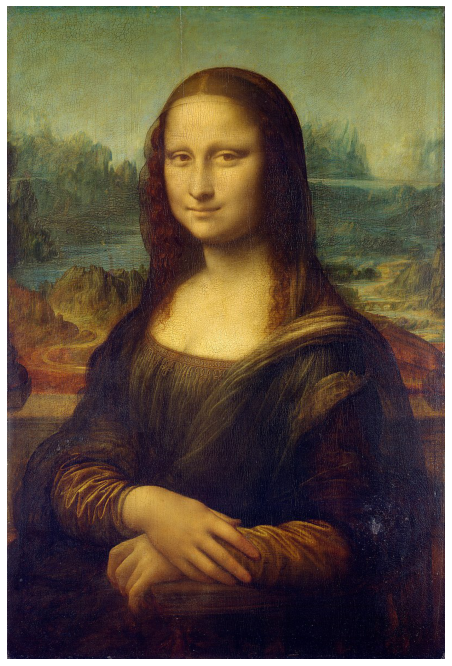

In [3]:
image = mpimg.imread("MonaLisa.jpg")
plt.figure(figsize=(12, 12))
plt.axis("off")
plt.imshow(image)
plt.show()

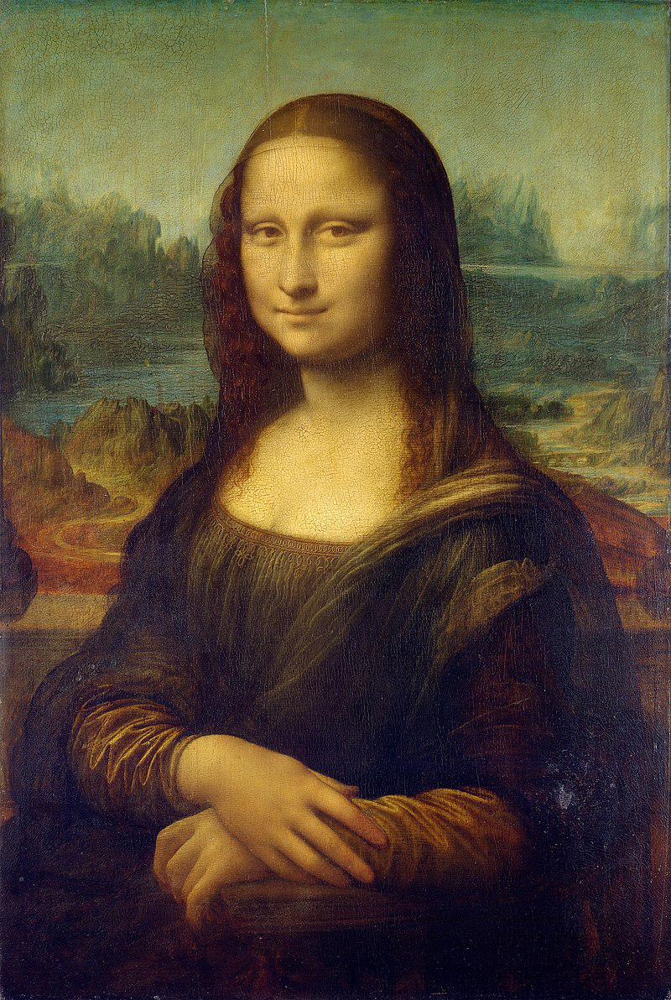

In [7]:
with Image.open("MonaLisa.jpg") as im:
    im = im.convert("RGB")
im

In [76]:
with Image.open("MonaLisa.jpg") as im:
    im = im.convert("RGB")
image128 = im.resize((10, 10))
r, g, b = image128.split()

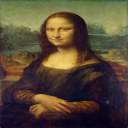

In [75]:
image128 = im.resize((128, 128))
image128

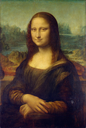

In [24]:
im.thumbnail((128, 128),Image.ANTIALIAS)
im

In [37]:
image128.format, image128.size, image128.mode

(None, (128, 128), 'RGB')

In [38]:
r, g, b = image128.split()

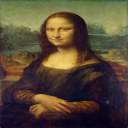

In [39]:
im = Image.merge("RGB", (r, g, b))
im

# Tests

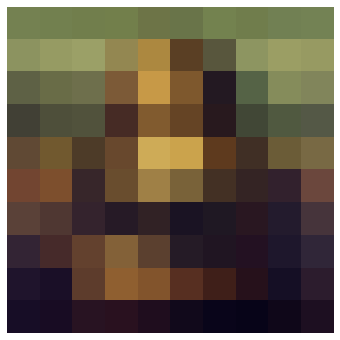

In [9]:
with Image.open("MonaLisa.jpg") as im:
    im = im.convert("RGB")
image128 = im.resize((10, 10))
r, g, b = image128.split()
draw_image(r, g, b)

Iteration 1000 , Score 4866.797011645823


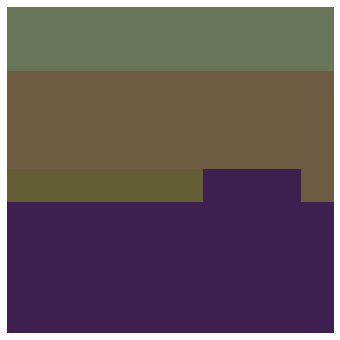

Iteration 2000 , Score 4308.137408658489


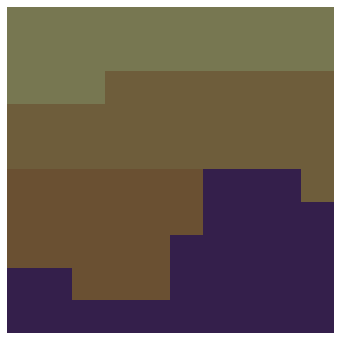

Iteration 3000 , Score 3422.100536336515


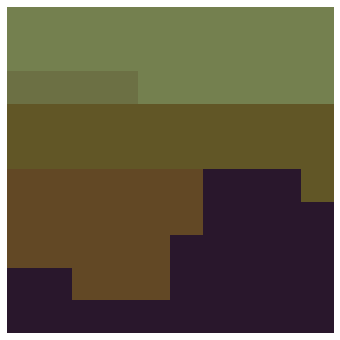

Iteration 4000 , Score 3241.3865511992212


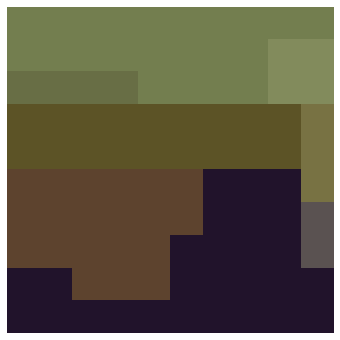

Iteration 5000 , Score 3143.136293954099


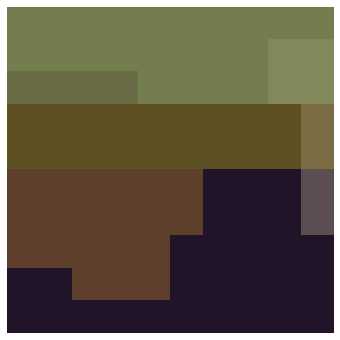

Iteration 6000 , Score 2963.0229732231833


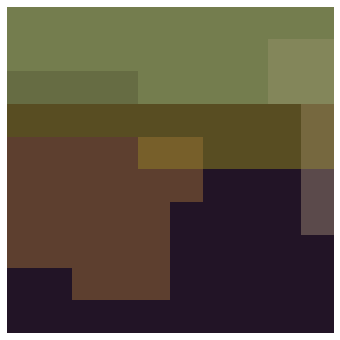

Iteration 7000 , Score 2946.5977083059656


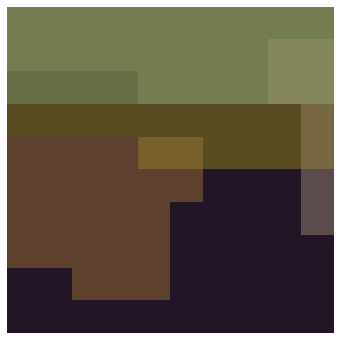

Iteration 8000 , Score 2930.0051528612616


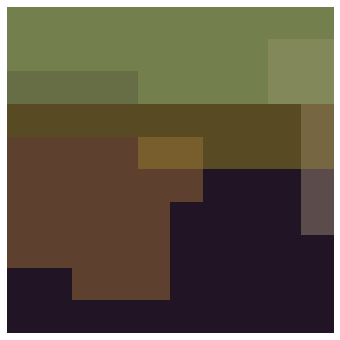

Iteration 9000 , Score 2911.622877359093


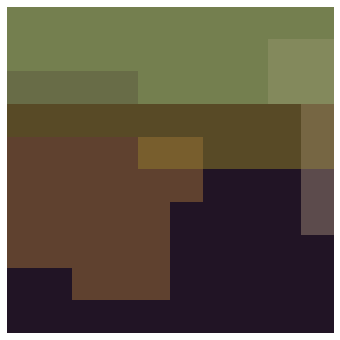

Iteration 10000 , Score 2898.242196356968


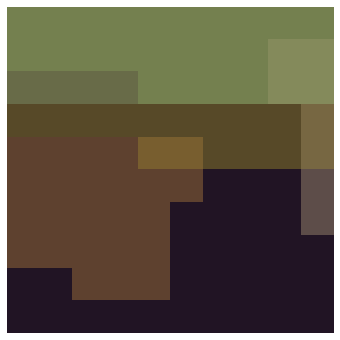

Iteration 11000 , Score 2894.4119509282887


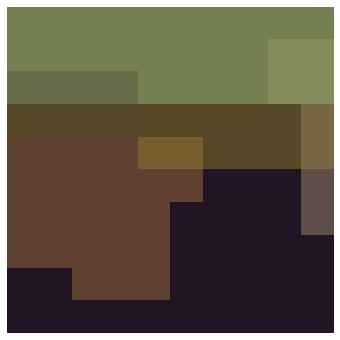

Iteration 12000 , Score 2867.8734915322725


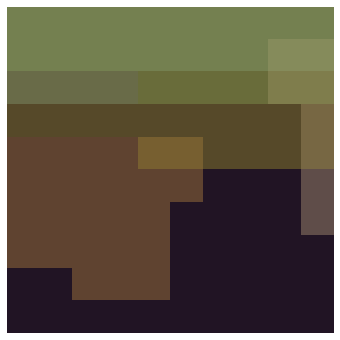

Iteration 13000 , Score 2845.675605250218


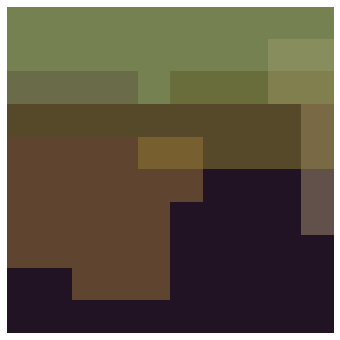

Iteration 14000 , Score 2836.4706607056305


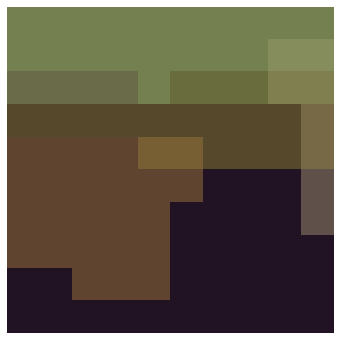

Iteration 15000 , Score 2831.8005186120226


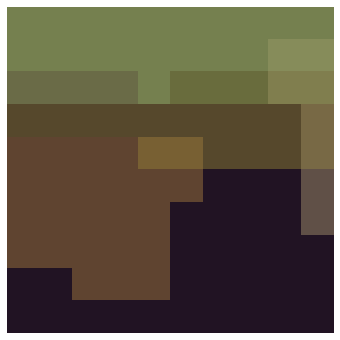

Iteration 16000 , Score 2828.290711612035


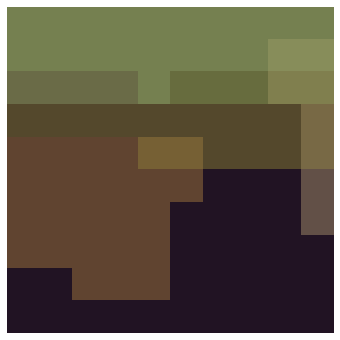

Iteration 17000 , Score 2824.442449926354


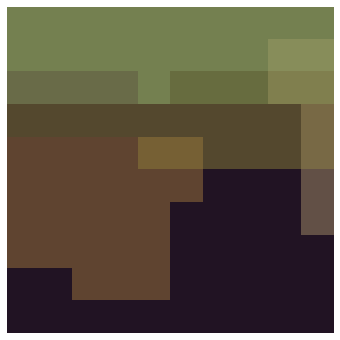

Iteration 18000 , Score 2821.4785170090786


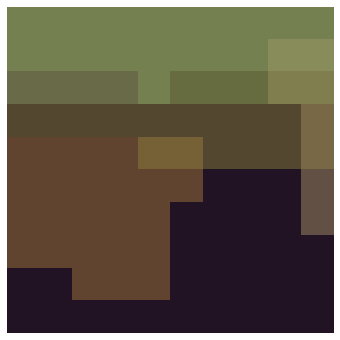

Iteration 19000 , Score 2820.426468634305


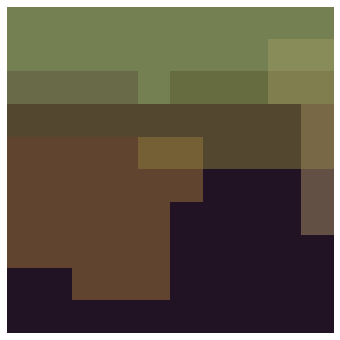

Iteration 20000 , Score 2819.0035169488215


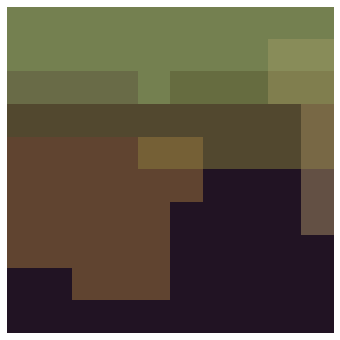

Iteration 21000 , Score 2818.435242905308


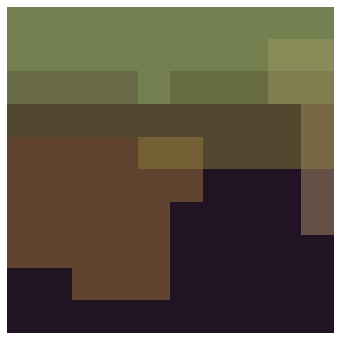

Iteration 22000 , Score 2817.5626433790217


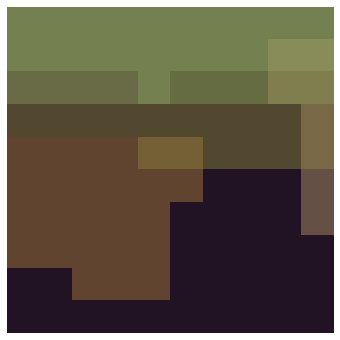

Iteration 23000 , Score 2816.4199271011303


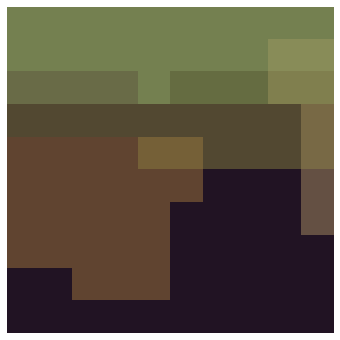

Iteration 24000 , Score 2815.6926335658736


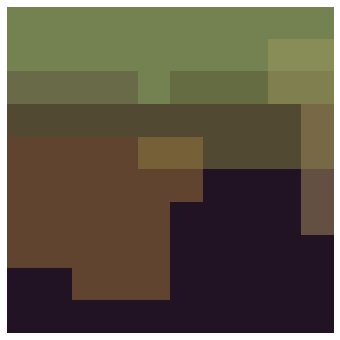

Iteration 25000 , Score 2814.726880527962


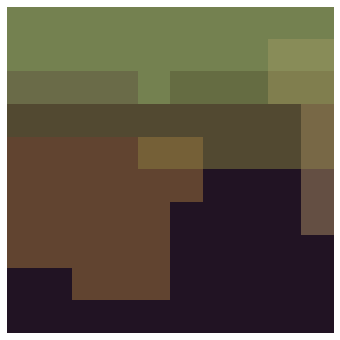

Iteration 26000 , Score 2813.389132531585


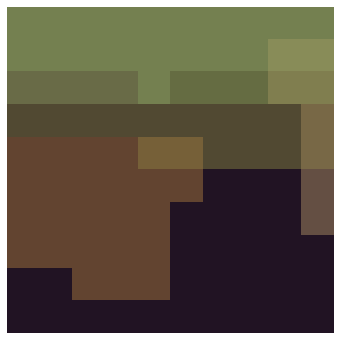

Iteration 27000 , Score 2812.911564127259


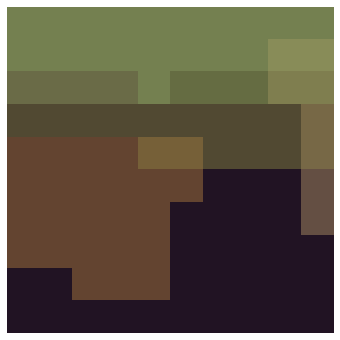

Iteration 28000 , Score 2812.723225274464


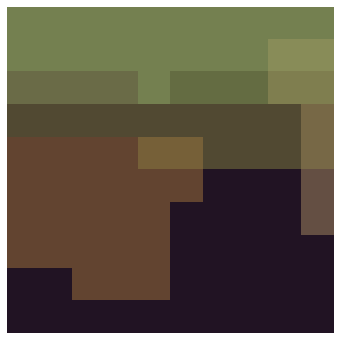

Iteration 29000 , Score 2812.517123688519


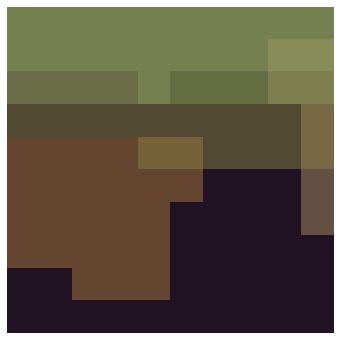

Iteration 30000 , Score 2812.1276684537925


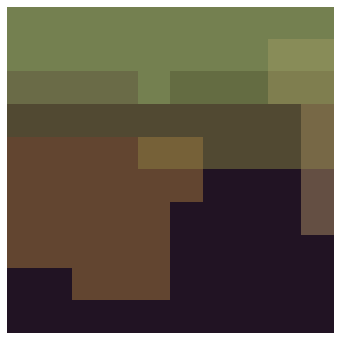

Iteration 31000 , Score 2811.9665220802326


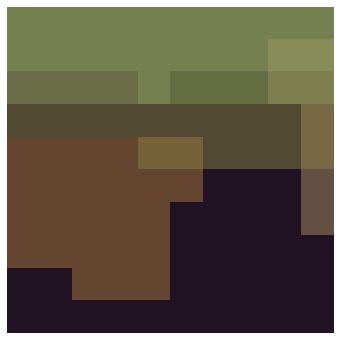

Iteration 32000 , Score 2811.8687596621894


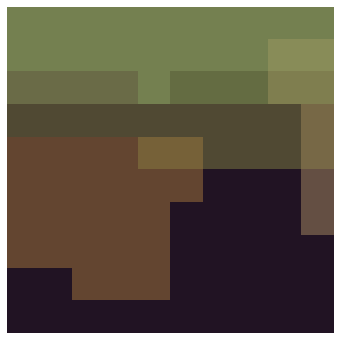

Iteration 33000 , Score 2811.737424770324


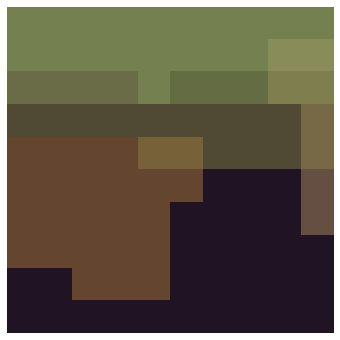

Iteration 34000 , Score 2811.7112158443456


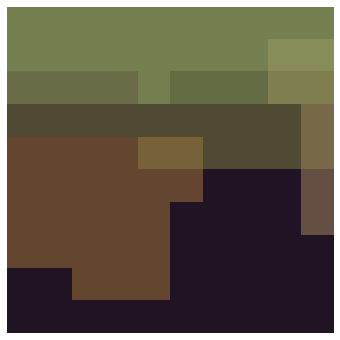

Iteration 35000 , Score 2811.686936398054


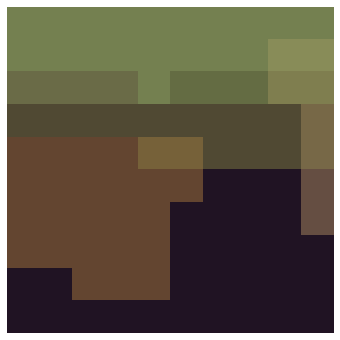

Iteration 36000 , Score 2811.677281206324


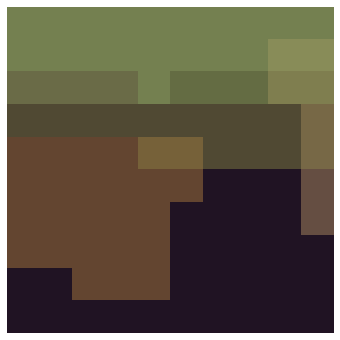

Iteration 37000 , Score 2811.66336149714


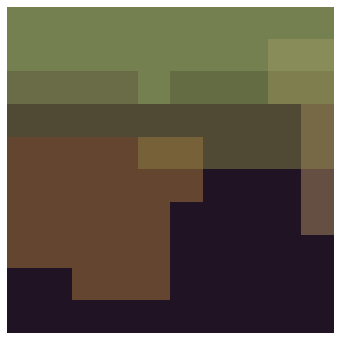

Iteration 38000 , Score 2811.661299097088


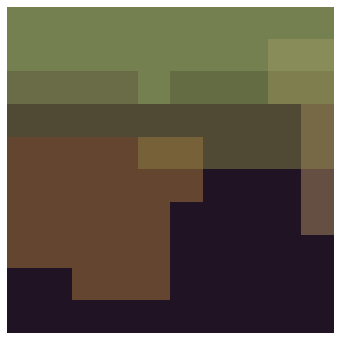

Iteration 39000 , Score 2811.655884583834


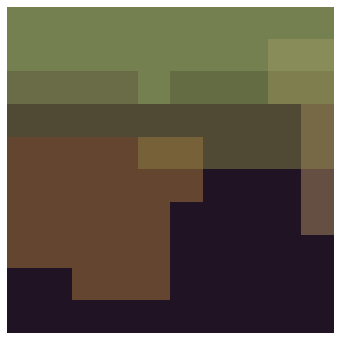

Iteration 40000 , Score 2811.6531349878364


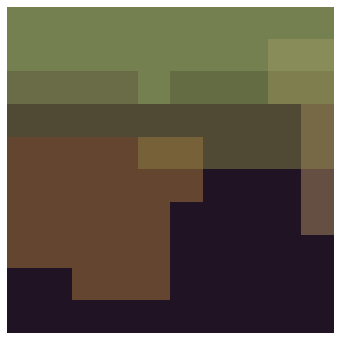

Iteration 41000 , Score 2811.649989081563


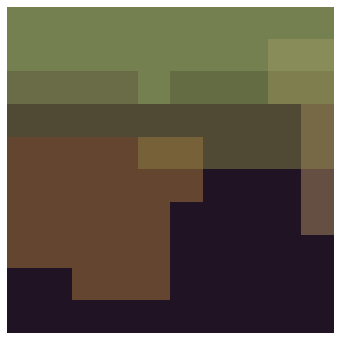

Iteration 42000 , Score 2811.649234145643


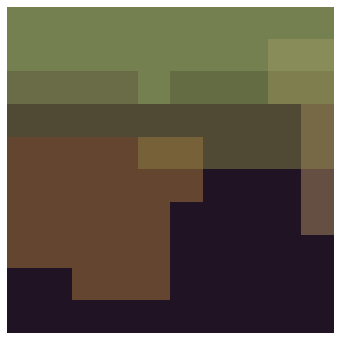

Iteration 43000 , Score 2811.646995967084


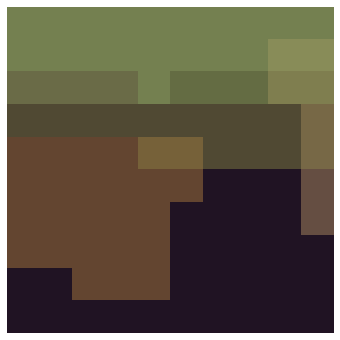

Iteration 44000 , Score 2811.646169415608


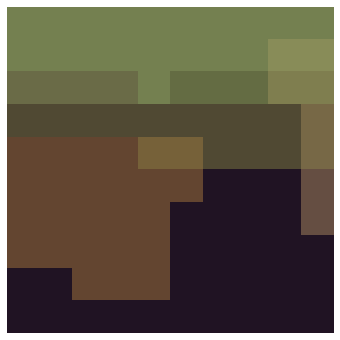

Iteration 45000 , Score 2811.6435653569847


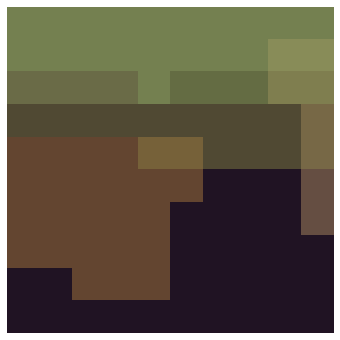

Iteration 46000 , Score 2811.6417876629243


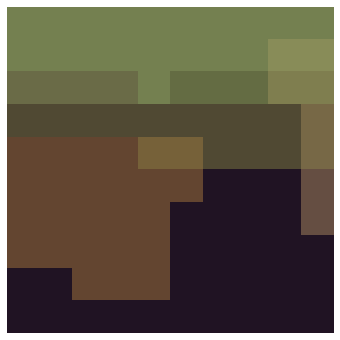

Iteration 47000 , Score 2811.641131295546


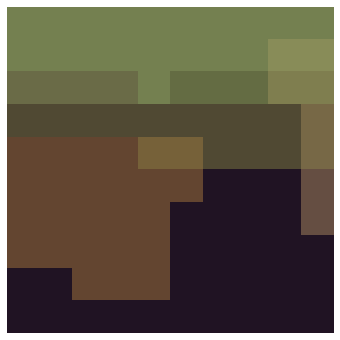

Iteration 48000 , Score 2811.6405393656755


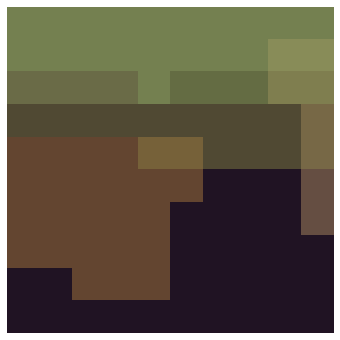

Iteration 49000 , Score 2811.640273712449


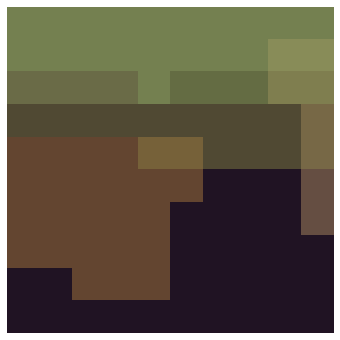

Iteration 50000 , Score 2811.64000630892


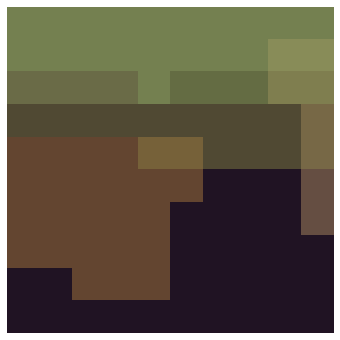

Iteration 51000 , Score 2811.6397667243614


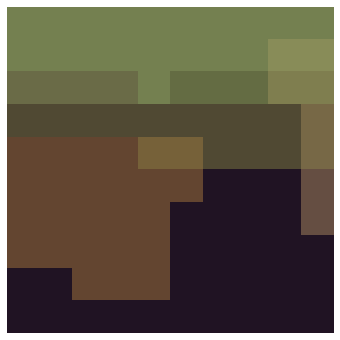

Iteration 52000 , Score 2811.639352163393


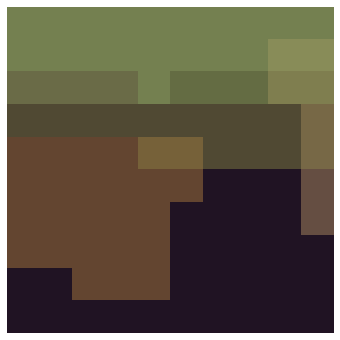

Iteration 53000 , Score 2811.6389880850043


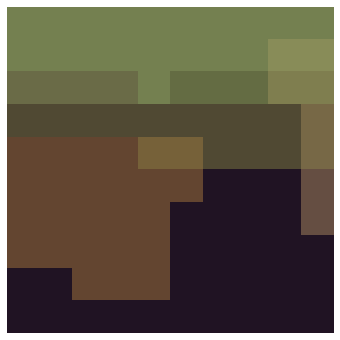

Iteration 54000 , Score 2811.638891764522


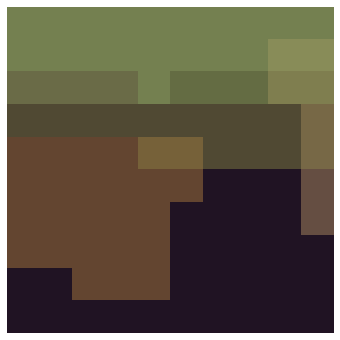

Iteration 55000 , Score 2811.6388474258333


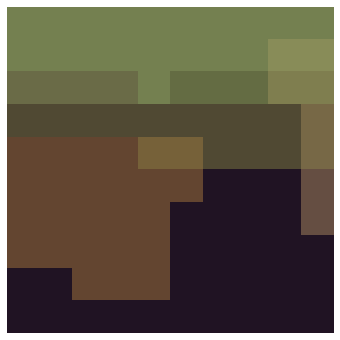

Iteration 56000 , Score 2811.6387991687825


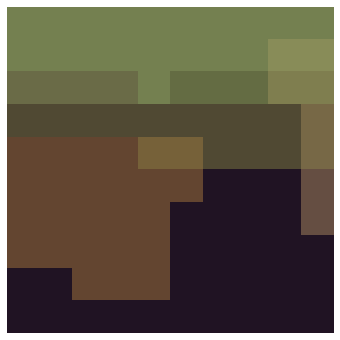

Iteration 57000 , Score 2811.638719194009


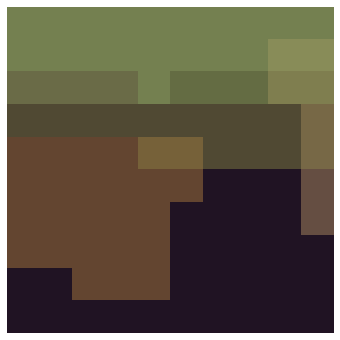

Iteration 58000 , Score 2811.638687671707


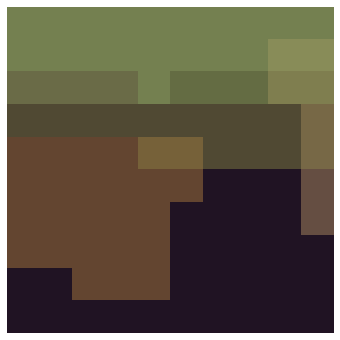

Iteration 59000 , Score 2811.6385611667038


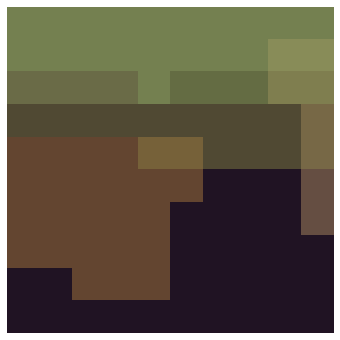

Iteration 60000 , Score 2811.638555472318


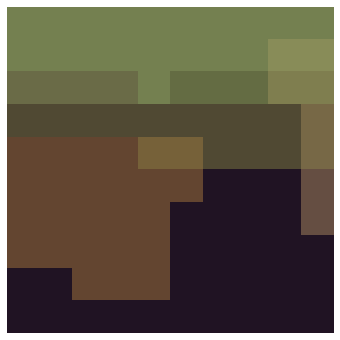

Iteration 61000 , Score 2811.6384328340596


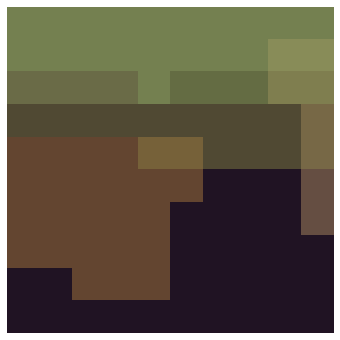

Iteration 62000 , Score 2811.6382796507023


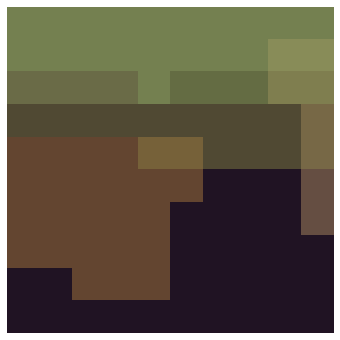

Iteration 63000 , Score 2811.6379290225163


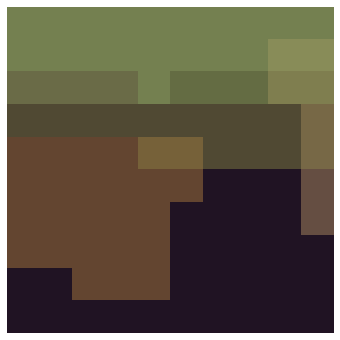

Iteration 64000 , Score 2811.6378933353526


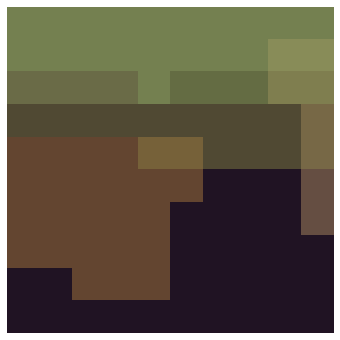

Iteration 65000 , Score 2811.6375929982887


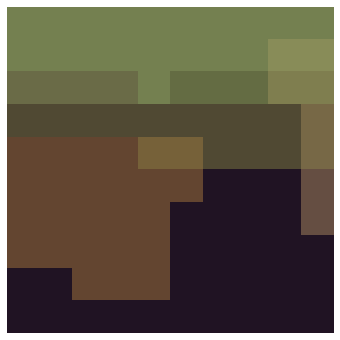

Iteration 66000 , Score 2785.26910109859


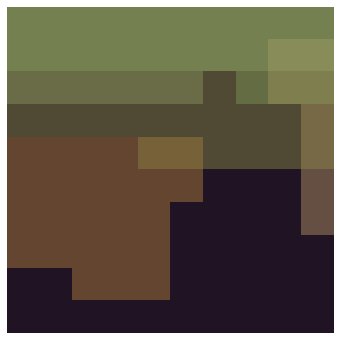

Iteration 67000 , Score 2785.261784477574


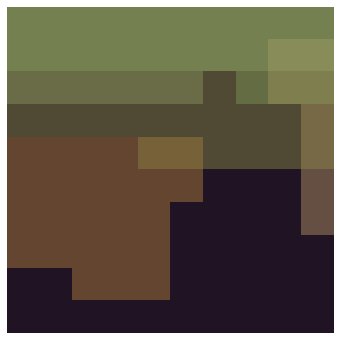

Iteration 68000 , Score 2785.2479591656156


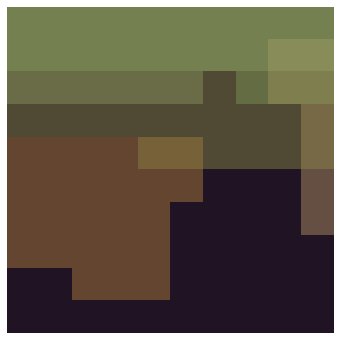

Iteration 69000 , Score 2785.2458564884296


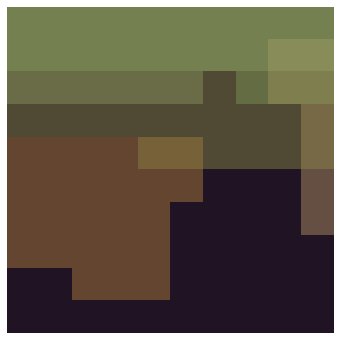

Iteration 70000 , Score 2785.2436286396546


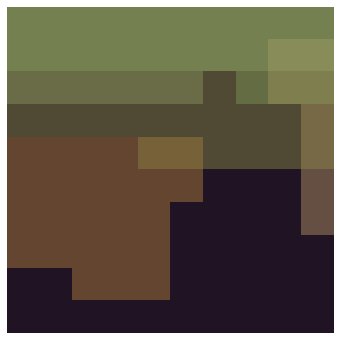

Iteration 71000 , Score 2785.2417785312223


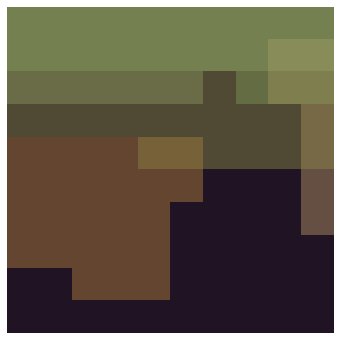

Iteration 72000 , Score 2785.24131275562


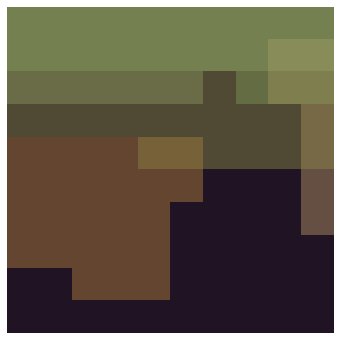

Iteration 73000 , Score 2785.236860444967


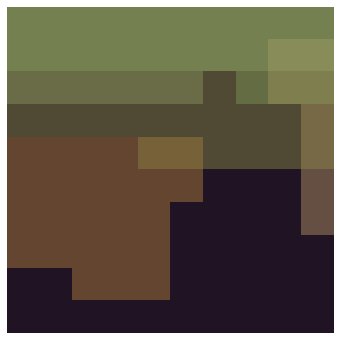

Iteration 74000 , Score 2785.210822599685


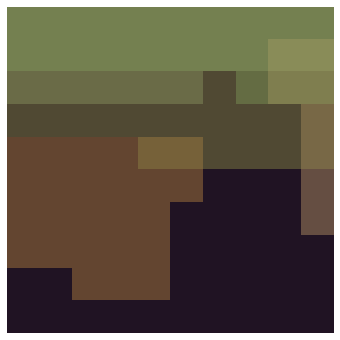

Iteration 75000 , Score 2785.163078775056


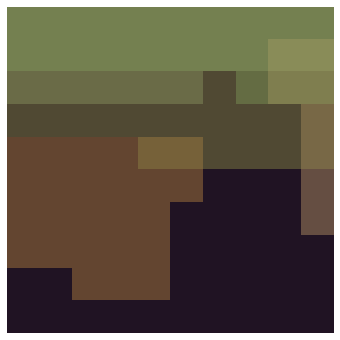

Iteration 76000 , Score 2785.162244082367


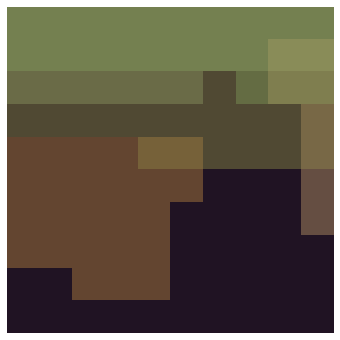

Iteration 77000 , Score 2785.1608486223663


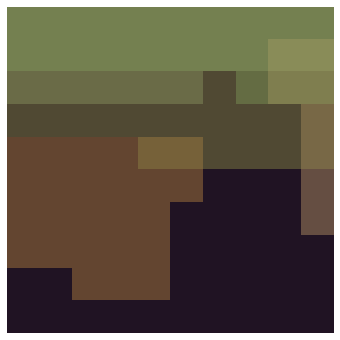

Iteration 78000 , Score 2785.157534180747


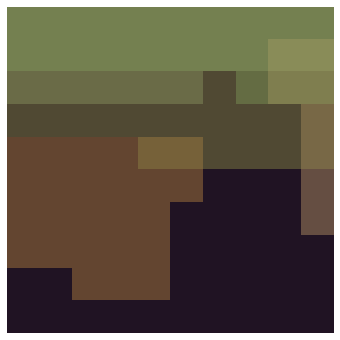

Iteration 79000 , Score 2785.153231901887


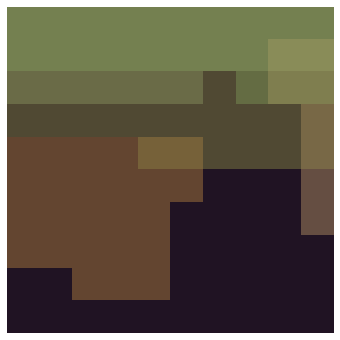

Iteration 80000 , Score 2785.145254802305


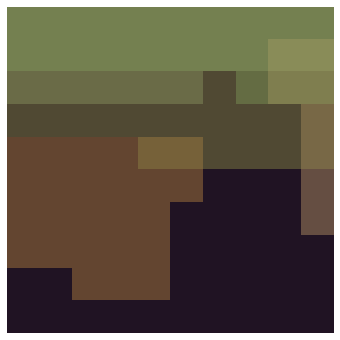

Iteration 81000 , Score 2785.129648961605


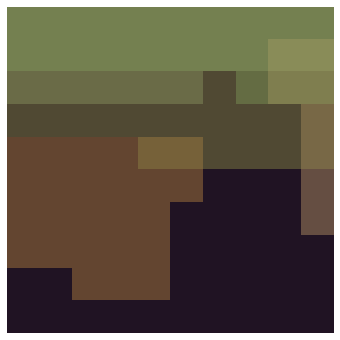

Iteration 82000 , Score 2785.1101668308056


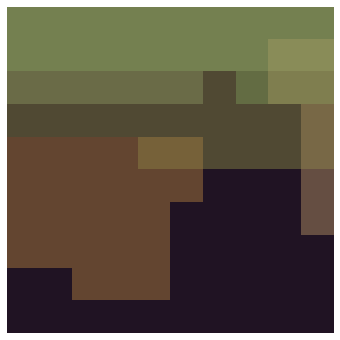

Iteration 83000 , Score 2785.088296970509


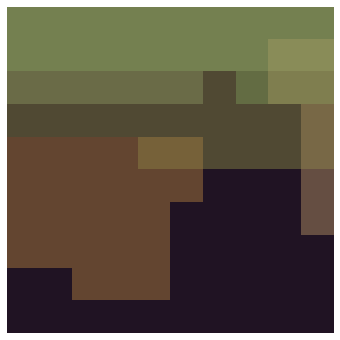

Iteration 84000 , Score 2785.0787213749795


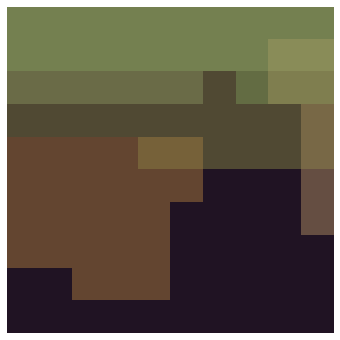

Iteration 85000 , Score 2785.0499670967133


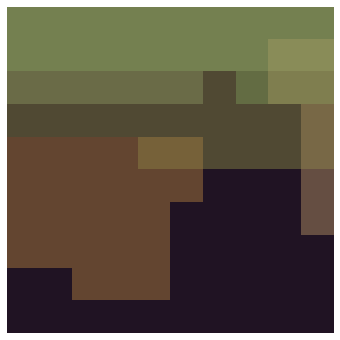

Iteration 86000 , Score 2785.0333504542677


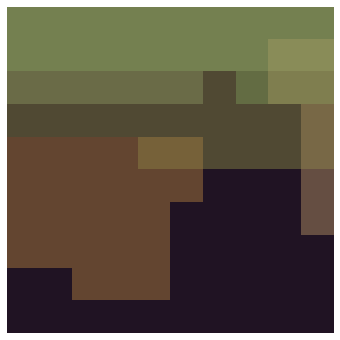

Iteration 87000 , Score 2785.013498544656


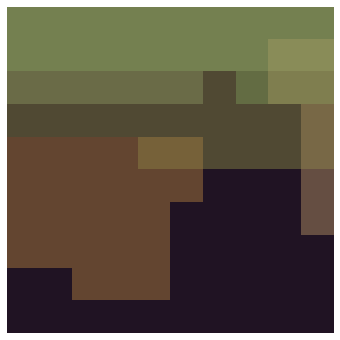

Iteration 88000 , Score 2784.900609866915


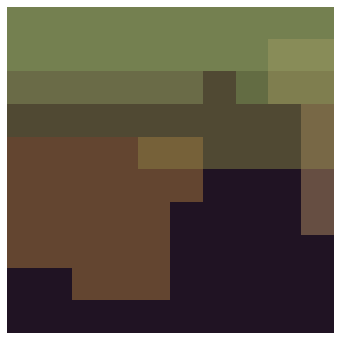

Iteration 89000 , Score 2784.872727199793


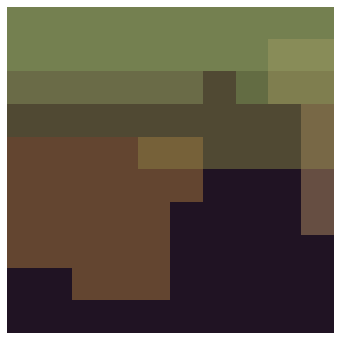

Iteration 90000 , Score 2784.8691414146215


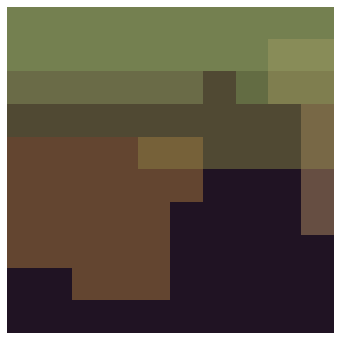

Iteration 91000 , Score 2784.866898772463


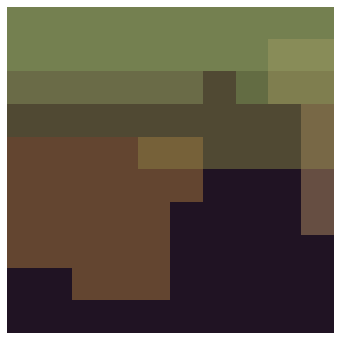

Iteration 92000 , Score 2784.8621489018465


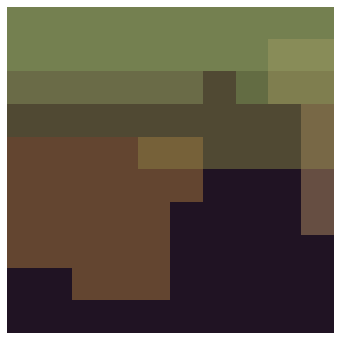

Iteration 93000 , Score 2774.3865209579044


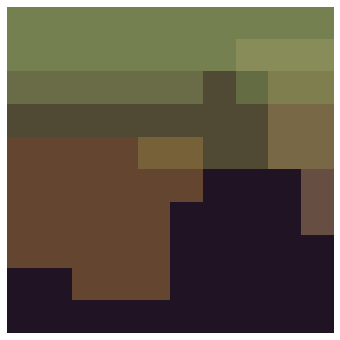

Iteration 94000 , Score 2774.264128792837


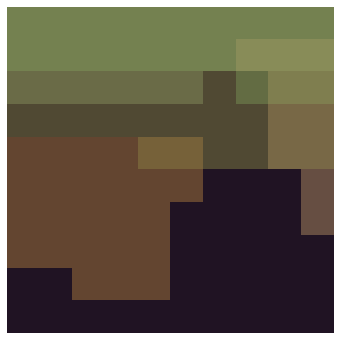

Iteration 95000 , Score 2774.197464495656


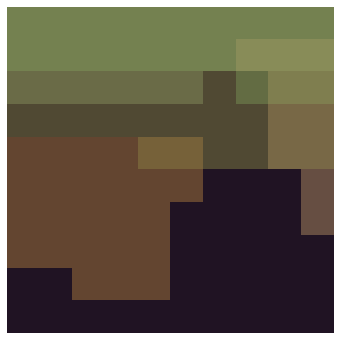

Iteration 96000 , Score 2773.998078637062


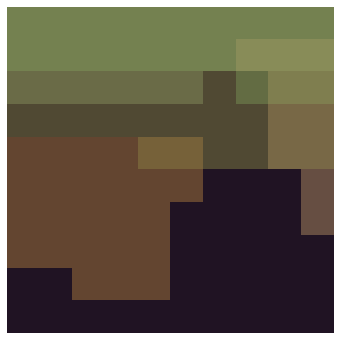

Iteration 97000 , Score 2773.6048855143804


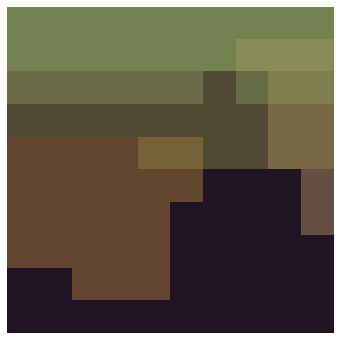

Iteration 98000 , Score 2773.443651632739


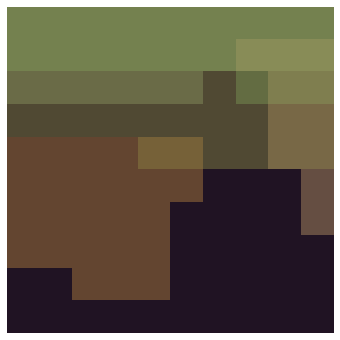

Iteration 99000 , Score 2773.049588420717


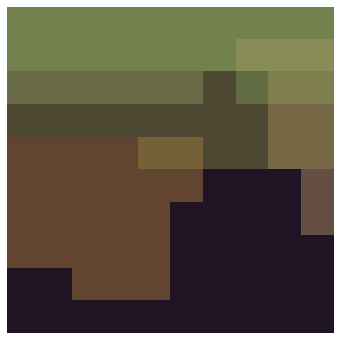

(2772.892571419905,
 (array([  10.47179051, -439.65430266,   64.70051707, -160.07654951,
            7.13624461,   37.260216  , -544.01927959,   98.21497942,
          149.94925021,    5.17021865,    4.85459483,  -64.54699224,
          -12.37980307,   12.40712012,    9.47642553,  -37.33990035,
          -19.68000019,   56.2829864 ,    6.70036651,   28.2643743 ,
            9.39792963,   -8.87390425, -205.93284453,  -41.77534149]),
  array([-1.76367348e+01, -5.71495507e+01,  2.30939963e+01,  4.85808573e+00,
         -6.83762751e+01,  1.44521654e+00,  1.75078407e+00,  9.16694702e+01,
         -1.92699477e+02,  3.13102865e+00,  8.31380058e+00,  1.52053687e+00,
          3.44632595e-01, -1.43401096e+00,  2.29635012e+00, -2.11464926e+01,
          3.31666369e+00,  5.57034997e+00,  2.22442940e-01,  4.21253332e+00,
          8.15299623e+00, -1.05419758e+02,  1.19322407e+03,  9.92795389e+02]),
  array([ 56.58041008, 183.10312501,   7.88137435, 231.06081568,
         156.88216633, 172.29570229

In [107]:
es(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(10, 10), chromosome_length=8, population_size=1, 
       number_of_offspring=20, number_of_iterations=100000, expanding_interval=1000, mutation_prob=0.01,
       sigma_x=10.0, sigma_rgb=10.0, tau=1/np.sqrt(2*3), tau_0=1/np.sqrt(2*np.sqrt(3)), log_frequency=1)

Iteration 1000 , Score 13014.847850903177


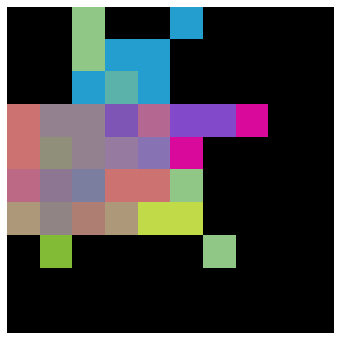

Iteration 2000 , Score 10210.087206378874


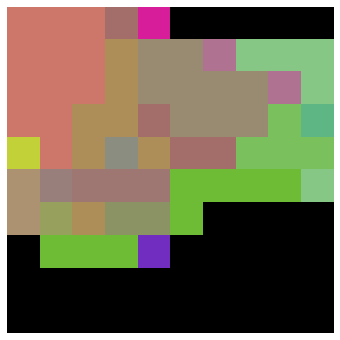

Iteration 3000 , Score 9833.481973767168


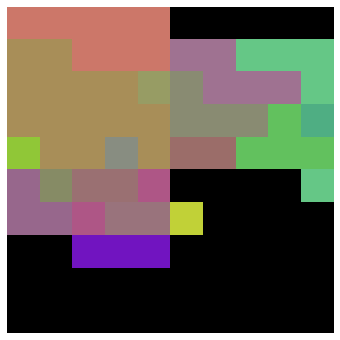

Iteration 4000 , Score 8977.770690809615


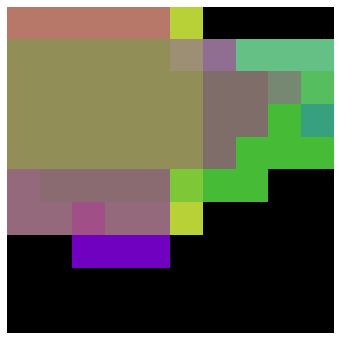

Iteration 5000 , Score 8124.876677269183


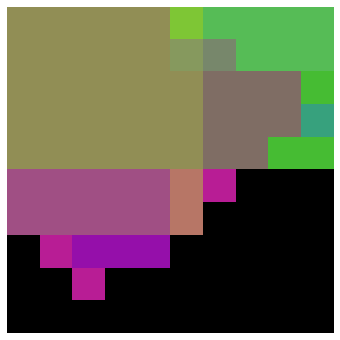

Iteration 6000 , Score 7597.773103260134


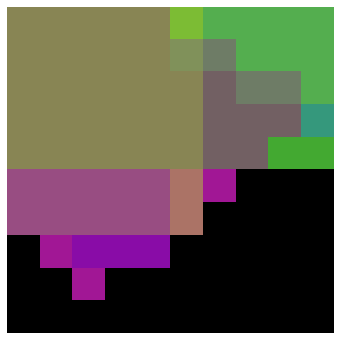

Iteration 7000 , Score 7074.795987121671


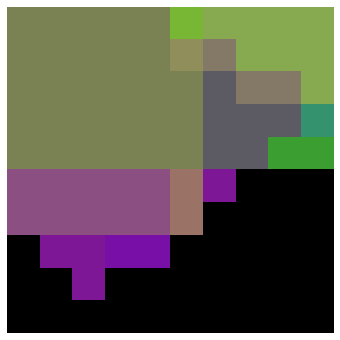

Iteration 8000 , Score 6732.7523691270835


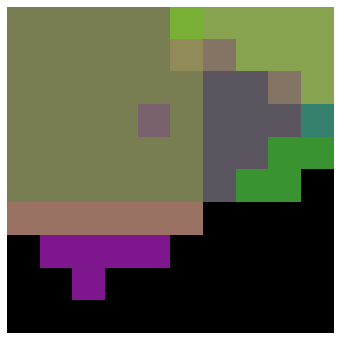

Iteration 9000 , Score 6477.943948220254


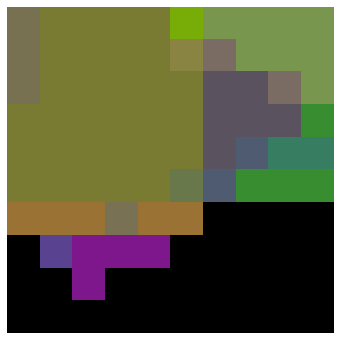

Iteration 10000 , Score 6134.637429136448


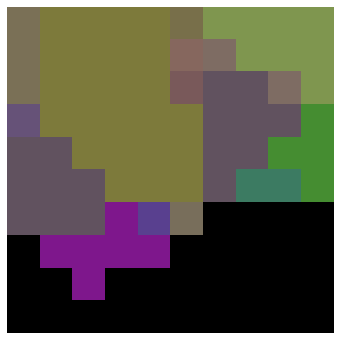

Iteration 11000 , Score 5977.244511414089


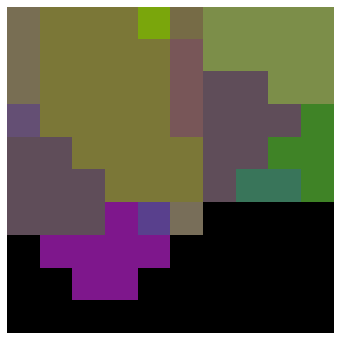

Iteration 12000 , Score 5864.27080367873


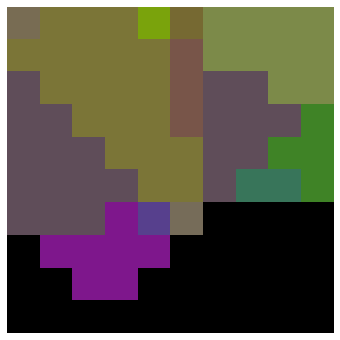

Iteration 13000 , Score 5773.874353791454


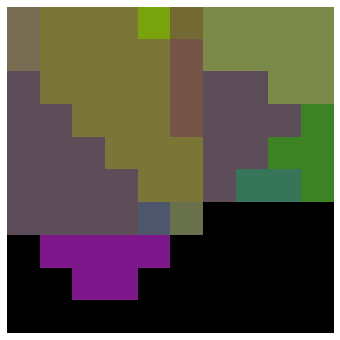

Iteration 14000 , Score 5709.047620890149


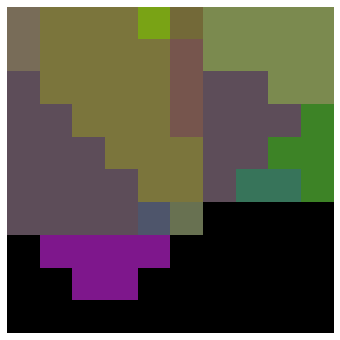

Iteration 15000 , Score 5683.361337034628


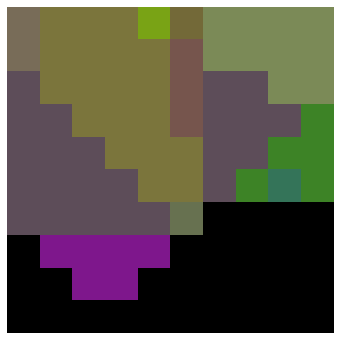

Iteration 16000 , Score 5665.361849128923


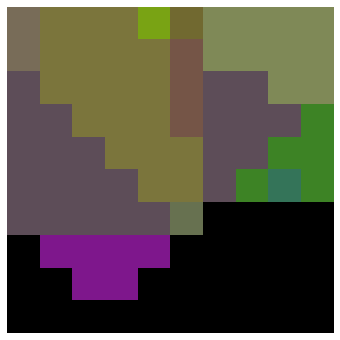

Iteration 17000 , Score 5588.835425367692


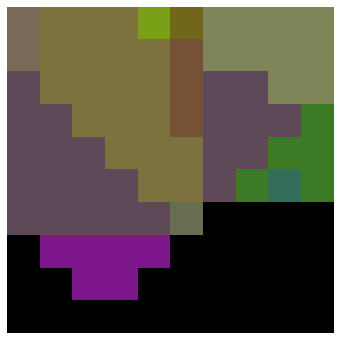

Iteration 18000 , Score 5570.197071184537


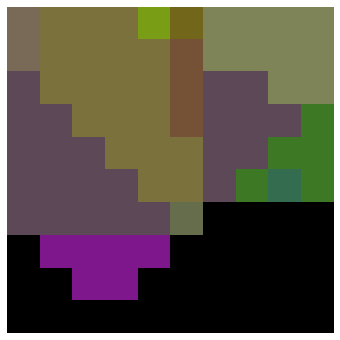

Iteration 19000 , Score 5492.888328325969


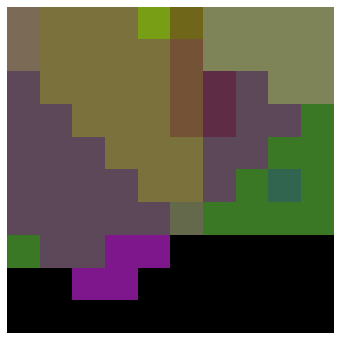

Iteration 20000 , Score 5322.15729699813


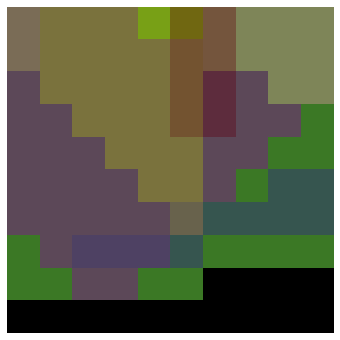

Iteration 21000 , Score 5082.28371022252


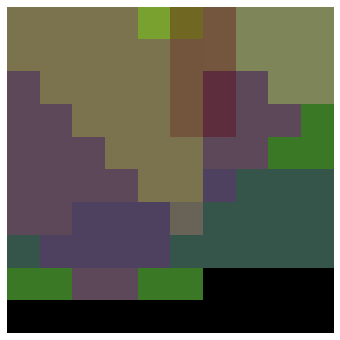

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 22000 , Score 5028.769992074274


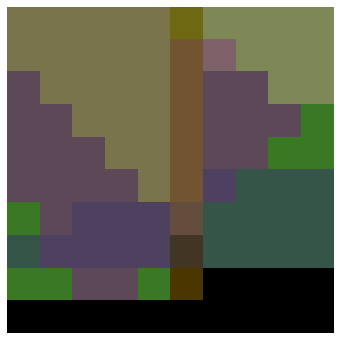

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 23000 , Score 4851.158605055401


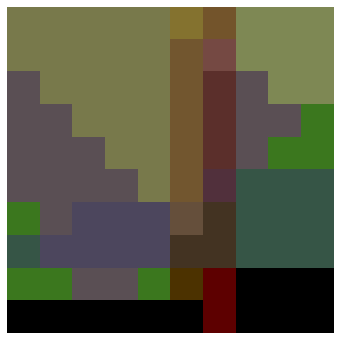

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 24000 , Score 4789.8741476849555


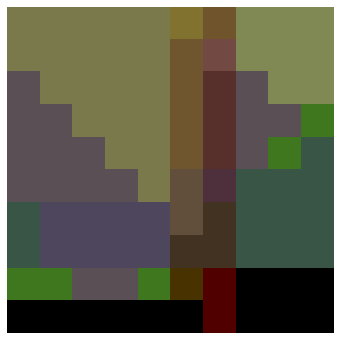

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 25000 , Score 4629.965735968291


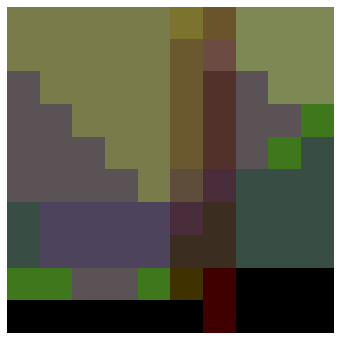

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 26000 , Score 4618.95608381503


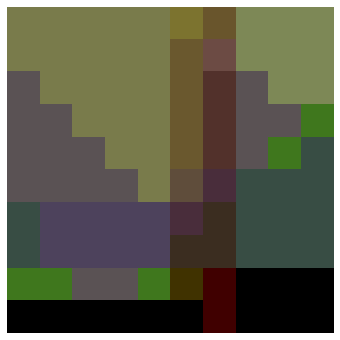

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 27000 , Score 4463.767571618622


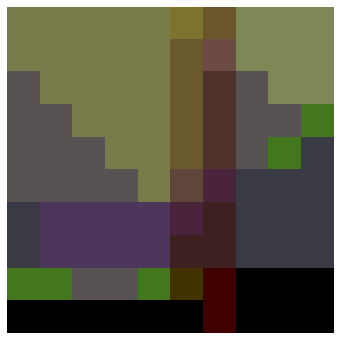

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 28000 , Score 4430.432569907859


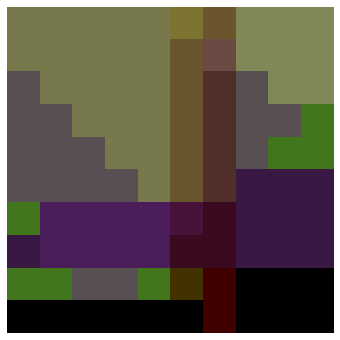

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 29000 , Score 4373.188363264483


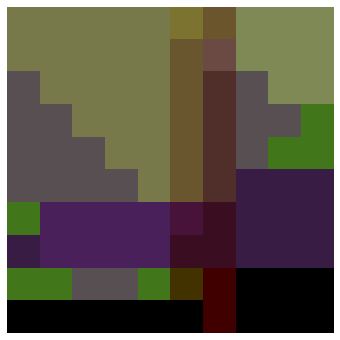

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 30000 , Score 4270.687585538429


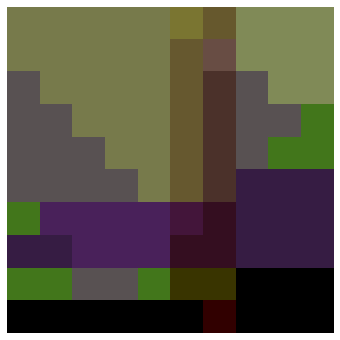

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 31000 , Score 4177.197420875862


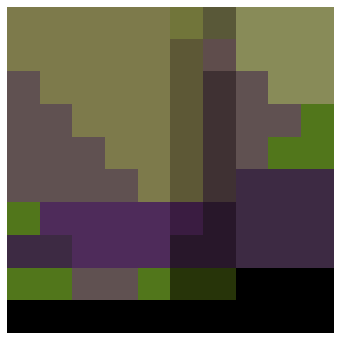

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 32000 , Score 4161.386431815776


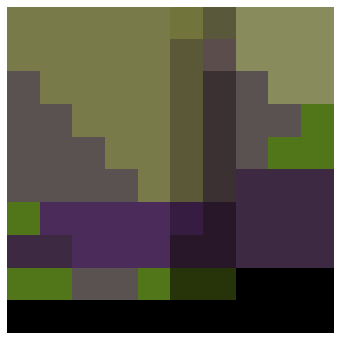

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 33000 , Score 4152.706261661144


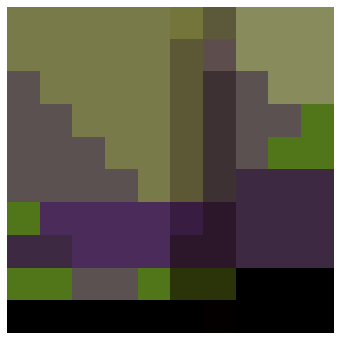

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 34000 , Score 4135.119505543208


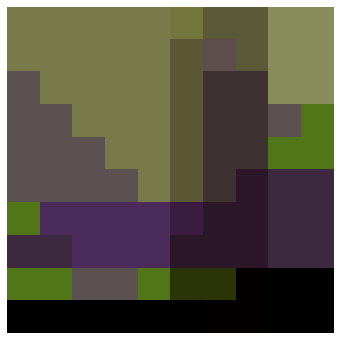

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 35000 , Score 4082.0269994011737


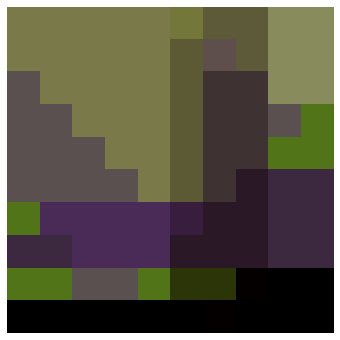

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 36000 , Score 4059.223847635448


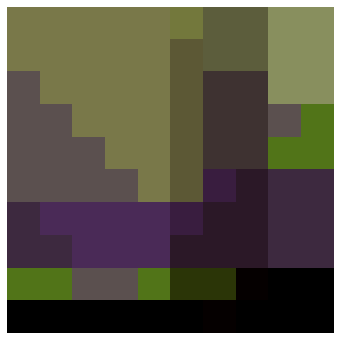

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 37000 , Score 4008.360423712665


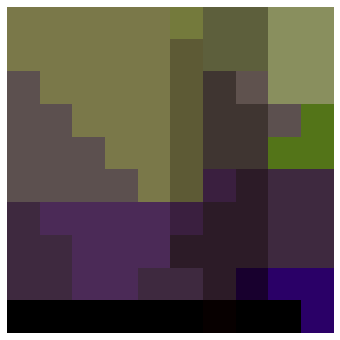

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 38000 , Score 3999.179976560535


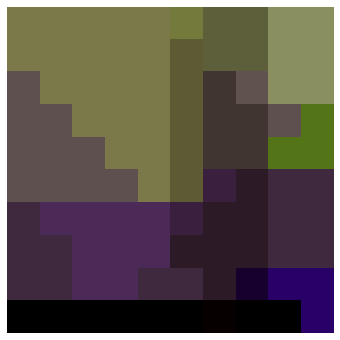

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 39000 , Score 3968.2911544848503


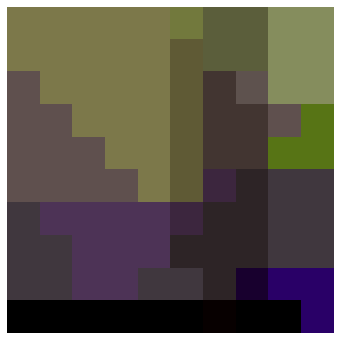

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 40000 , Score 3908.3351047432175


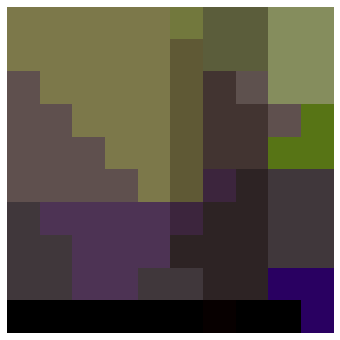

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 41000 , Score 3871.940036803549


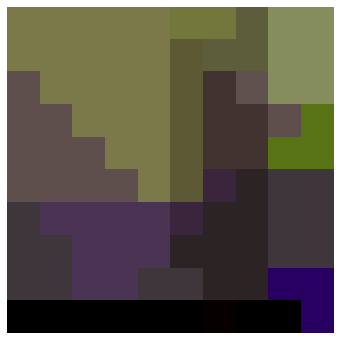

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 42000 , Score 3847.8588014387306


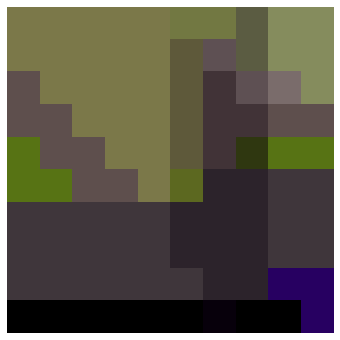

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 43000 , Score 3763.812993784764


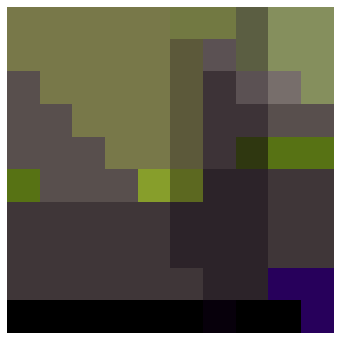

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 44000 , Score 3705.143686292429


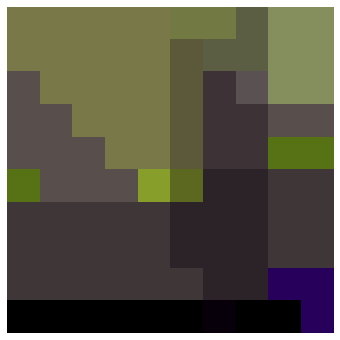

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 45000 , Score 3663.06285852154


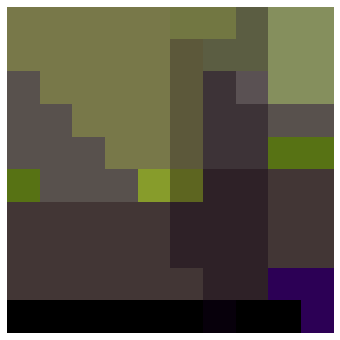

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 46000 , Score 3646.8349784275483


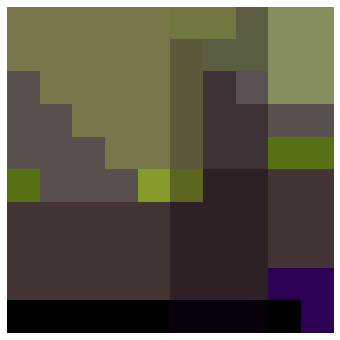

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 47000 , Score 3645.650372677577


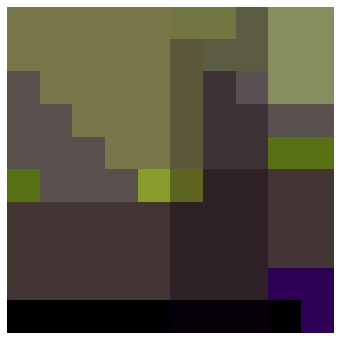

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 48000 , Score 3630.418875955986


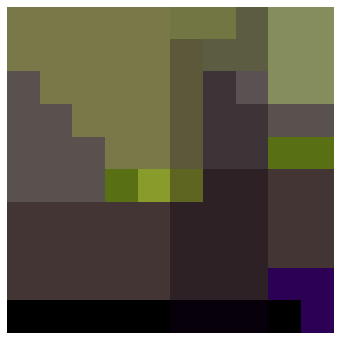

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 49000 , Score 3624.175191741199


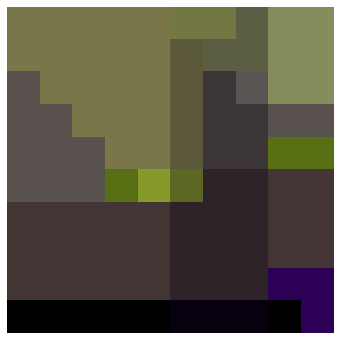

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 50000 , Score 3553.1651053451565


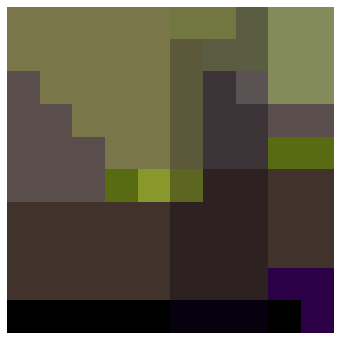

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 51000 , Score 3533.444052705842


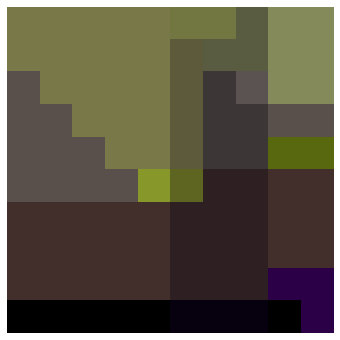

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 52000 , Score 3532.9974991955455


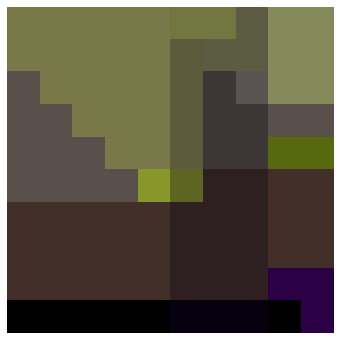

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 53000 , Score 3531.5386904904817


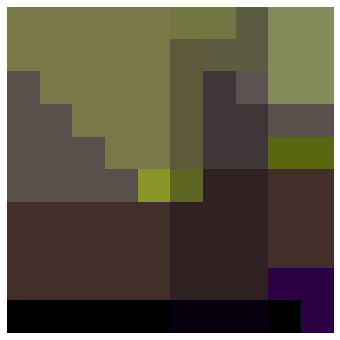

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 54000 , Score 3531.196624584062


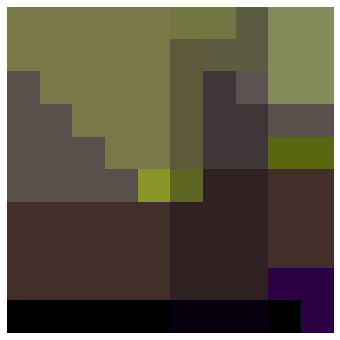

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 55000 , Score 3529.941983833756


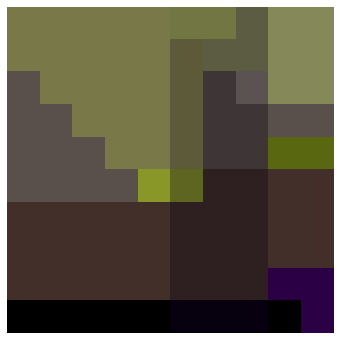

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 56000 , Score 3528.178820446238


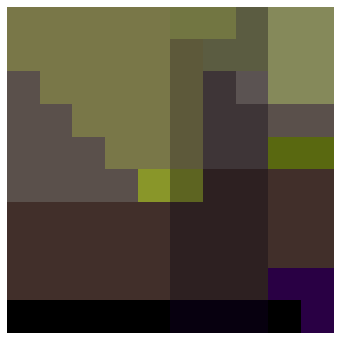

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 57000 , Score 3527.8383934371327


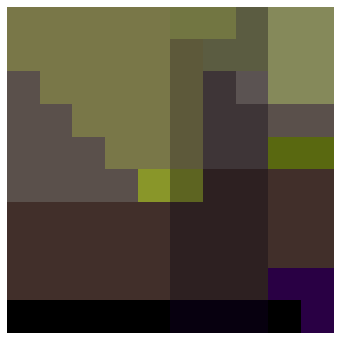

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 58000 , Score 3522.2200926381356


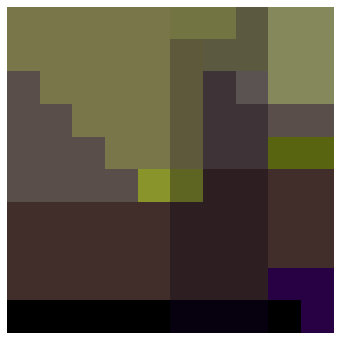

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 59000 , Score 3521.412052300043


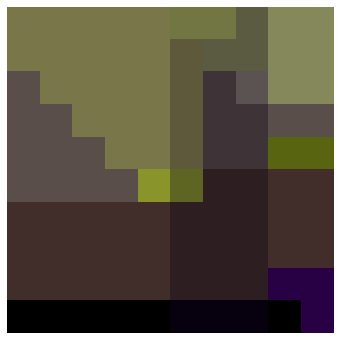

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 60000 , Score 3520.480163136585


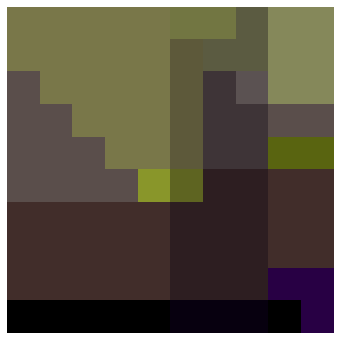

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 61000 , Score 3515.02799018763


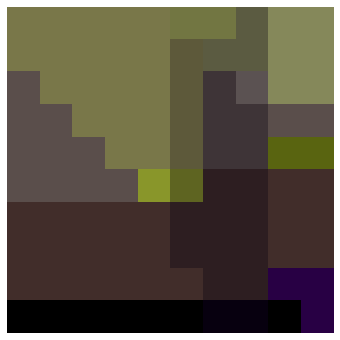

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 62000 , Score 3515.02799018763


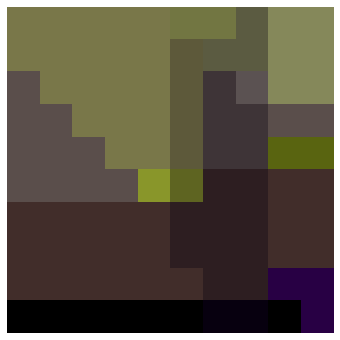

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 63000 , Score 3514.143406402995


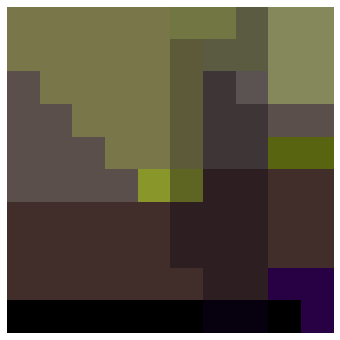

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 64000 , Score 3511.3035800572165


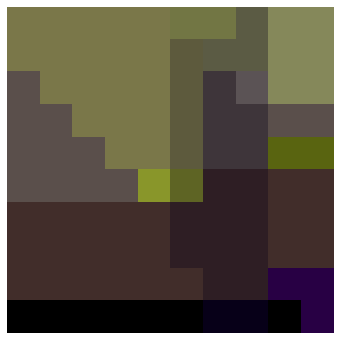

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 65000 , Score 3510.5272295311247


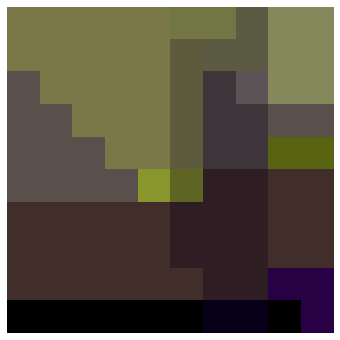

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 66000 , Score 3508.514895051601


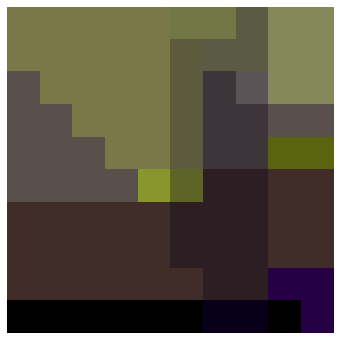

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 67000 , Score 3503.559711441608


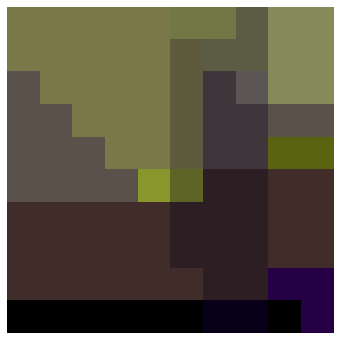

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 68000 , Score 3502.8537702690182


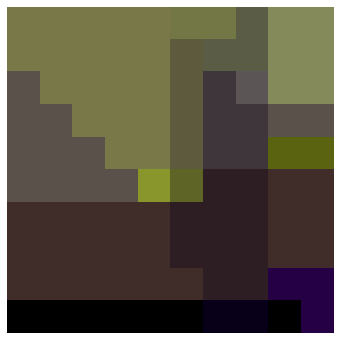

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 69000 , Score 3500.3021283129146


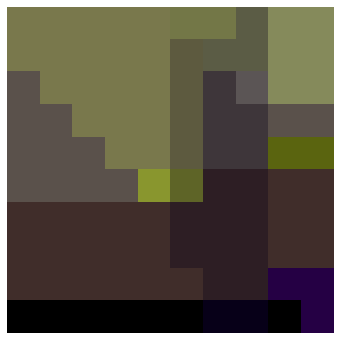

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 70000 , Score 3498.2773407636487


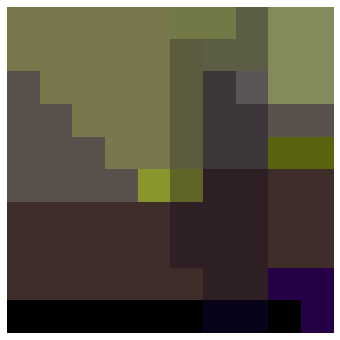

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 71000 , Score 3496.531082485525


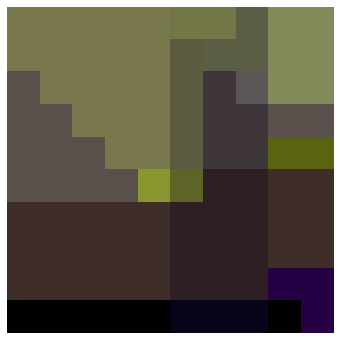

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 72000 , Score 3496.324817606462


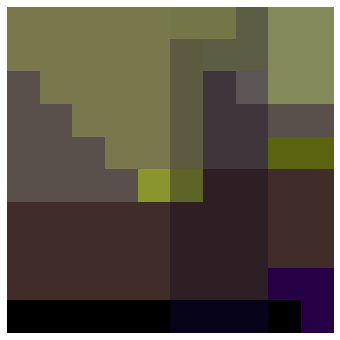

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 73000 , Score 3496.1630392938296


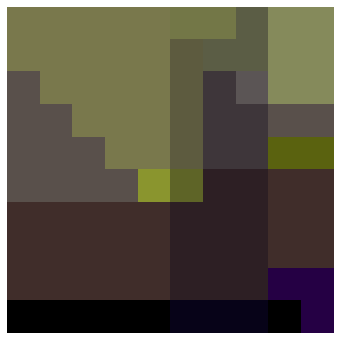

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 74000 , Score 3495.861928067199


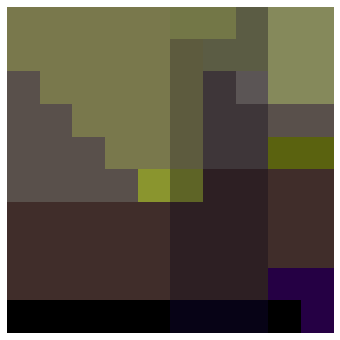

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 75000 , Score 3491.4974423413814


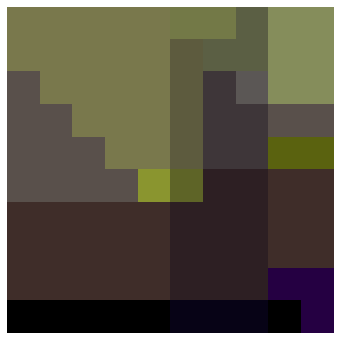

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 76000 , Score 3490.5649686205115


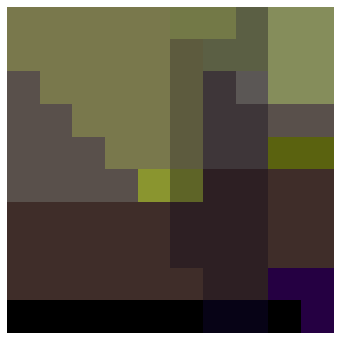

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 77000 , Score 3490.214652826374


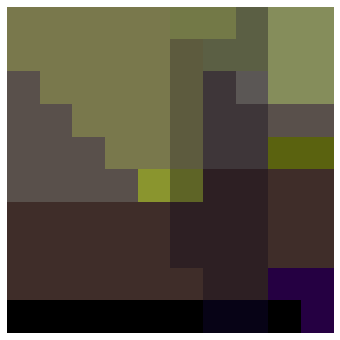

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 78000 , Score 3489.2220544603488


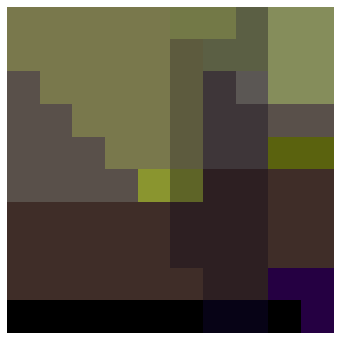

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 79000 , Score 3489.1574571331157


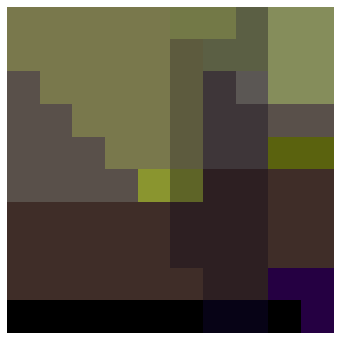

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 80000 , Score 3485.170273043429


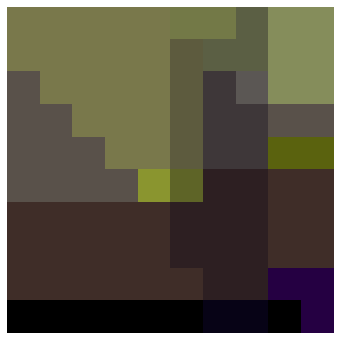

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 81000 , Score 3485.046162192422


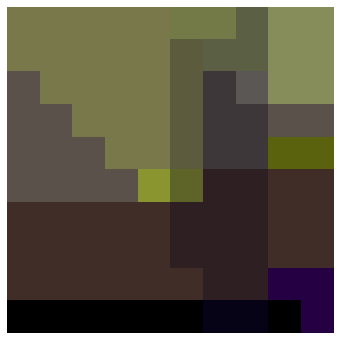

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 82000 , Score 3484.890648163822


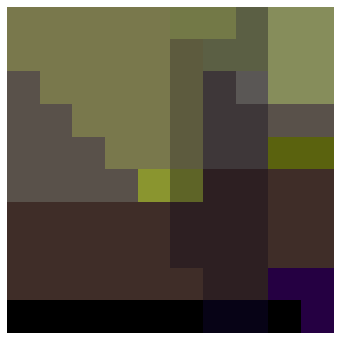

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 83000 , Score 3484.88888209296


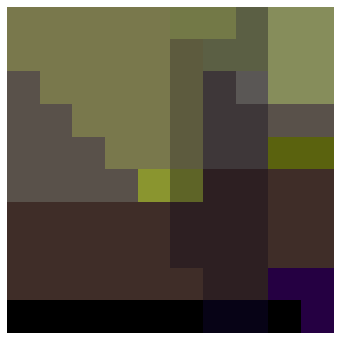

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 84000 , Score 3484.7423729238035


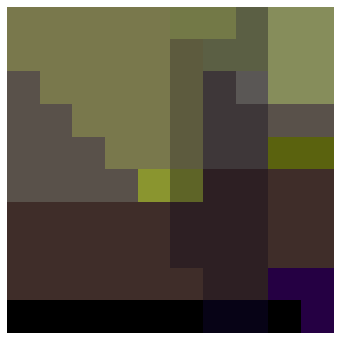

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 85000 , Score 3482.9903333548223


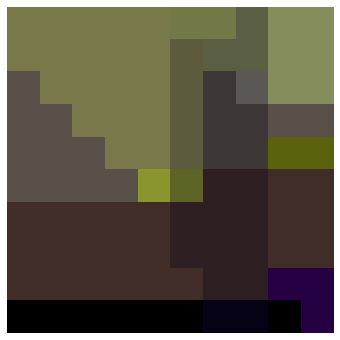

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 86000 , Score 3482.8016609826186


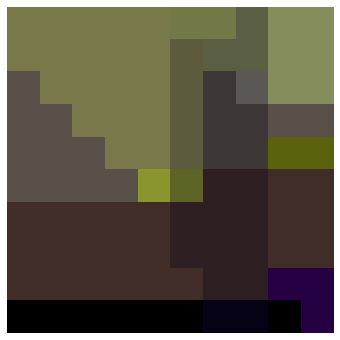

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 87000 , Score 3482.5015740402964


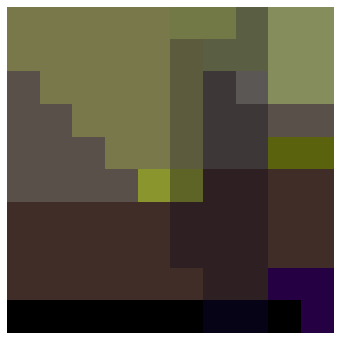

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 88000 , Score 3482.372517107452


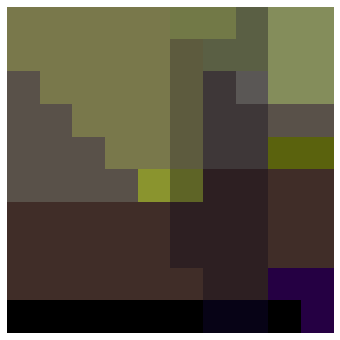

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 89000 , Score 3482.3577023851603


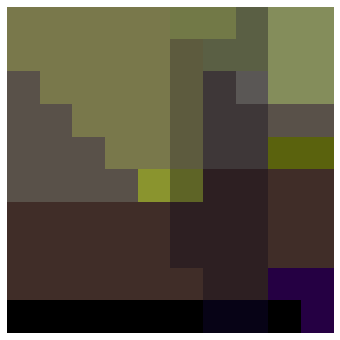

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 90000 , Score 3479.7406290460303


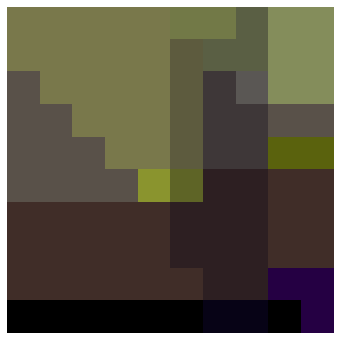

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 91000 , Score 3479.7406290460303


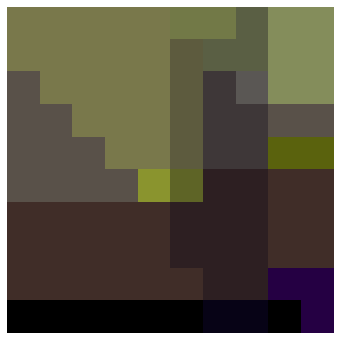

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 92000 , Score 3477.651000191201


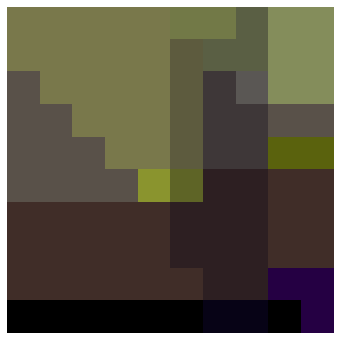

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 93000 , Score 3477.339859413735


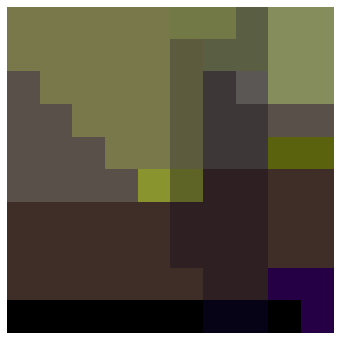

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 94000 , Score 3476.666328223996


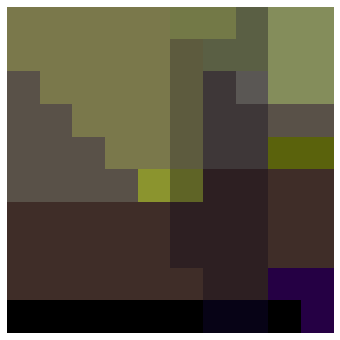

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 95000 , Score 3465.6802837194964


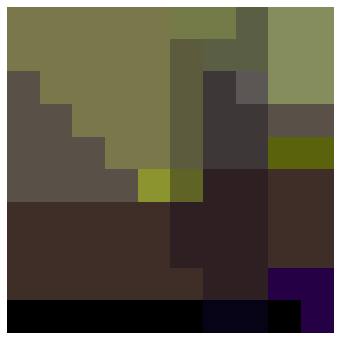

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 96000 , Score 3465.024898881741


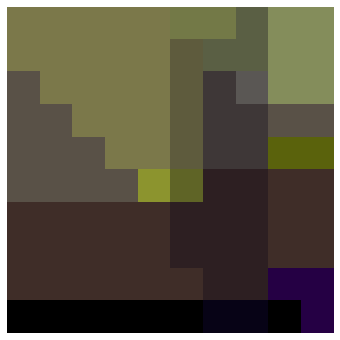

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 97000 , Score 3460.3569748625814


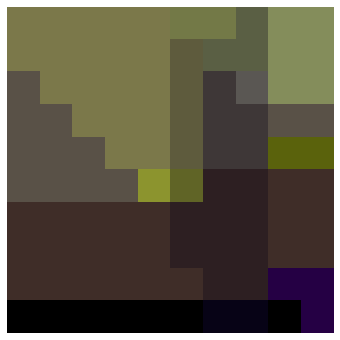

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 98000 , Score 3460.320611550242


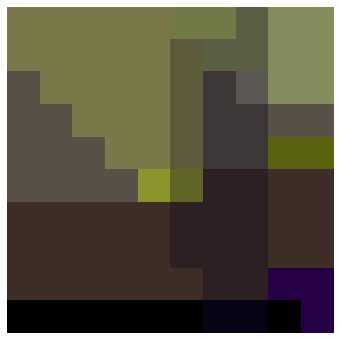

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 99000 , Score 3460.005239419522


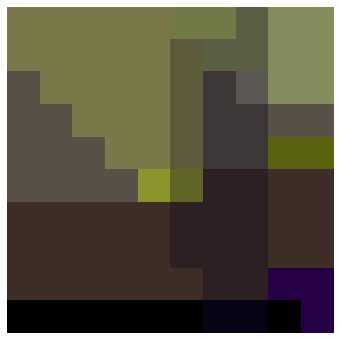

(3449.095527473841,
 (array([  4.84793095,  -5.07214344,   6.41968576,  37.18488644,
           5.16931653,  -5.28675683, -24.19629611,   6.81088216,
           5.15926377,  -2.70672613,  39.23331438,  -2.25370154,
         -13.55900167,   9.75150369,   0.51609174, -21.30134413,
          -2.4704031 ,  -2.87599523,   6.5256724 ,   3.97400259,
          10.46691576,  -7.15950396,  21.21751167,  39.24509129]),
  array([  2.41592602,   5.97707136,   1.84957071,  14.12717642,
           1.32211609, -29.89874392, -22.29347973,  -4.24317308,
           6.15285853, -12.66125273,   3.68212131,   9.26772801,
         -10.78949591,   3.38025128,   5.63502164, -83.83652029,
           2.15535102,  12.33923657,  23.7356777 ,  -3.44470736,
         -77.73343985,   7.20942695,   2.35394745,  12.50488787]),
  array([ 42.1746301 , 173.98429108, 189.90247568,  90.39817326,
          87.8063796 , 123.99185587,   6.81392789,  36.55731822]),
  array([137.44549135, 183.69762018, 197.75750263,  98.24313853,

In [108]:
es(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(10, 10), chromosome_length=8, population_size=1, 
       number_of_offspring=20, number_of_iterations=100000, expanding_interval=1000, mutation_prob=0.001,
       sigma_x=10.0, sigma_rgb=10.0, tau=1/np.sqrt(2*3), tau_0=1/np.sqrt(2*np.sqrt(3)), log_frequency=1)

Iteration 1000 , Score 9778.58706221934


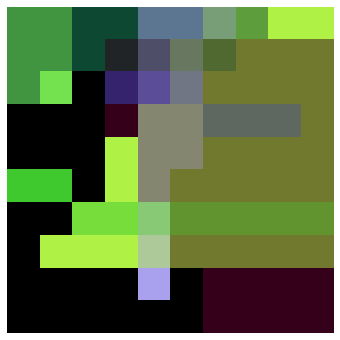

Iteration 2000 , Score 6424.8192018130685


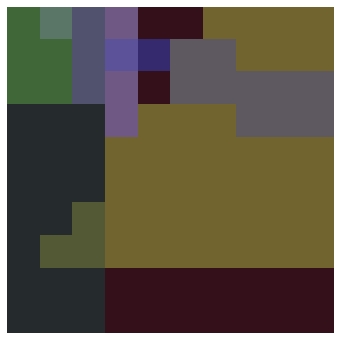

Iteration 3000 , Score 5319.877704504639


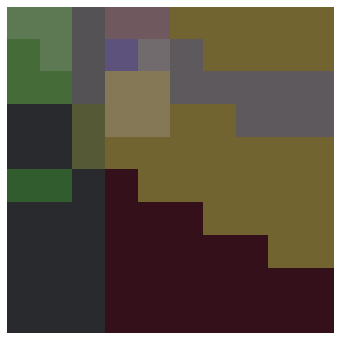

Iteration 4000 , Score 4892.830331339922


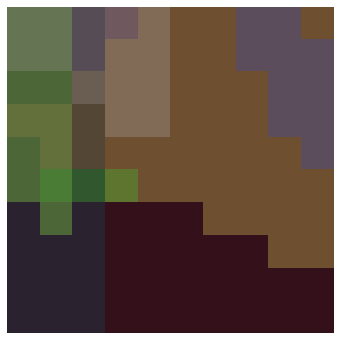

Iteration 5000 , Score 4624.8806770318315


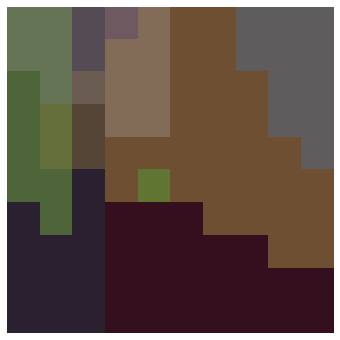

Iteration 6000 , Score 4300.834137397984


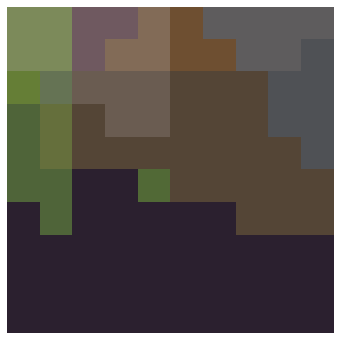

Iteration 7000 , Score 4227.194476390965


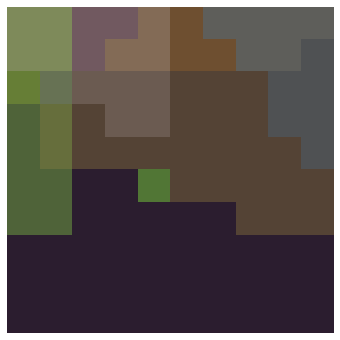

Iteration 8000 , Score 4100.103901155026


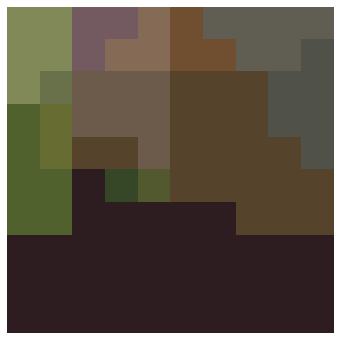

Iteration 9000 , Score 4069.2757429609705


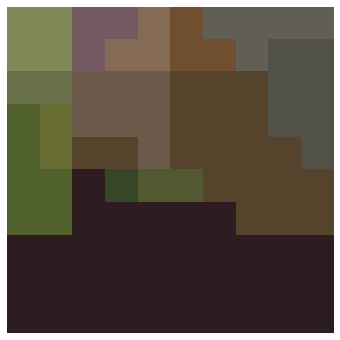

Iteration 10000 , Score 3975.3513144105946


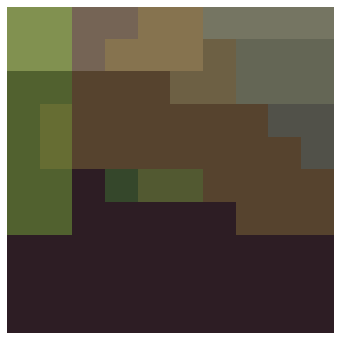

Iteration 11000 , Score 3879.351352264052


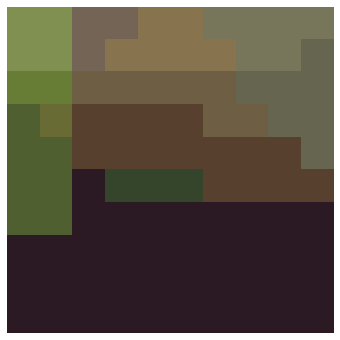

Iteration 12000 , Score 3822.3679611263465


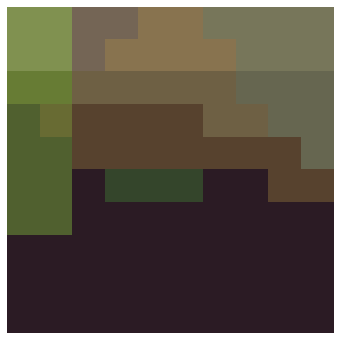

Iteration 13000 , Score 3730.8232575445118


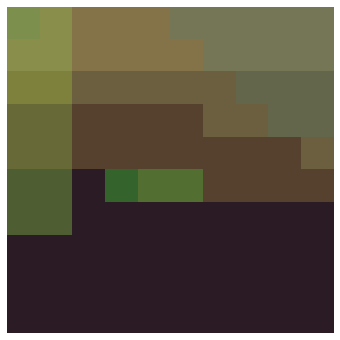

Iteration 14000 , Score 3698.649085721436


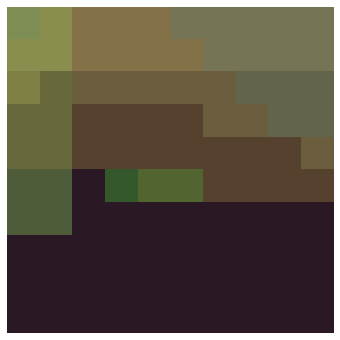

Iteration 15000 , Score 3671.686795166866


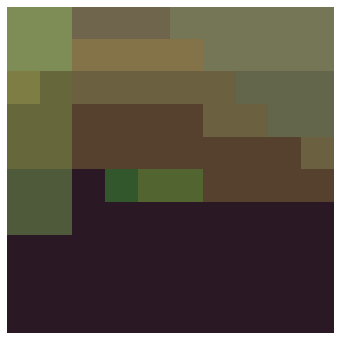

Iteration 16000 , Score 3634.821924132485


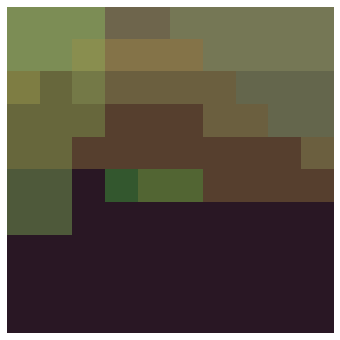

Iteration 17000 , Score 3584.94232311655


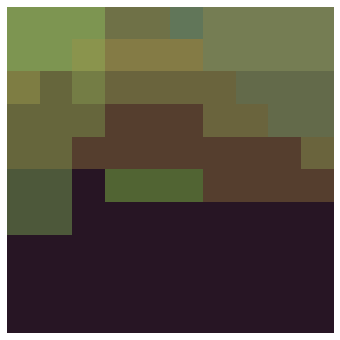

Iteration 18000 , Score 3529.817851216084


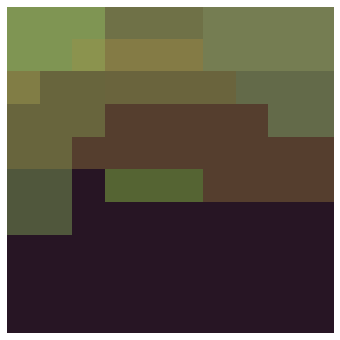

Iteration 19000 , Score 3514.8141815670506


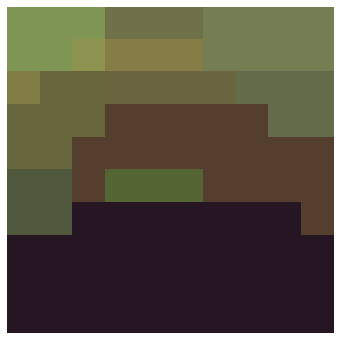

Iteration 20000 , Score 3507.1892526498004


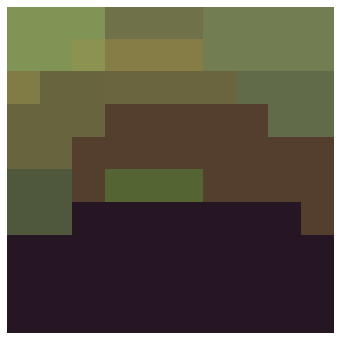

Iteration 21000 , Score 3496.4307903171643


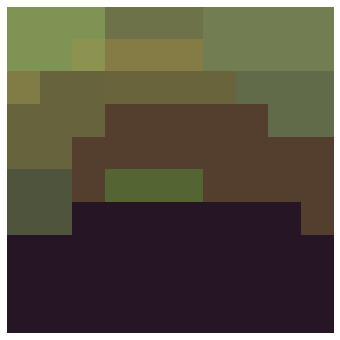

Iteration 22000 , Score 3484.3909666084223


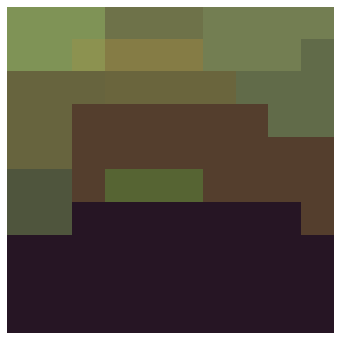

Iteration 23000 , Score 3452.75402485899


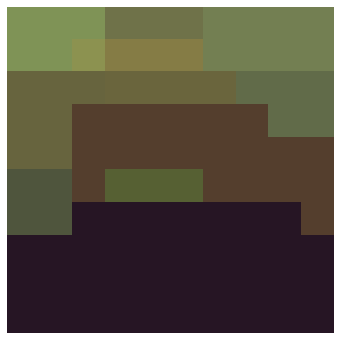

Iteration 24000 , Score 3451.873811840039


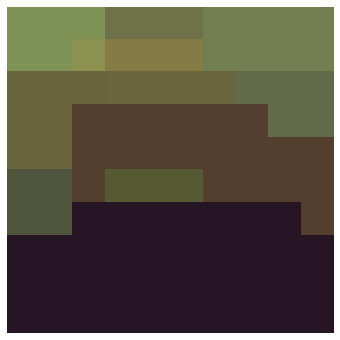

Iteration 25000 , Score 3447.261022353079


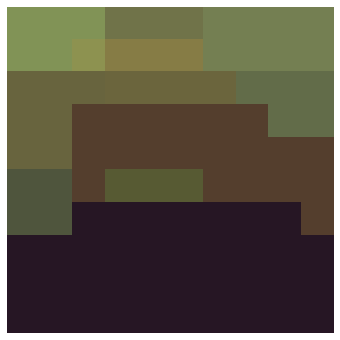

Iteration 26000 , Score 3446.982911803084


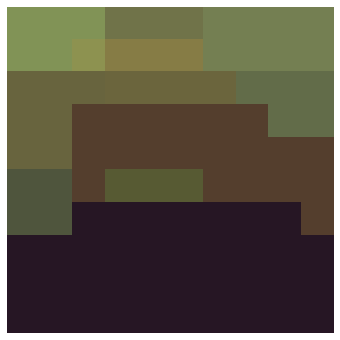

Iteration 27000 , Score 3403.2841466784407


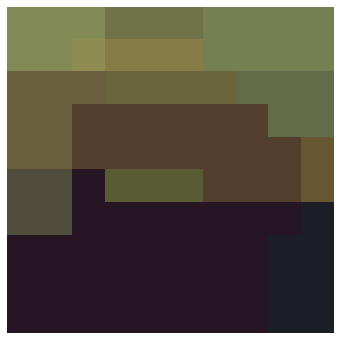

Iteration 28000 , Score 3395.5839421563364


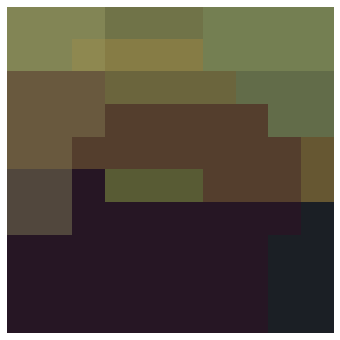

Iteration 29000 , Score 3386.3145810341007


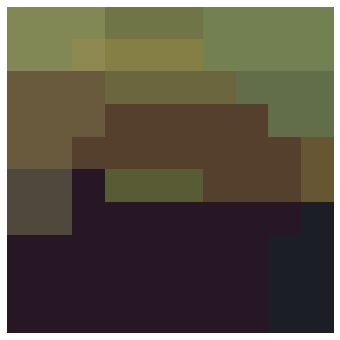

Iteration 30000 , Score 3385.504335793956


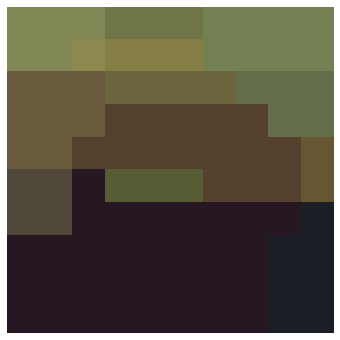

Iteration 31000 , Score 3384.3250519507


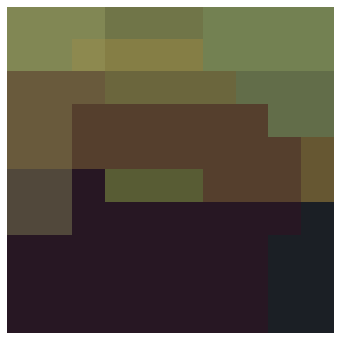

Iteration 32000 , Score 3383.913411559833


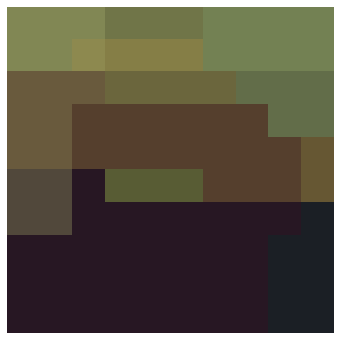

Iteration 33000 , Score 3383.8075329959975


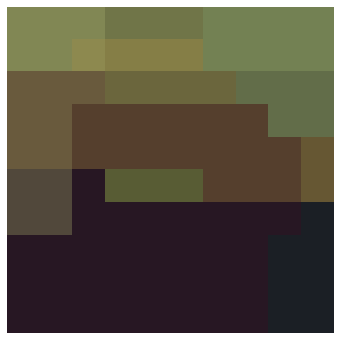

Iteration 34000 , Score 3380.8812394851757


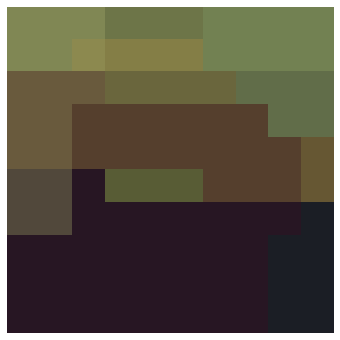

Iteration 35000 , Score 3373.9978547690316


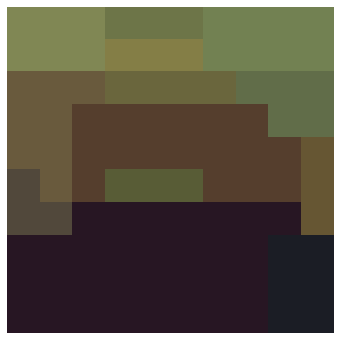

Iteration 36000 , Score 3363.7553474286124


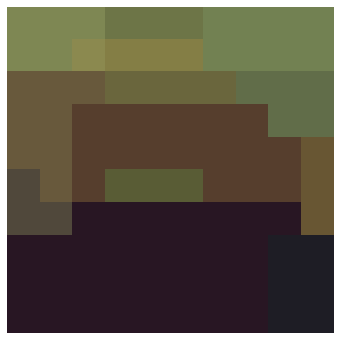

Iteration 37000 , Score 3355.5266399349803


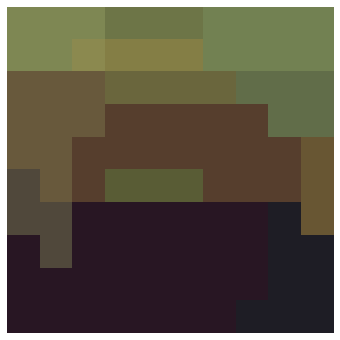

Iteration 38000 , Score 3355.5266399349803


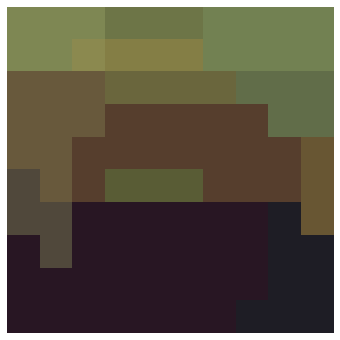

Iteration 39000 , Score 3330.854610651022


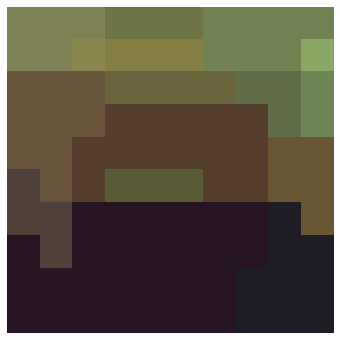

Iteration 40000 , Score 3329.6919290265832


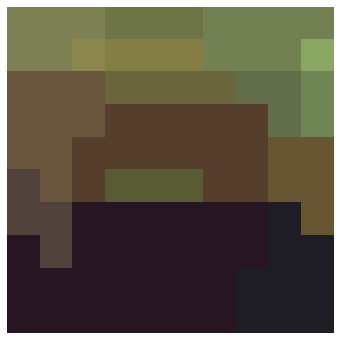

Iteration 41000 , Score 3329.147234271517


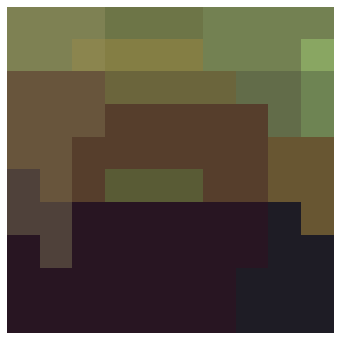

Iteration 42000 , Score 3323.834617286099


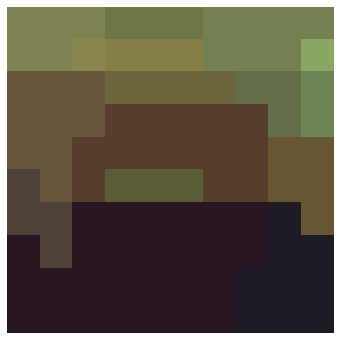

Iteration 43000 , Score 3322.5908530868815


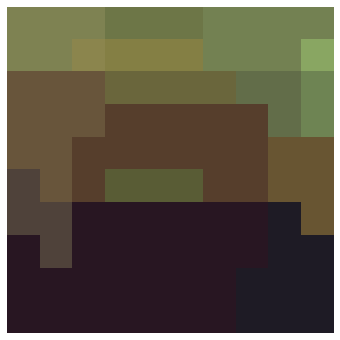

Iteration 44000 , Score 3321.822598832182


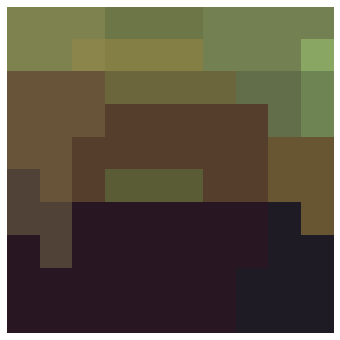

Iteration 45000 , Score 3317.893930373843


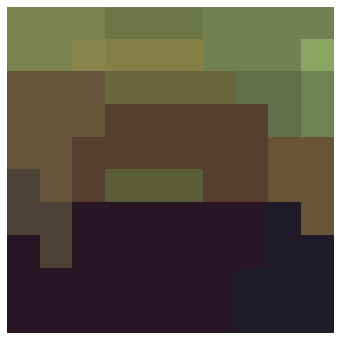

Iteration 46000 , Score 3315.1826284368485


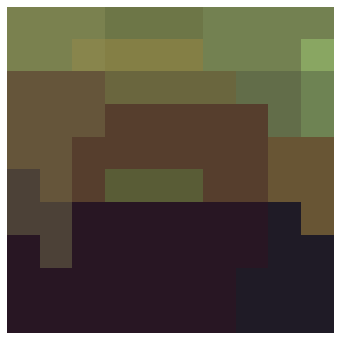

Iteration 47000 , Score 3314.9891699294603


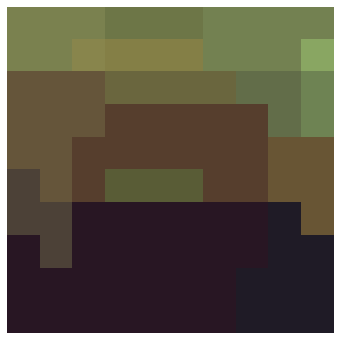

Iteration 48000 , Score 3307.6672938839574


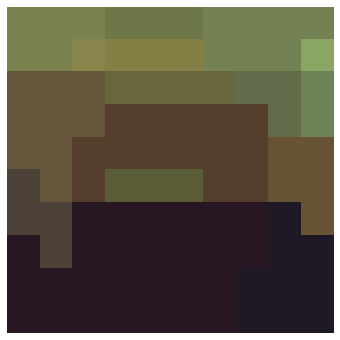

Iteration 49000 , Score 3306.9513100676413


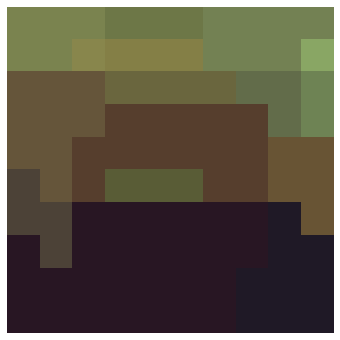

Iteration 50000 , Score 3305.7140329376516


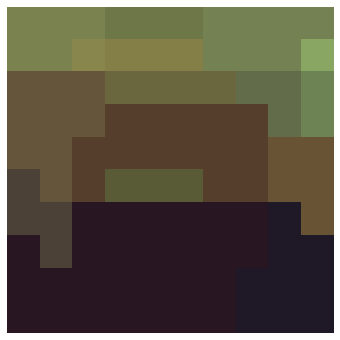

Iteration 51000 , Score 3305.6009970300397


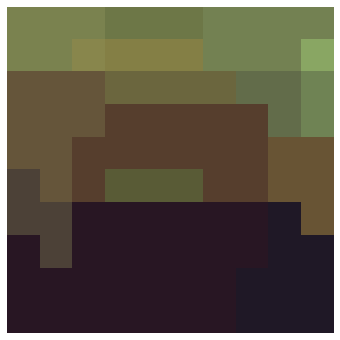

Iteration 52000 , Score 3305.2099209288403


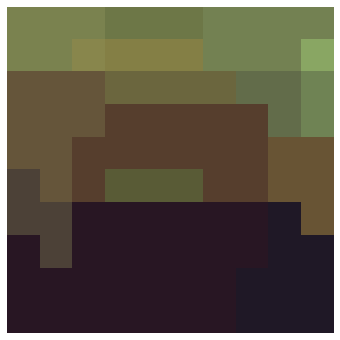

Iteration 53000 , Score 3304.9208954241326


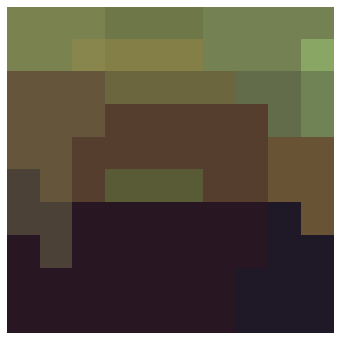

Iteration 54000 , Score 3304.5989347727873


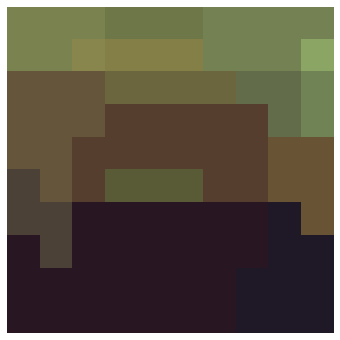

Iteration 55000 , Score 3304.2329128433544


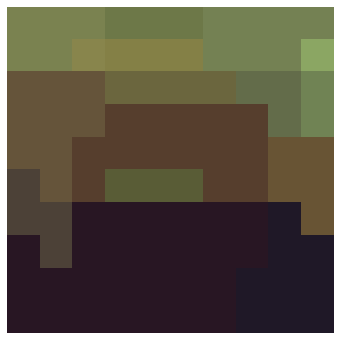

Iteration 56000 , Score 3300.955299826534


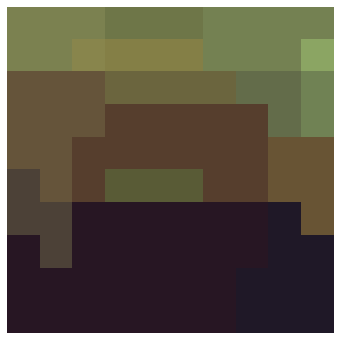

Iteration 57000 , Score 3298.623172194867


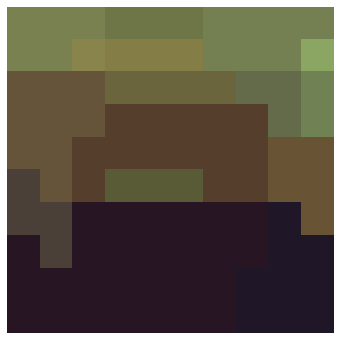

Iteration 58000 , Score 3297.7051660482257


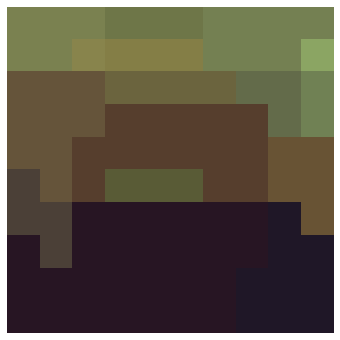

Iteration 59000 , Score 3291.908861256298


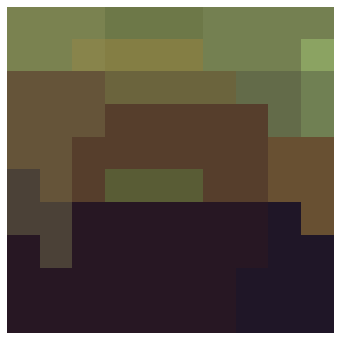

Iteration 60000 , Score 3291.411184611534


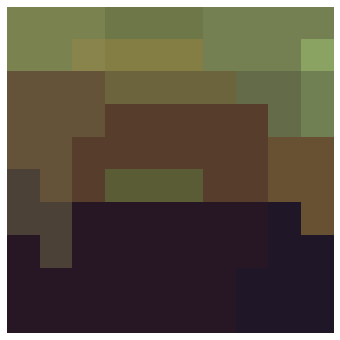

Iteration 61000 , Score 3291.0765229065646


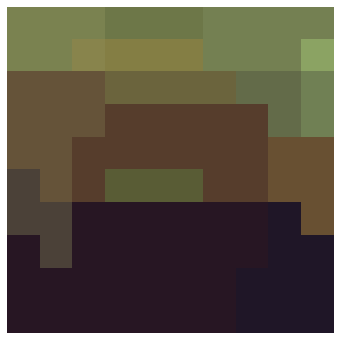

Iteration 62000 , Score 3280.312397714883


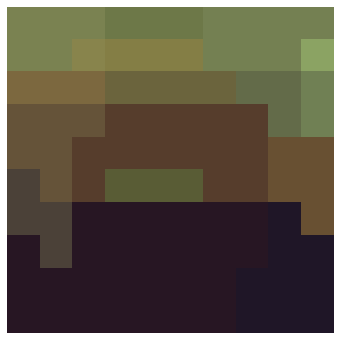

Iteration 63000 , Score 3271.4023690266886


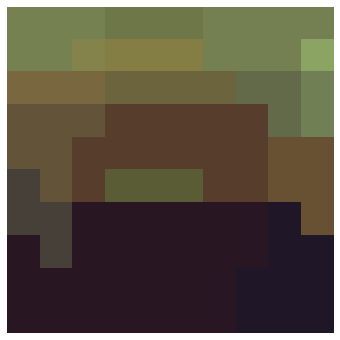

Iteration 64000 , Score 3271.2303468813766


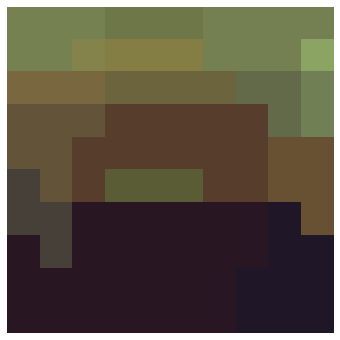

Iteration 65000 , Score 3270.0810083328397


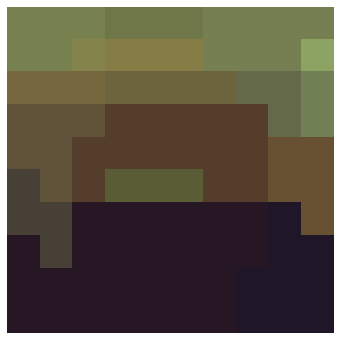

Iteration 66000 , Score 3267.8484848324842


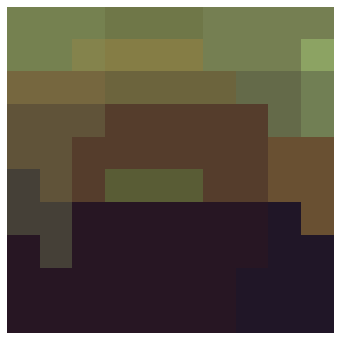

Iteration 67000 , Score 3267.7791900965267


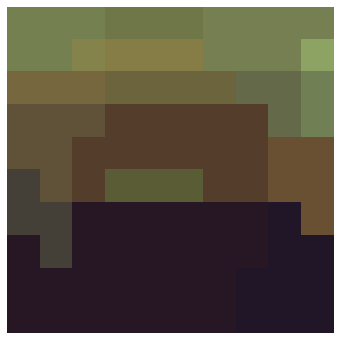

Iteration 68000 , Score 3267.5327801723397


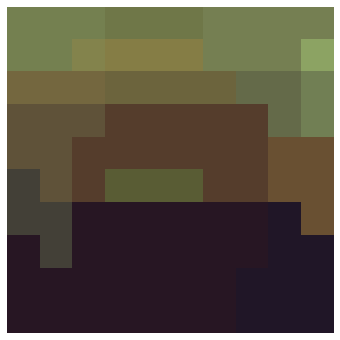

Iteration 69000 , Score 3267.338922637435


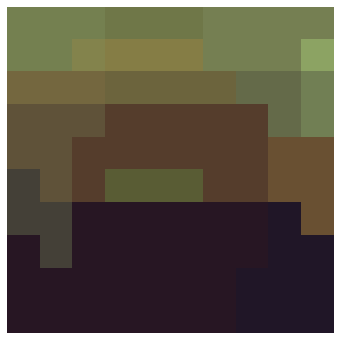

Iteration 70000 , Score 3267.2937897161423


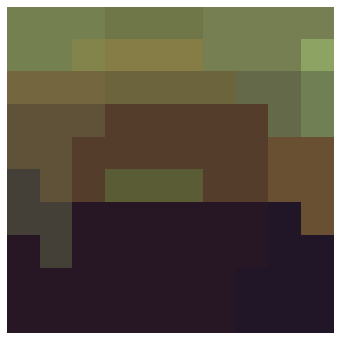

Iteration 71000 , Score 3267.27136351096


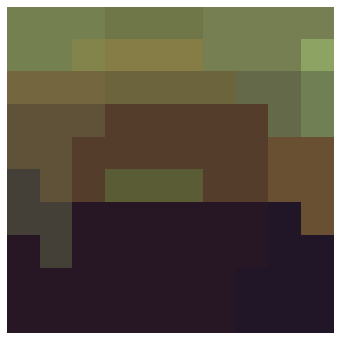

Iteration 72000 , Score 3266.336271685614


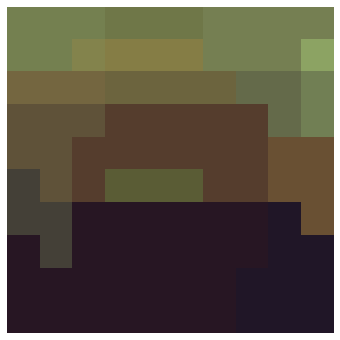

Iteration 73000 , Score 3265.041580659037


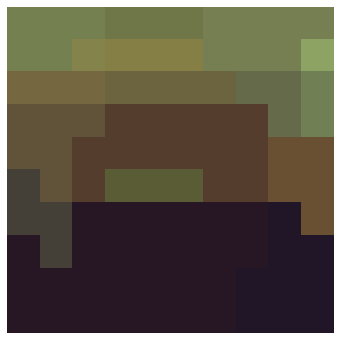

Iteration 74000 , Score 3264.3906987435576


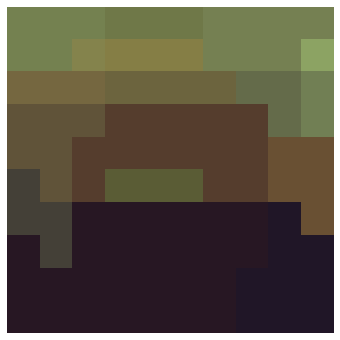

Iteration 75000 , Score 3244.857534460911


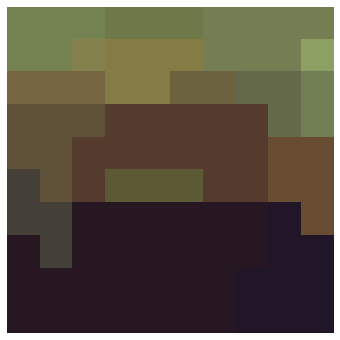

Iteration 76000 , Score 3217.9805125960843


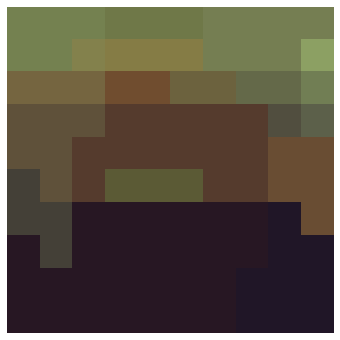

Iteration 77000 , Score 3217.097755523462


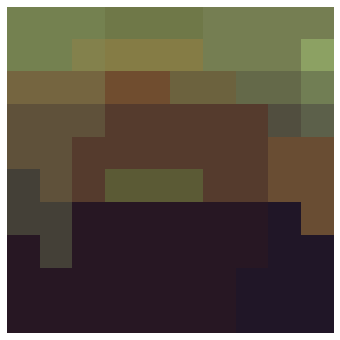

Iteration 78000 , Score 3215.3008888030577


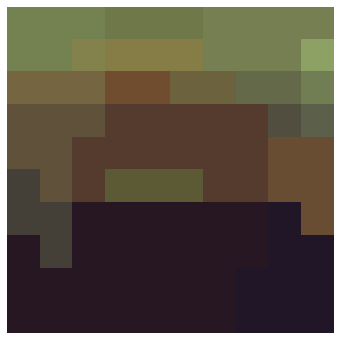

Iteration 79000 , Score 3215.1786388295322


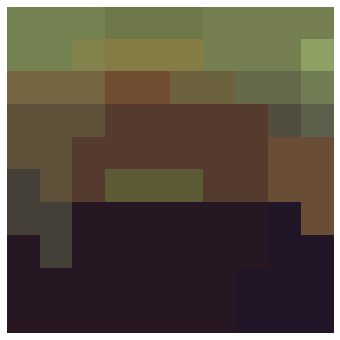

Iteration 80000 , Score 3214.748593501905


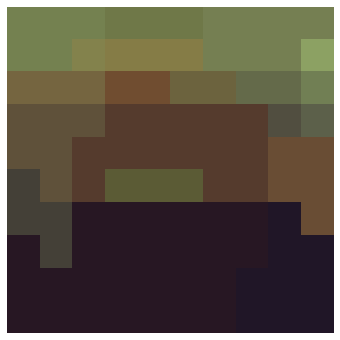

Iteration 81000 , Score 3200.7172178088085


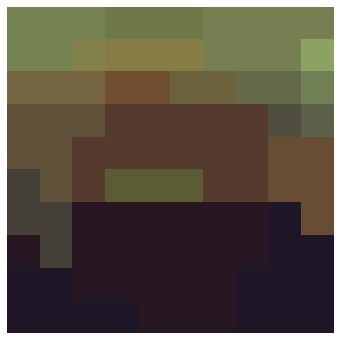

Iteration 82000 , Score 3198.5671373507453


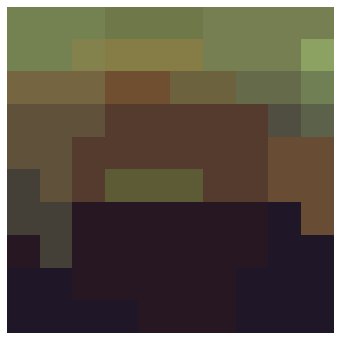

Iteration 83000 , Score 3195.3369265121396


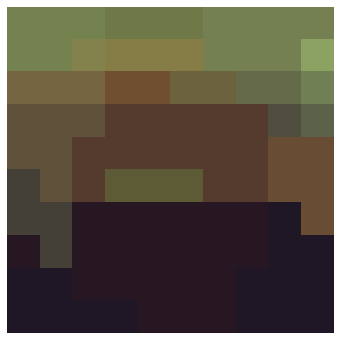

Iteration 84000 , Score 3194.5780200584036


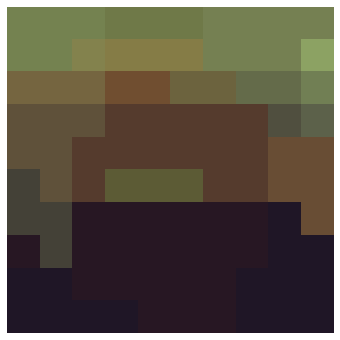

Iteration 85000 , Score 3183.1709405535503


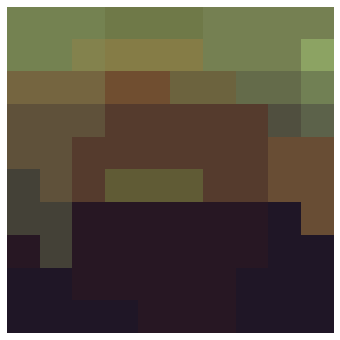

Iteration 86000 , Score 3170.953903564236


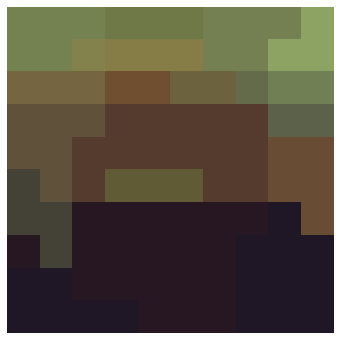

Iteration 87000 , Score 3168.0455111679444


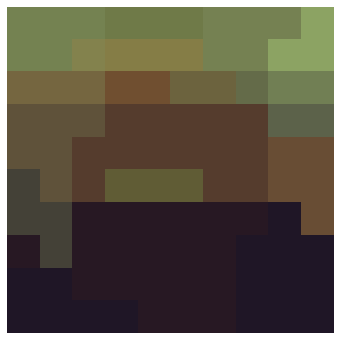

Iteration 88000 , Score 3158.161830854703


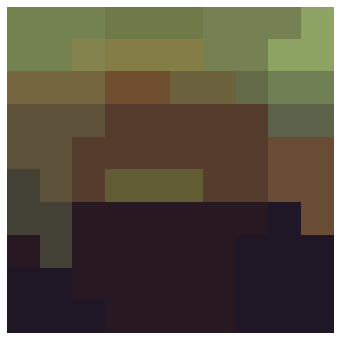

Iteration 89000 , Score 3156.1389364760043


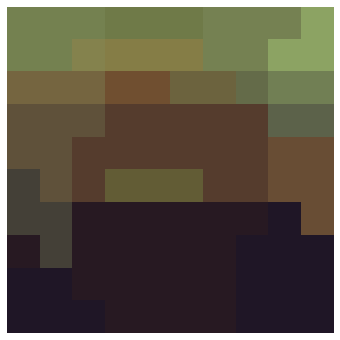

Iteration 90000 , Score 3155.011279343282


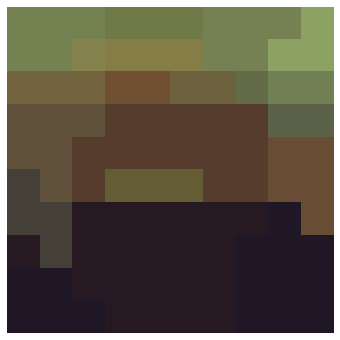

Iteration 91000 , Score 3143.6854911232226


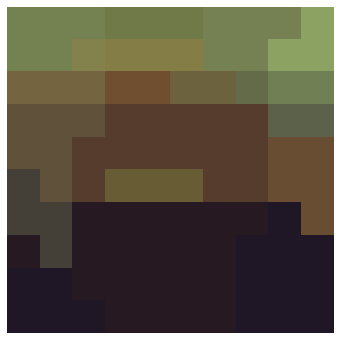

Iteration 92000 , Score 3143.1382632361792


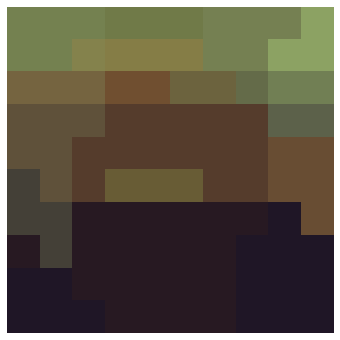

Iteration 93000 , Score 3097.864465055422


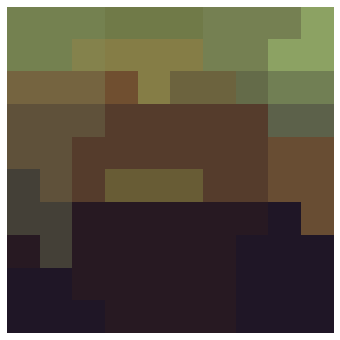

Iteration 94000 , Score 3096.1046707647547


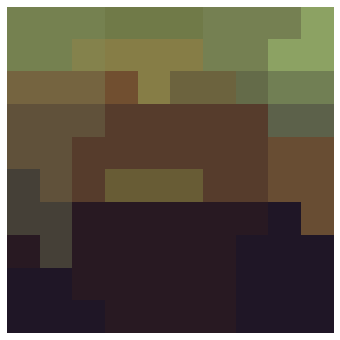

Iteration 95000 , Score 3095.282527766237


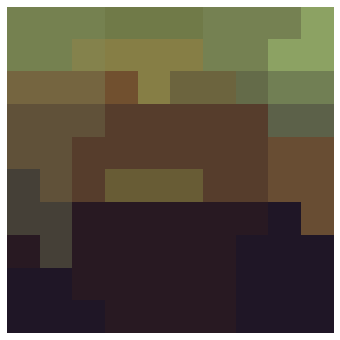

Iteration 96000 , Score 3088.497575635888


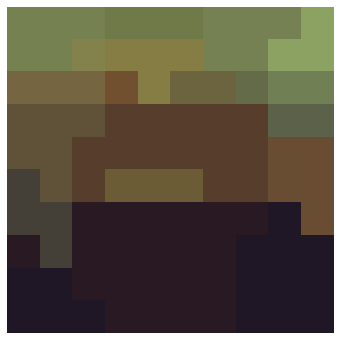

Iteration 97000 , Score 3088.198448376702


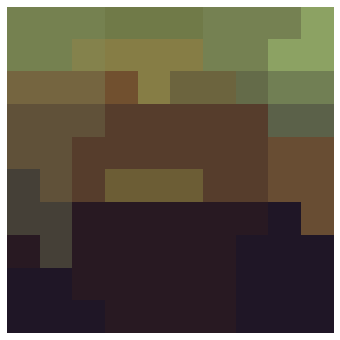

Iteration 98000 , Score 3079.7710543436747


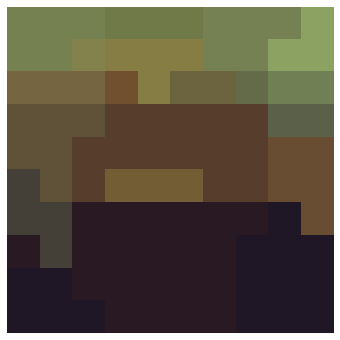

Iteration 99000 , Score 3079.1603004274552


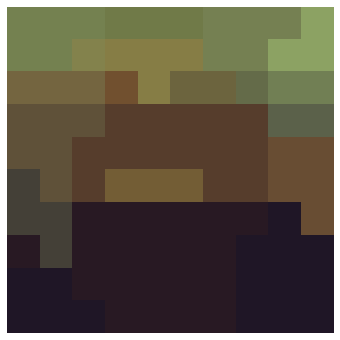

(3078.3837335228313,
 (array([ -6.89701234,  17.32265956,   1.57981139,   4.94212078,
           1.34715498,  -9.16902003,   7.44025514,   7.61024867,
           5.7736569 , 133.99471206,  -0.78694854, -10.59077863,
          -7.6233805 ,  22.98659787,   8.78510515,  28.6127152 ,
           6.16704663, -10.54694601,  -2.73600754,  17.12874498,
           8.24176541,  10.28458576, -20.66828521,   7.21262802]),
  array([   0.13581233,    4.45181863,  -58.06298345,  -14.6612365 ,
            7.40160926,    3.20291123,    6.52655141,    6.16325923,
            4.41149955,   -5.57254444,    2.32300855,  127.5921299 ,
            3.90643502,    7.96933645,   -1.12665847, -118.27194139,
           10.99906771,    0.88989191,   -8.89566367,   -4.59257795,
            3.71907589,    5.71691078,    0.57548922,    5.84923758]),
  array([176.32808331, 124.07686967, 147.79896364,  31.46617419,
         176.23544944,  49.6296873 ,  66.62826534, 203.84300958]),
  array([216.05514238, 142.41752446,  6

In [109]:
es(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(10, 10), chromosome_length=8, population_size=1, 
       number_of_offspring=20, number_of_iterations=100000, expanding_interval=1000, mutation_prob=0.001,
       sigma_x=10.0, sigma_rgb=10.0, tau=1/np.sqrt(2*3), tau_0=1/np.sqrt(2*np.sqrt(3)), log_frequency=1)

Iteration 1000 , Score 7261.301408010684


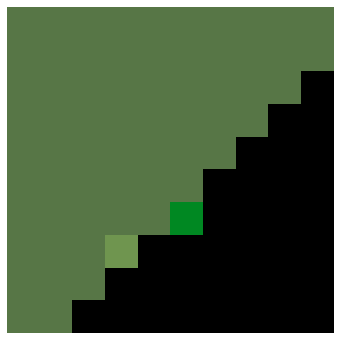

Iteration 2000 , Score 5426.47564376494


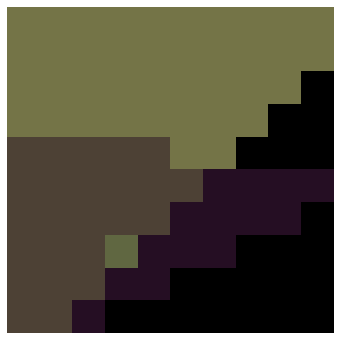

Iteration 3000 , Score 5179.510717241656


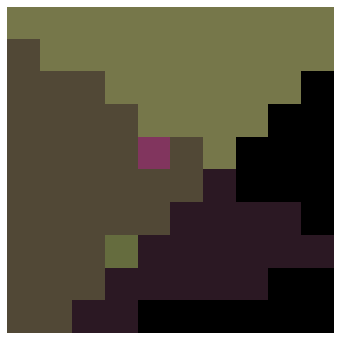

Iteration 4000 , Score 5072.7490767731615


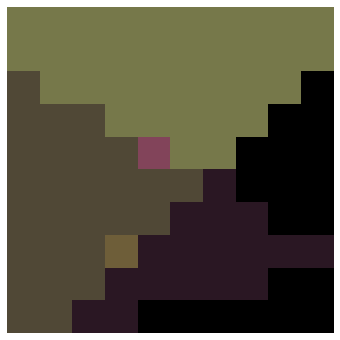

Iteration 5000 , Score 4934.35166344689


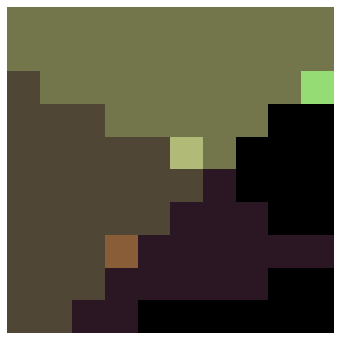

Iteration 6000 , Score 4552.338442922268


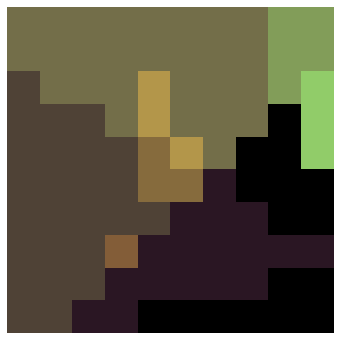

Iteration 7000 , Score 4335.459359848161


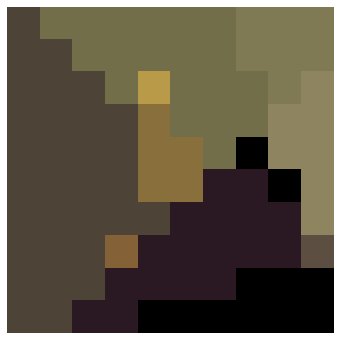

Iteration 8000 , Score 3885.7450777619656


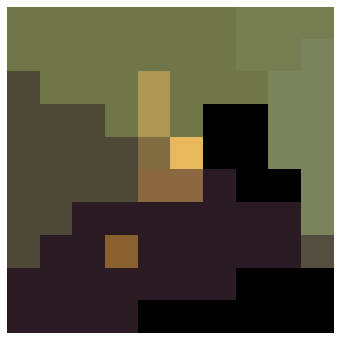

Iteration 9000 , Score 3767.046616428773


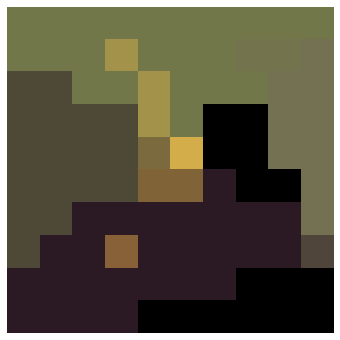

Iteration 10000 , Score 3689.195861291345


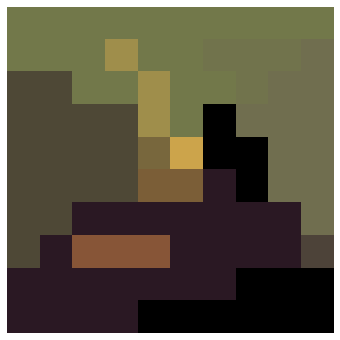

Iteration 11000 , Score 3604.7764440909436


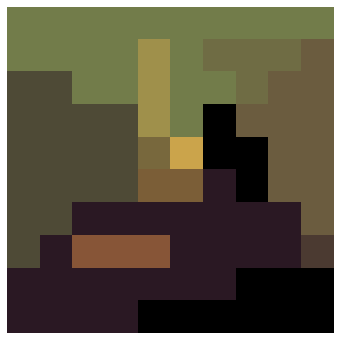

Iteration 12000 , Score 3580.8879284078644


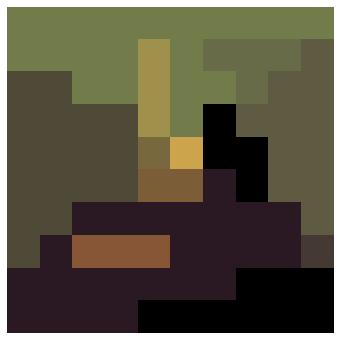

Iteration 13000 , Score 3562.9533683783798


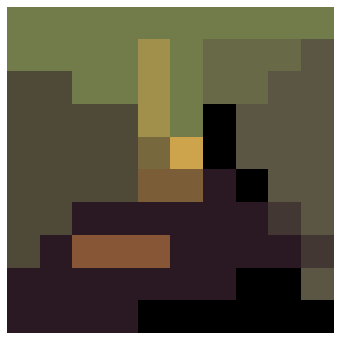

Iteration 14000 , Score 3473.539992160809


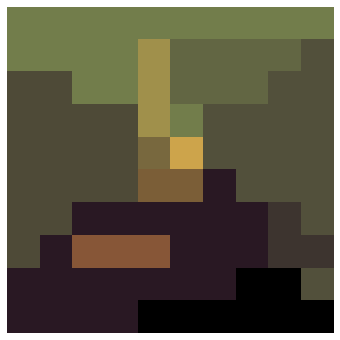

Iteration 15000 , Score 3400.986887914888


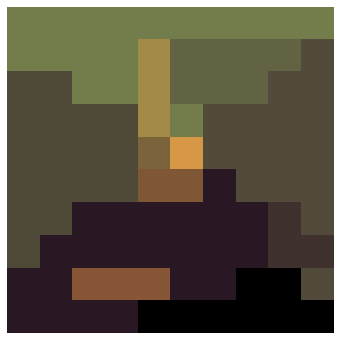

Iteration 16000 , Score 3376.3889818320126


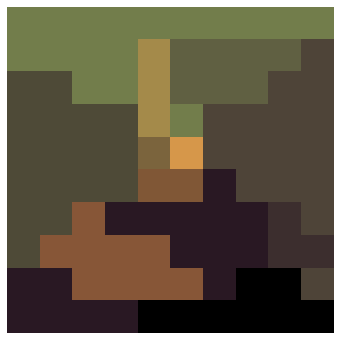

Iteration 17000 , Score 3235.45603255584


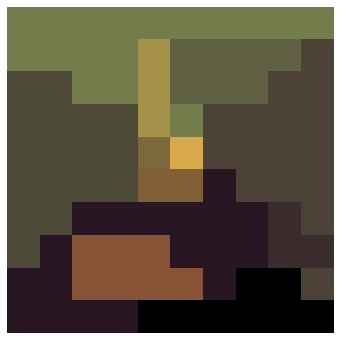

Iteration 18000 , Score 3222.3300705143224


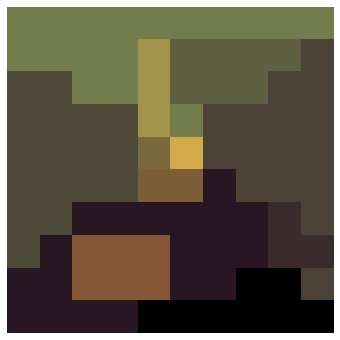

Iteration 19000 , Score 3215.9859382594145


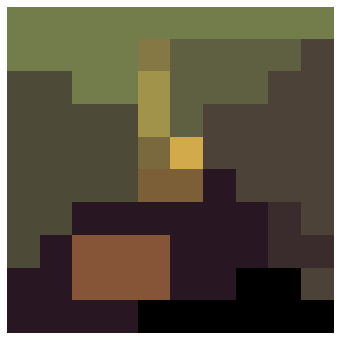

Iteration 20000 , Score 3215.5900220898934


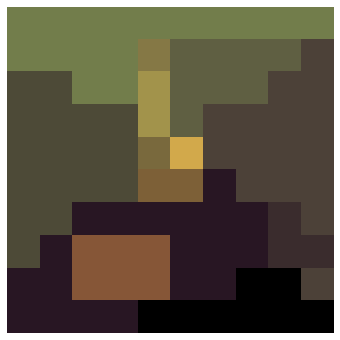

Iteration 21000 , Score 3215.254404624868


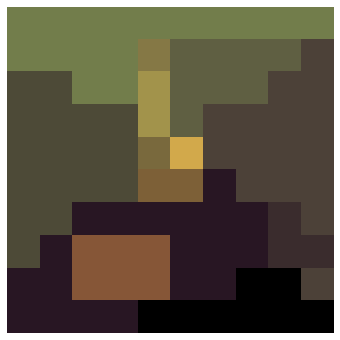

Iteration 22000 , Score 3214.607978345231


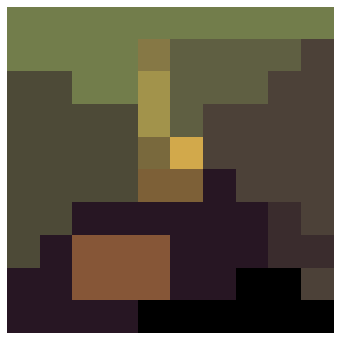

Iteration 23000 , Score 3214.0705581752613


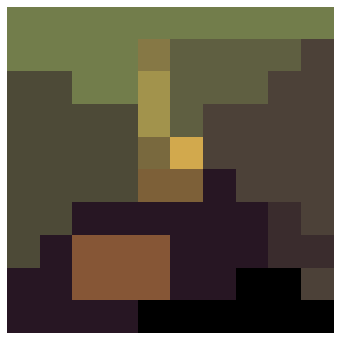

Iteration 24000 , Score 3213.875467164869


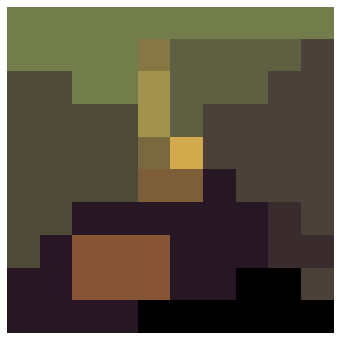

Iteration 25000 , Score 3213.4793399786595


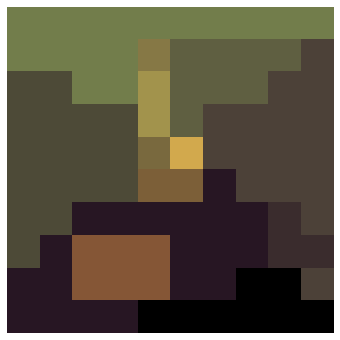

Iteration 26000 , Score 3213.0199430109324


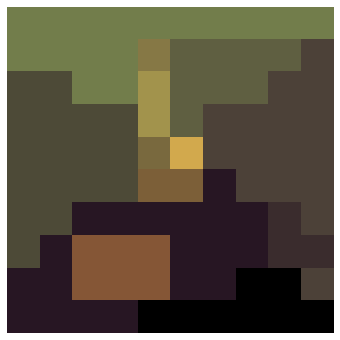

Iteration 27000 , Score 3212.647748783567


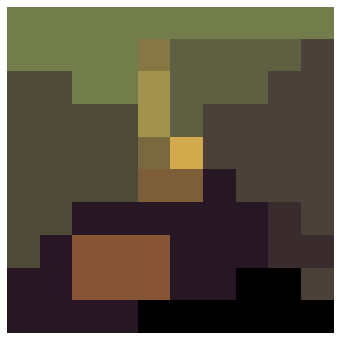

Iteration 28000 , Score 3210.7605540683967


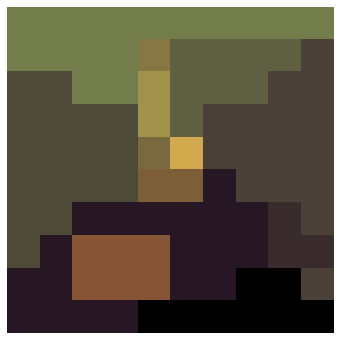

Iteration 29000 , Score 3210.533073385905


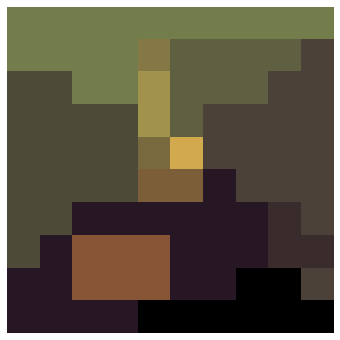

Iteration 30000 , Score 3210.1004077822895


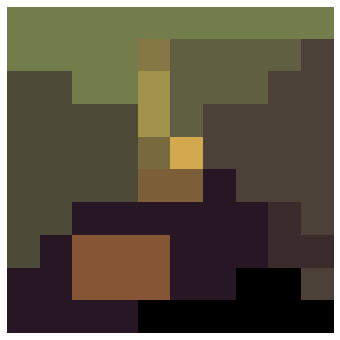

Iteration 31000 , Score 3209.988615124455


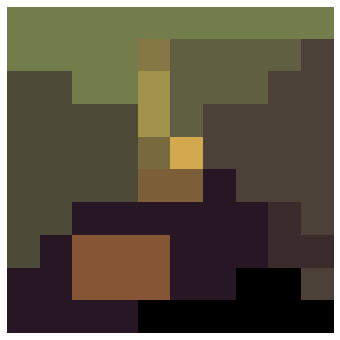

Iteration 32000 , Score 3209.911154987441


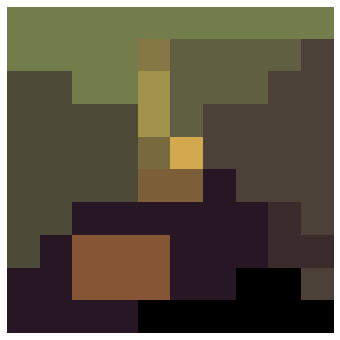

Iteration 33000 , Score 3209.568027754348


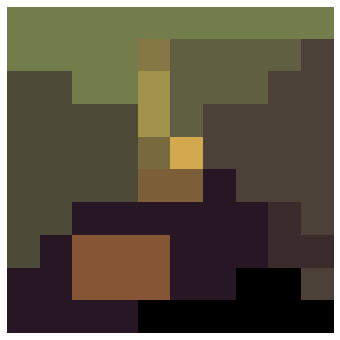

Iteration 34000 , Score 3209.2530304384645


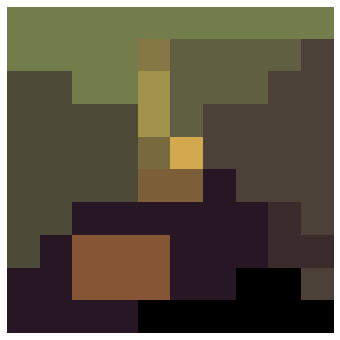

Iteration 35000 , Score 3206.307979586099


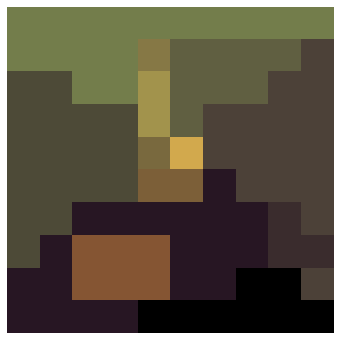

Iteration 36000 , Score 3198.20150318537


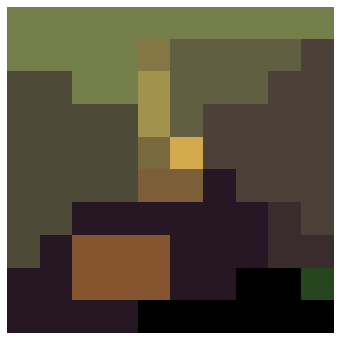

Iteration 37000 , Score 3197.8196161258174


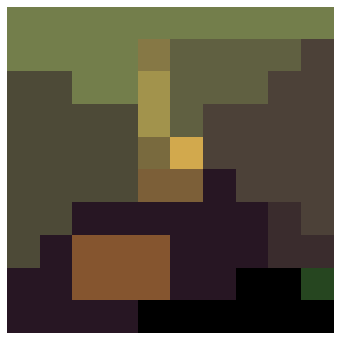

Iteration 38000 , Score 3191.5213523698944


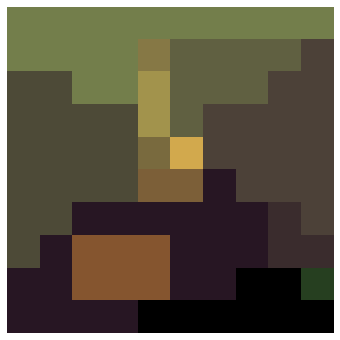

Iteration 39000 , Score 3172.500941477538


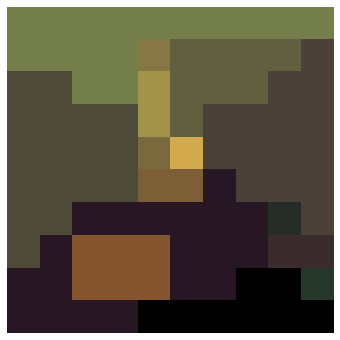

Iteration 40000 , Score 3125.2018686569404


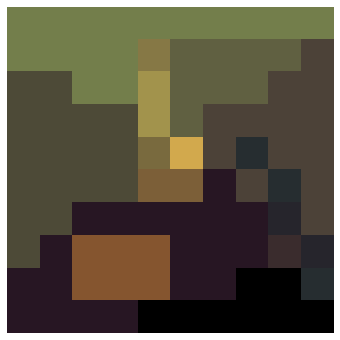

Iteration 41000 , Score 3103.5131721800176


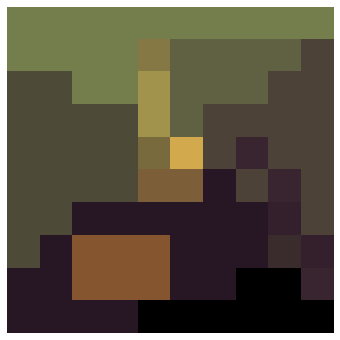

Iteration 42000 , Score 3064.8874586363045


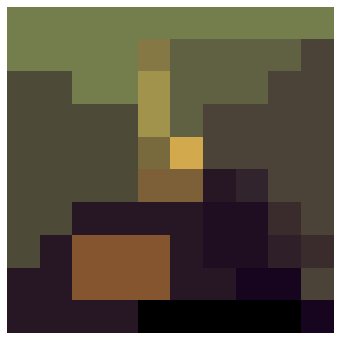

Iteration 43000 , Score 2943.7108270364993


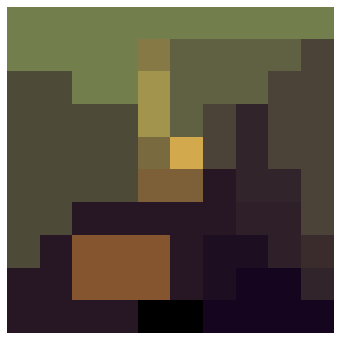

Iteration 44000 , Score 2909.72160785279


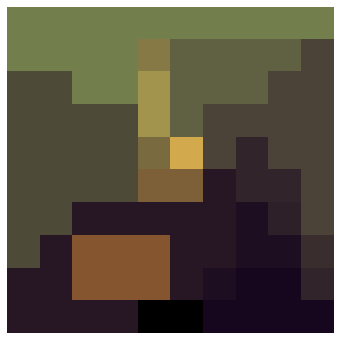

Iteration 45000 , Score 2908.397028456871


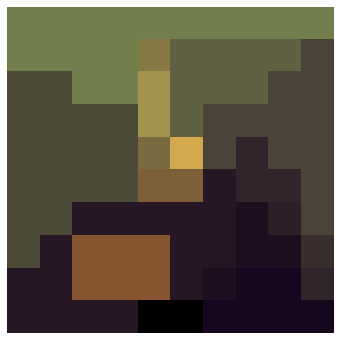

Iteration 46000 , Score 2903.038168429103


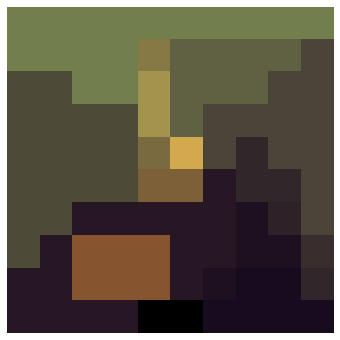

Iteration 47000 , Score 2897.149480342709


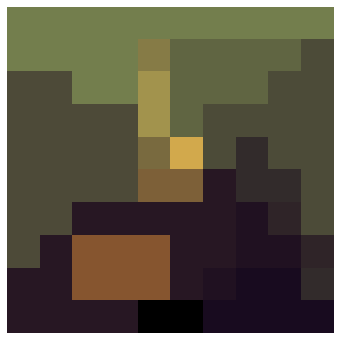

Iteration 48000 , Score 2896.8081717362625


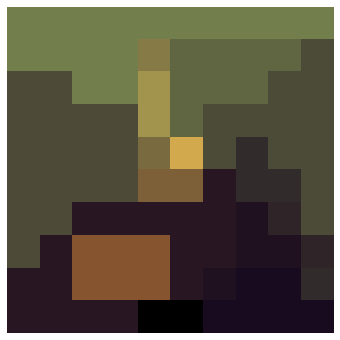

Iteration 49000 , Score 2896.625968864322


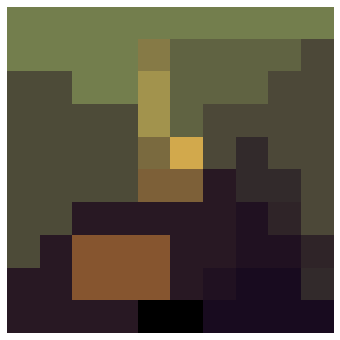

Iteration 50000 , Score 2896.334282160968


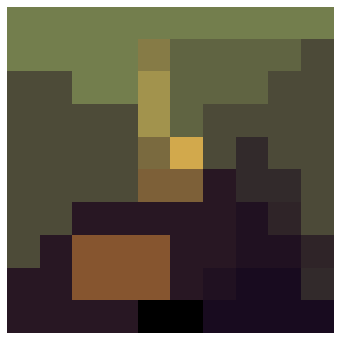

Iteration 51000 , Score 2896.326722134956


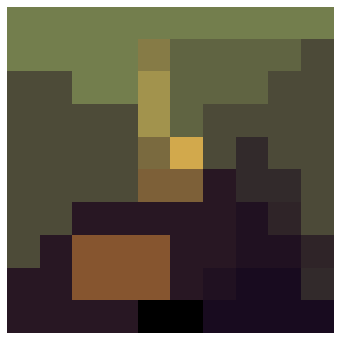

Iteration 52000 , Score 2891.6790720346644


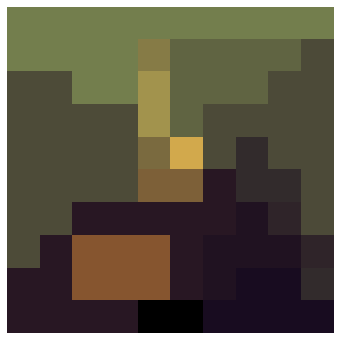

Iteration 53000 , Score 2891.534098688684


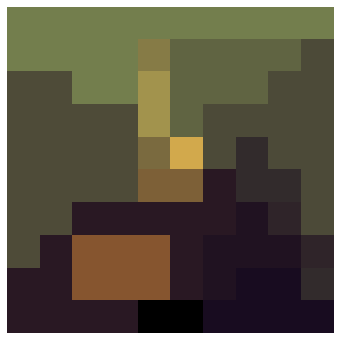

Iteration 54000 , Score 2786.577205217337


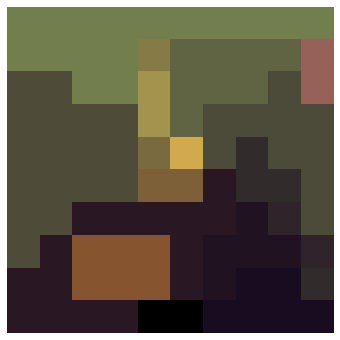

Iteration 55000 , Score 2738.7266151806493


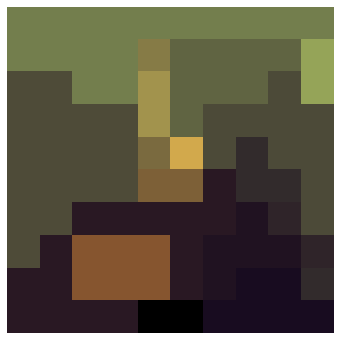

Iteration 56000 , Score 2724.6995604632866


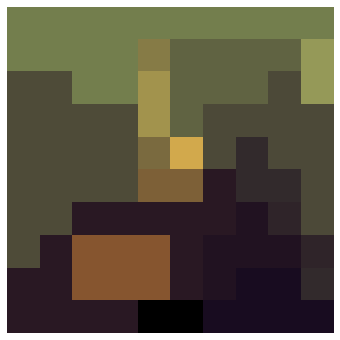

Iteration 57000 , Score 2722.0036564910292


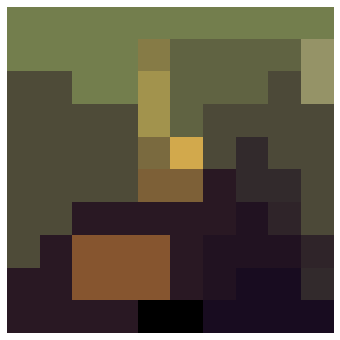

Iteration 58000 , Score 2721.107917466478


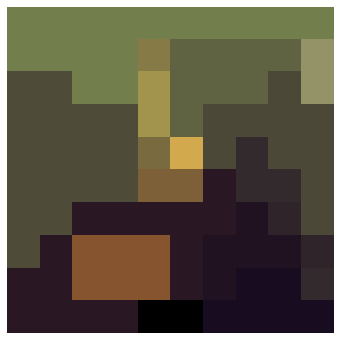

Iteration 59000 , Score 2720.6238147721924


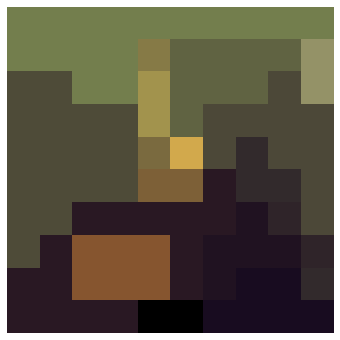

Iteration 60000 , Score 2720.3531095906874


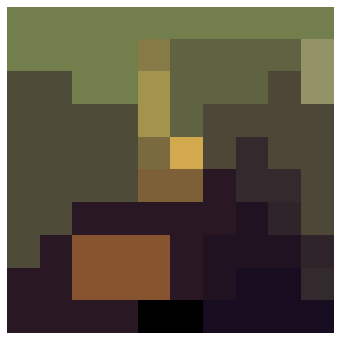

Iteration 61000 , Score 2717.1809423129166


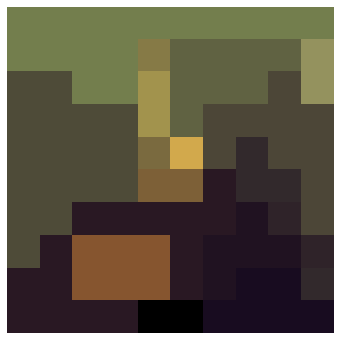

Iteration 62000 , Score 2717.1409238501683


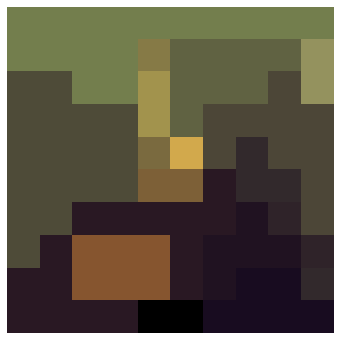

Iteration 63000 , Score 2717.1004659536657


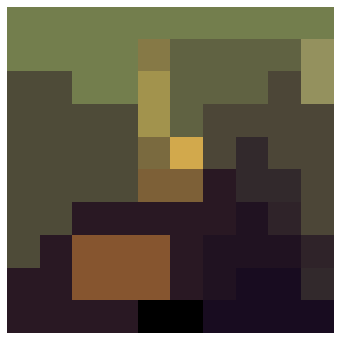

Iteration 64000 , Score 2717.0939959722014


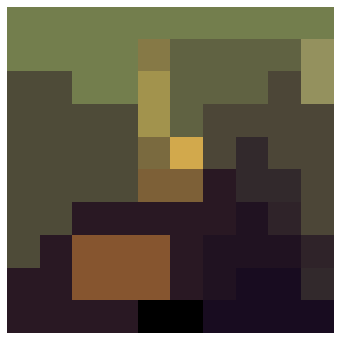

Iteration 65000 , Score 2717.0939153507866


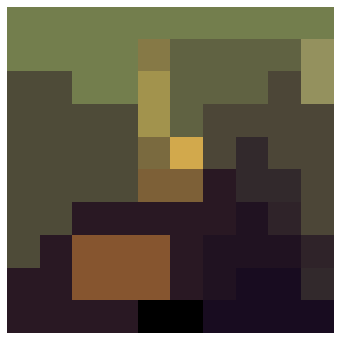

Iteration 66000 , Score 2717.0921020258606


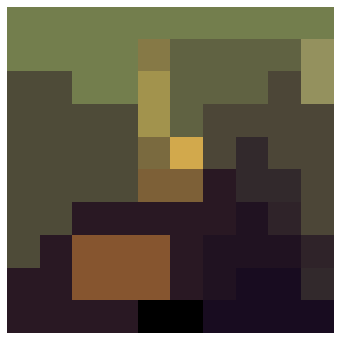

Iteration 67000 , Score 2645.205508169439


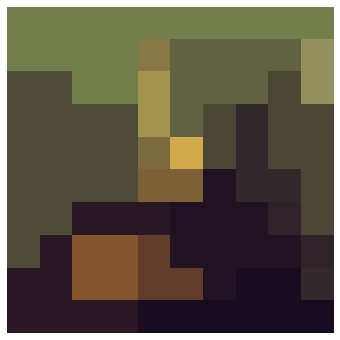

Iteration 68000 , Score 2644.4452892928207


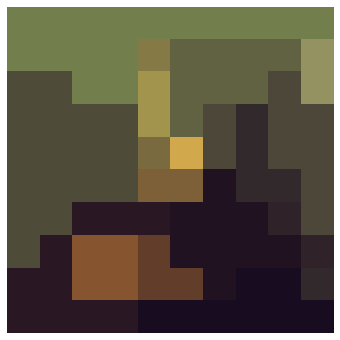

Iteration 69000 , Score 2643.4568554402804


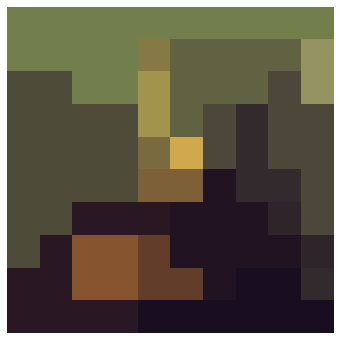

Iteration 70000 , Score 2642.3140001656966


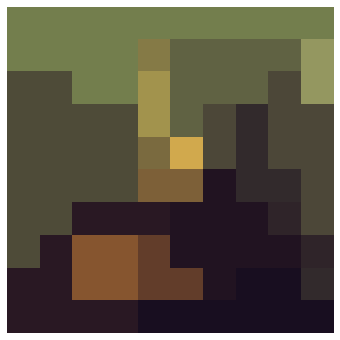

Iteration 71000 , Score 2641.883029594467


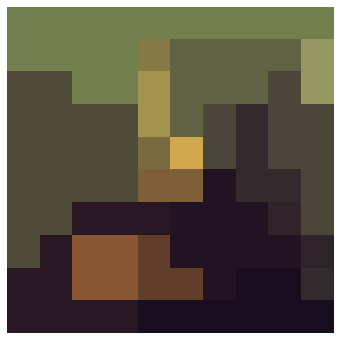

Iteration 72000 , Score 2641.8620816766716


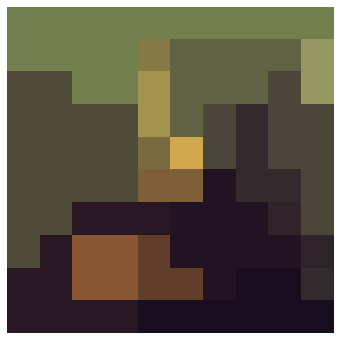

Iteration 73000 , Score 2641.780281463537


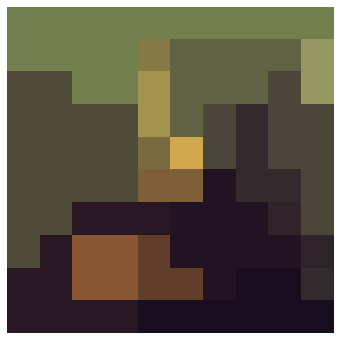

Iteration 74000 , Score 2641.69792235536


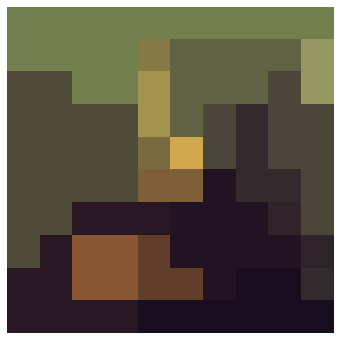

Iteration 75000 , Score 2641.6172406911455


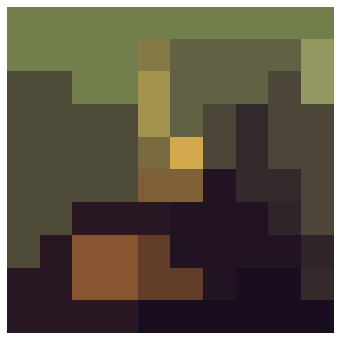

Iteration 76000 , Score 2641.496622089698


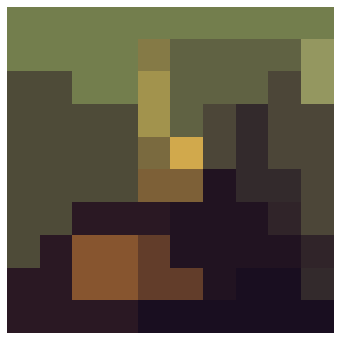

Iteration 77000 , Score 2641.4467347251134


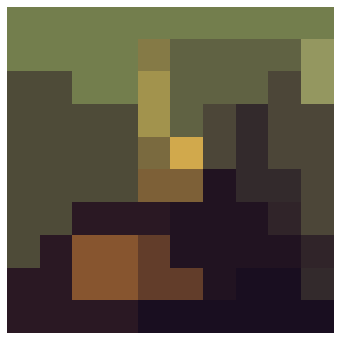

Iteration 78000 , Score 2639.33360837342


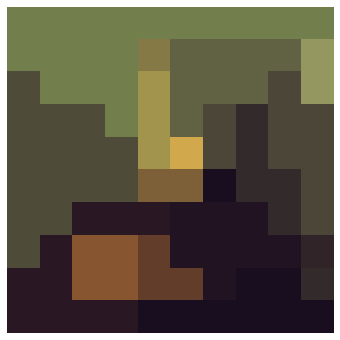

Iteration 79000 , Score 2639.0364926180932


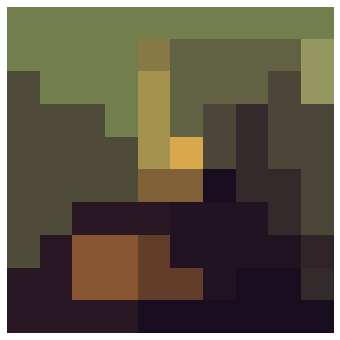

Iteration 80000 , Score 2638.937560360833


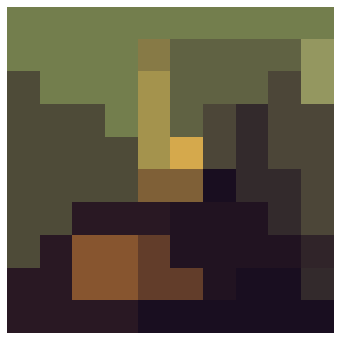

Iteration 81000 , Score 2638.8443301605853


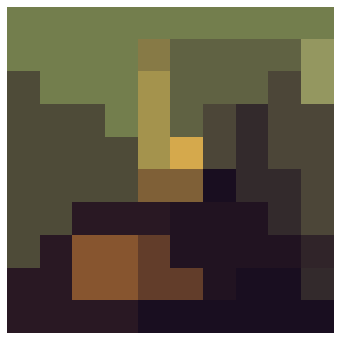

Iteration 82000 , Score 2638.738802927228


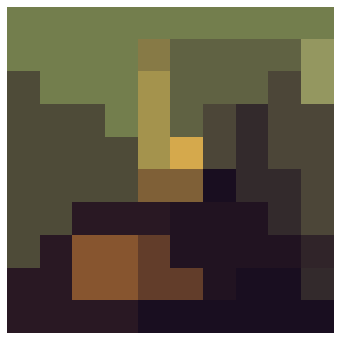

Iteration 83000 , Score 2638.360194611964


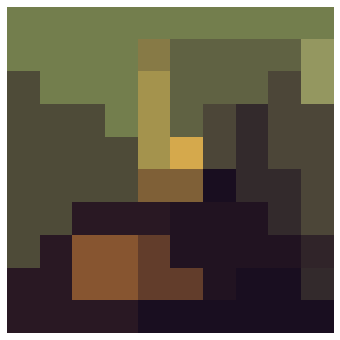

Iteration 84000 , Score 2637.968482265057


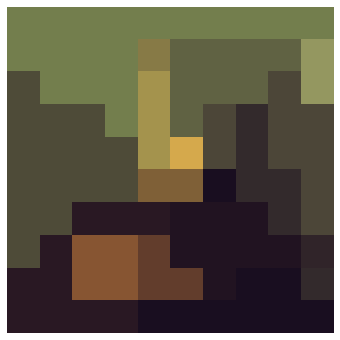

Iteration 85000 , Score 2637.9606769536167


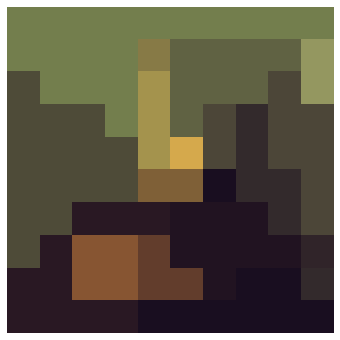

Iteration 86000 , Score 2637.9592585002874


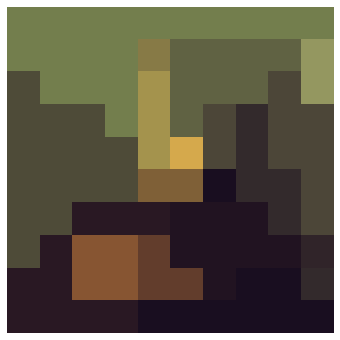

Iteration 87000 , Score 2637.958700059335


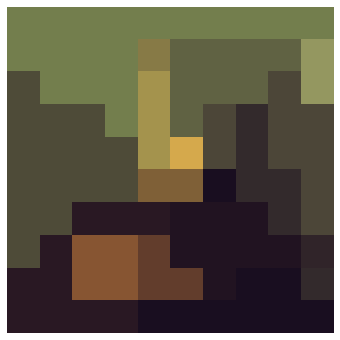

Iteration 88000 , Score 2637.8694188248905


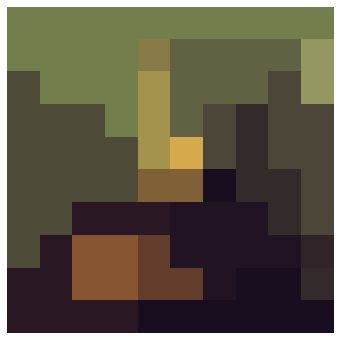

Iteration 89000 , Score 2637.864078935682


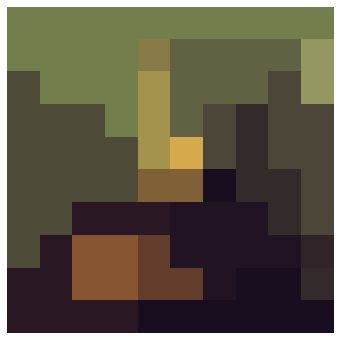

Iteration 90000 , Score 2637.8634145214987


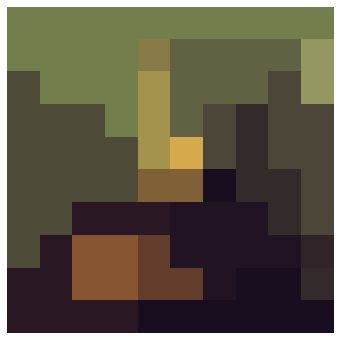

Iteration 91000 , Score 2637.8534647949145


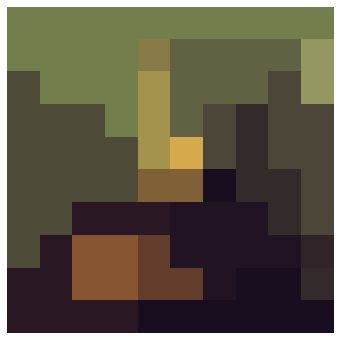

Iteration 92000 , Score 2637.852815676798


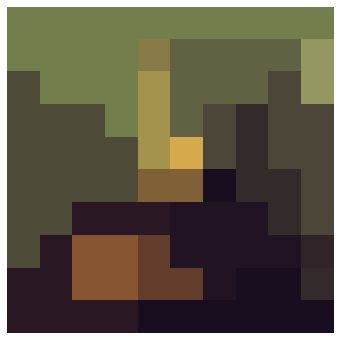

Iteration 93000 , Score 2637.852078664442


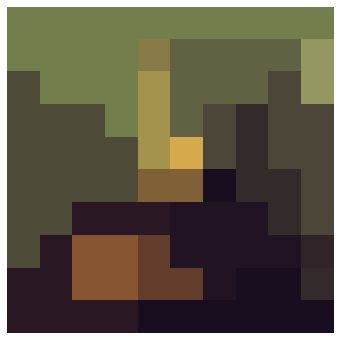

Iteration 94000 , Score 2637.8507646969247


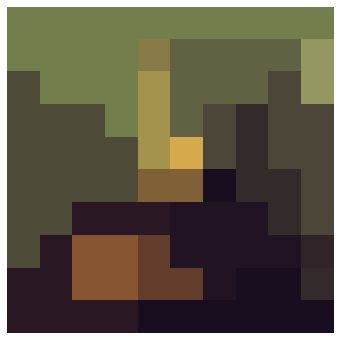

Iteration 95000 , Score 2637.8485698986615


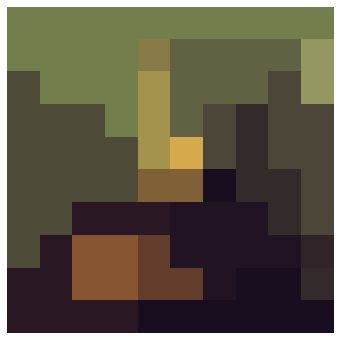

Iteration 96000 , Score 2637.84491669545


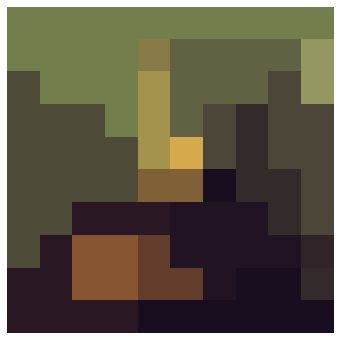

Iteration 97000 , Score 2637.8410397092075


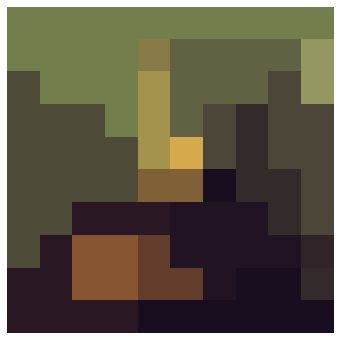

Iteration 98000 , Score 2637.8339658936916


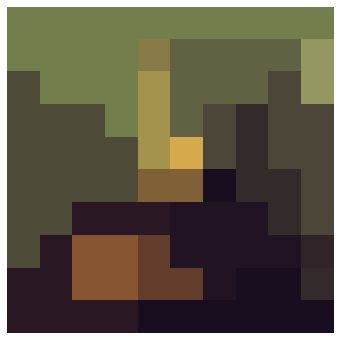

Iteration 99000 , Score 2637.814172084386


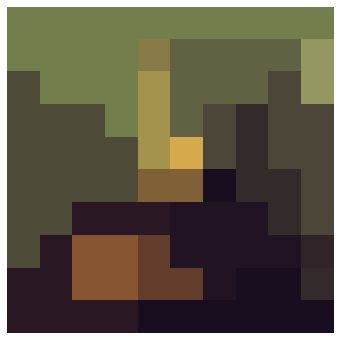

(2637.8137199806965,
 (array([10.        ,  0.        ,  0.        ,  6.75991586,  0.        ,
          3.39056961,  9.9297186 ,  9.0787291 ,  2.57787208,  2.5420938 ,
         10.        ,  7.17785656,  0.46047289,  0.        ,  2.14268023,
          3.07767975,  5.93779819,  3.68470269, 10.        ,  0.        ,
          0.        ,  9.46186209, 10.        ,  8.87835924]),
  array([ 7.10308566,  1.97366313,  9.82846952,  9.0293845 ,  7.7231921 ,
          6.09454045,  9.22641547,  0.90909634,  0.        ,  8.95916204,
          9.42935739,  2.39169649,  3.897104  ,  5.47096559,  0.        ,
          6.15912757,  5.15687051,  0.        ,  0.        ,  7.1938833 ,
          0.        , 10.        ,  2.10860015,  0.        ]),
  array([ 41.27184602, 227.88272977,  76.48991112,  25.18478515,
         255.        , 213.13521039, 114.71066334, 219.85343587]),
  array([ 23.95719375, 145.78877764,  69.76166206,  13.7904923 ,
         162.17423981, 168.9104567 , 125.84557399, 231.23841248]

In [114]:
es(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(10, 10), chromosome_length=8, population_size=1, 
       number_of_offspring=20, number_of_iterations=100000, expanding_interval=1000, mutation_prob=0.01,
       sigma_x=10.0, sigma_rgb=10.0, tau=1/np.sqrt(2*3), tau_0=1/np.sqrt(2*np.sqrt(3)), clip=True, log_frequency=1)

Iteration 10000 , Score 3654.866391604252


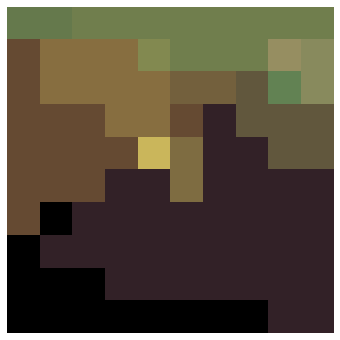

Iteration 20000 , Score 3357.951207246507


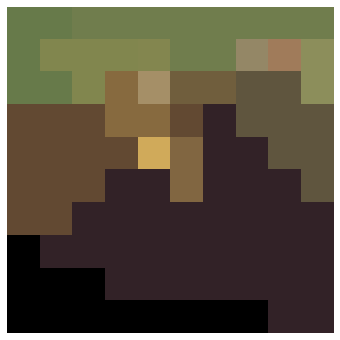

Iteration 30000 , Score 3244.7821886419156


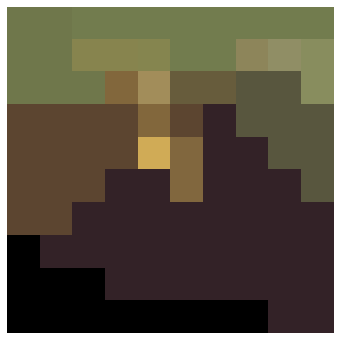

Iteration 40000 , Score 3162.537261117639


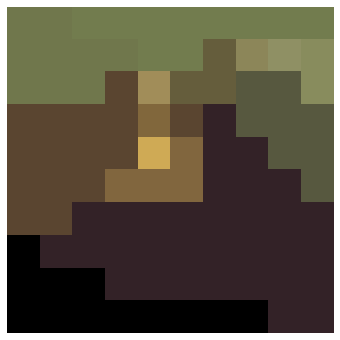

Iteration 50000 , Score 3121.0643739818083


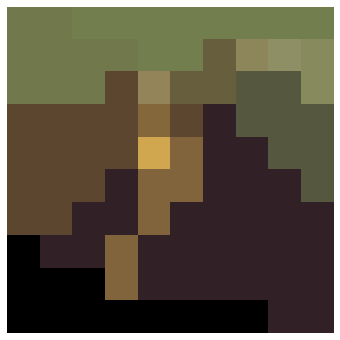

Iteration 60000 , Score 3103.9359506398705


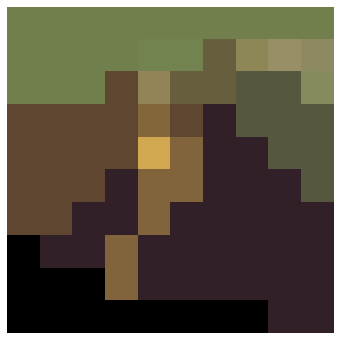

Iteration 70000 , Score 3095.4707502497645


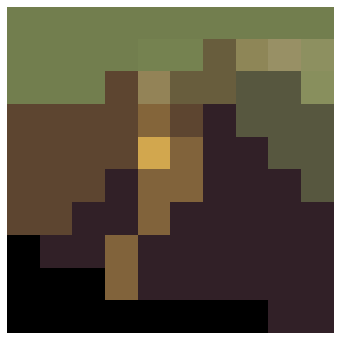

Iteration 80000 , Score 3095.032859429464


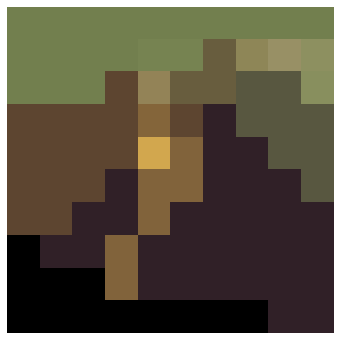

Iteration 90000 , Score 3095.000206058513


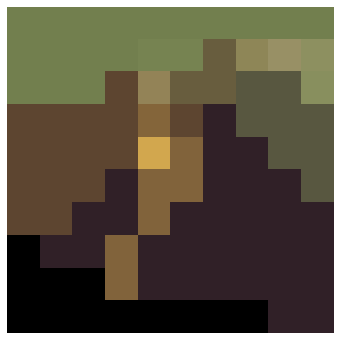

Iteration 100000 , Score 3094.9776685868223


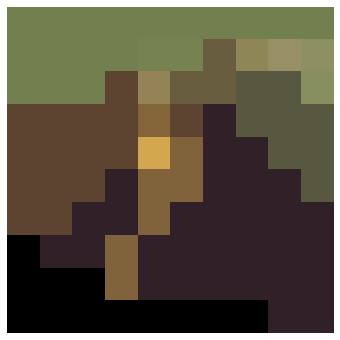

Iteration 110000 , Score 3094.9705414315467


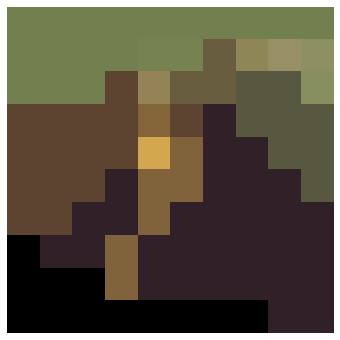

Iteration 120000 , Score 3094.966676270464


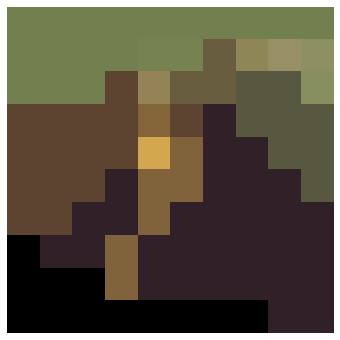

Iteration 130000 , Score 3094.966184216016


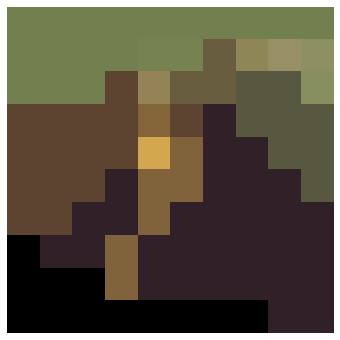

Iteration 140000 , Score 3093.961578673448


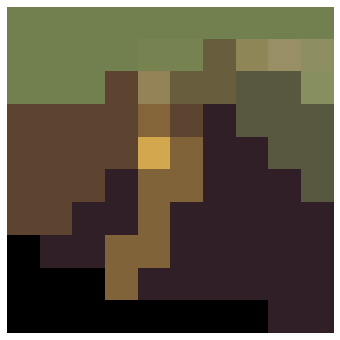

Iteration 150000 , Score 3093.927014473226


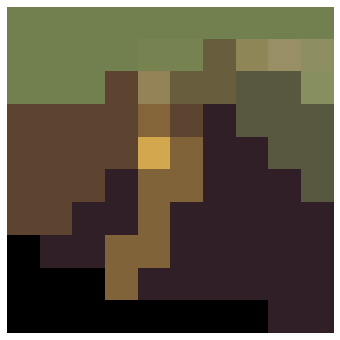

Iteration 160000 , Score 3093.8924114157853


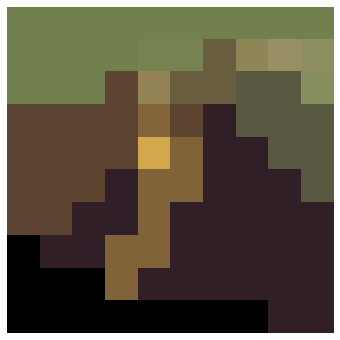

Iteration 170000 , Score 3093.880345519013


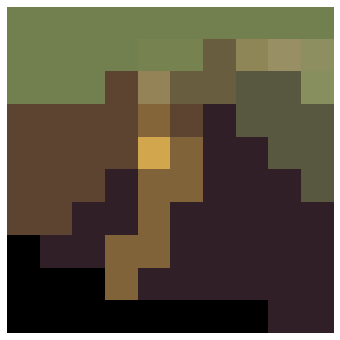

Iteration 180000 , Score 3080.264775811303


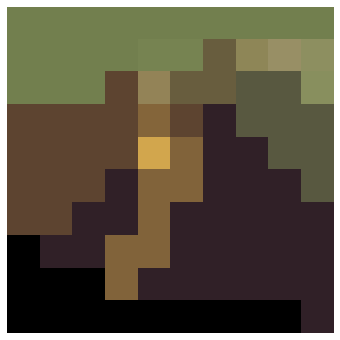

Iteration 190000 , Score 3080.1614876500075


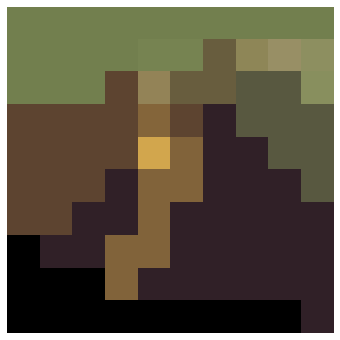

(3062.079837532662,
 (array([ 0.        ,  0.        ,  9.33397262, 10.        ,  3.02943186,
          6.30346648,  1.72966699,  9.83371519, 10.        ,  0.        ,
          9.23940174,  0.        , 10.        , 10.        ,  8.61074811,
          9.03477685,  0.0100973 , 10.        ,  9.62485067,  0.        ,
          0.        ,  4.4572806 ,  2.15404543,  5.17019156]),
  array([ 0.        ,  6.8640167 ,  0.        ,  0.        ,  2.04496236,
          1.9472606 ,  0.        ,  1.48258899,  5.69173392,  0.        ,
          0.        ,  6.99669439,  0.        , 10.        ,  0.17851151,
          0.        ,  7.40559631,  9.39723004,  0.        ,  2.57439687,
          0.        ,  0.        ,  9.98486122,  5.21006621]),
  array([  0.9508056 , 255.        , 127.35952516, 184.18969011,
         232.93145844,  48.16471392, 158.20689649, 210.30693419]),
  array([ 82.20273094, 255.        , 143.62396503,  54.65255232,
         255.        ,  31.73187763, 242.93226866, 164.84906925])

In [117]:
es(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(10, 10), chromosome_length=8, population_size=1, 
       number_of_offspring=1, number_of_iterations=200000, expanding_interval=10000, mutation_prob=0.01,
       sigma_x=10.0, sigma_rgb=10.0, tau=1/np.sqrt(2*3), tau_0=1/np.sqrt(2*np.sqrt(3)), clip=True, log_frequency=1)

Iteration 10000 , Score 4413.307971869234


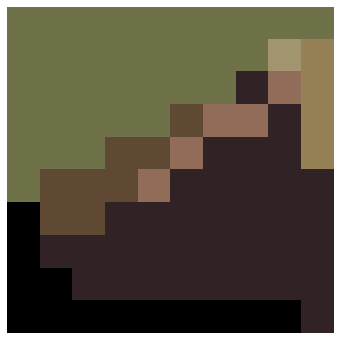

Iteration 20000 , Score 4386.689367705223


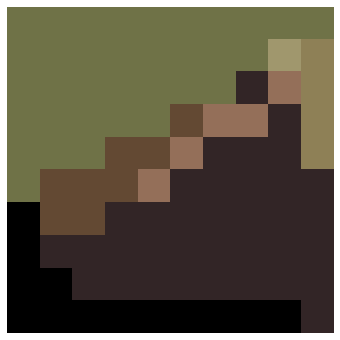

Iteration 30000 , Score 4363.785140227161


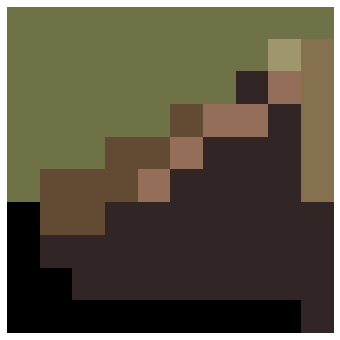

Iteration 40000 , Score 4363.734418718437


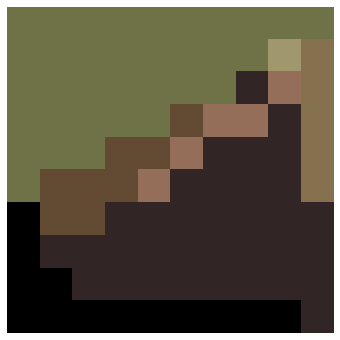

Iteration 50000 , Score 4363.533747015796


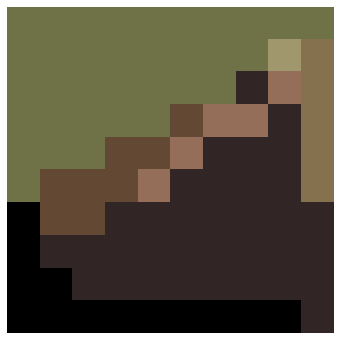

Iteration 60000 , Score 4327.39242823001


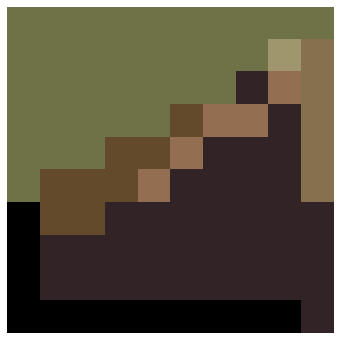

Iteration 70000 , Score 4327.299780750899


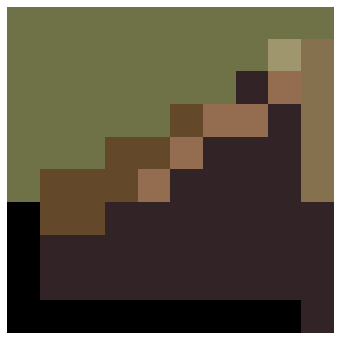

Iteration 80000 , Score 4327.215954960745


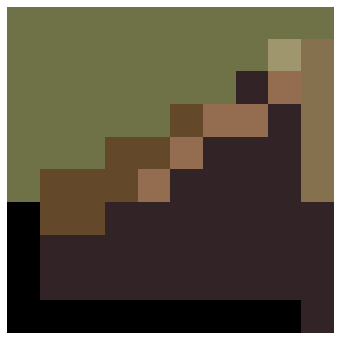

Iteration 90000 , Score 4327.201648204602


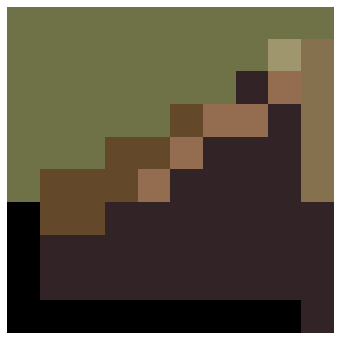

Iteration 100000 , Score 4327.175102898169


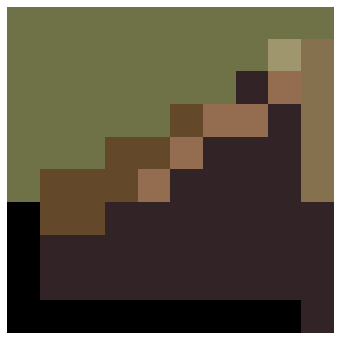

Iteration 110000 , Score 4327.146400287398


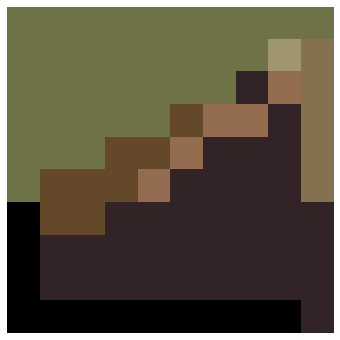

Iteration 120000 , Score 4326.775752032265


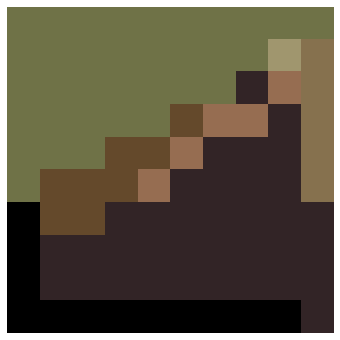

Iteration 130000 , Score 4326.764917158756


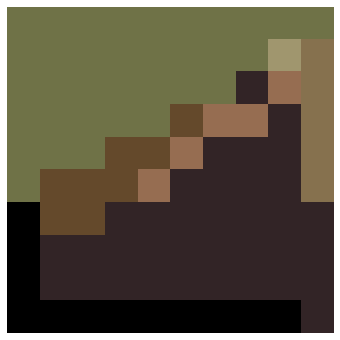

Iteration 140000 , Score 4326.764101366978


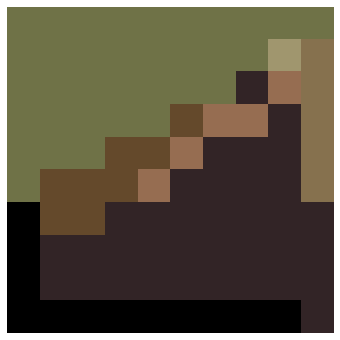

Iteration 150000 , Score 4326.756878742744


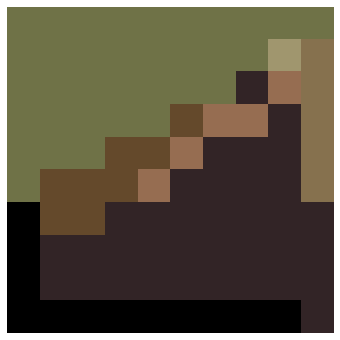

Iteration 160000 , Score 4326.429685051728


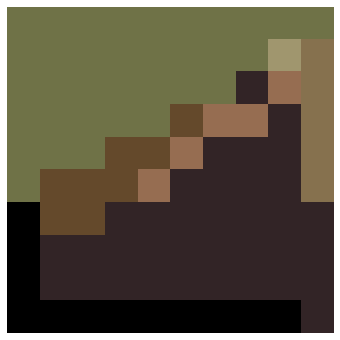

Iteration 170000 , Score 4326.259999150527


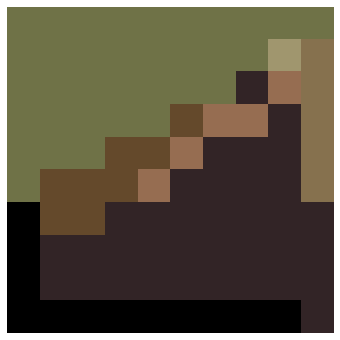

Iteration 180000 , Score 4326.2575294809485


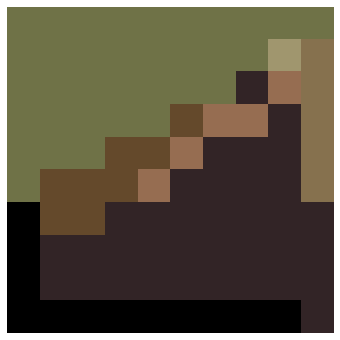

Iteration 190000 , Score 4326.2135312183655


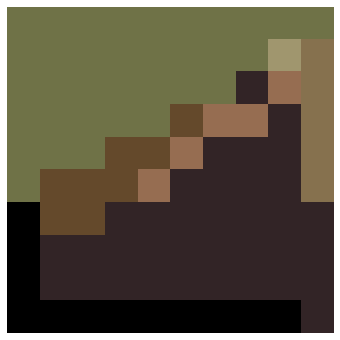

(4326.213318926609,
 (array([ 7.95630982, 10.        ,  9.11475023,  0.        ,  0.        ,
          7.95928356,  5.90945215,  0.        , 10.        ,  1.76981368,
          7.36633493,  8.25471186,  0.        ,  0.        ,  9.91039108,
         10.        ,  0.        ,  0.53466862,  0.        ,  4.70281258,
          2.8140559 ,  0.        , 10.        ,  8.95519195]),
  array([ 9.98690612,  2.15943673,  0.        , 10.        ,  9.9975813 ,
          9.87762276,  6.10211888,  3.38956091,  8.25920747,  0.        ,
          6.3941302 ,  6.26586341,  5.20271091,  0.        ,  0.        ,
          1.14650637,  4.72513361,  7.28507633,  4.27936803,  0.        ,
          2.08372951,  7.86938052,  9.1851909 ,  0.        ]),
  array([ 84.55926751, 134.71870626,  63.70275289,  20.37770819,
         110.59838344, 100.19340503, 255.        ,  49.61522247]),
  array([ 76.72280996,   0.        , 255.        , 200.93338517,
         113.73149024,  73.18997382, 255.        ,  36.304448  ])

In [122]:
es(F_sum((np.array(r), np.array(g), np.array(b))), picture_shape=(10, 10), chromosome_length=8, population_size=1, 
       number_of_offspring=1, number_of_iterations=200000, expanding_interval=10000, mutation_prob=0.01,
       sigma_x=10.0, sigma_rgb=10.0, tau=1/np.sqrt(2*3), tau_0=1/np.sqrt(2*np.sqrt(3)), clip=True, log_frequency=1)

Iteration 1000 , Score 12639.871817478892


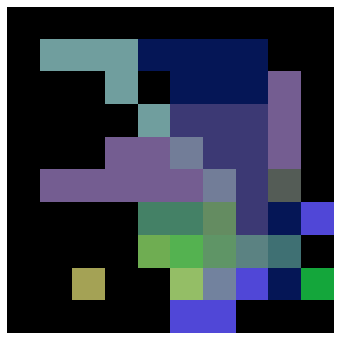

Iteration 2000 , Score 12639.871817478892


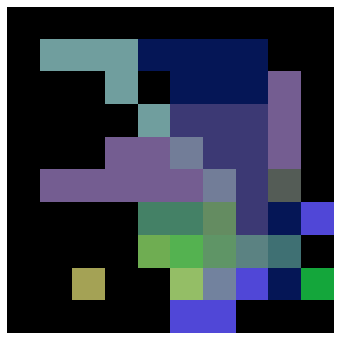

Iteration 3000 , Score 12639.871817478892


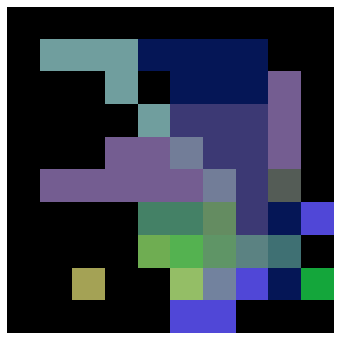

Iteration 4000 , Score 12639.871817478892


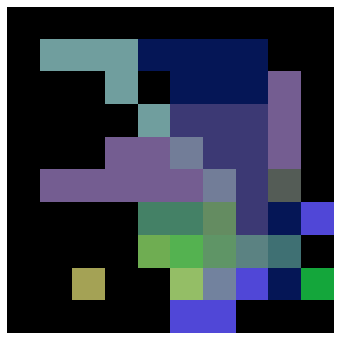

Iteration 5000 , Score 12639.871817478892


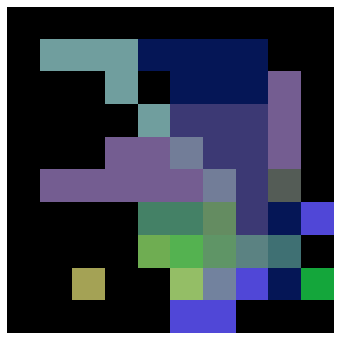

Iteration 6000 , Score 12639.871817478892


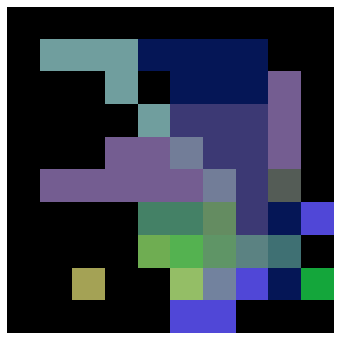

Iteration 7000 , Score 12639.871817478892


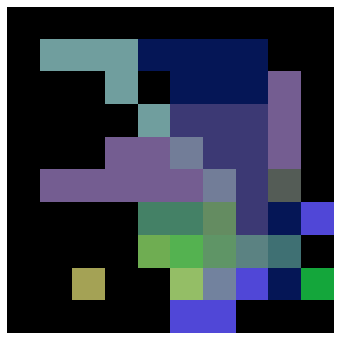

Iteration 8000 , Score 12639.871817478892


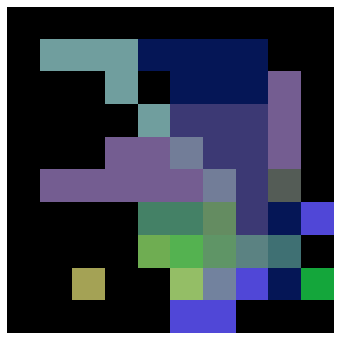

Iteration 9000 , Score 12639.871817478892


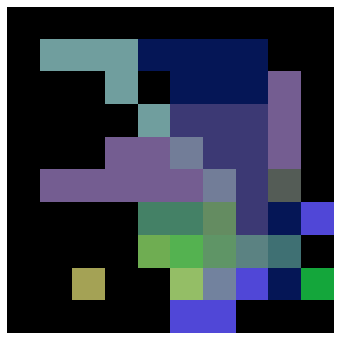

(11743.427570616948,
 (array([8.86846948, 0.31751972, 7.20069826, 1.51310671, 9.8621946 ,
         5.96805623, 9.85949964, 4.10350426, 6.06467067, 0.91368328,
         2.40255744, 8.64241467, 8.52504828, 6.43224451, 0.28901492,
         3.14482907, 5.59366012, 8.93334971, 3.8619227 , 7.45409102,
         8.79585769, 8.35072351, 9.38696966, 0.96327562]),
  array([1.35181924, 4.97038023, 7.53597737, 6.66738645, 8.25697137,
         5.42756502, 5.0188099 , 9.0050472 , 9.834559  , 0.92543406,
         0.14182162, 8.18928886, 8.24953338, 6.40416223, 1.28590981,
         6.83452593, 8.6415249 , 6.96737056, 0.95534812, 0.08190546,
         9.92581096, 4.80904589, 4.58881649, 8.50014196]),
  array([115.889678  ,  20.1235083 ,  79.70250158, 111.66988641,
          45.43143932, 148.49855393,   4.95644676, 163.85696023]),
  array([ 92.55646005, 166.12028759,  70.66528913, 158.11578778,
          51.81662989, 189.51562683,  21.64203503, 162.02881108]),
  array([145.33912589,  58.85811157, 214.7726

In [119]:
es(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(10, 10), chromosome_length=8, population_size=10, 
       number_of_offspring=20, number_of_iterations=10000, expanding_interval=1000, mutation_prob=0.01,
       sigma_x=10.0, sigma_rgb=10.0, tau=1/np.sqrt(2*3), tau_0=1/np.sqrt(2*np.sqrt(3)), clip=True, log_frequency=1)

Iteration 1000 , Score 13980.89361048841


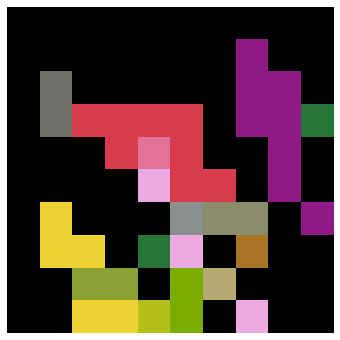

Iteration 2000 , Score 14759.300012721302


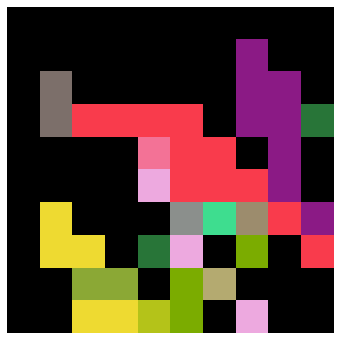

Iteration 3000 , Score 14759.300012721302


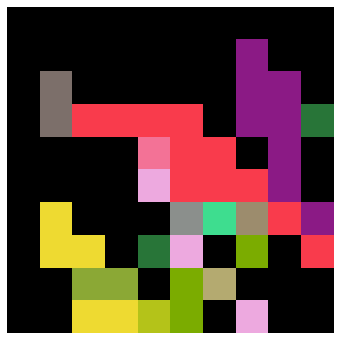

Iteration 4000 , Score 14865.308424852428


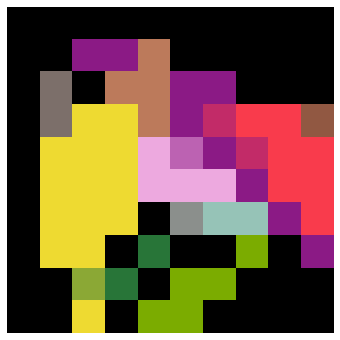

Iteration 5000 , Score 14865.308424852428


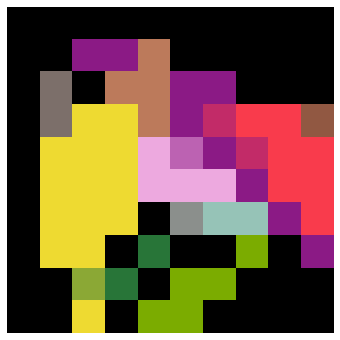

Iteration 6000 , Score 14865.308424852428


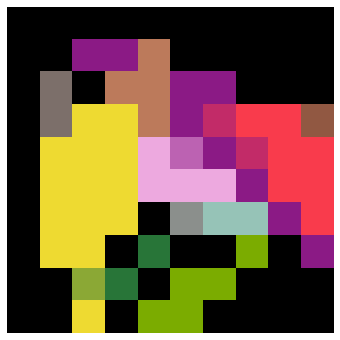

Iteration 7000 , Score 14865.308424852428


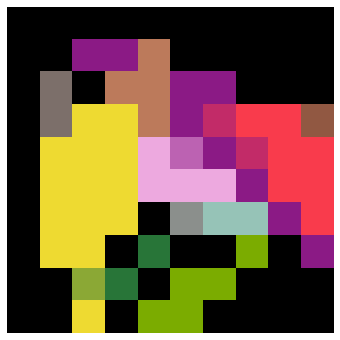

Iteration 8000 , Score 14865.308424852428


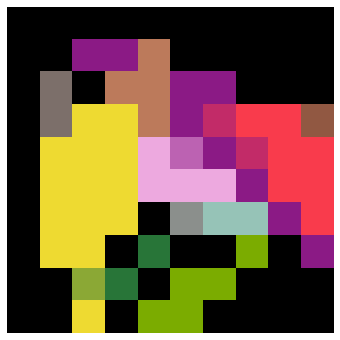

Iteration 9000 , Score 14865.308424852428


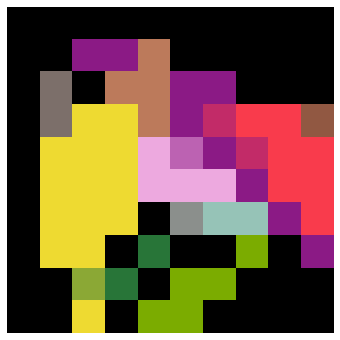

(11001.003124111674,
 (array([ 0.18007579,  1.53398503,  1.21263403,  9.54748597,  0.14134591,
          5.85414036,  0.81347976, 10.        ,  1.44594571,  5.58655653,
          8.2023584 ,  4.92133439,  1.9874508 ,  0.        ,  5.03732671,
          1.81839991,  6.54814784,  7.6160424 ,  7.69177207,  4.30863276,
          3.58520589, 10.        ,  4.8245819 , 10.        ]),
  array([ 0.34068438,  1.9829751 ,  3.72878614,  7.79971202,  0.30763451,
          1.28272824, 10.        ,  2.23053067,  8.3701756 ,  5.16030285,
          5.23394334,  7.85491891, 10.        ,  4.05301703,  0.        ,
         10.        ,  8.71971261,  5.90668615,  5.83857465,  7.10558808,
          2.91242591,  8.08018525,  2.3035204 ,  2.63503004]),
  array([124.35070889, 138.73831401,  40.33593571,  62.49005008,
         238.04168486, 122.70834176, 237.22569176, 248.84610616]),
  array([111.0739643 ,  26.27164053, 117.29417488, 220.9864956 ,
         218.3758322 , 171.75250483, 169.03398424,  59.43190073]

In [120]:
es(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(10, 10), chromosome_length=8, population_size=10, 
       number_of_offspring=20, number_of_iterations=10000, expanding_interval=1000, mutation_prob=0.05,
       sigma_x=10.0, sigma_rgb=10.0, tau=1/np.sqrt(2*3), tau_0=1/np.sqrt(2*np.sqrt(3)), clip=True, log_frequency=1)

Iteration 1000 , Score 12355.454493243466


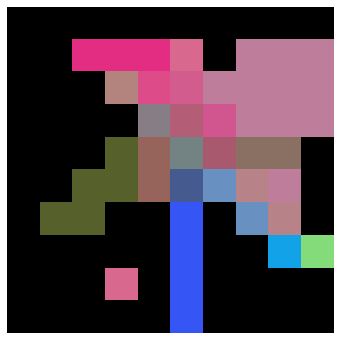

Iteration 2000 , Score 12355.454493243466


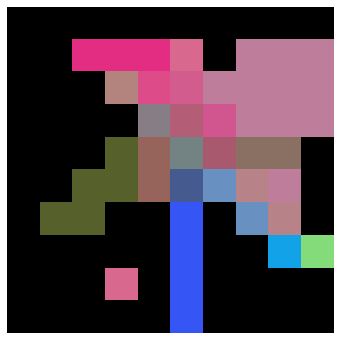

Iteration 3000 , Score 12355.454493243466


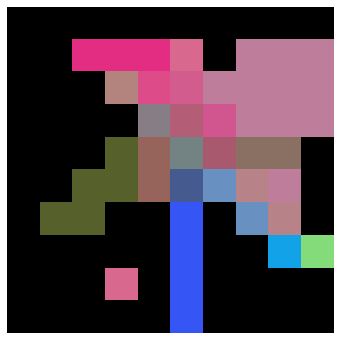

Iteration 4000 , Score 13231.286447618888


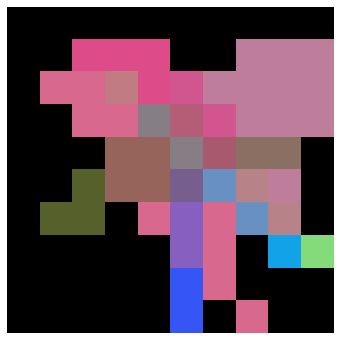

Iteration 5000 , Score 13075.081646023158


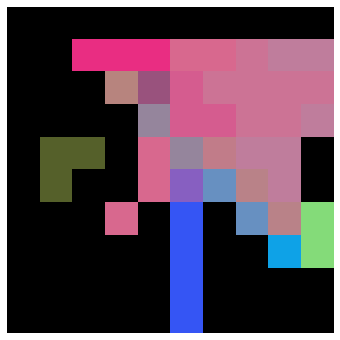

Iteration 6000 , Score 13075.081646023158


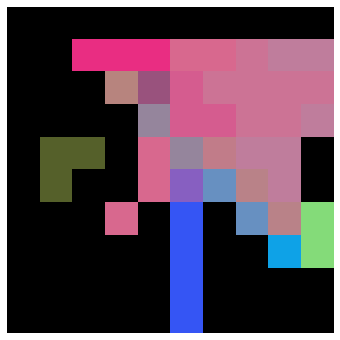

Iteration 7000 , Score 13075.081646023158


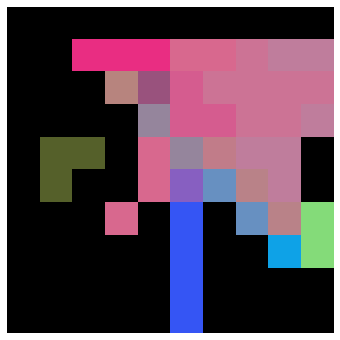

Iteration 8000 , Score 13075.081646023158


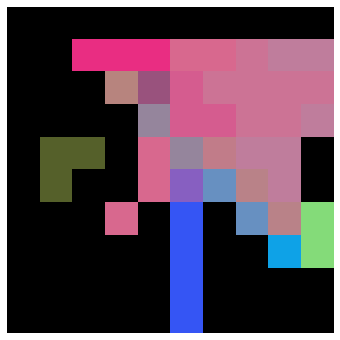

Iteration 9000 , Score 13075.081646023158


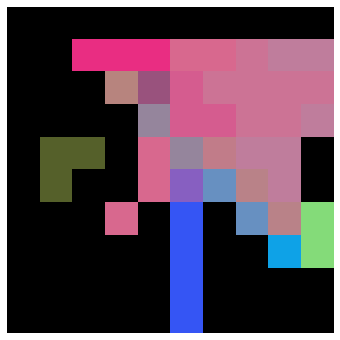

Iteration 10000 , Score 13075.081646023158


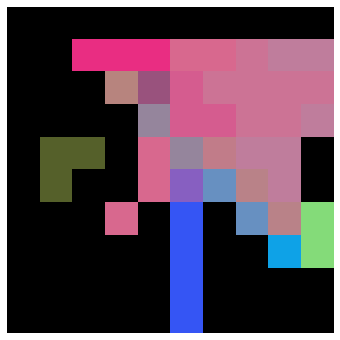

Iteration 11000 , Score 14365.934744897912


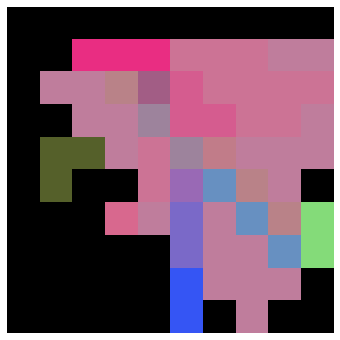

Iteration 12000 , Score 14365.934744897912


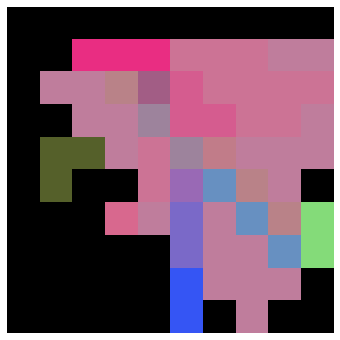

Iteration 13000 , Score 14365.934744897912


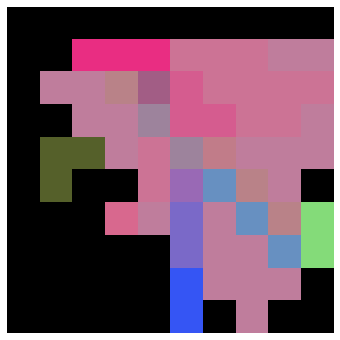

Iteration 14000 , Score 14365.934744897912


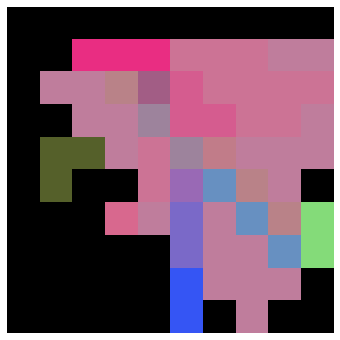

Iteration 15000 , Score 14365.934744897912


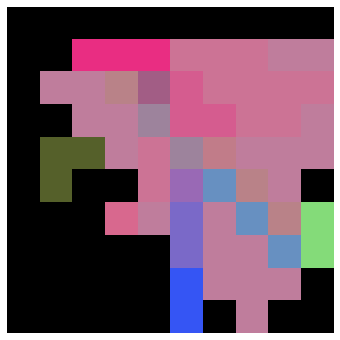

Iteration 16000 , Score 14365.934744897912


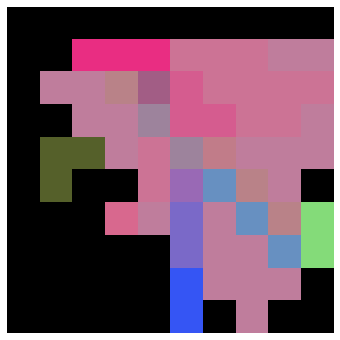

Iteration 17000 , Score 14365.934744897912


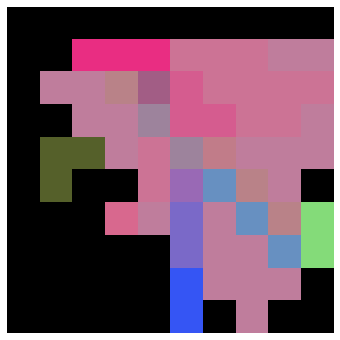

Iteration 18000 , Score 14365.934744897912


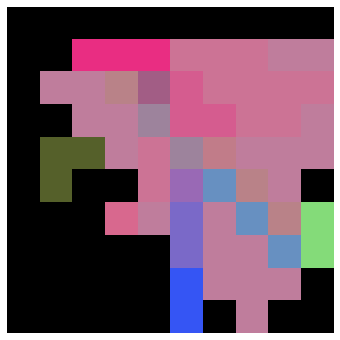

Iteration 19000 , Score 14365.934744897912


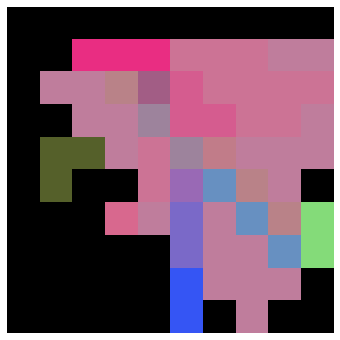

Iteration 20000 , Score 14365.934744897912


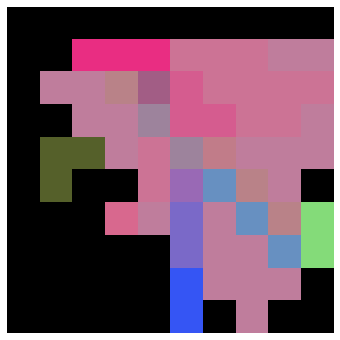

Iteration 21000 , Score 14365.934744897912


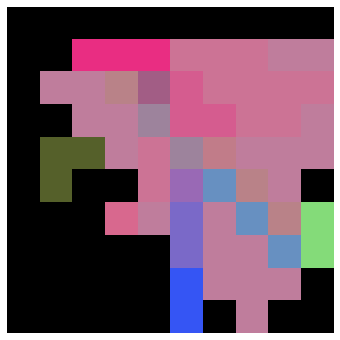

Iteration 22000 , Score 14365.934744897912


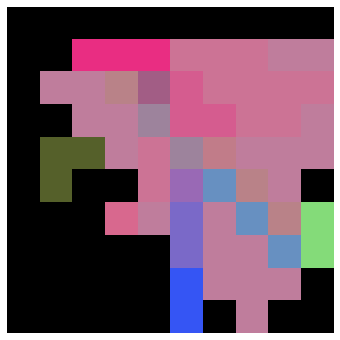

Iteration 23000 , Score 14365.934744897912


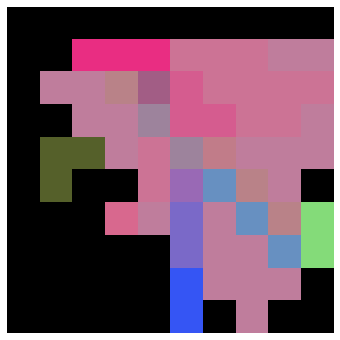

Iteration 24000 , Score 14365.934744897912


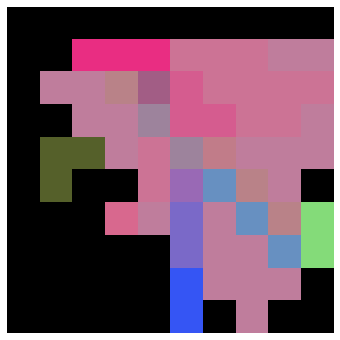

Iteration 25000 , Score 14365.934744897912


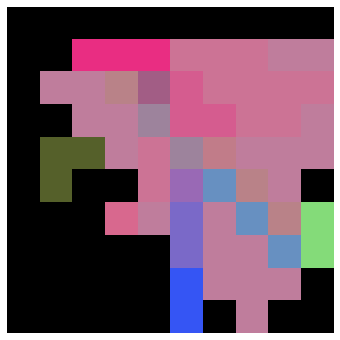

Iteration 26000 , Score 14365.934744897912


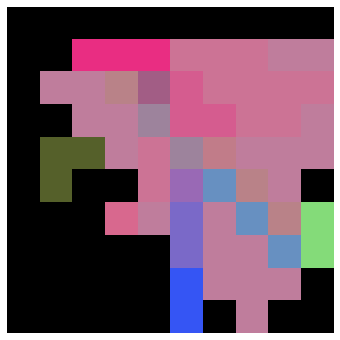

Iteration 27000 , Score 14365.934744897912


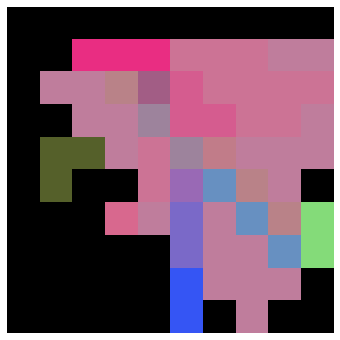

Iteration 28000 , Score 14365.934744897912


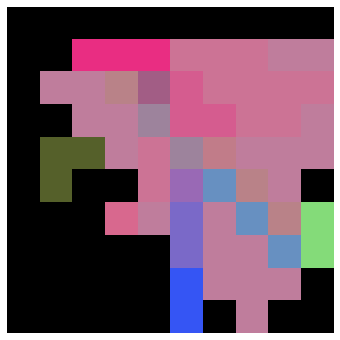

Iteration 29000 , Score 14365.934744897912


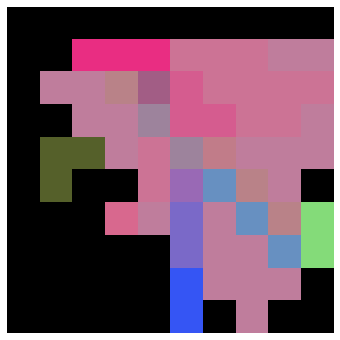

Iteration 30000 , Score 14365.934744897912


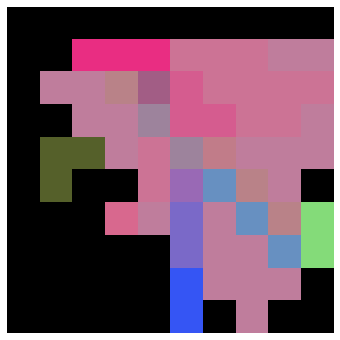

Iteration 31000 , Score 14365.934744897912


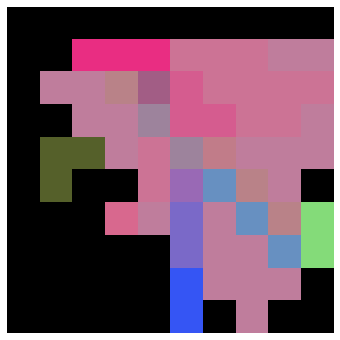

Iteration 32000 , Score 14365.934744897912


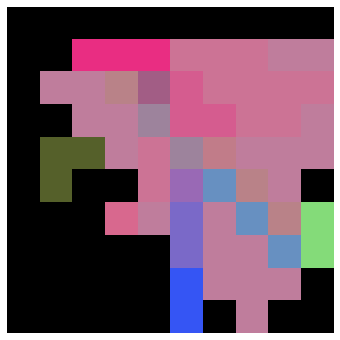

Iteration 33000 , Score 14365.934744897912


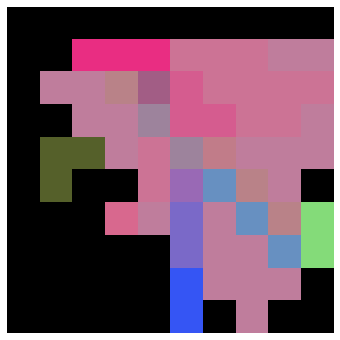

Iteration 34000 , Score 14365.934744897912


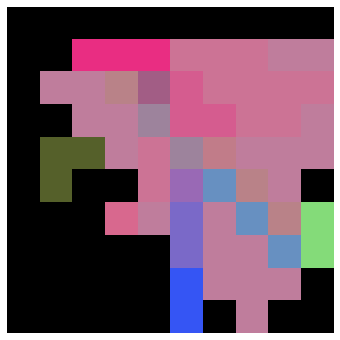

Iteration 35000 , Score 14365.934744897912


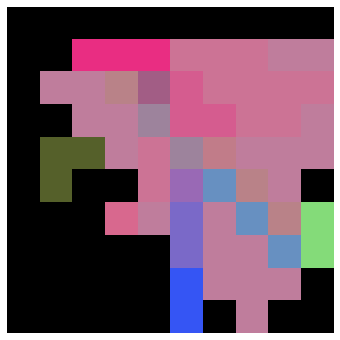

Iteration 36000 , Score 14365.934744897912


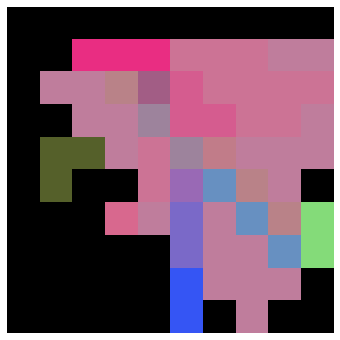

Iteration 37000 , Score 14365.934744897912


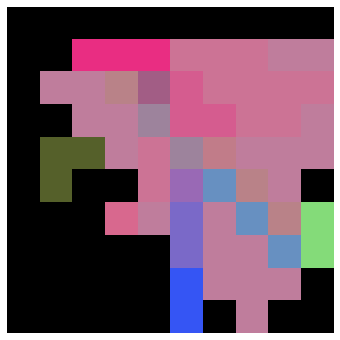

Iteration 38000 , Score 14365.934744897912


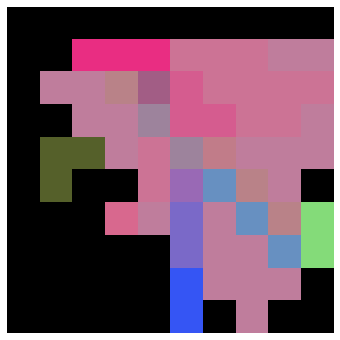

Iteration 39000 , Score 14365.934744897912


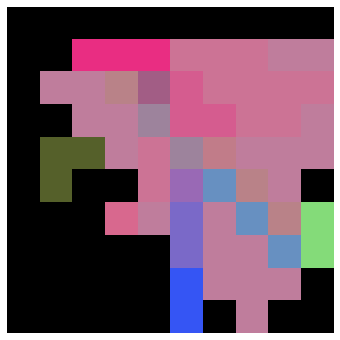

Iteration 40000 , Score 14365.934744897912


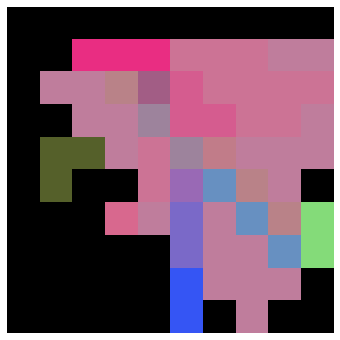

Iteration 41000 , Score 14365.934744897912


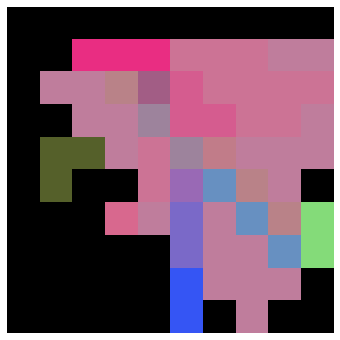

Iteration 42000 , Score 14365.934744897912


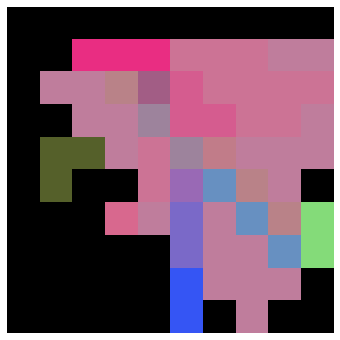

Iteration 43000 , Score 14365.934744897912


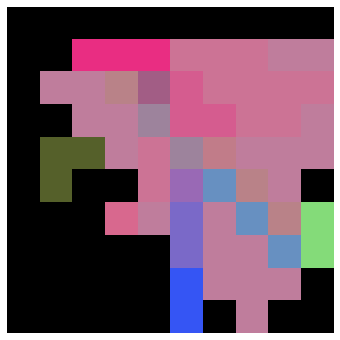

Iteration 44000 , Score 14365.934744897912


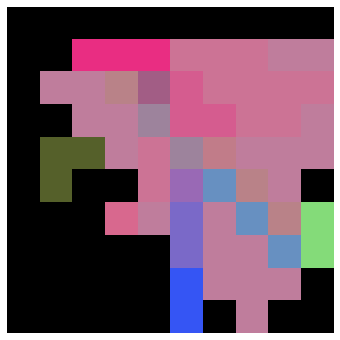

Iteration 45000 , Score 14365.934744897912


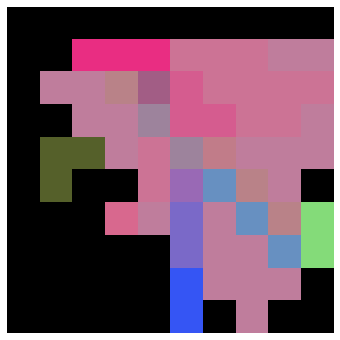

Iteration 46000 , Score 14365.934744897912


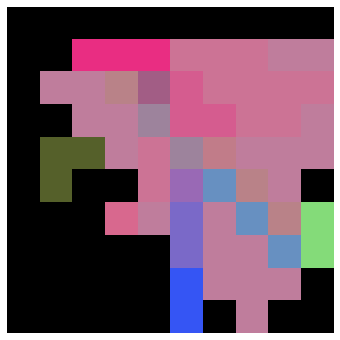

Iteration 47000 , Score 14365.934744897912


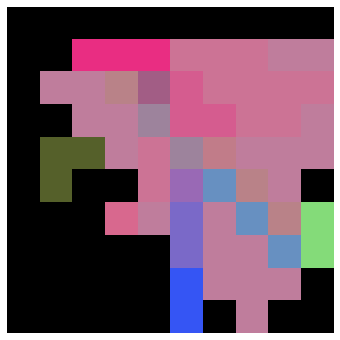

Iteration 48000 , Score 14365.934744897912


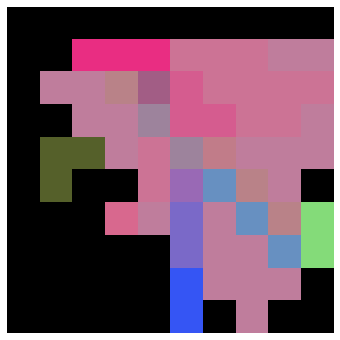

Iteration 49000 , Score 14365.934744897912


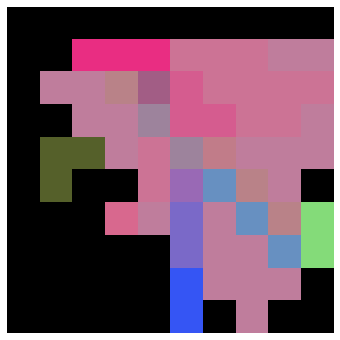

Iteration 50000 , Score 14365.934744897912


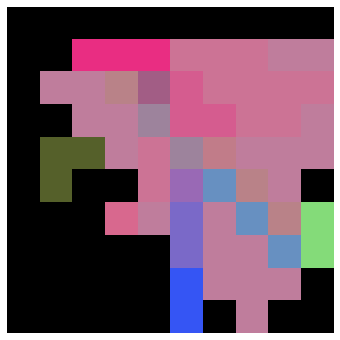

Iteration 51000 , Score 14365.934744897912


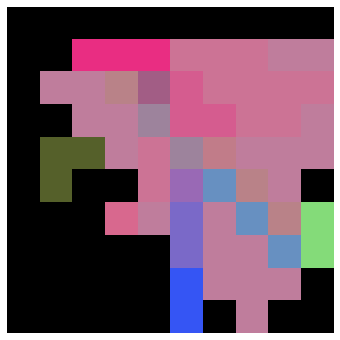

Iteration 52000 , Score 14365.934744897912


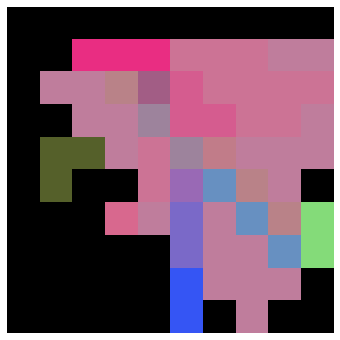

Iteration 53000 , Score 14365.934744897912


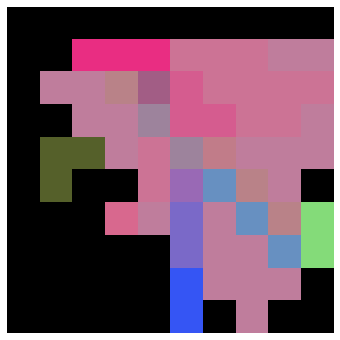

Iteration 54000 , Score 14365.934744897912


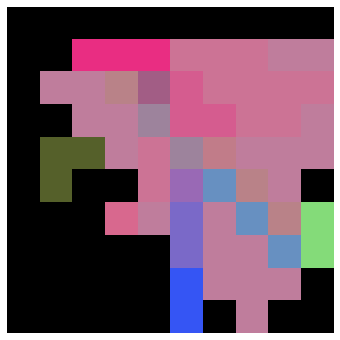

Iteration 55000 , Score 14365.934744897912


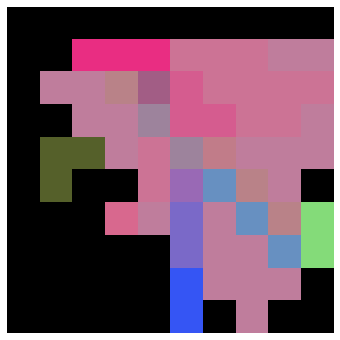

Iteration 56000 , Score 14365.934744897912


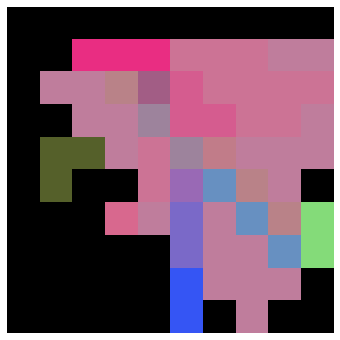

Iteration 57000 , Score 14365.934744897912


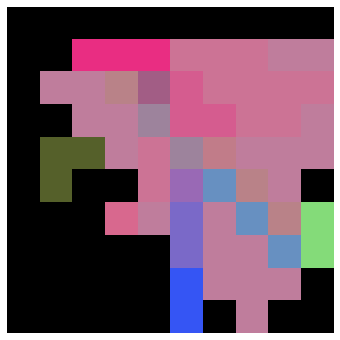

Iteration 58000 , Score 14365.934744897912


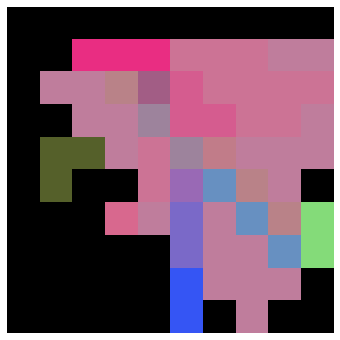

Iteration 59000 , Score 14365.934744897912


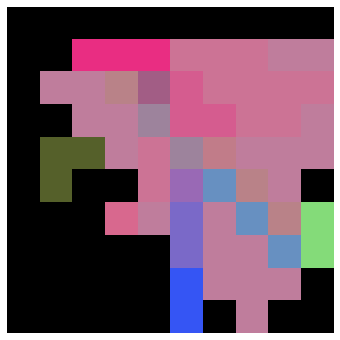

Iteration 60000 , Score 14365.934744897912


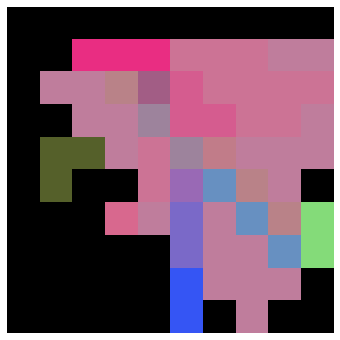

Iteration 61000 , Score 14365.934744897912


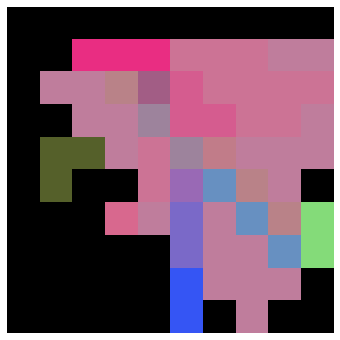

Iteration 62000 , Score 14365.934744897912


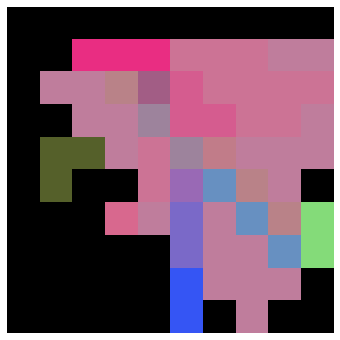

Iteration 63000 , Score 14365.934744897912


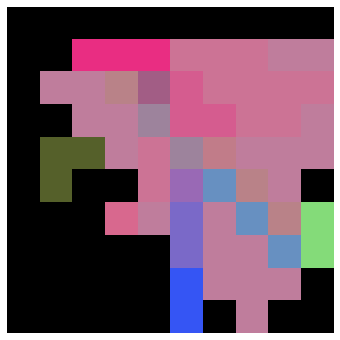

Iteration 64000 , Score 14365.934744897912


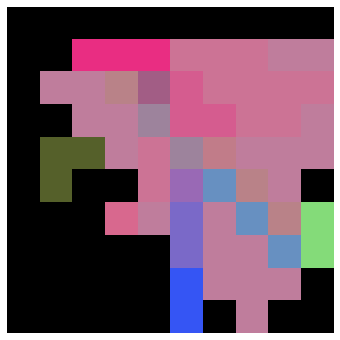

Iteration 65000 , Score 14365.934744897912


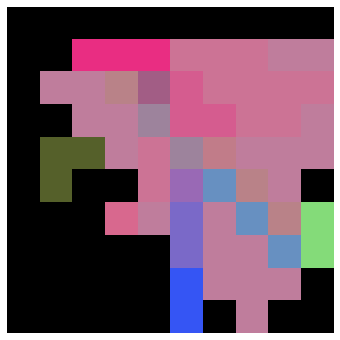

Iteration 66000 , Score 14365.934744897912


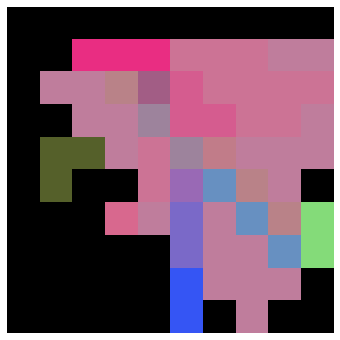

Iteration 67000 , Score 14365.934744897912


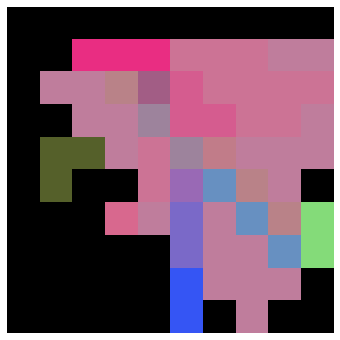

Iteration 68000 , Score 14365.934744897912


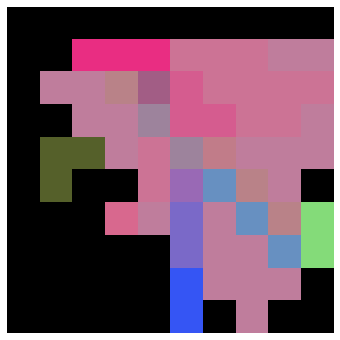

Iteration 69000 , Score 14365.934744897912


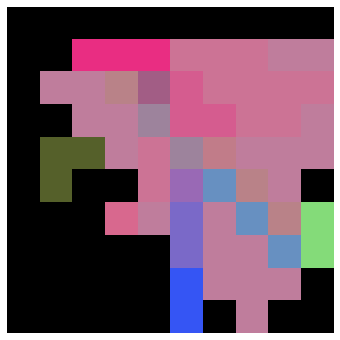

Iteration 70000 , Score 14365.934744897912


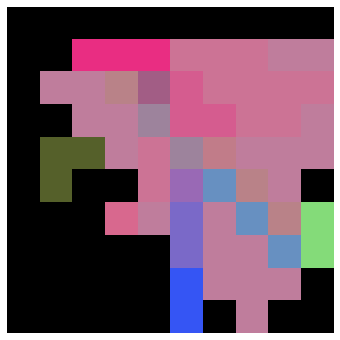

Iteration 71000 , Score 14365.934744897912


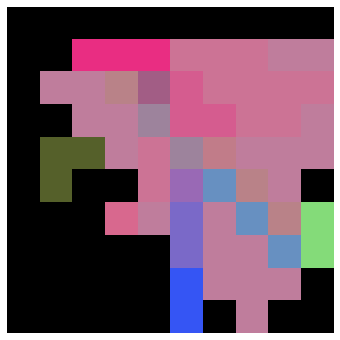

Iteration 72000 , Score 14365.934744897912


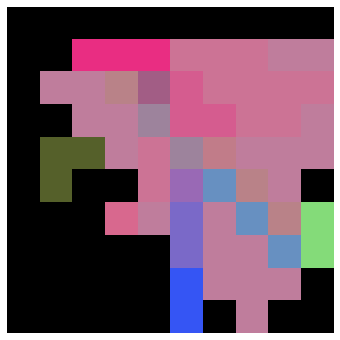

Iteration 73000 , Score 14365.934744897912


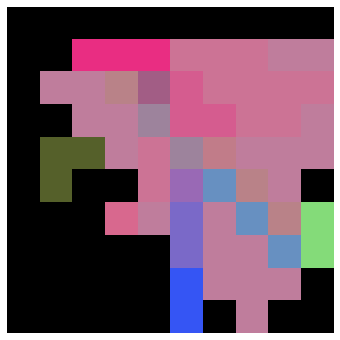

Iteration 74000 , Score 14365.934744897912


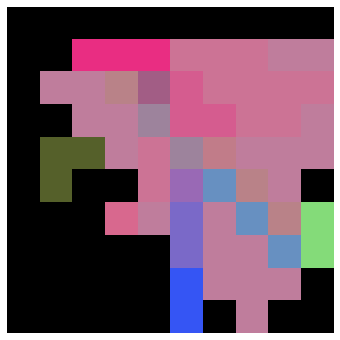

Iteration 75000 , Score 14365.934744897912


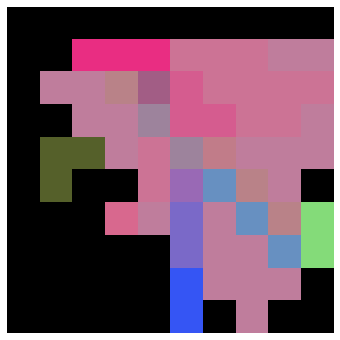

Iteration 76000 , Score 14365.934744897912


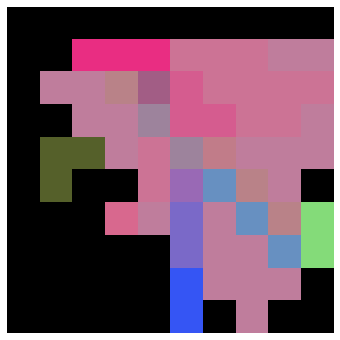

KeyboardInterrupt: 

In [121]:
es(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(10, 10), chromosome_length=8, population_size=10, 
       number_of_offspring=20, number_of_iterations=100000, expanding_interval=1000, mutation_prob=0.05,
       sigma_x=10.0, sigma_rgb=10.0, tau=1/np.sqrt(2*3), tau_0=1/np.sqrt(2*np.sqrt(3)), clip=True, log_frequency=1)

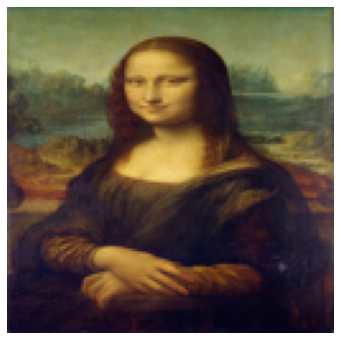

In [29]:
with Image.open("MonaLisa.jpg") as im:
    im = im.convert("RGB")
image128 = im.resize((128, 128))
r, g, b = image128.split()
draw_image(r, g, b)

Iteration 1000 , Score 1283056.8570172694


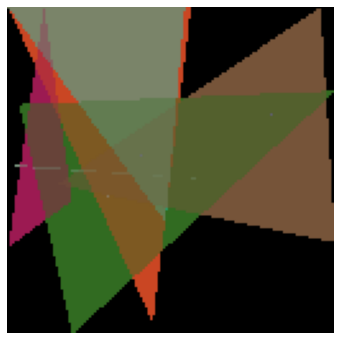

Iteration 2000 , Score 1049398.391967602


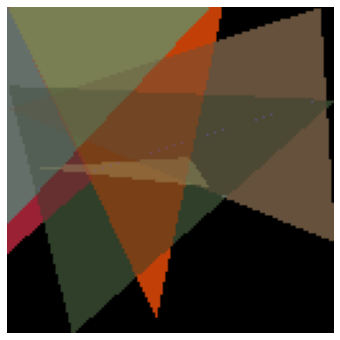

Iteration 3000 , Score 1001588.8544172148


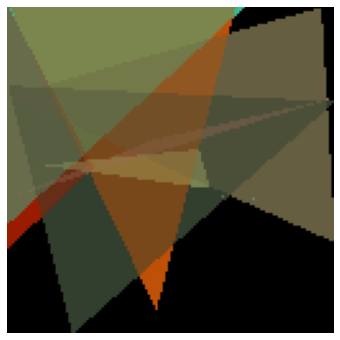

Iteration 4000 , Score 954075.9218753355


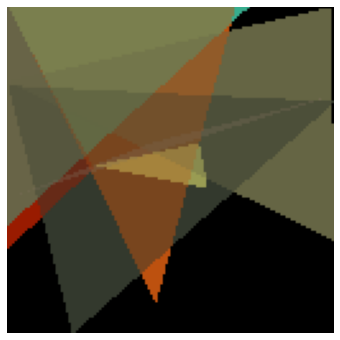

Iteration 5000 , Score 936830.2524351482


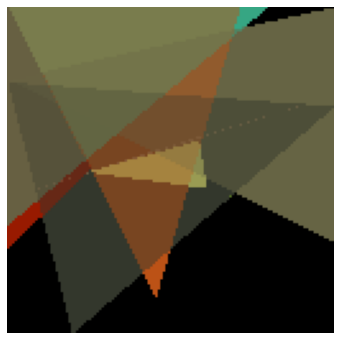

Iteration 6000 , Score 895597.7389155205


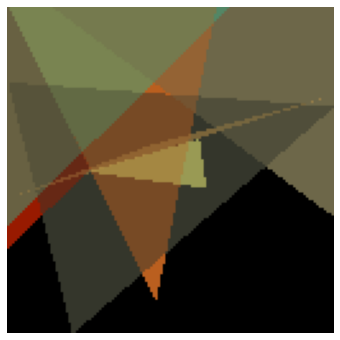

Iteration 7000 , Score 876266.0109561848


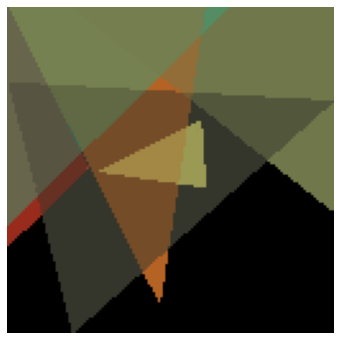

Iteration 8000 , Score 867182.4908370317


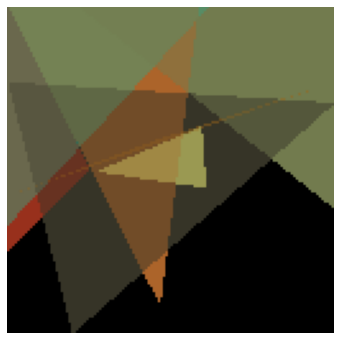

Iteration 9000 , Score 862484.1643261024


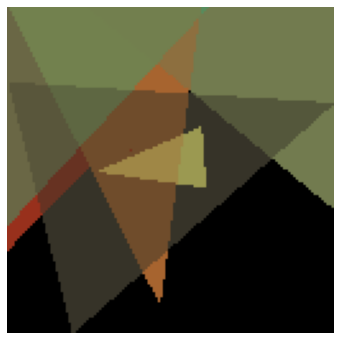

Iteration 10000 , Score 850232.8324708133


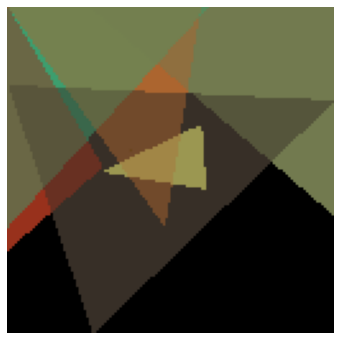

Iteration 11000 , Score 830582.985473509


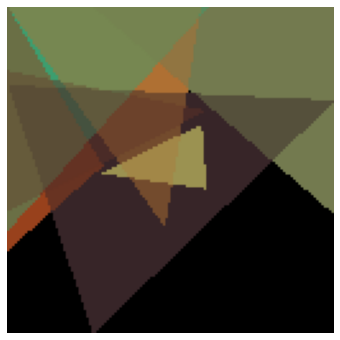

Iteration 12000 , Score 825042.9430982837


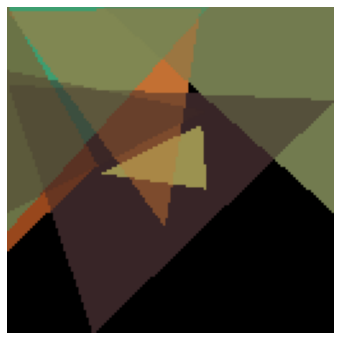

Iteration 13000 , Score 818366.4703191133


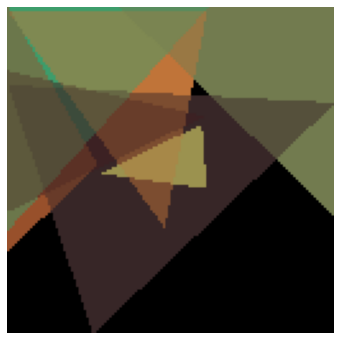

Iteration 14000 , Score 813491.6852889145


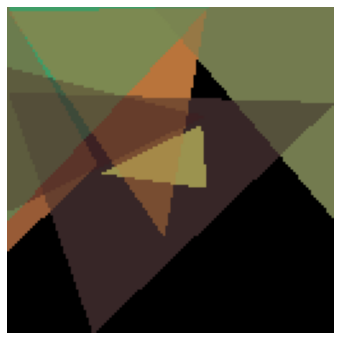

Iteration 15000 , Score 808488.1776781003


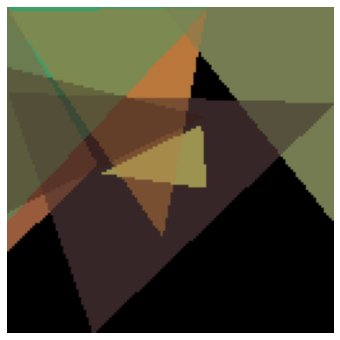

Iteration 16000 , Score 805131.9561268727


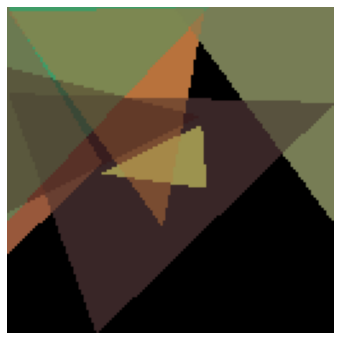

Iteration 17000 , Score 799408.2412025665


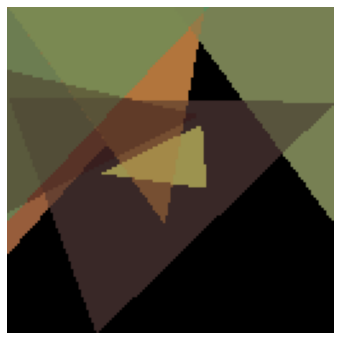

Iteration 18000 , Score 797045.2296046694


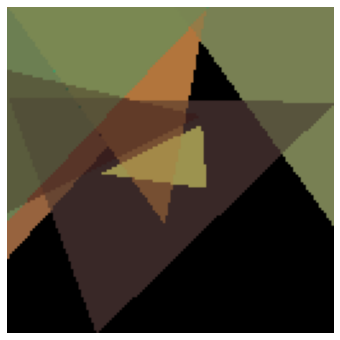

Iteration 19000 , Score 790288.9380324056


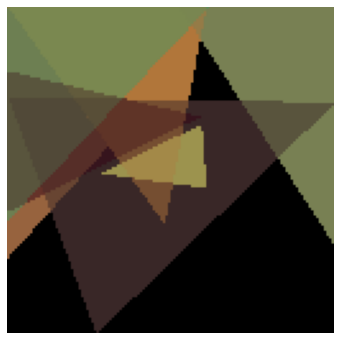

Iteration 20000 , Score 788767.5589339633


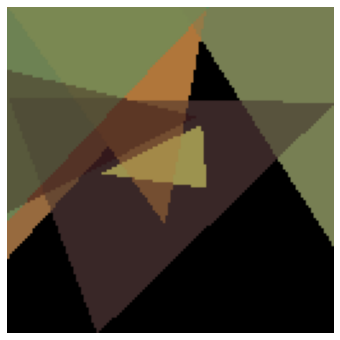

Iteration 21000 , Score 786036.2876450608


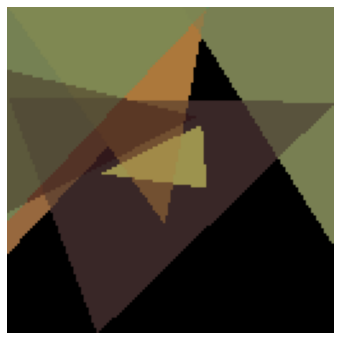

Iteration 22000 , Score 785192.5544048283


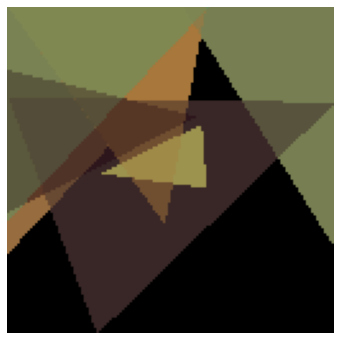

Iteration 23000 , Score 784867.4660181783


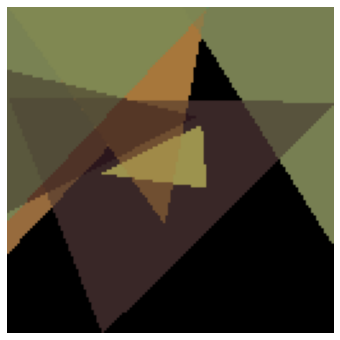

Iteration 24000 , Score 784679.9469158188


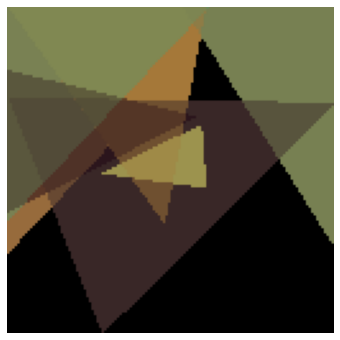

Iteration 25000 , Score 784582.391667265


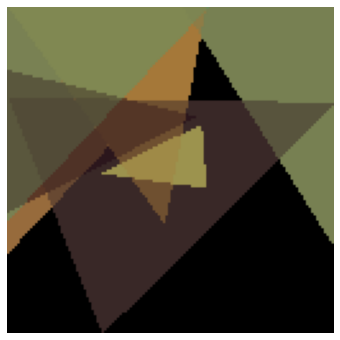

Iteration 26000 , Score 784369.5157493767


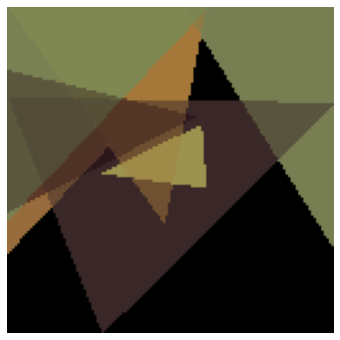

Iteration 27000 , Score 784359.2707783275


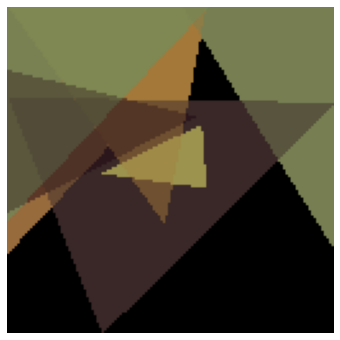

Iteration 28000 , Score 784313.0831125134


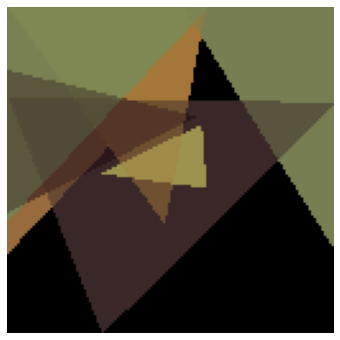

Iteration 29000 , Score 784308.0711691715


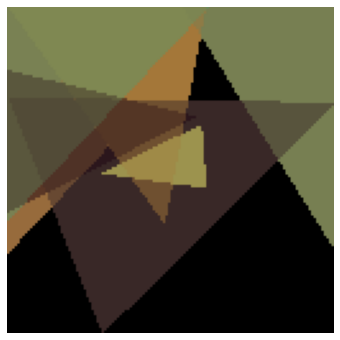

Iteration 30000 , Score 784293.2585029461


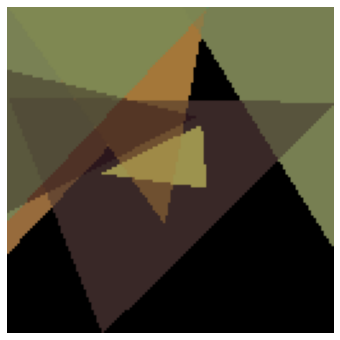

Iteration 31000 , Score 784280.5513221693


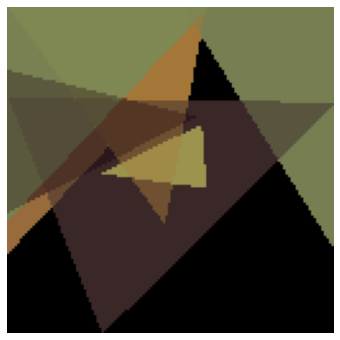

Iteration 32000 , Score 784255.6094264888


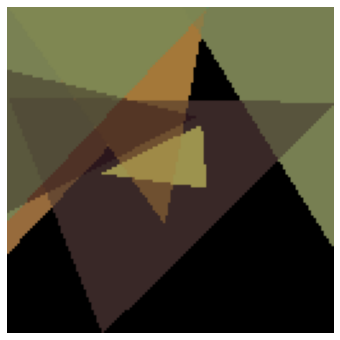

Iteration 33000 , Score 784233.8287371472


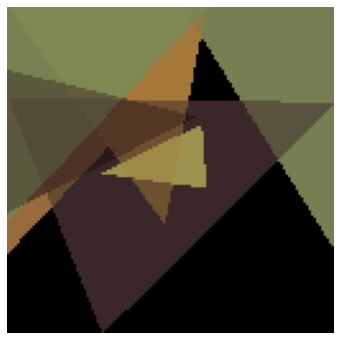

Iteration 34000 , Score 784218.2683619906


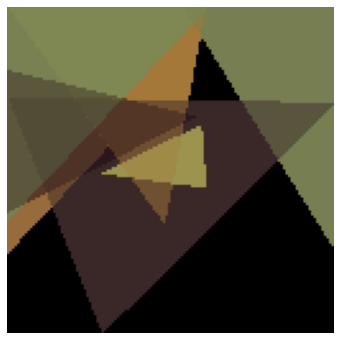

Iteration 35000 , Score 784163.8826284687


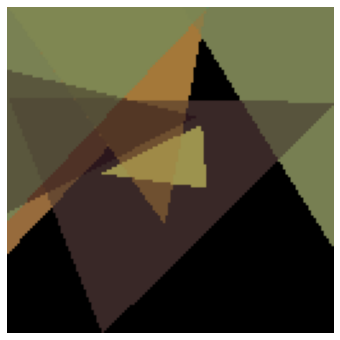

Iteration 36000 , Score 784148.5291359446


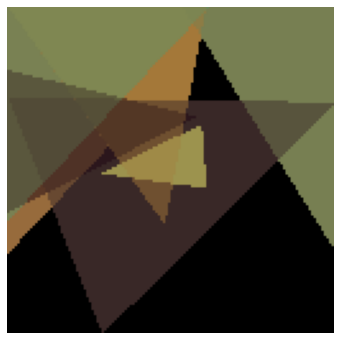

Iteration 37000 , Score 784134.4336614951


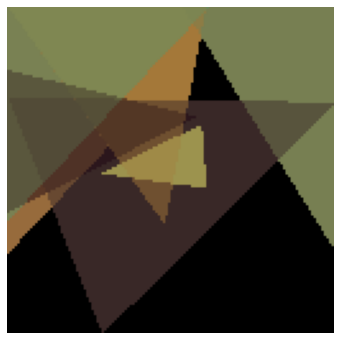

Iteration 38000 , Score 784125.0249635054


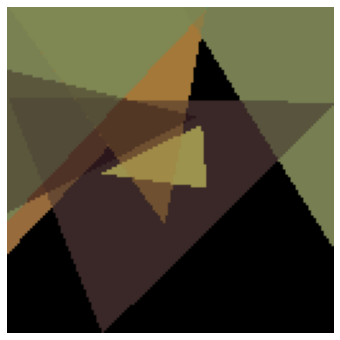

KeyboardInterrupt: 

In [15]:
es(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(128, 128), chromosome_length=8, population_size=1, 
       number_of_offspring=1, number_of_iterations=100000, expanding_interval=1000, mutation_prob=0.01,
       sigma_x=10.0, sigma_rgb=10.0, tau=1/np.sqrt(2*8), tau_0=1/np.sqrt(2*np.sqrt(8)), clip=True, log_frequency=1)

Iteration 1000 , Score 1524073.255811167


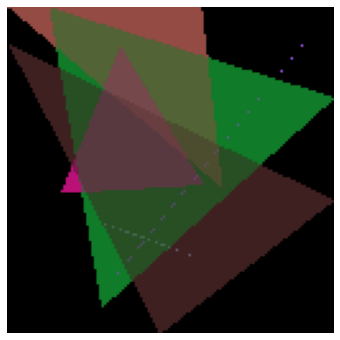

Iteration 2000 , Score 1190554.6559099243


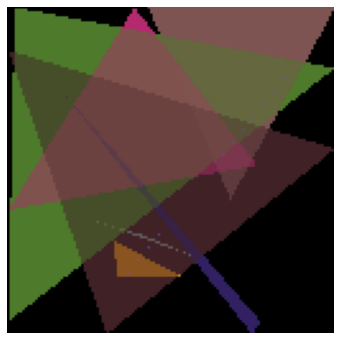

Iteration 3000 , Score 1054004.487572637


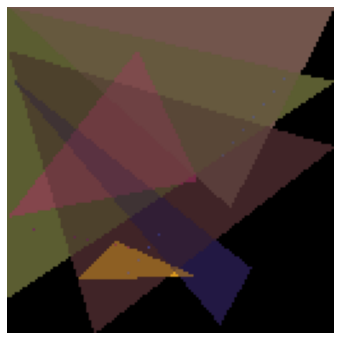

Iteration 4000 , Score 906507.231518866


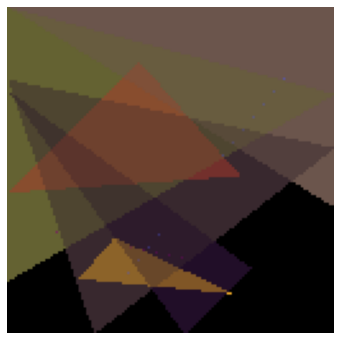

Iteration 5000 , Score 878367.9233629666


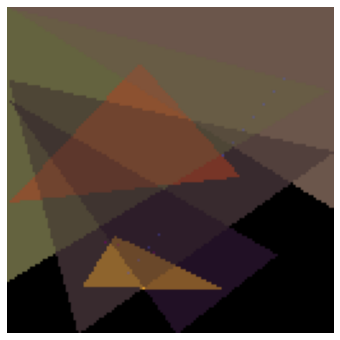

Iteration 6000 , Score 839514.2540905233


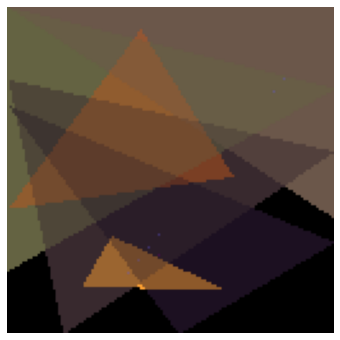

Iteration 7000 , Score 820015.7069417861


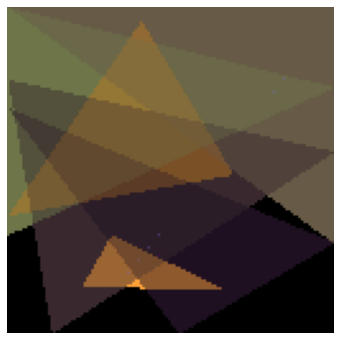

Iteration 8000 , Score 782400.2329374237


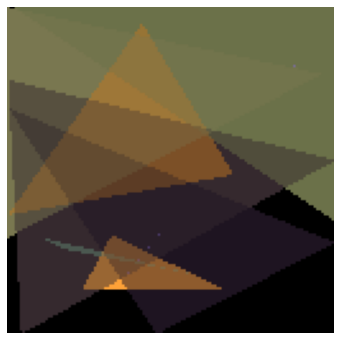

Iteration 9000 , Score 750853.8149039344


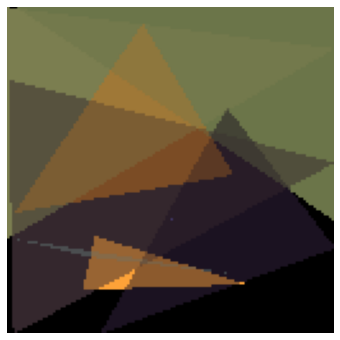

Iteration 10000 , Score 726768.8617243393


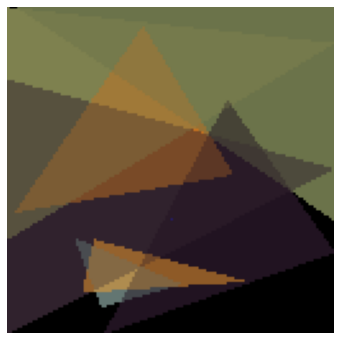

Iteration 11000 , Score 696483.2865556367


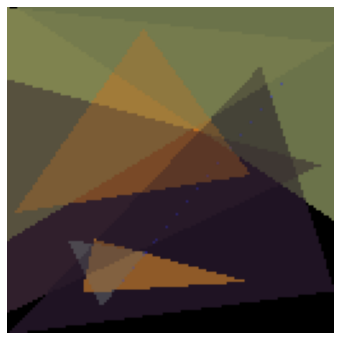

Iteration 12000 , Score 680897.4318622546


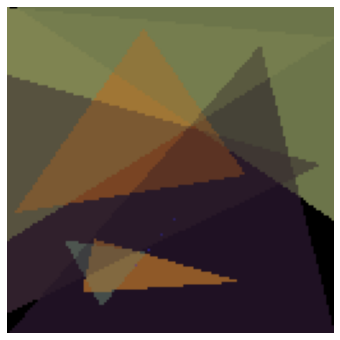

Iteration 13000 , Score 673913.2582334958


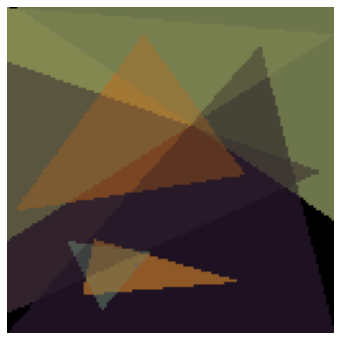

Iteration 14000 , Score 669439.978613449


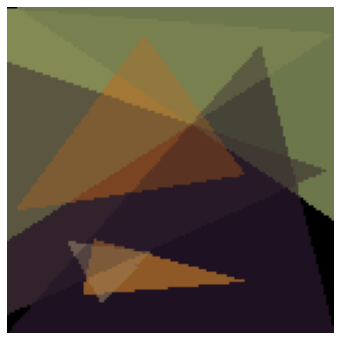

Iteration 15000 , Score 667527.7886612862


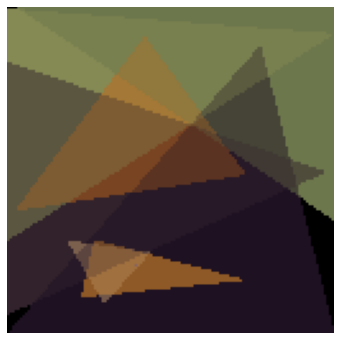

Iteration 16000 , Score 666033.6615028131


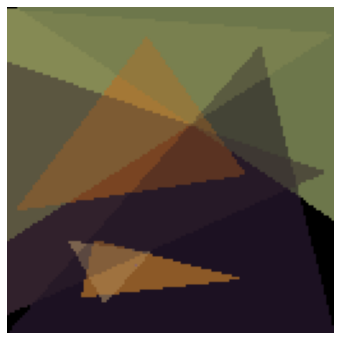

Iteration 17000 , Score 664017.4842975679


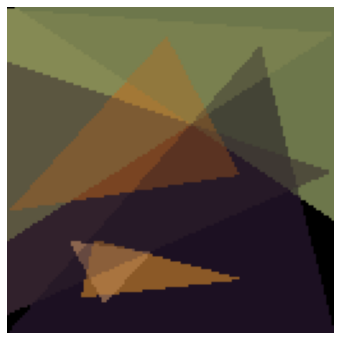

Iteration 18000 , Score 663854.9254426844


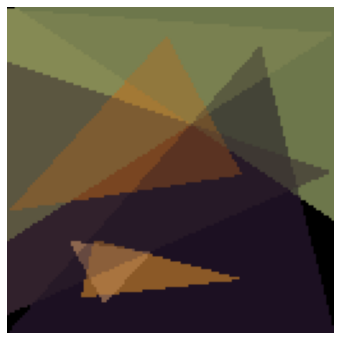

Iteration 19000 , Score 663563.8157599306


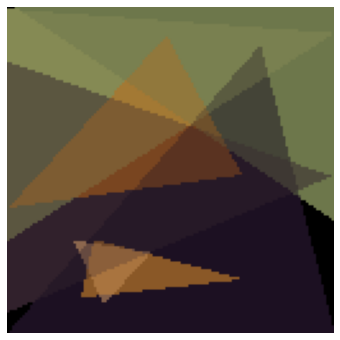

Iteration 20000 , Score 663315.9684898207


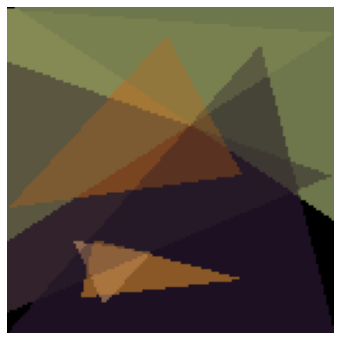

Iteration 21000 , Score 662846.1533182275


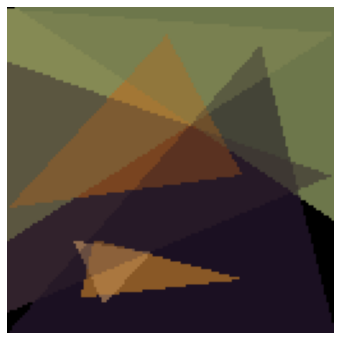

Iteration 22000 , Score 662796.4778126825


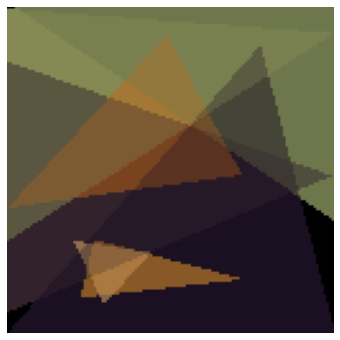

Iteration 23000 , Score 662477.7358149458


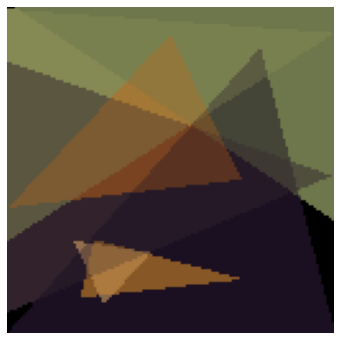

Iteration 24000 , Score 662165.5503320894


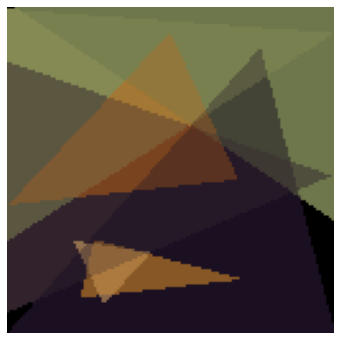

Iteration 25000 , Score 661981.4704653964


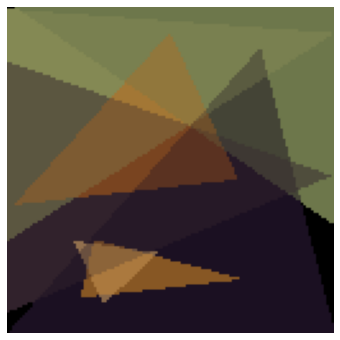

Iteration 26000 , Score 661266.3823214823


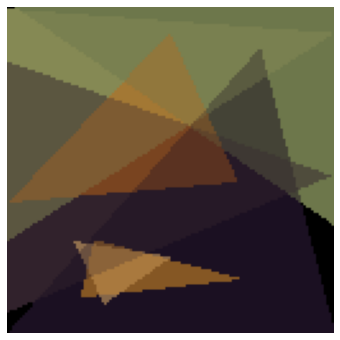

Iteration 27000 , Score 660939.2856312094


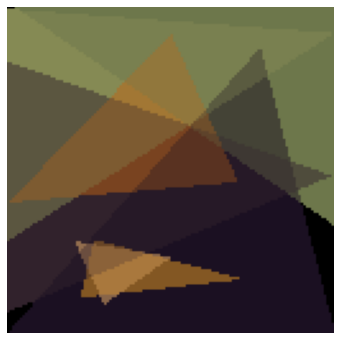

Iteration 28000 , Score 660735.4270196132


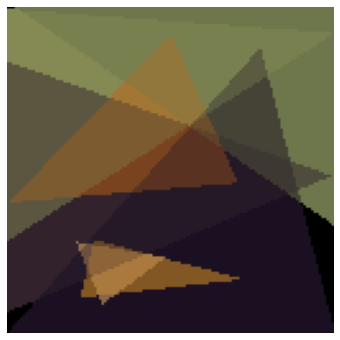

Iteration 29000 , Score 660081.2066715775


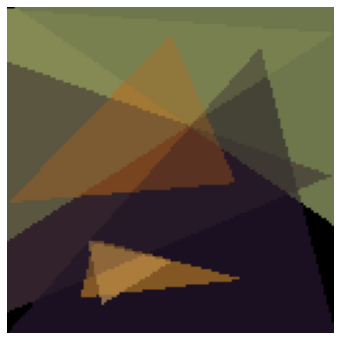

KeyboardInterrupt: 

In [18]:
es(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(128, 128), chromosome_length=8, population_size=1, 
       number_of_offspring=1, number_of_iterations=100000, expanding_interval=1000, mutation_prob=0.01,
       sigma_x=10.0, sigma_rgb=10.0, clip=True, log_frequency=1)

Iteration 10000 , Score 611132.8546013576


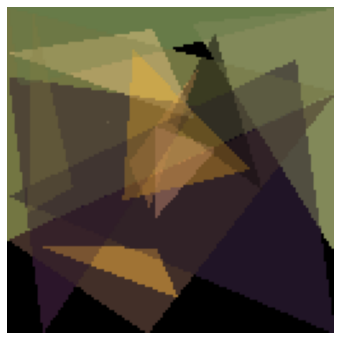

Iteration 20000 , Score 568406.5605437566


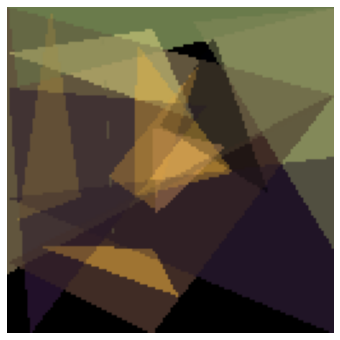

KeyboardInterrupt: 

In [40]:
es(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(128, 128), chromosome_length=20, population_size=1, 
       number_of_offspring=1, number_of_iterations=100000, expanding_interval=10000, mutation_prob=0.01,
       sigma_x=10.0, sigma_rgb=10.0, clip=True, log_frequency=1)

Iteration 1000 , Score 1128375.7566450797


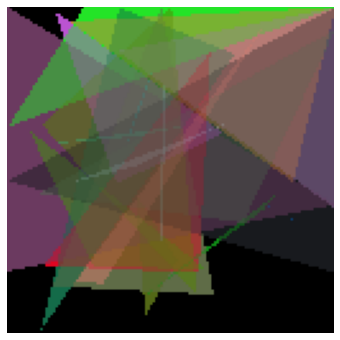

Iteration 2000 , Score 881541.1963582813


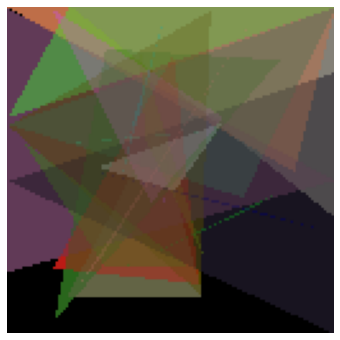

Iteration 3000 , Score 776743.4389527469


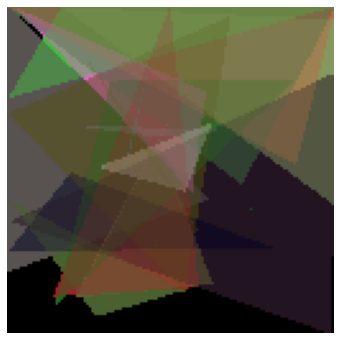

Iteration 4000 , Score 708342.5030184069


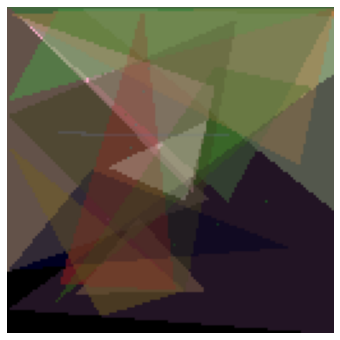

Iteration 5000 , Score 679662.3237260703


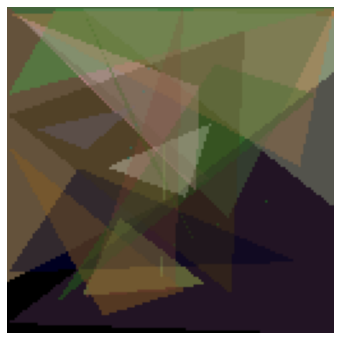

Iteration 6000 , Score 651985.6595362606


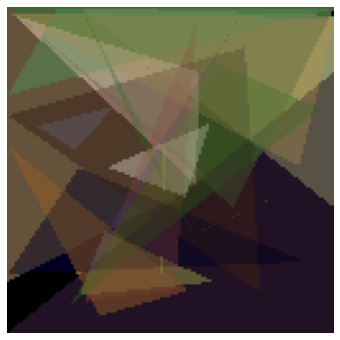

Iteration 7000 , Score 630473.7237256668


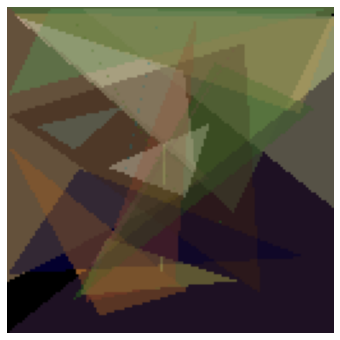

Iteration 8000 , Score 619205.0853096633


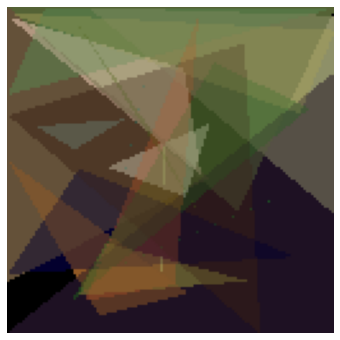

Iteration 9000 , Score 609940.8305928446


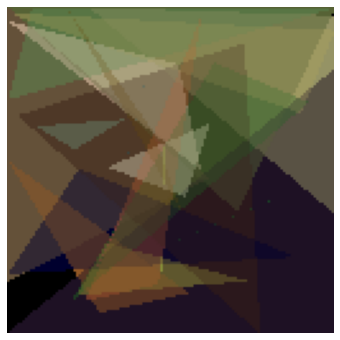

Iteration 10000 , Score 601839.4173410152


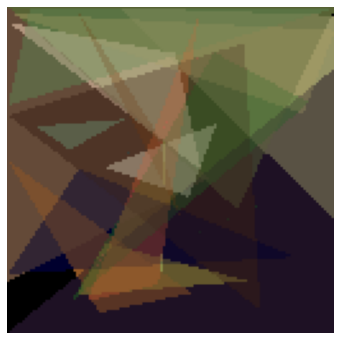

Iteration 11000 , Score 592007.0921238743


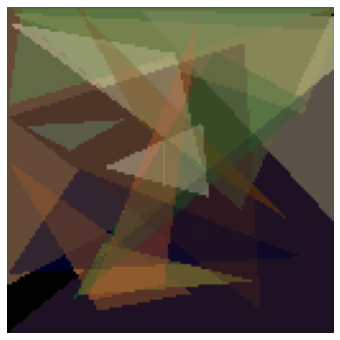

Iteration 12000 , Score 581945.2376697185


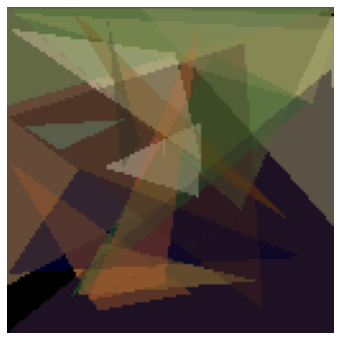

Iteration 13000 , Score 574216.7095776019


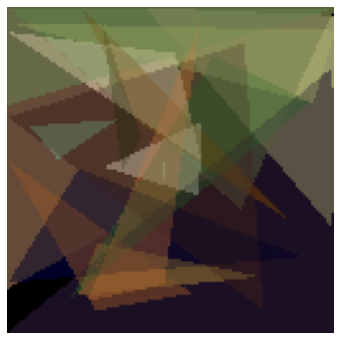

Iteration 14000 , Score 564846.3306347278


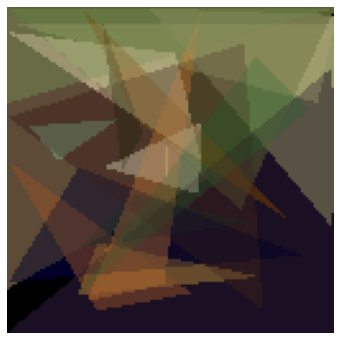

Iteration 15000 , Score 555072.6497010272


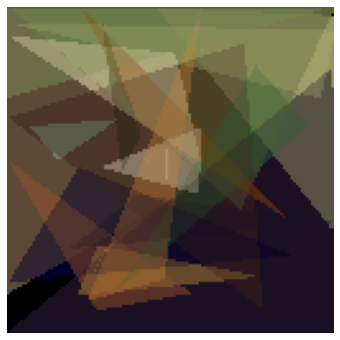

Iteration 16000 , Score 550224.3898573067


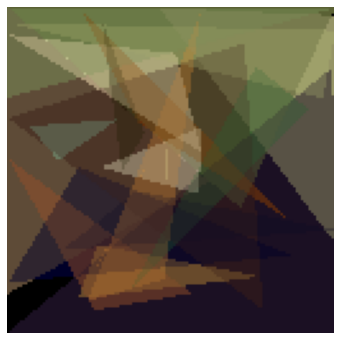

Iteration 17000 , Score 544523.8212928649


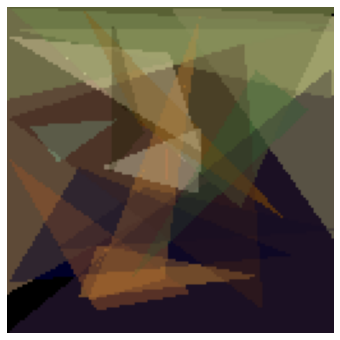

Iteration 18000 , Score 541043.2161633568


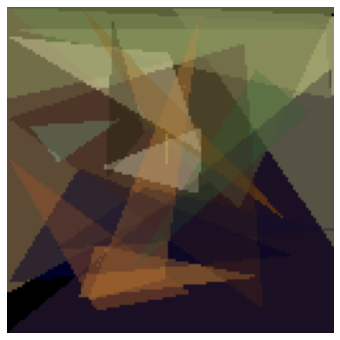

Iteration 19000 , Score 537144.4702430146


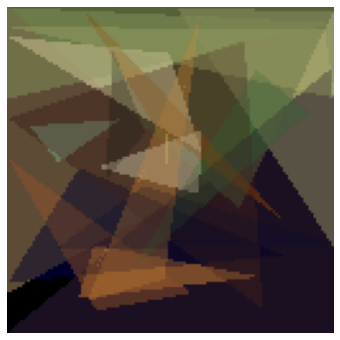

(535437.4449330734,
 (array([ 46.21823329,  19.50244957,   8.60362546,  99.76747537,
          92.42457736,   0.        ,  61.10390709,  61.16121192,
          62.186134  , 127.23605486, 128.        ,  65.73897429,
          33.72868601,  75.86555503,  74.60054903,  60.98275559,
          30.96260116,  75.28388444,   0.        , 128.        ,
           0.        ,  56.60976395,  27.34971767, 108.5372481 ,
          71.56813726,   0.        ,  34.52414688,   0.        ,
         126.94153909, 127.80450908, 117.48113921,  60.88468005,
          97.00665382,  98.59228308,  33.50065567,  27.72027421,
           0.        ,  78.5676883 ,   0.        ,  82.0473866 ,
          34.9498498 ,  33.76739567,  53.49625664,  41.0350673 ,
          38.03725281,  90.35466093,   0.        , 128.        ,
          75.61993376,   0.        ,  63.04844006, 127.74693874,
         123.90772673,   0.        ,   0.        ,  27.6872851 ,
         107.41787888,  18.01343886,  53.24666152, 128.        ]),
  a

In [33]:
es(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(128, 128), chromosome_length=20, population_size=1, 
       number_of_offspring=1, number_of_iterations=20000, expanding_interval=1000, mutation_prob=0.01,
       sigma_x=10.0, sigma_rgb=10.0, clip=True, log_frequency=1)

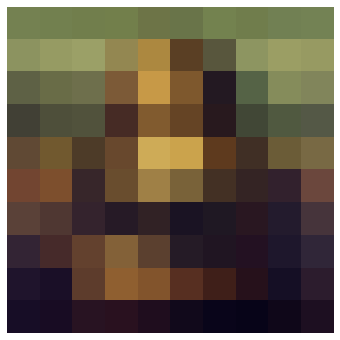

In [24]:
with Image.open("MonaLisa.jpg") as im:
    im = im.convert("RGB")
image128 = im.resize((10, 10))
r, g, b = image128.split()
draw_image(r, g, b)

Iteration: 100000, Num of traingles: 2, Score: 5045.83001319997


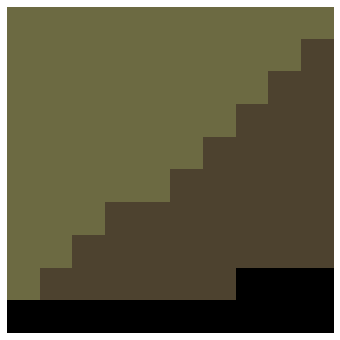

Iteration: 200000, Num of traingles: 3, Score: 4748.496026325982


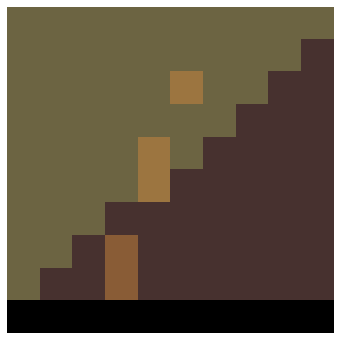

Iteration: 300000, Num of traingles: 4, Score: 4540.695320480445


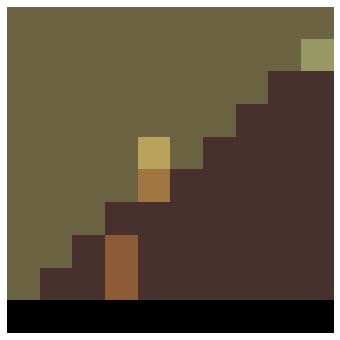

Iteration: 400000, Num of traingles: 5, Score: 4366.273929228921


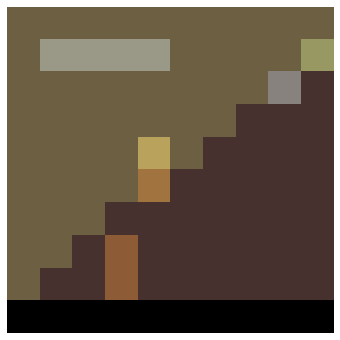

Iteration: 500000, Num of traingles: 6, Score: 4270.108683176941


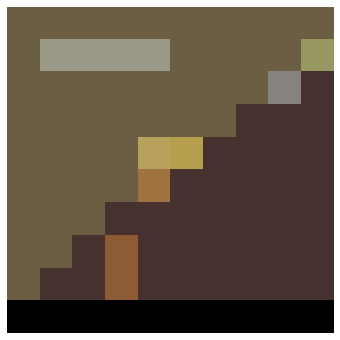

Iteration: 600000, Num of traingles: 7, Score: 3972.2861816992645


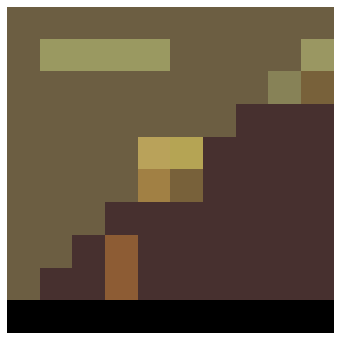

KeyboardInterrupt: 

In [29]:
esExpanding(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(10, 10), chromosome_length=2, population_size=1, 
       number_of_offspring=1, number_of_iterations=1000000, expanding_interval=100000, mutation_prob=0.01,
       sigma_x=10.0, sigma_rgb=10.0, clip=True, log_frequency=1)

Iteration: 100000, Num of traingles: 2, Score: 6568.5287337980535


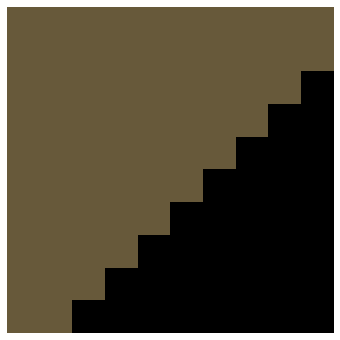

Iteration: 200000, Num of traingles: 3, Score: 4923.112110246123


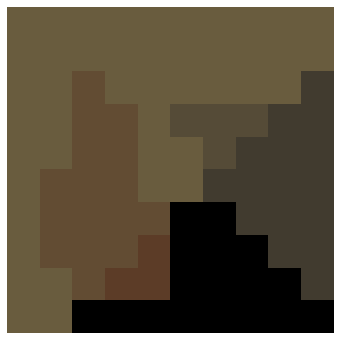

Iteration: 300000, Num of traingles: 4, Score: 3581.618580065551


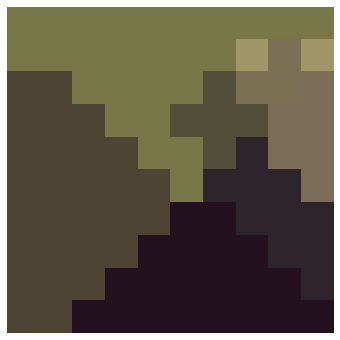

Iteration: 400000, Num of traingles: 5, Score: 3314.6053862090675


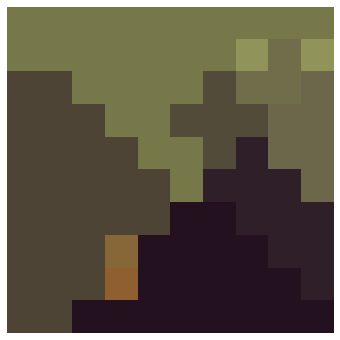

Iteration: 500000, Num of traingles: 6, Score: 2942.582161257334


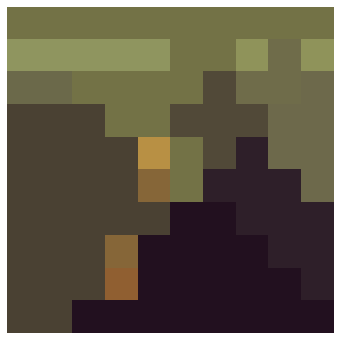

Iteration: 600000, Num of traingles: 7, Score: 2940.324167813523


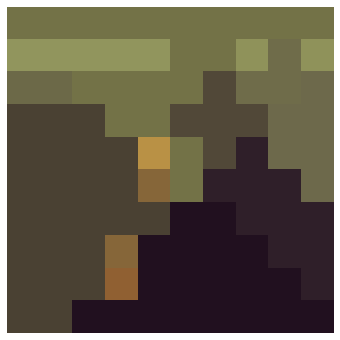

Iteration: 700000, Num of traingles: 8, Score: 3254.37527698523


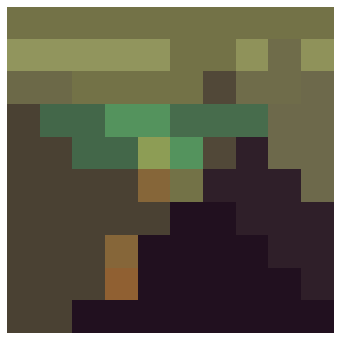

Iteration: 800000, Num of traingles: 9, Score: 4638.1352480109035


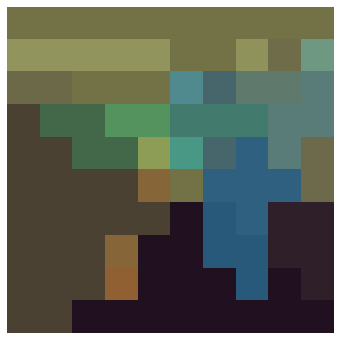

KeyboardInterrupt: 

In [32]:
esExpanding(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(10, 10), chromosome_length=2, population_size=1, 
       number_of_offspring=1, number_of_iterations=1000000, expanding_interval=100000, mutation_prob=0.01,
       sigma_x=10.0, sigma_rgb=10.0, clip=True, log_frequency=1)

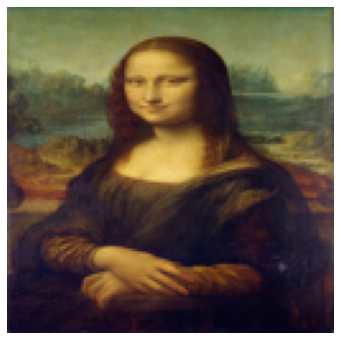

In [33]:
with Image.open("MonaLisa.jpg") as im:
    im = im.convert("RGB")
image128 = im.resize((128, 128))
r, g, b = image128.split()
draw_image(r, g, b)

Iteration: 10000, Num of traingles: 2, Score: 1005257.6392903563


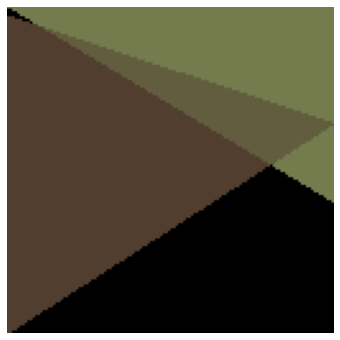

Iteration: 20000, Num of traingles: 3, Score: 926445.8168086719


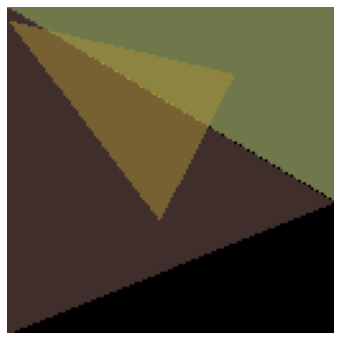

Iteration: 30000, Num of traingles: 4, Score: 963426.3452820748


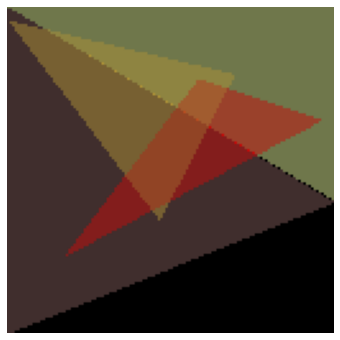

Iteration: 40000, Num of traingles: 5, Score: 745479.8245369617


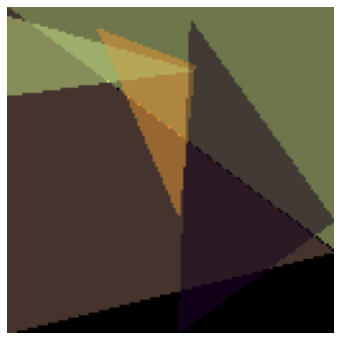

Iteration: 50000, Num of traingles: 6, Score: 768500.0461460426


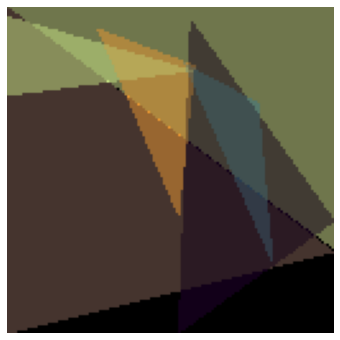

Iteration: 60000, Num of traingles: 7, Score: 829628.8567388768


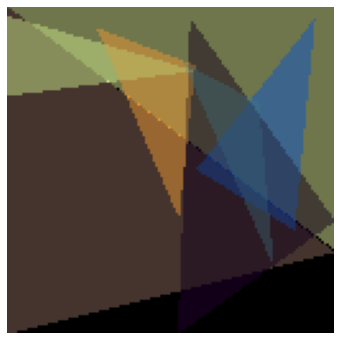

Iteration: 70000, Num of traingles: 8, Score: 843270.0388689564


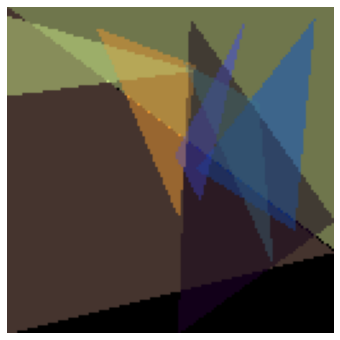

Iteration: 80000, Num of traingles: 9, Score: 875532.1773958079


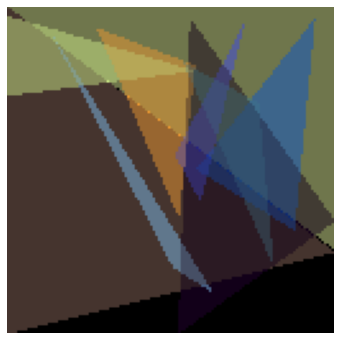

KeyboardInterrupt: 

In [35]:
esExpanding(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(128, 128), chromosome_length=2, population_size=1, 
       number_of_offspring=1, number_of_iterations=100000, expanding_interval=10000, mutation_prob=0.01,
       sigma_x=10.0, sigma_rgb=10.0, clip=True, log_frequency=1)

Iteration: 10000, Num of traingles: 2, Score: 978880.3351640746


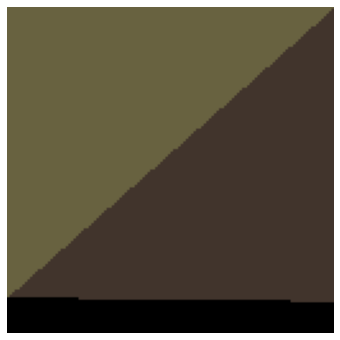

Iteration: 20000, Num of traingles: 3, Score: 1016698.672206989


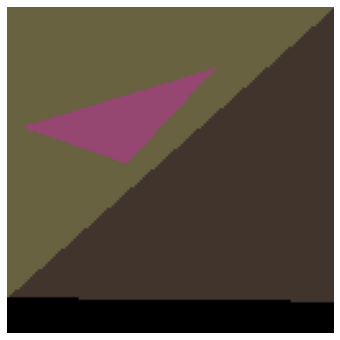

Iteration: 30000, Num of traingles: 4, Score: 1055450.1279425332


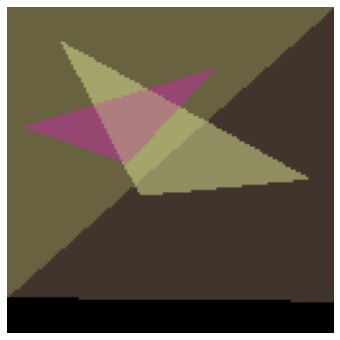

Iteration: 40000, Num of traingles: 5, Score: 1057425.2052129074


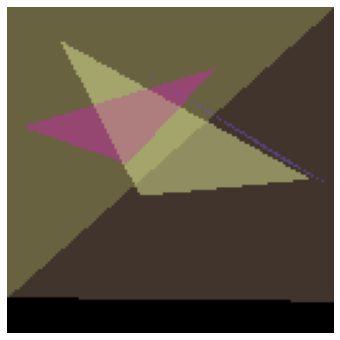

Iteration: 50000, Num of traingles: 6, Score: 1053205.1551632597


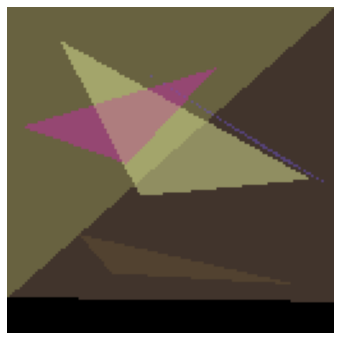

Iteration: 60000, Num of traingles: 7, Score: 1100017.656019004


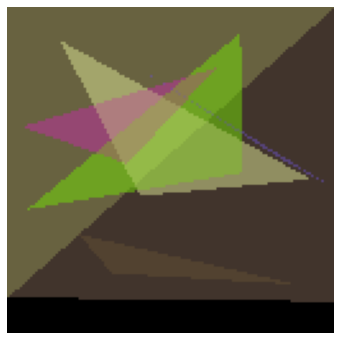

KeyboardInterrupt: 

In [36]:
esExpanding(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(128, 128), chromosome_length=2, population_size=1, 
       number_of_offspring=1, number_of_iterations=100000, expanding_interval=10000, mutation_prob=0.05,
       sigma_x=10.0, sigma_rgb=10.0, clip=True, log_frequency=1)

Iteration: 10000, Num of traingles: 2, Score: 978131.594116707


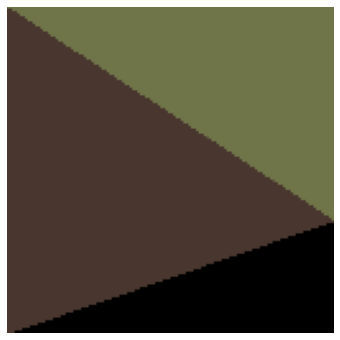

Iteration: 20000, Num of traingles: 3, Score: 922582.7114718503


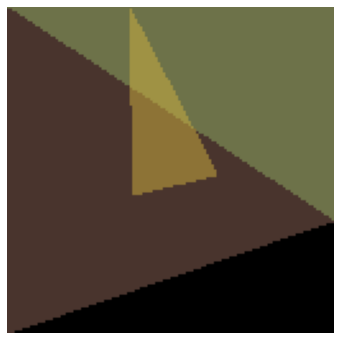

Iteration: 30000, Num of traingles: 4, Score: 952831.9172113893


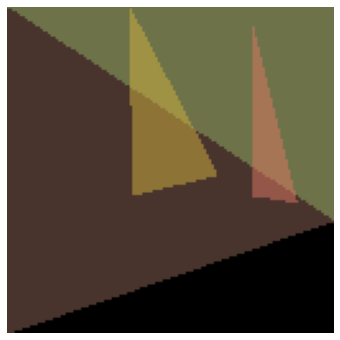

Iteration: 40000, Num of traingles: 5, Score: 1023677.2205541728


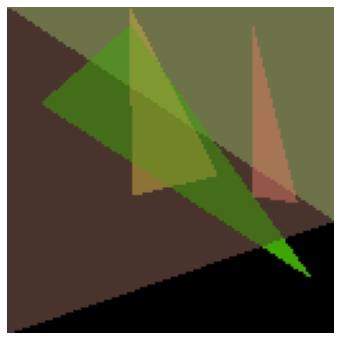

Iteration: 50000, Num of traingles: 6, Score: 1131282.9915633625


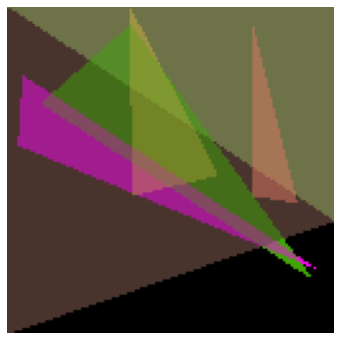

KeyboardInterrupt: 

In [38]:
esExpanding(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(128, 128), chromosome_length=2, population_size=1, 
       number_of_offspring=1, number_of_iterations=100000, expanding_interval=10000, mutation_prob=0.05,
       sigma_x=10.0, sigma_rgb=10.0, clip=True, log_frequency=1)

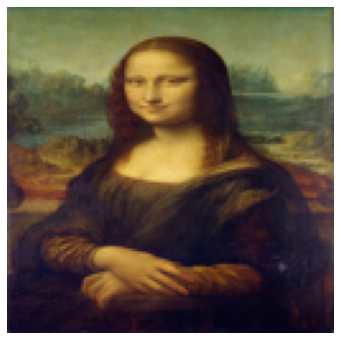

In [11]:
with Image.open("MonaLisa.jpg") as im:
    im = im.convert("RGB")
image128 = im.resize((128, 128))
r, g, b = image128.split()
draw_image(r, g, b)

Iteration: 100, Number of traingles: 5, Score: 1873083.531318817


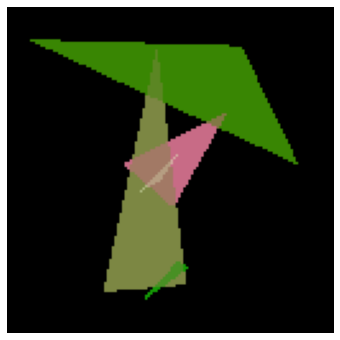

Adding new triangles!!! Best solution so far showed below
Iteration: 101, Number of traingles: 5, Score: 1873083.531318817


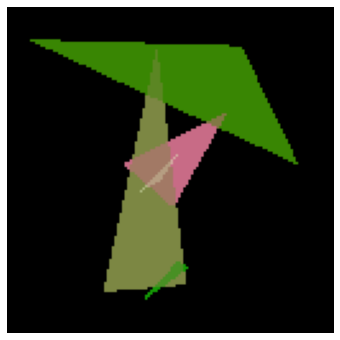

(50,) (50,)


IndexError: index 37 is out of bounds for axis 0 with size 15

In [79]:
esOnePlusOneSelfAdaptation(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(128, 128), 
                           chromosome_length=5, population_size=50, number_of_iterations=100000, 
                           expanding_interval=100, mutation_prob=0.05, sigma_x=10.0, sigma_rgb=25.0, 
                           clip=True, log_frequency=100)

Iteration: 1000, Number of traingles: 5, Score: 1238562.6284467983


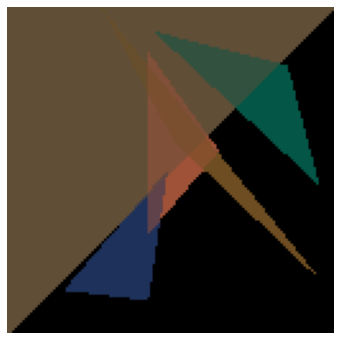

Iteration: 2000, Number of traingles: 5, Score: 923156.8933253633


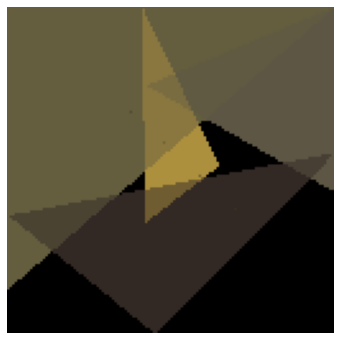

Iteration: 3000, Number of traingles: 5, Score: 901251.0275018252


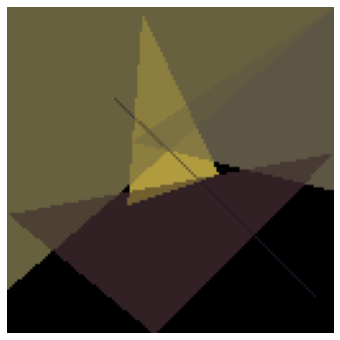

Iteration: 4000, Number of traingles: 5, Score: 895143.3202214765


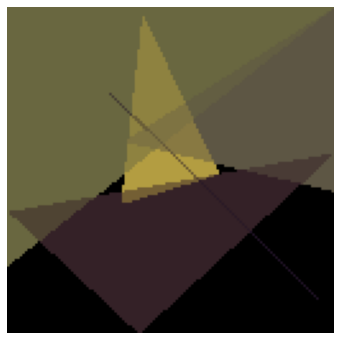

Iteration: 5000, Number of traingles: 5, Score: 893095.1434990279


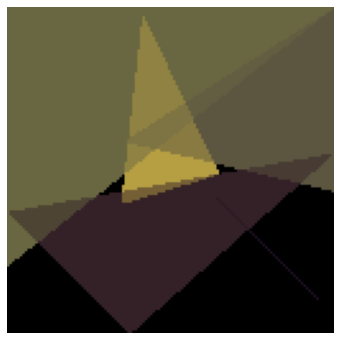

Iteration: 6000, Number of traingles: 5, Score: 891990.7927324697


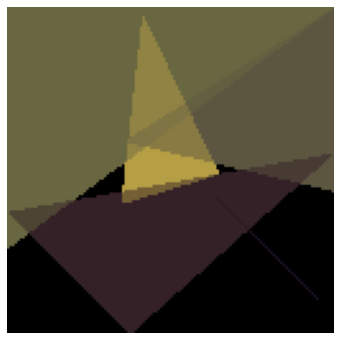

Iteration: 7000, Number of traingles: 5, Score: 890598.5058047421


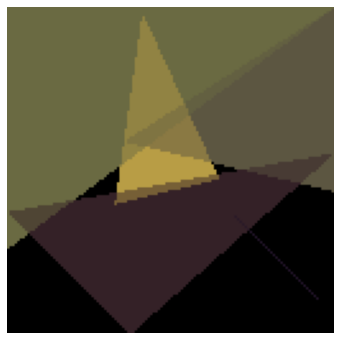

Iteration: 8000, Number of traingles: 5, Score: 890050.0582746518


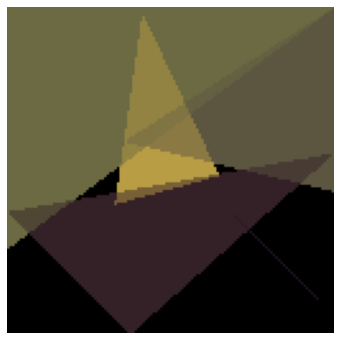

Iteration: 9000, Number of traingles: 5, Score: 886334.5553571796


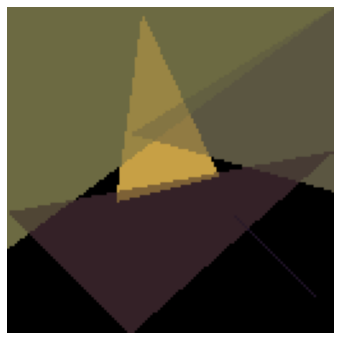

Iteration: 10000, Number of traingles: 5, Score: 884675.4901050265


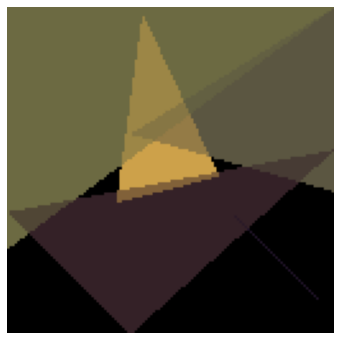

Iteration: 11000, Number of traingles: 5, Score: 883946.0670187108


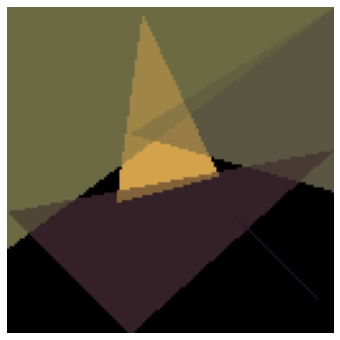

Iteration: 12000, Number of traingles: 5, Score: 883187.4131605197


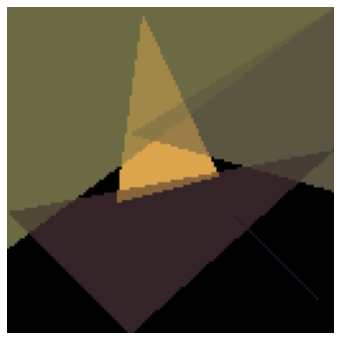

Iteration: 13000, Number of traingles: 5, Score: 882961.5798745906


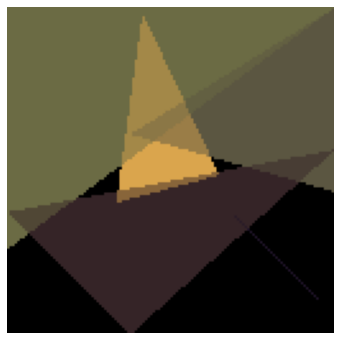

Iteration: 14000, Number of traingles: 5, Score: 882762.6903010058


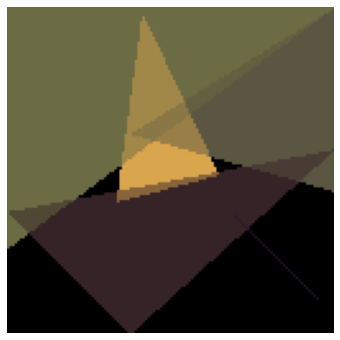

Iteration: 15000, Number of traingles: 5, Score: 882268.8406276889


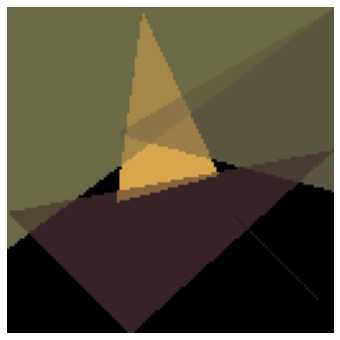

Iteration: 16000, Number of traingles: 5, Score: 882011.0518700447


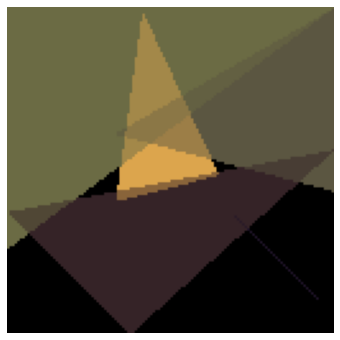

Iteration: 17000, Number of traingles: 5, Score: 881732.3516464337


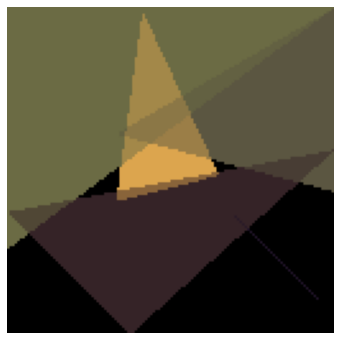

Iteration: 18000, Number of traingles: 5, Score: 881432.1058062494


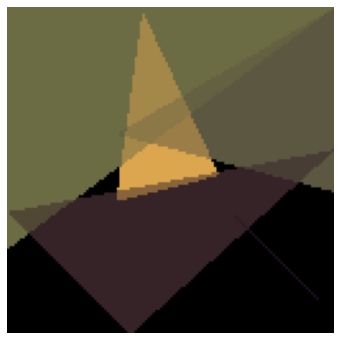

Iteration: 19000, Number of traingles: 5, Score: 881124.4910596324


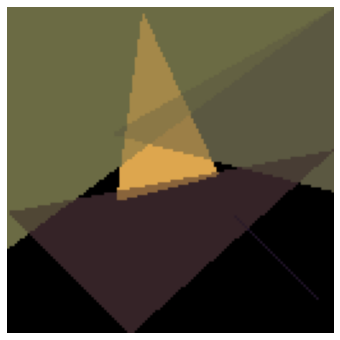

Iteration: 20000, Number of traingles: 5, Score: 880694.8417221105


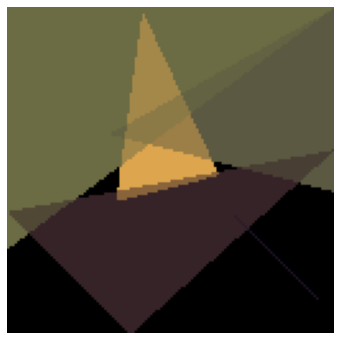

Adding new triangles!!! Best solution so far showed below
Iteration: 20001, Number of traingles: 5, Score: 880694.8417221105


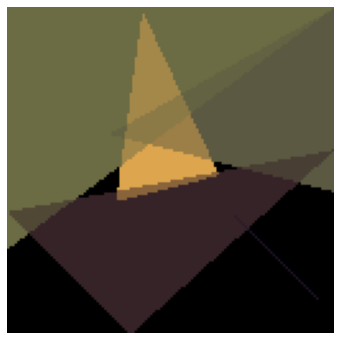

Iteration: 21000, Number of traingles: 10, Score: 1354880.885266201


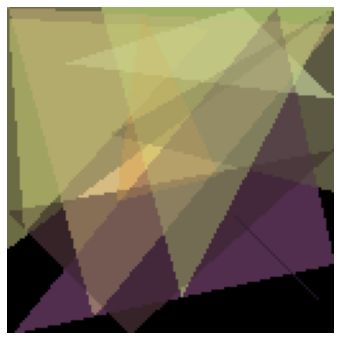

Iteration: 22000, Number of traingles: 10, Score: 1363919.456508717


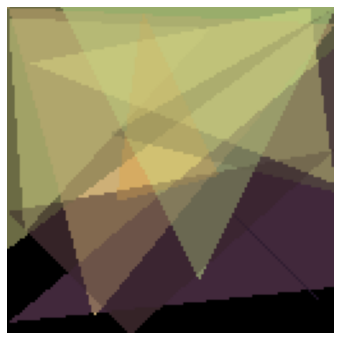

Iteration: 23000, Number of traingles: 10, Score: 1266753.1112582386


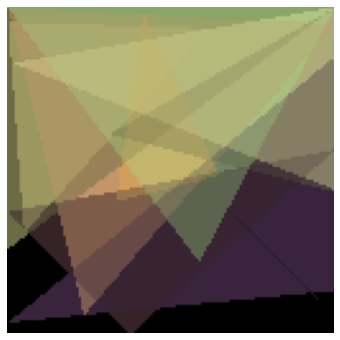

Iteration: 24000, Number of traingles: 10, Score: 1267884.3567960637


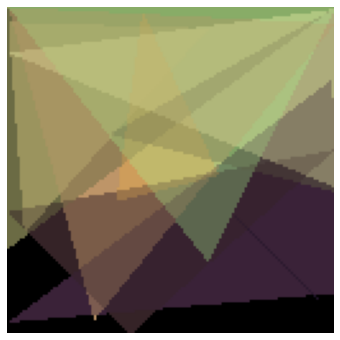

Iteration: 25000, Number of traingles: 10, Score: 1264731.5904963138


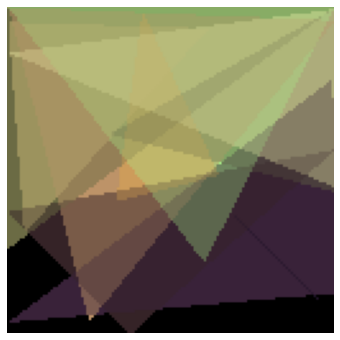

Iteration: 26000, Number of traingles: 10, Score: 1265245.586747034


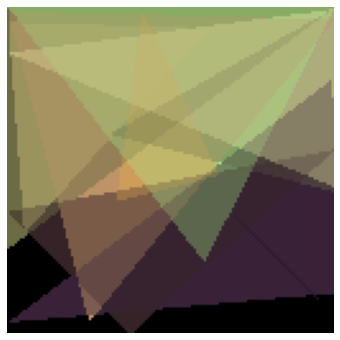

Iteration: 27000, Number of traingles: 10, Score: 1265112.5021599182


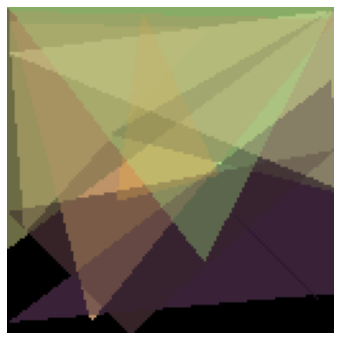

Iteration: 28000, Number of traingles: 10, Score: 1266908.9457690103


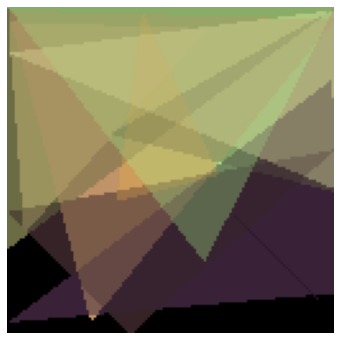

Iteration: 29000, Number of traingles: 10, Score: 1267995.037692831


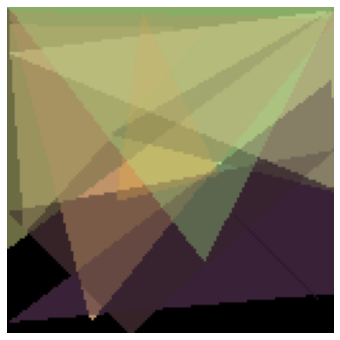

Iteration: 30000, Number of traingles: 10, Score: 1269099.1010572459


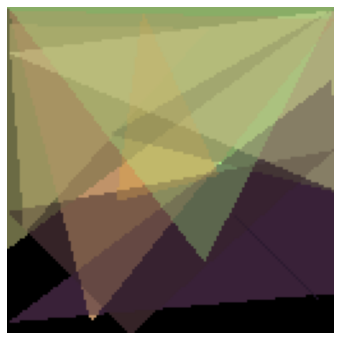

Iteration: 31000, Number of traingles: 10, Score: 1269114.36090407


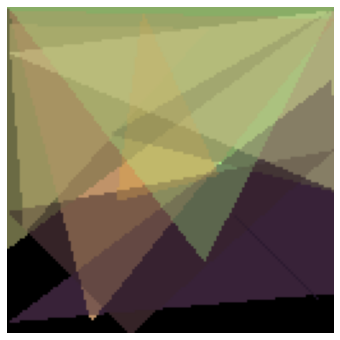

Iteration: 32000, Number of traingles: 10, Score: 1269426.2038018084


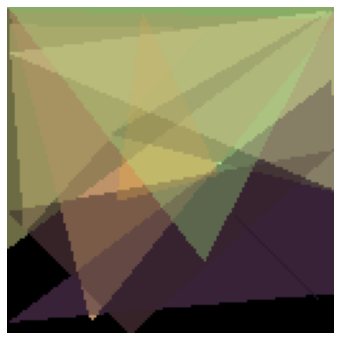

Iteration: 33000, Number of traingles: 10, Score: 1269384.9677257368


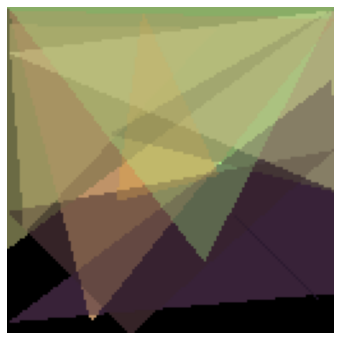

Iteration: 34000, Number of traingles: 10, Score: 1268915.3522601593


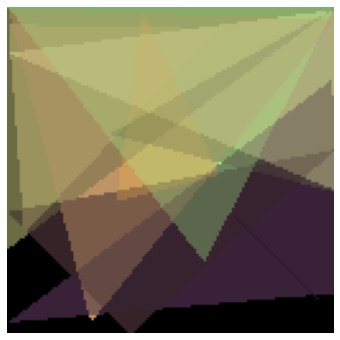

Iteration: 35000, Number of traingles: 10, Score: 1268177.0009323047


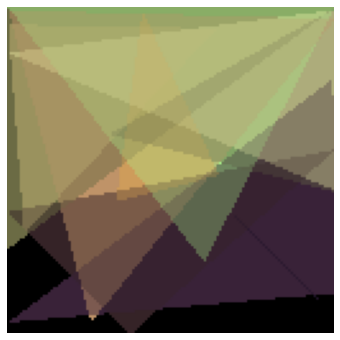

Iteration: 36000, Number of traingles: 10, Score: 1268160.4677760878


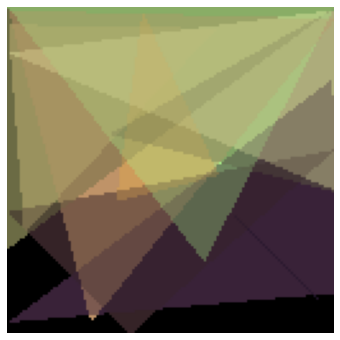

Iteration: 37000, Number of traingles: 10, Score: 1267983.8577085799


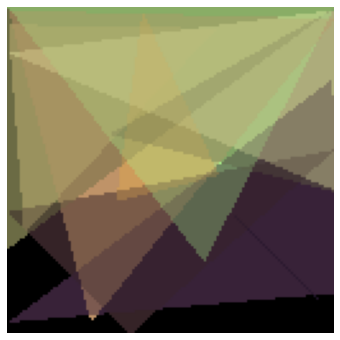

Iteration: 38000, Number of traingles: 10, Score: 1267659.116185653


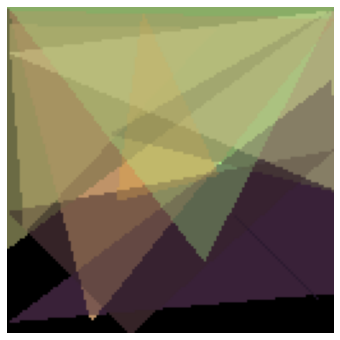

Iteration: 39000, Number of traingles: 10, Score: 1267731.1992703353


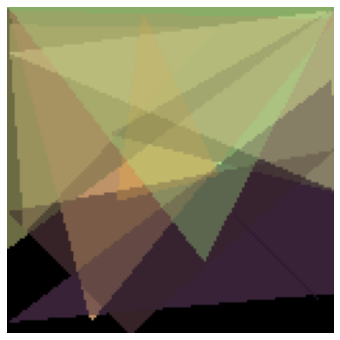

Iteration: 40000, Number of traingles: 10, Score: 1266421.9104788308


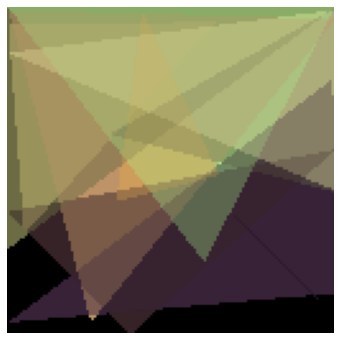

Adding new triangles!!! Best solution so far showed below
Iteration: 40001, Number of traingles: 10, Score: 1266421.9104788308


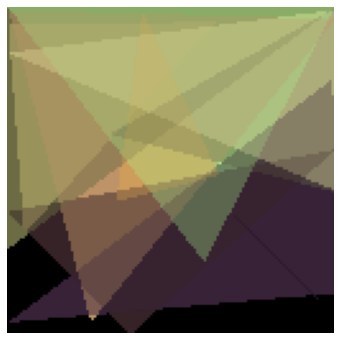

Iteration: 41000, Number of traingles: 15, Score: 1618939.7789284866


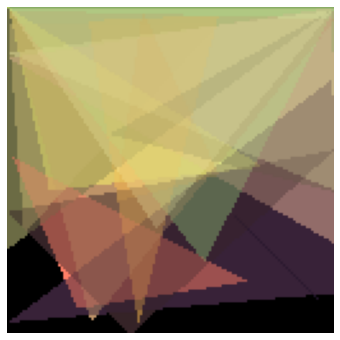

Iteration: 42000, Number of traingles: 15, Score: 1657623.2026372352


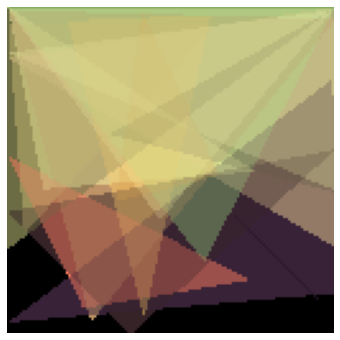

Iteration: 43000, Number of traingles: 15, Score: 1674606.140734527


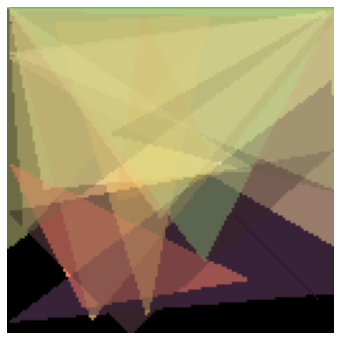

Iteration: 44000, Number of traingles: 15, Score: 1666146.7638892254


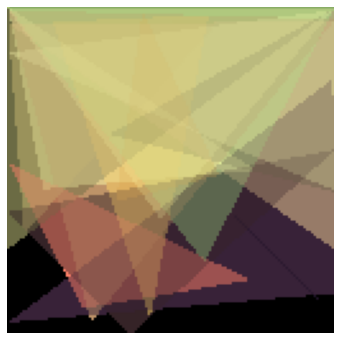

Iteration: 45000, Number of traingles: 15, Score: 1625523.282187717


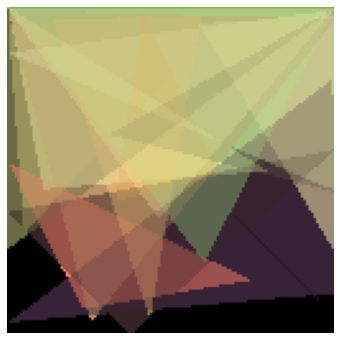

Iteration: 46000, Number of traingles: 15, Score: 1647465.670958214


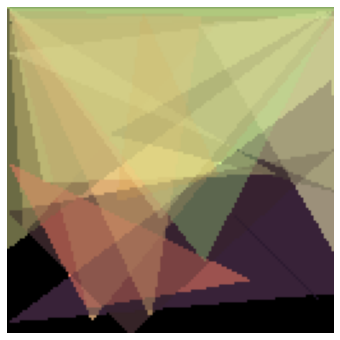

Iteration: 47000, Number of traingles: 15, Score: 1650725.4691043762


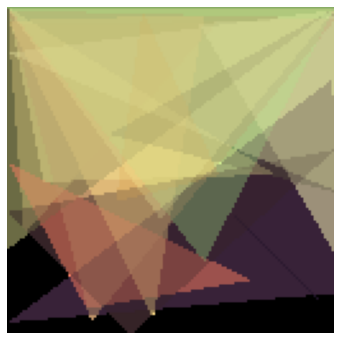

Iteration: 48000, Number of traingles: 15, Score: 1650271.4272192987


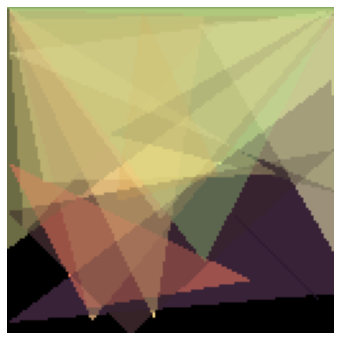

Iteration: 49000, Number of traingles: 15, Score: 1653511.547376904


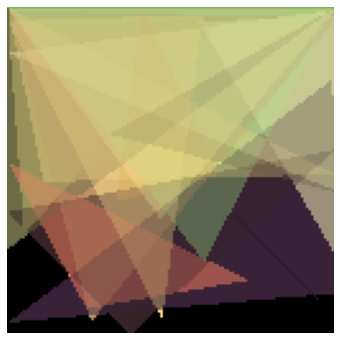

Iteration: 50000, Number of traingles: 15, Score: 1654848.7009990993


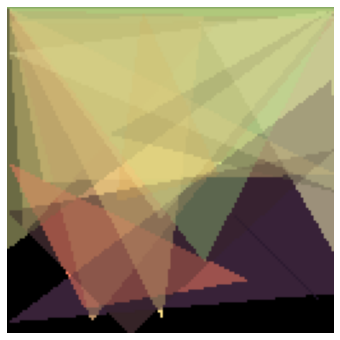

Iteration: 51000, Number of traingles: 15, Score: 1651685.5269710356


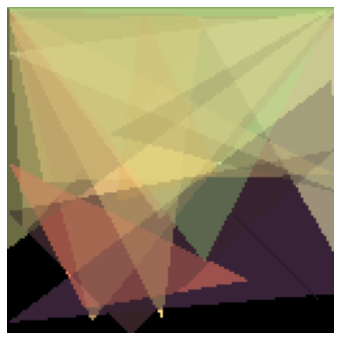

KeyboardInterrupt: 

In [18]:
esOnePlusOneSelfAdaptation(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(128, 128), 
                           chromosome_length=5, population_size=50, number_of_iterations=100000, 
                           mutation_prob=0.05, sigma_x=10.0, sigma_rgb=25.0, 
                           clip=True, log_frequency=1000, expanding_interval=20000)

Iteration: 1000, Number of traingles: 5, Score: 1305894.4131323453


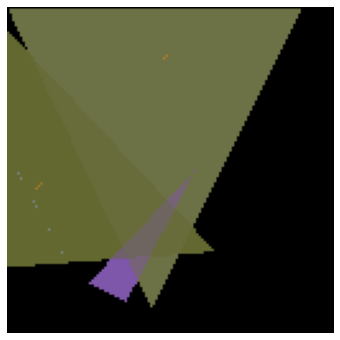

Iteration: 2000, Number of traingles: 5, Score: 1237125.2640073055


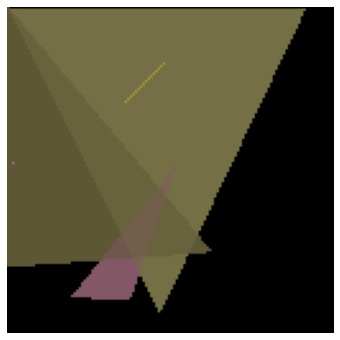

Iteration: 3000, Number of traingles: 5, Score: 1206240.7896371763


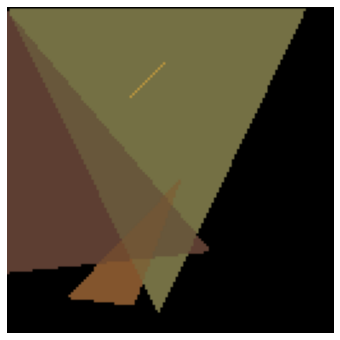

Iteration: 4000, Number of traingles: 5, Score: 1205196.5568307638


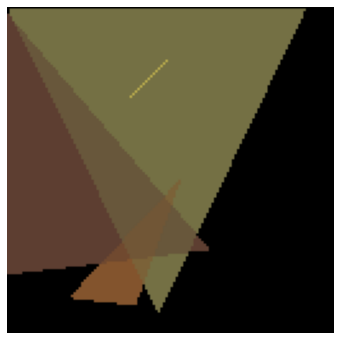

Iteration: 5000, Number of traingles: 5, Score: 1204775.3707468535


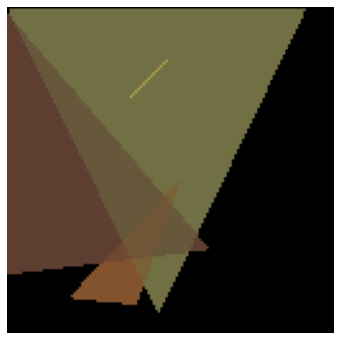

Iteration: 6000, Number of traingles: 5, Score: 1204494.5835512616


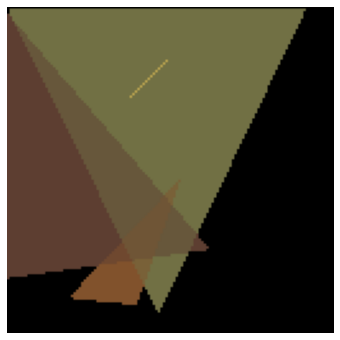

Iteration: 7000, Number of traingles: 5, Score: 1204142.6230472135


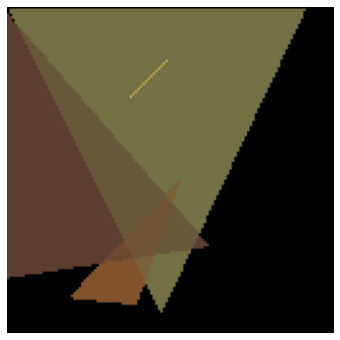

Iteration: 8000, Number of traingles: 5, Score: 1203262.3661397588


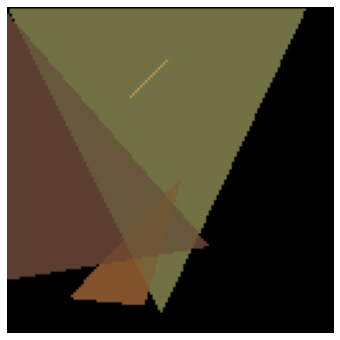

Iteration: 9000, Number of traingles: 5, Score: 1184141.403481998


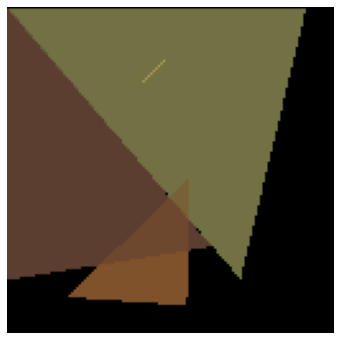

Iteration: 10000, Number of traingles: 5, Score: 1182780.8912013788


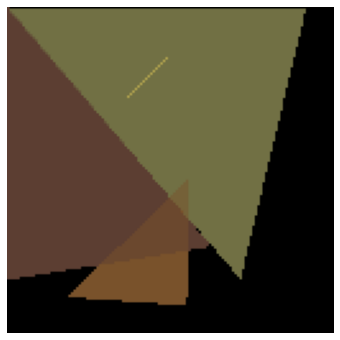

Iteration: 11000, Number of traingles: 5, Score: 1181812.7832885366


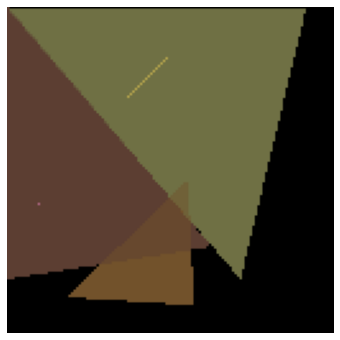

Iteration: 12000, Number of traingles: 5, Score: 1180091.902088453


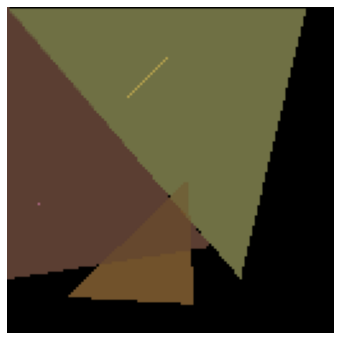

Iteration: 13000, Number of traingles: 5, Score: 1175334.3171443278


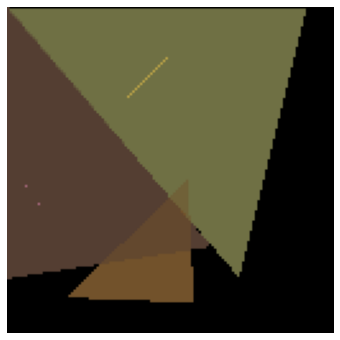

Iteration: 14000, Number of traingles: 5, Score: 1174423.6309436033


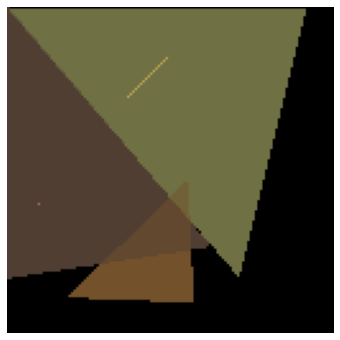

Iteration: 15000, Number of traingles: 5, Score: 1170715.8217920847


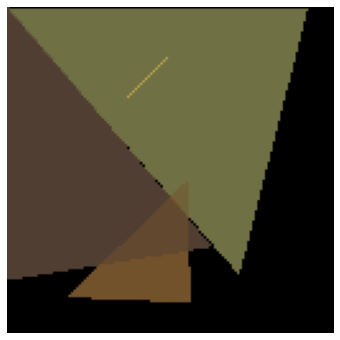

Iteration: 16000, Number of traingles: 5, Score: 1139381.5928727041


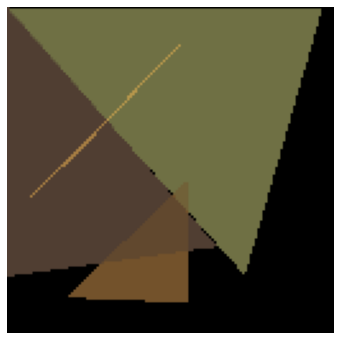

Iteration: 17000, Number of traingles: 5, Score: 982561.2789718783


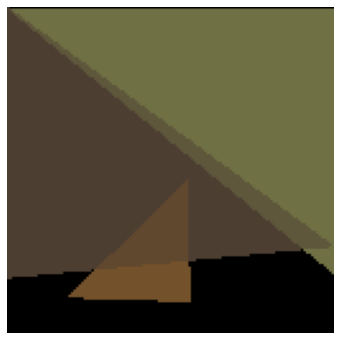

Iteration: 18000, Number of traingles: 5, Score: 979391.1969679999


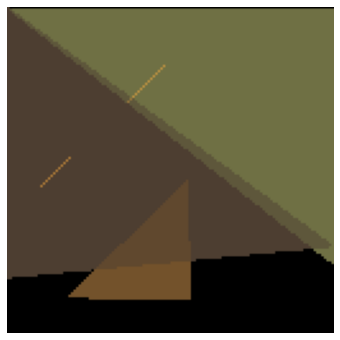

Iteration: 19000, Number of traingles: 5, Score: 977364.0562910379


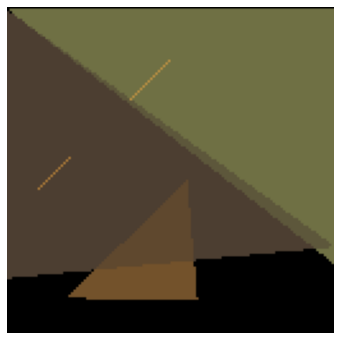

Iteration: 20000, Number of traingles: 5, Score: 976872.8792549709


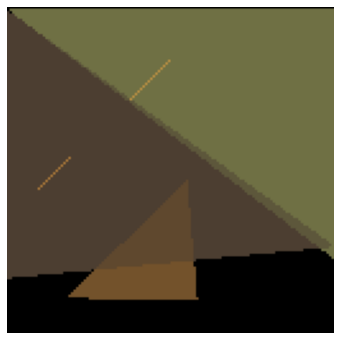

Adding new triangles!!! Best solution so far showed below
Iteration: 20001, Number of traingles: 5, Score: 976872.8792549709


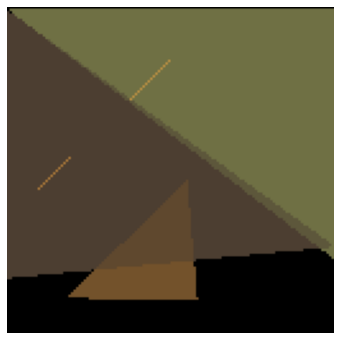

Iteration: 21000, Number of traingles: 10, Score: 1126397.814098881


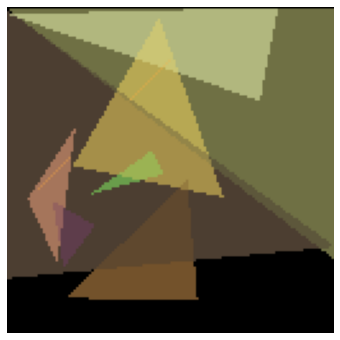

Iteration: 22000, Number of traingles: 10, Score: 1179747.4020841708


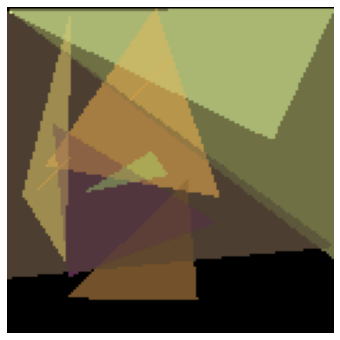

Iteration: 23000, Number of traingles: 10, Score: 1173651.9066134135


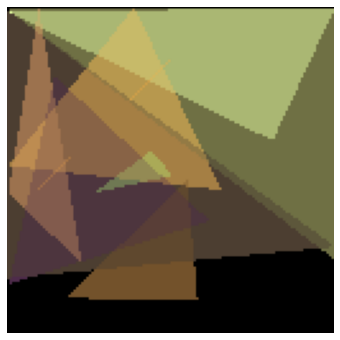

Iteration: 24000, Number of traingles: 10, Score: 1170201.1387793268


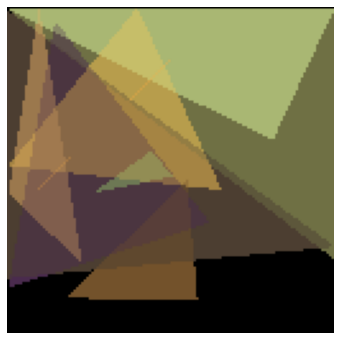

Iteration: 25000, Number of traingles: 10, Score: 1171247.8247691994


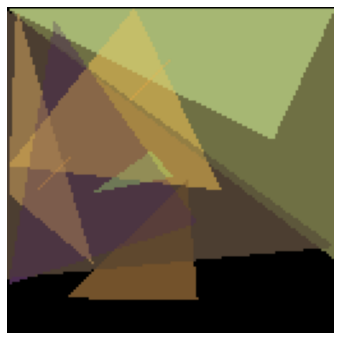

Iteration: 26000, Number of traingles: 10, Score: 1165977.478707032


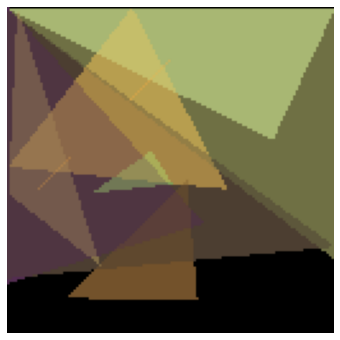

Iteration: 27000, Number of traingles: 10, Score: 1177016.0923617631


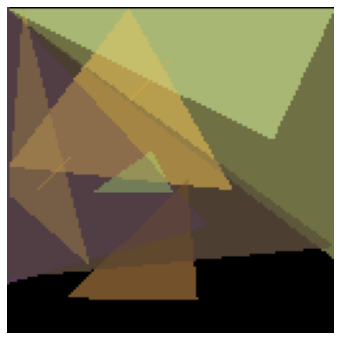

Iteration: 28000, Number of traingles: 10, Score: 1176874.6003282901


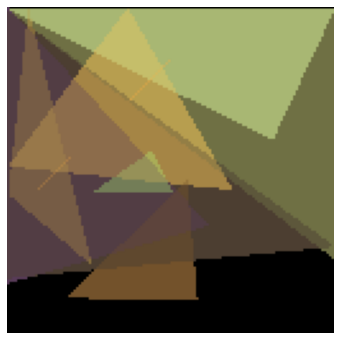

Iteration: 29000, Number of traingles: 10, Score: 1176573.8689988349


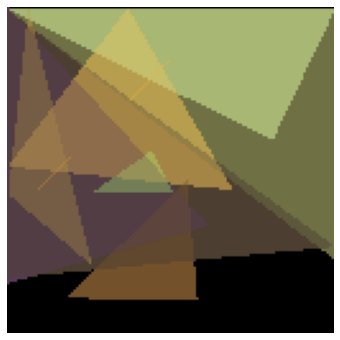

Iteration: 30000, Number of traingles: 10, Score: 1176750.033539535


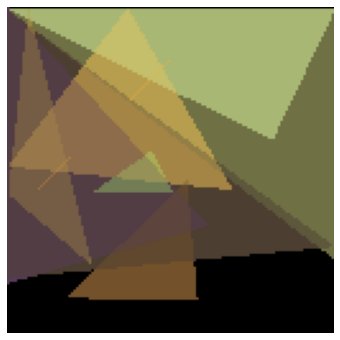

Iteration: 31000, Number of traingles: 10, Score: 1176471.2559719358


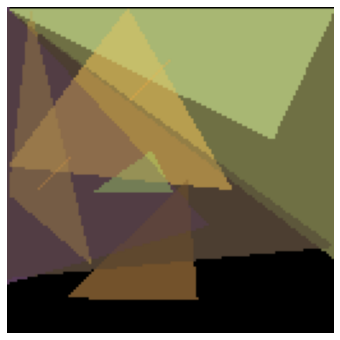

Iteration: 32000, Number of traingles: 10, Score: 1176977.4874111915


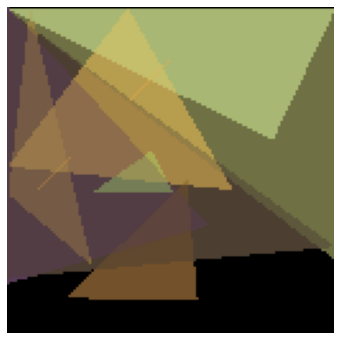

Iteration: 33000, Number of traingles: 10, Score: 1177350.2565092128


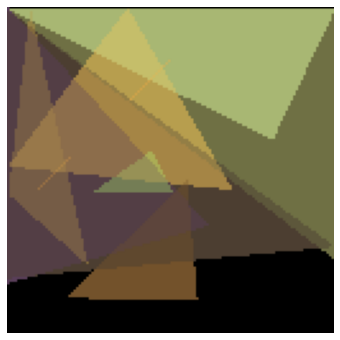

Iteration: 34000, Number of traingles: 10, Score: 1177600.5956755101


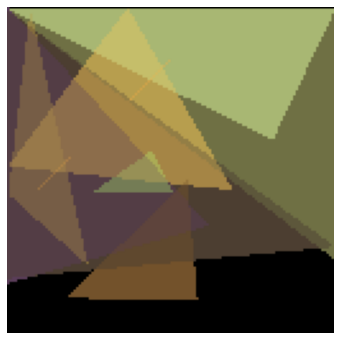

Iteration: 35000, Number of traingles: 10, Score: 1177529.0959479166


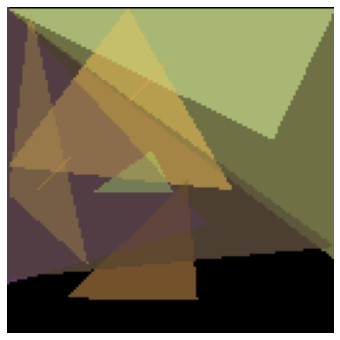

Iteration: 36000, Number of traingles: 10, Score: 1177737.4743333082


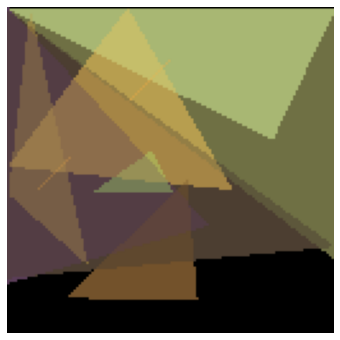

Iteration: 37000, Number of traingles: 10, Score: 1177860.7812555698


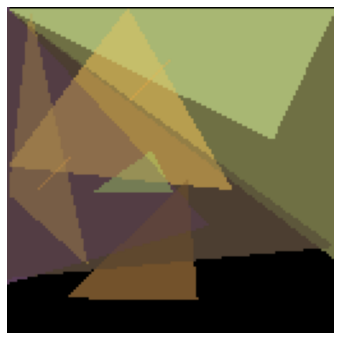

Iteration: 38000, Number of traingles: 10, Score: 1177933.7933004554


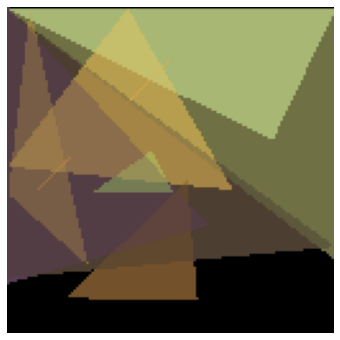

Iteration: 39000, Number of traingles: 10, Score: 1177848.2621261699


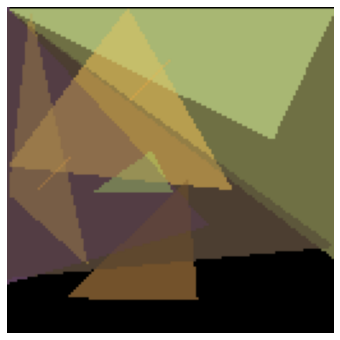

Iteration: 40000, Number of traingles: 10, Score: 1177853.5131721452


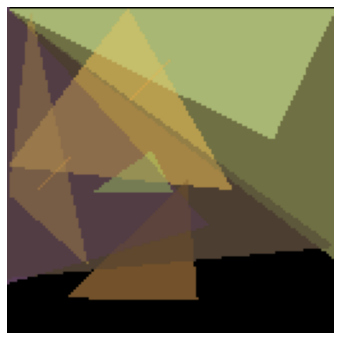

Adding new triangles!!! Best solution so far showed below
Iteration: 40001, Number of traingles: 10, Score: 1177853.5131721452


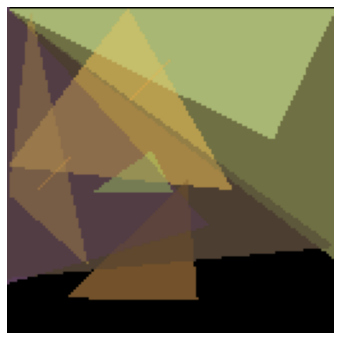

Iteration: 41000, Number of traingles: 15, Score: 1185891.4909680728


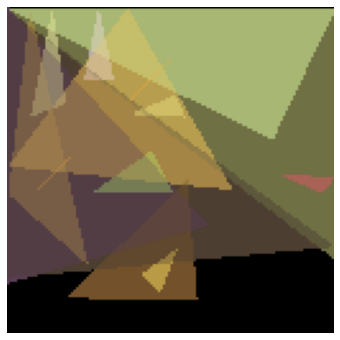

Iteration: 42000, Number of traingles: 15, Score: 1212744.0572912763


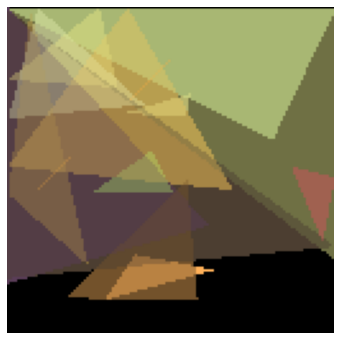

Iteration: 43000, Number of traingles: 15, Score: 1224272.9974263054


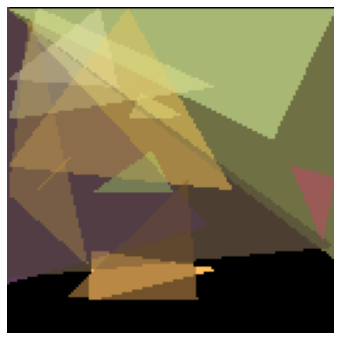

Iteration: 44000, Number of traingles: 15, Score: 1223042.7055850201


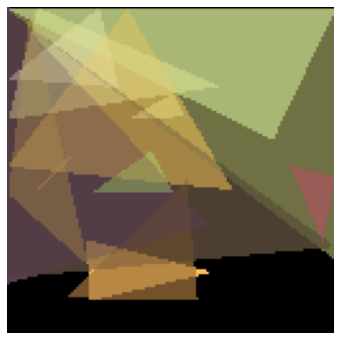

Iteration: 45000, Number of traingles: 15, Score: 1224736.5148368394


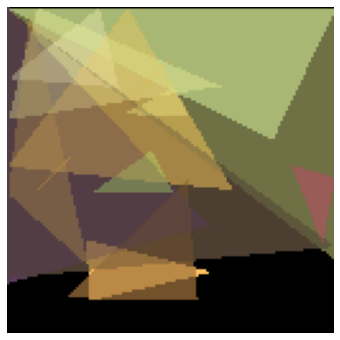

Iteration: 46000, Number of traingles: 15, Score: 1231206.888852749


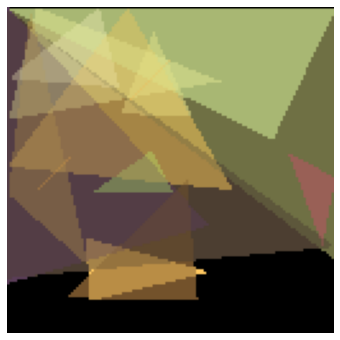

Iteration: 47000, Number of traingles: 15, Score: 1233774.5341654203


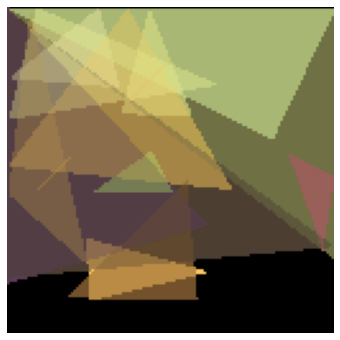

Iteration: 48000, Number of traingles: 15, Score: 1234202.260408971


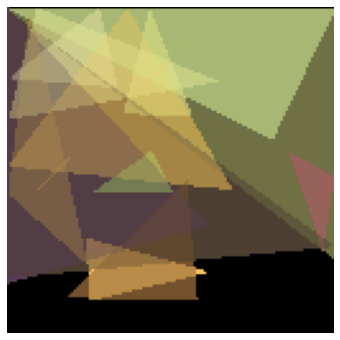

Iteration: 49000, Number of traingles: 15, Score: 1232488.4238583297


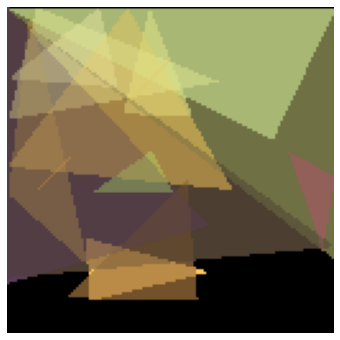

Iteration: 50000, Number of traingles: 15, Score: 1233259.0409416491


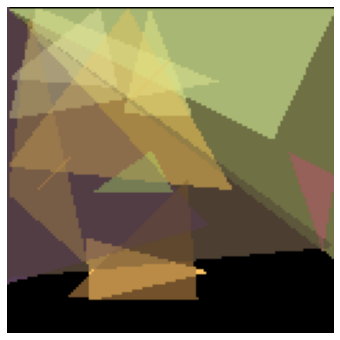

Iteration: 51000, Number of traingles: 15, Score: 1232317.3617576524


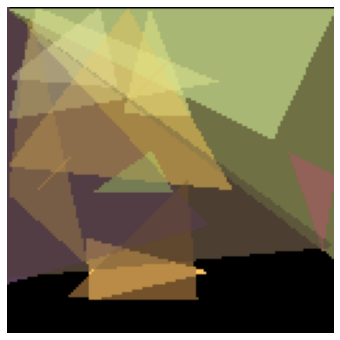

Iteration: 52000, Number of traingles: 15, Score: 1237446.0108279018


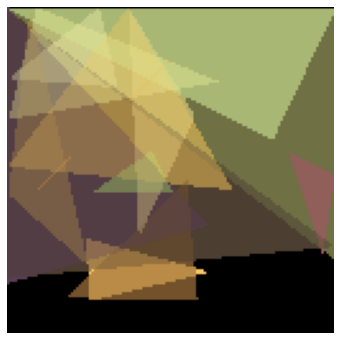

Iteration: 53000, Number of traingles: 15, Score: 1269333.3026063833


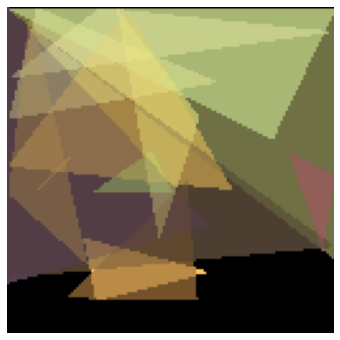

Iteration: 54000, Number of traingles: 15, Score: 1267571.5478534072


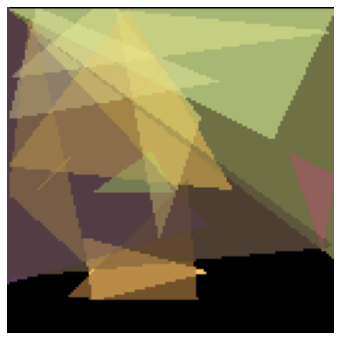

Iteration: 55000, Number of traingles: 15, Score: 1270143.9496493186


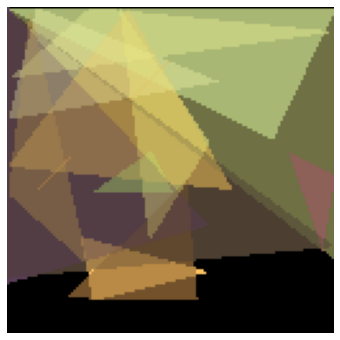

Iteration: 56000, Number of traingles: 15, Score: 1271618.2088681678


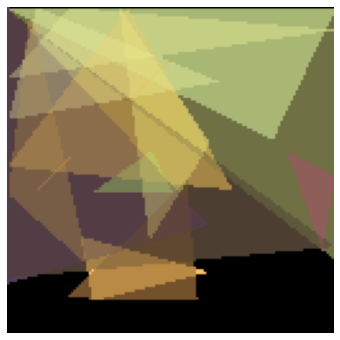

Iteration: 57000, Number of traingles: 15, Score: 1261539.111136514


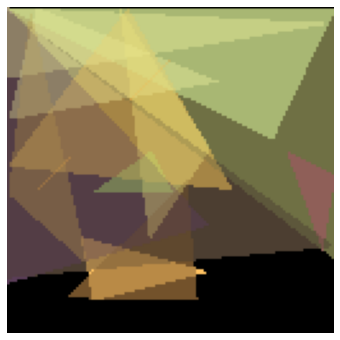

Iteration: 58000, Number of traingles: 15, Score: 1263358.161131431


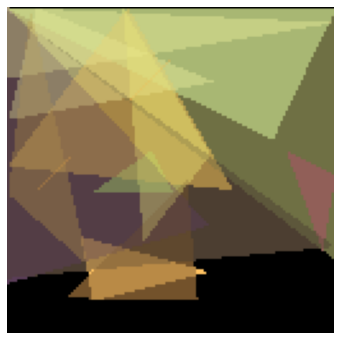

Iteration: 59000, Number of traingles: 15, Score: 1261875.0981796253


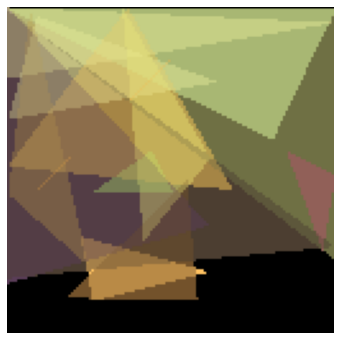

Iteration: 60000, Number of traingles: 15, Score: 1262503.7409149283


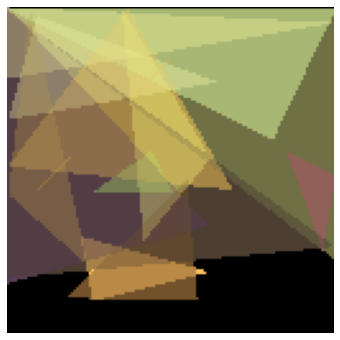

Adding new triangles!!! Best solution so far showed below
Iteration: 60001, Number of traingles: 15, Score: 1262503.7409149283


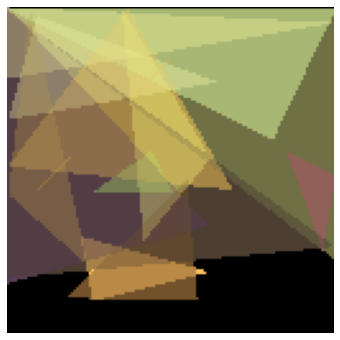

Iteration: 61000, Number of traingles: 20, Score: 1269584.2306052125


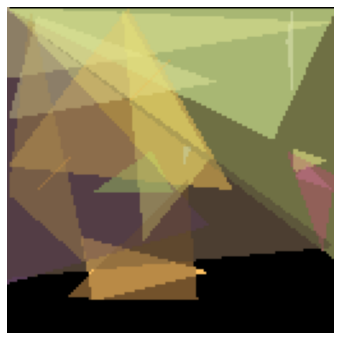

Iteration: 62000, Number of traingles: 20, Score: 1269458.204543581


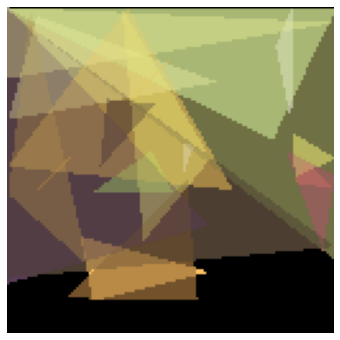

Iteration: 63000, Number of traingles: 20, Score: 1270230.626181291


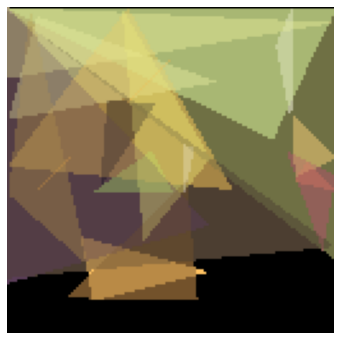

Iteration: 64000, Number of traingles: 20, Score: 1306702.65876716


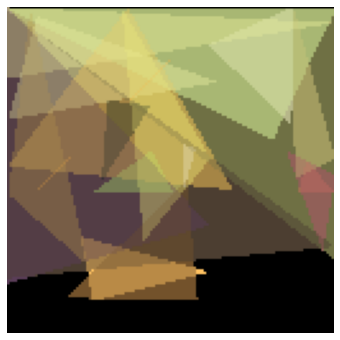

Iteration: 65000, Number of traingles: 20, Score: 1303375.4877916735


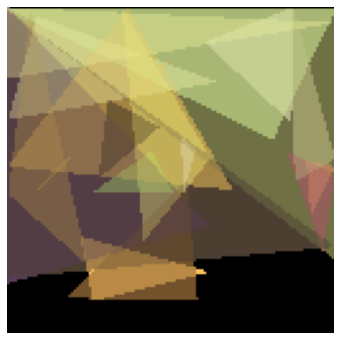

Iteration: 66000, Number of traingles: 20, Score: 1305745.5638807253


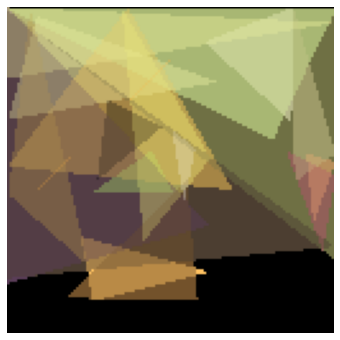

Iteration: 67000, Number of traingles: 20, Score: 1300960.564035837


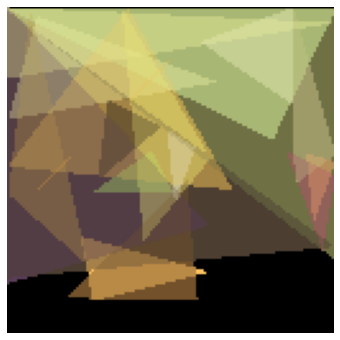

Iteration: 68000, Number of traingles: 20, Score: 1304400.098384112


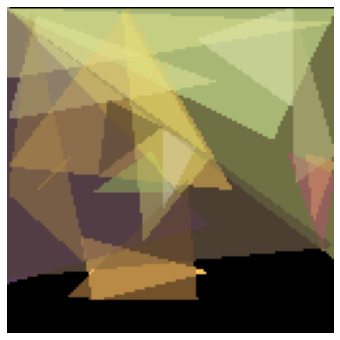

Iteration: 69000, Number of traingles: 20, Score: 1305592.8653223692


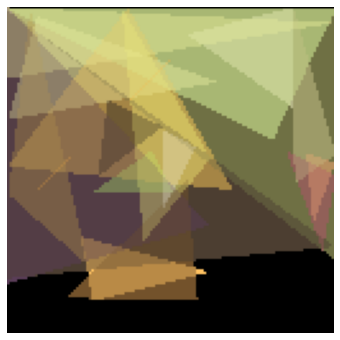

Iteration: 70000, Number of traingles: 20, Score: 1308058.7850384312


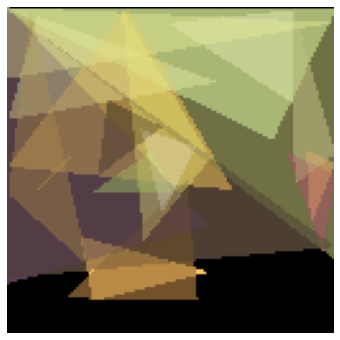

Iteration: 71000, Number of traingles: 20, Score: 1304728.1568354522


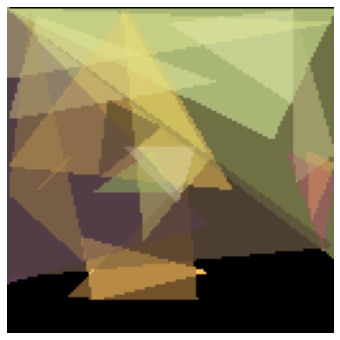

Iteration: 72000, Number of traingles: 20, Score: 1306563.7498527966


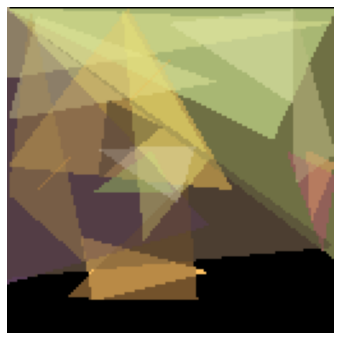

Iteration: 73000, Number of traingles: 20, Score: 1305327.3937728903


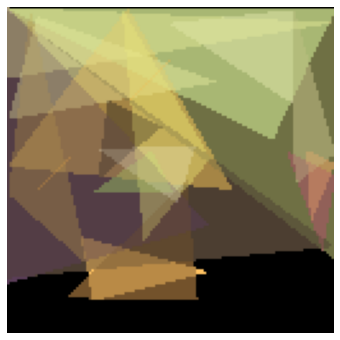

Iteration: 74000, Number of traingles: 20, Score: 1305470.6212240006


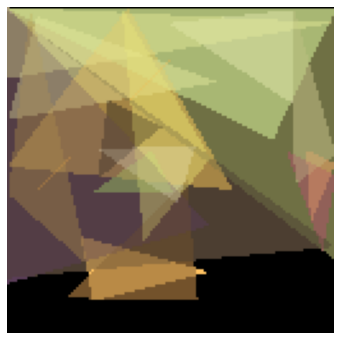

KeyboardInterrupt: 

In [22]:
esOnePlusOneSelfAdaptation(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(128, 128), 
                           chromosome_length=5, population_size=50, number_of_iterations=100000, 
                           mutation_prob=0.05, sigma_x=10.0, sigma_rgb=25.0, 
                           clip=True, log_frequency=1000, expanding_interval=20000, scale_fun=None)

Iteration: 1000, Number of traingles: 5, Score: 1872547.5342294108


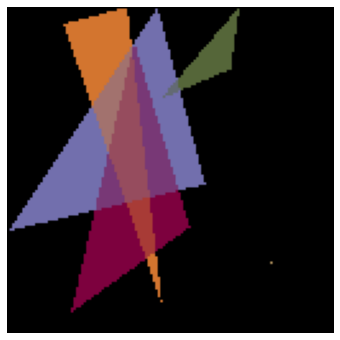

Iteration: 2000, Number of traingles: 5, Score: 1439750.3559472947


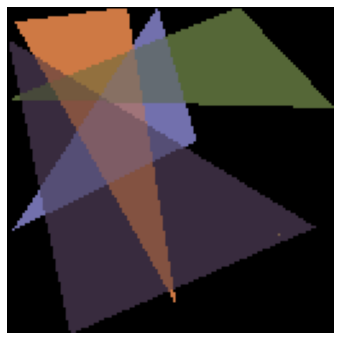

Iteration: 3000, Number of traingles: 5, Score: 1325698.582126114


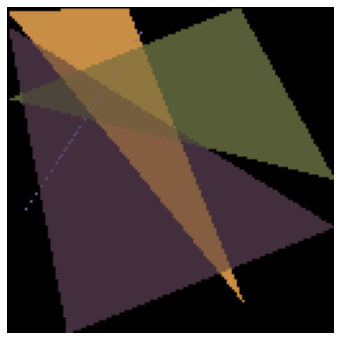

Iteration: 4000, Number of traingles: 5, Score: 1317876.4726703719


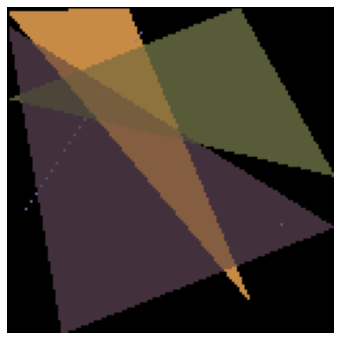

Iteration: 5000, Number of traingles: 5, Score: 1298398.279097193


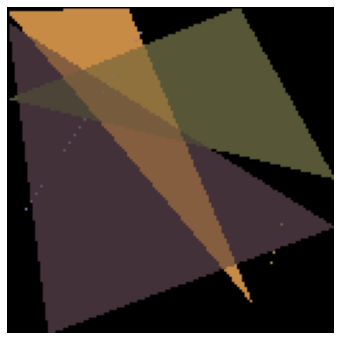

Iteration: 6000, Number of traingles: 5, Score: 1250417.273352512


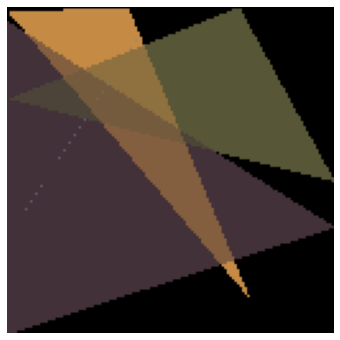

Iteration: 7000, Number of traingles: 5, Score: 1236541.981471317


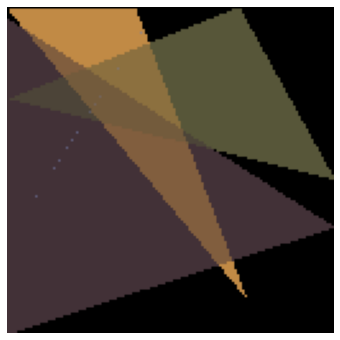

Iteration: 8000, Number of traingles: 5, Score: 1220158.0193671235


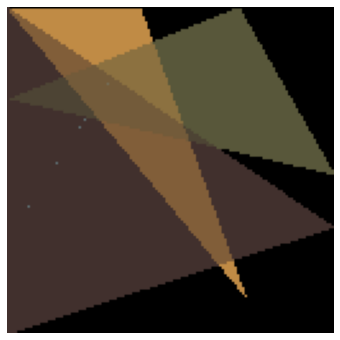

Iteration: 9000, Number of traingles: 5, Score: 1195869.1777839984


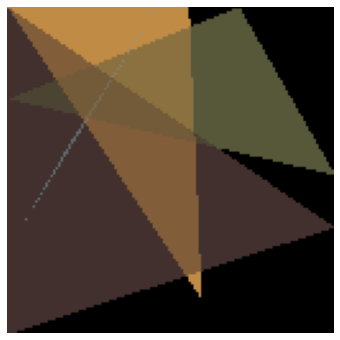

Iteration: 10000, Number of traingles: 5, Score: 1195036.9876155318


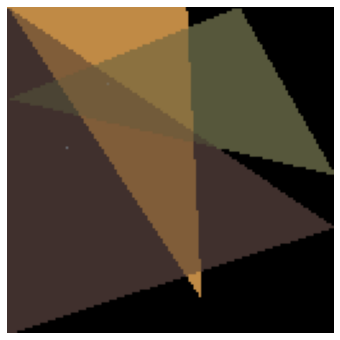

Iteration: 11000, Number of traingles: 5, Score: 1194014.679501975


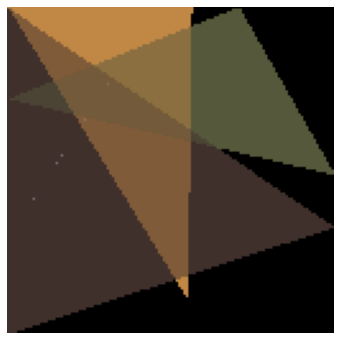

Iteration: 12000, Number of traingles: 5, Score: 1192428.046897133


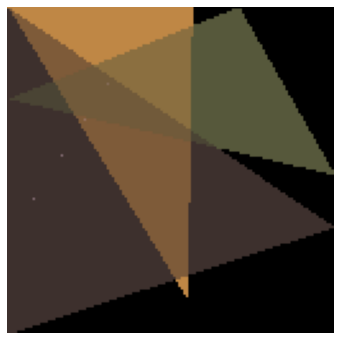

Iteration: 13000, Number of traingles: 5, Score: 1185708.3984090348


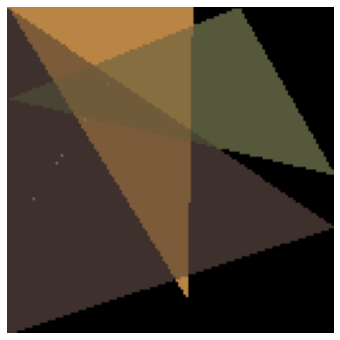

Iteration: 14000, Number of traingles: 5, Score: 1181293.8030363708


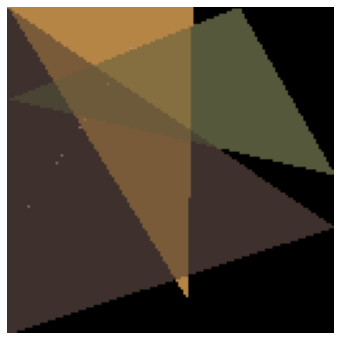

Iteration: 15000, Number of traingles: 5, Score: 1178646.1311238143


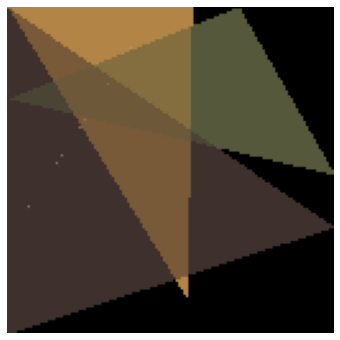

Iteration: 16000, Number of traingles: 5, Score: 1178332.9801310487


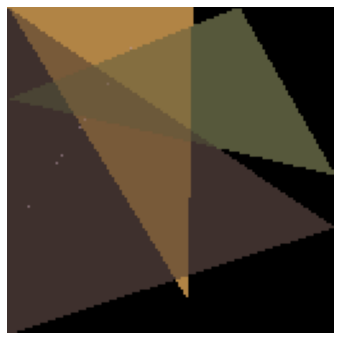

Iteration: 17000, Number of traingles: 5, Score: 1177215.8241251106


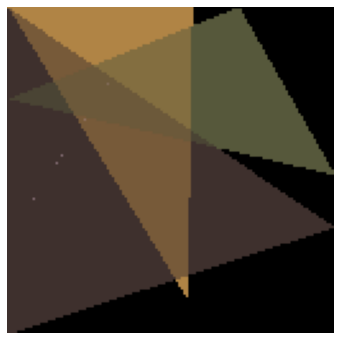

Iteration: 18000, Number of traingles: 5, Score: 1168743.6590805599


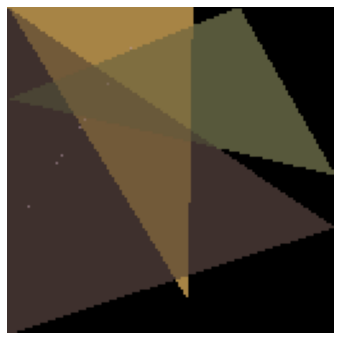

Iteration: 19000, Number of traingles: 5, Score: 1162770.4185288874


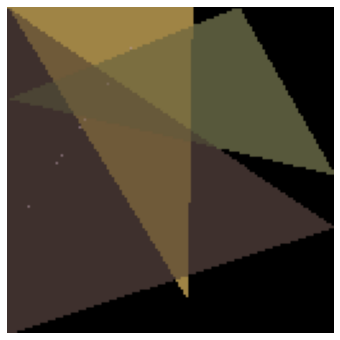

Iteration: 20000, Number of traingles: 5, Score: 1158047.4153418834


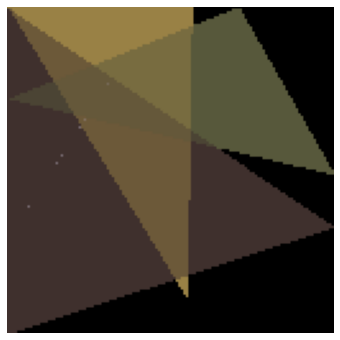

Adding new triangles!!! Best solution so far showed below
Iteration: 20001, Number of traingles: 5, Score: 1158047.4153418834


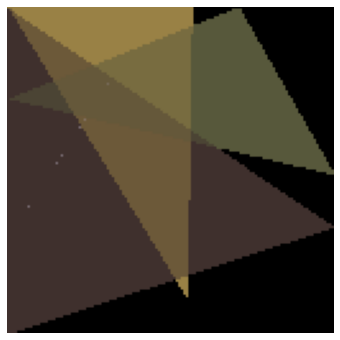

Iteration: 21000, Number of traingles: 10, Score: 1099609.772183326


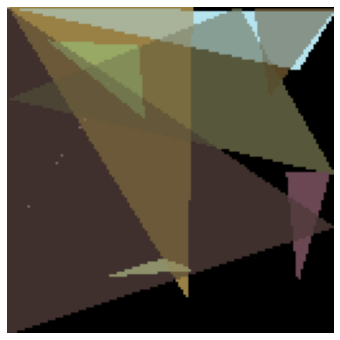

Iteration: 22000, Number of traingles: 10, Score: 1108775.9197920007


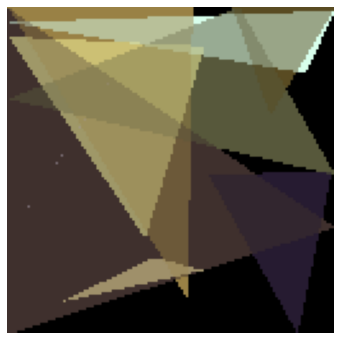

Iteration: 23000, Number of traingles: 10, Score: 1051892.8373985551


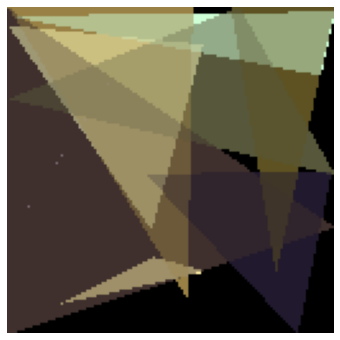

Iteration: 24000, Number of traingles: 10, Score: 977299.4198544807


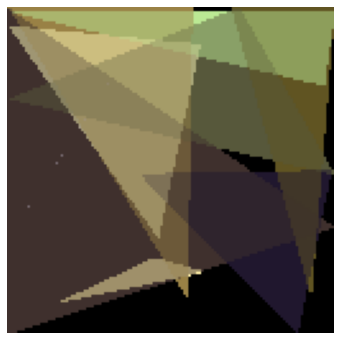

Iteration: 25000, Number of traingles: 10, Score: 1001812.8948234003


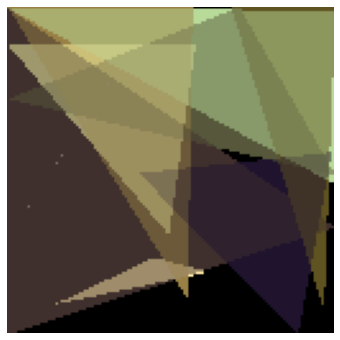

Iteration: 26000, Number of traingles: 10, Score: 955618.7141646739


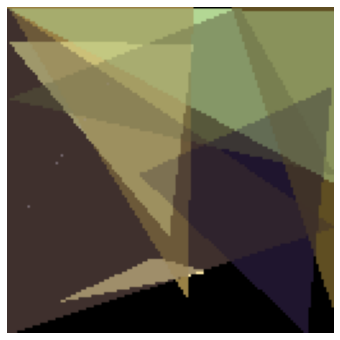

Iteration: 27000, Number of traingles: 10, Score: 954574.8078291252


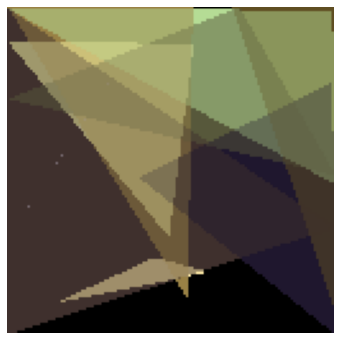

Iteration: 28000, Number of traingles: 10, Score: 956734.3374728197


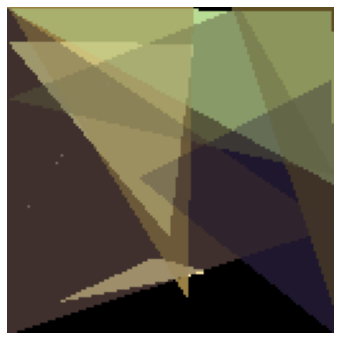

Iteration: 29000, Number of traingles: 10, Score: 954782.5743252647


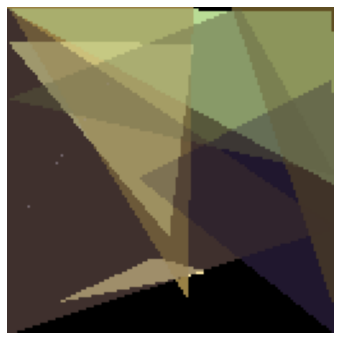

Iteration: 30000, Number of traingles: 10, Score: 939017.8074033778


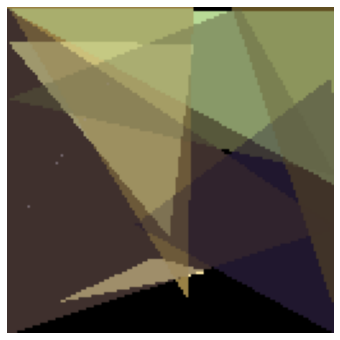

Iteration: 31000, Number of traingles: 10, Score: 939545.9679814875


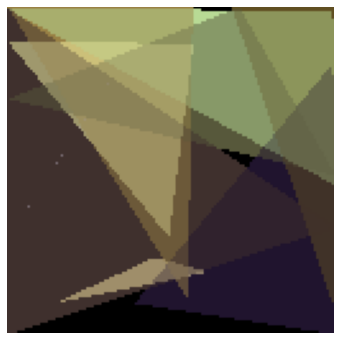

Iteration: 32000, Number of traingles: 10, Score: 939690.4624099624


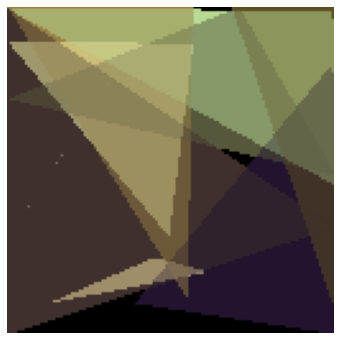

Iteration: 33000, Number of traingles: 10, Score: 938467.919814797


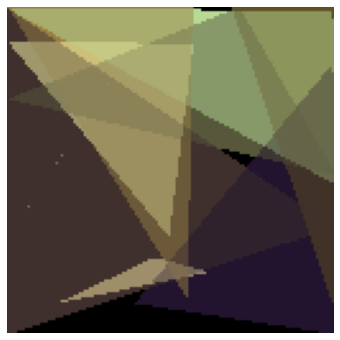

Iteration: 34000, Number of traingles: 10, Score: 938502.2592393719


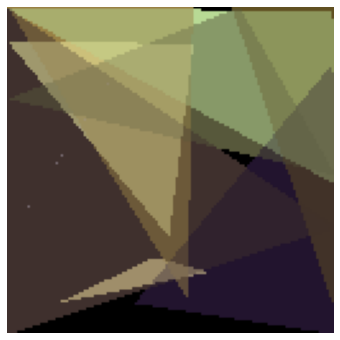

Iteration: 35000, Number of traingles: 10, Score: 938393.7226203848


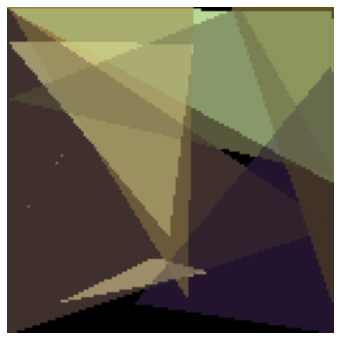

Iteration: 36000, Number of traingles: 10, Score: 938501.7884272891


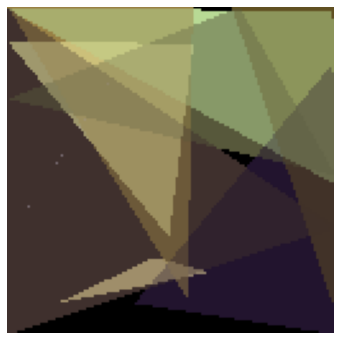

Iteration: 37000, Number of traingles: 10, Score: 939002.9101079116


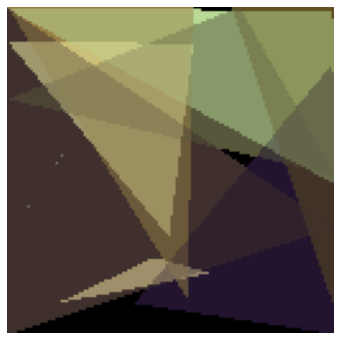

Iteration: 38000, Number of traingles: 10, Score: 939875.8414820299


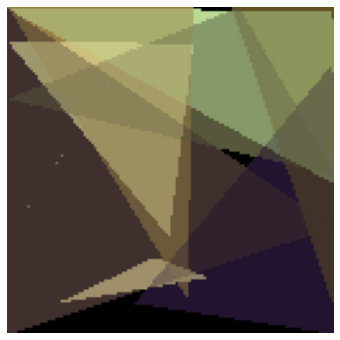

Iteration: 39000, Number of traingles: 10, Score: 939905.1109990841


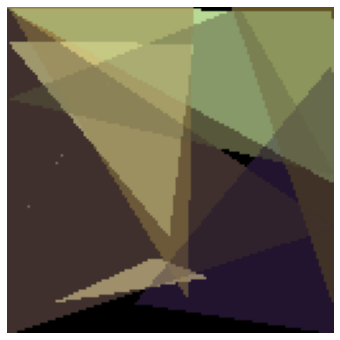

Iteration: 40000, Number of traingles: 10, Score: 939715.3942451151


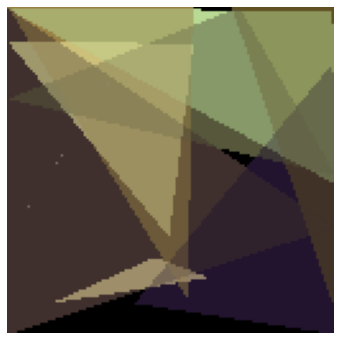

Adding new triangles!!! Best solution so far showed below
Iteration: 40001, Number of traingles: 10, Score: 939715.3942451151


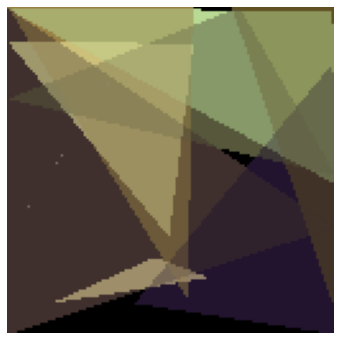

Iteration: 41000, Number of traingles: 15, Score: 938308.2400237878


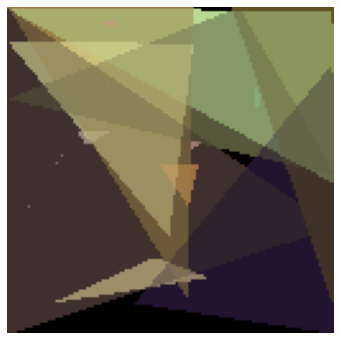

Iteration: 42000, Number of traingles: 15, Score: 947360.9083547462


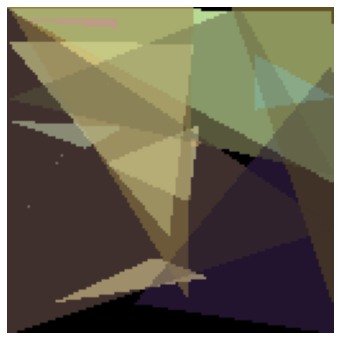

Iteration: 43000, Number of traingles: 15, Score: 984475.1354332081


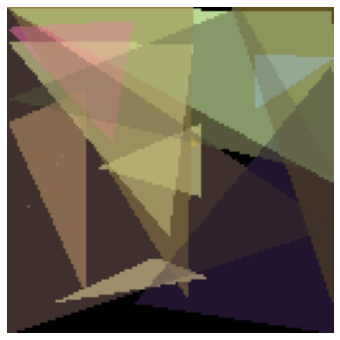

Iteration: 44000, Number of traingles: 15, Score: 1047884.1255753539


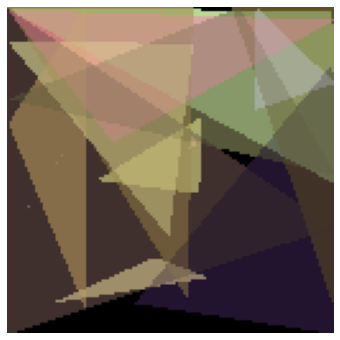

Iteration: 45000, Number of traingles: 15, Score: 1045935.2295804021


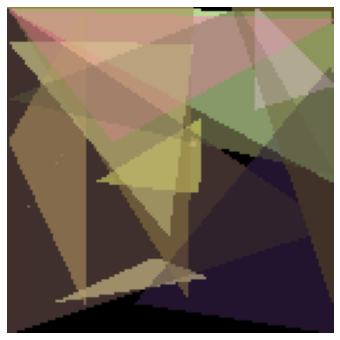

Iteration: 46000, Number of traingles: 15, Score: 1046897.4484210687


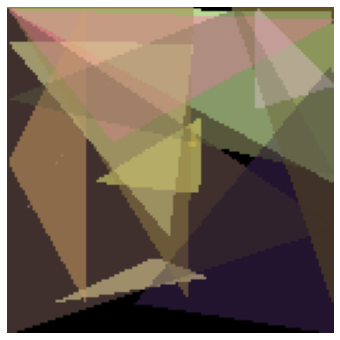

KeyboardInterrupt: 

In [23]:
esOnePlusOneSelfAdaptation(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(128, 128), 
                           chromosome_length=5, population_size=50, number_of_iterations=100000, 
                           mutation_prob=0.05, sigma_x=1.0, sigma_rgb=1.0, 
                           clip=True, log_frequency=1000, expanding_interval=20000, scale_fun=None)

Iteration: 1000, Number of traingles: 5, Score: 1640089.5767231074


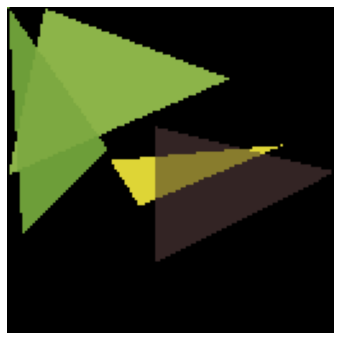

Iteration: 2000, Number of traingles: 5, Score: 1469154.050373418


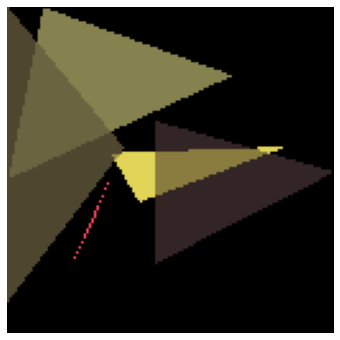

Iteration: 3000, Number of traingles: 5, Score: 1414468.150680976


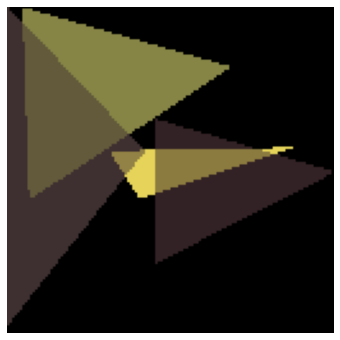

Iteration: 4000, Number of traingles: 5, Score: 1263687.0456282427


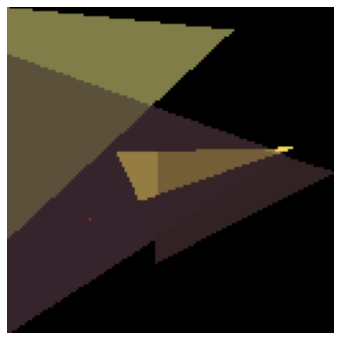

Iteration: 5000, Number of traingles: 5, Score: 1107032.6663621783


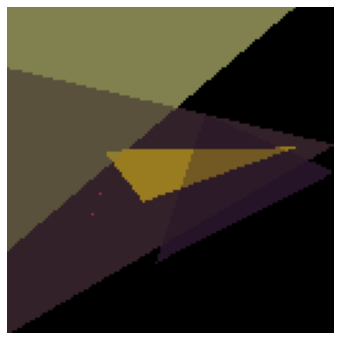

Iteration: 6000, Number of traingles: 5, Score: 937135.1742853967


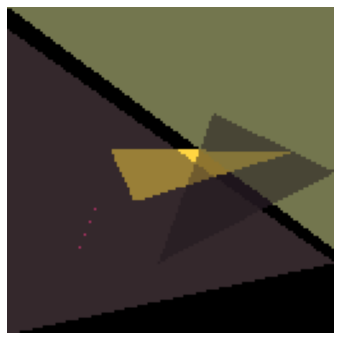

Iteration: 7000, Number of traingles: 5, Score: 887372.7574654553


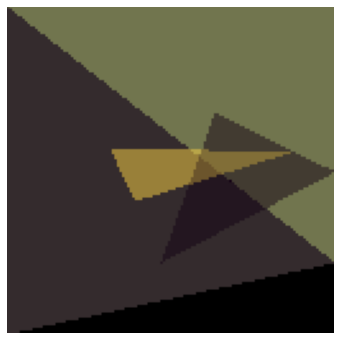

Iteration: 8000, Number of traingles: 5, Score: 886524.3839087149


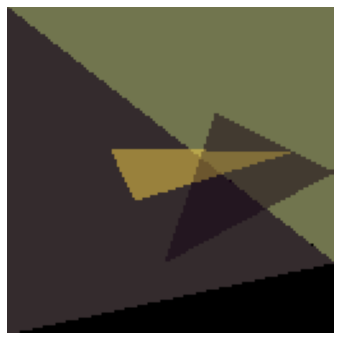

Iteration: 9000, Number of traingles: 5, Score: 873614.0687595593


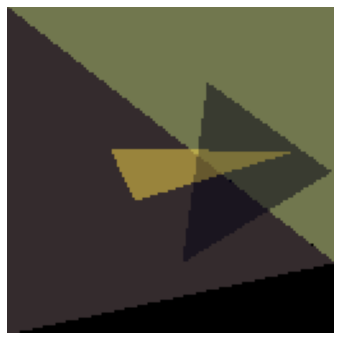

Iteration: 10000, Number of traingles: 5, Score: 865472.0603206492


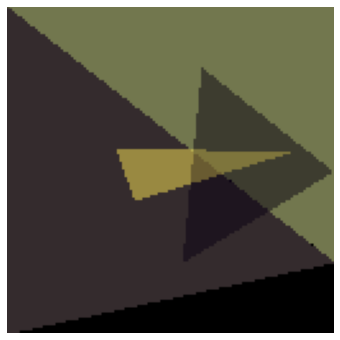

Iteration: 11000, Number of traingles: 5, Score: 863190.9175284845


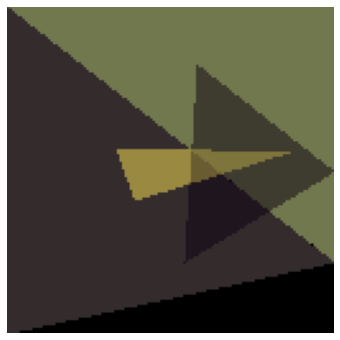

Iteration: 12000, Number of traingles: 5, Score: 857080.7272469245


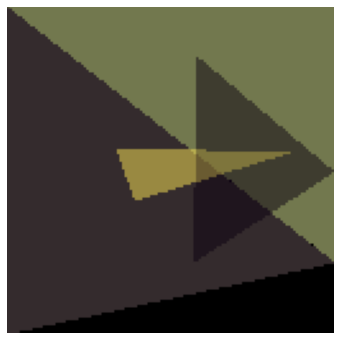

Iteration: 13000, Number of traingles: 5, Score: 849239.7807011963


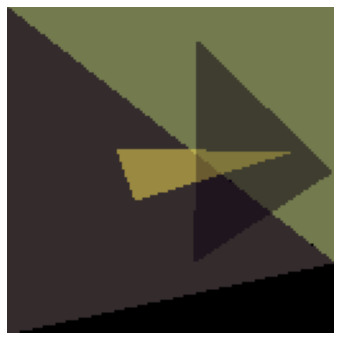

Iteration: 14000, Number of traingles: 5, Score: 848445.4636569596


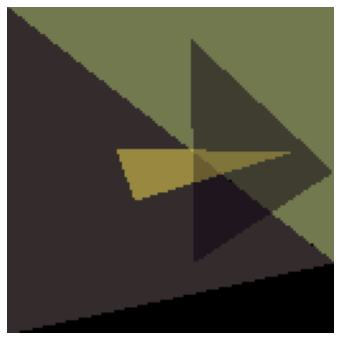

Iteration: 15000, Number of traingles: 5, Score: 845841.7865219719


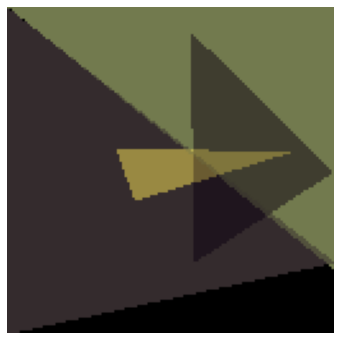

Iteration: 16000, Number of traingles: 5, Score: 843867.5345043611


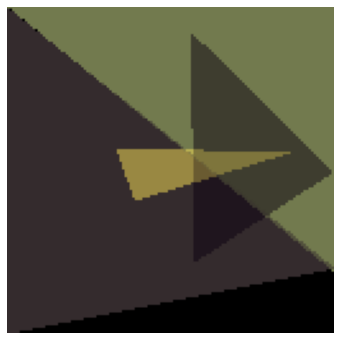

Iteration: 17000, Number of traingles: 5, Score: 843456.1788562153


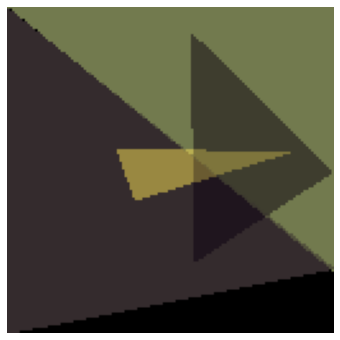

Iteration: 18000, Number of traingles: 5, Score: 843373.2975505302


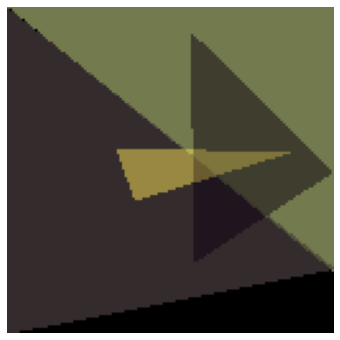

Iteration: 19000, Number of traingles: 5, Score: 842479.5176782849


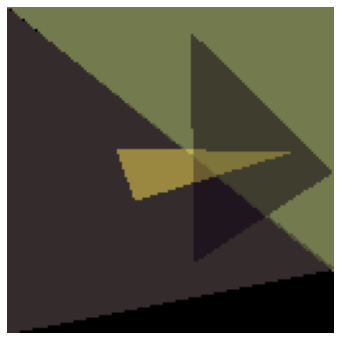

Iteration: 20000, Number of traingles: 5, Score: 841452.1189683127


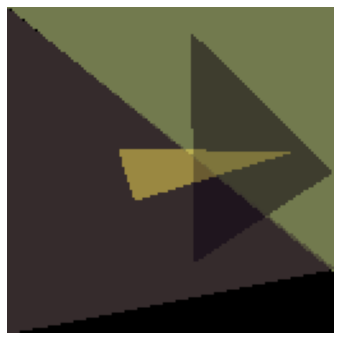

Adding new triangles!!! Best solution so far showed below
Iteration: 20001, Number of traingles: 5, Score: 841452.1189683127


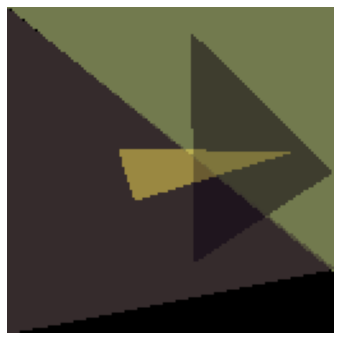

Iteration: 21000, Number of traingles: 10, Score: 1150510.9208599434


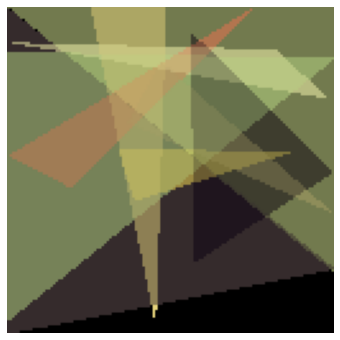

Iteration: 22000, Number of traingles: 10, Score: 1144375.7835322423


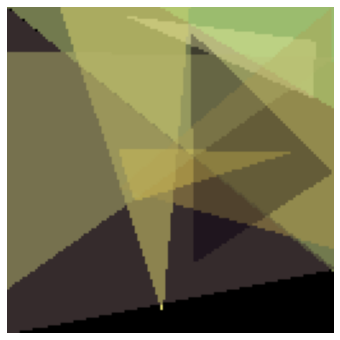

Iteration: 23000, Number of traingles: 10, Score: 1146424.2360918834


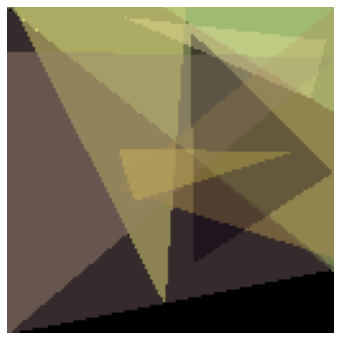

Iteration: 24000, Number of traingles: 10, Score: 1124018.3442823207


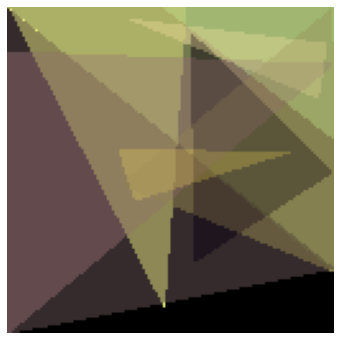

Iteration: 25000, Number of traingles: 10, Score: 1090186.7507431363


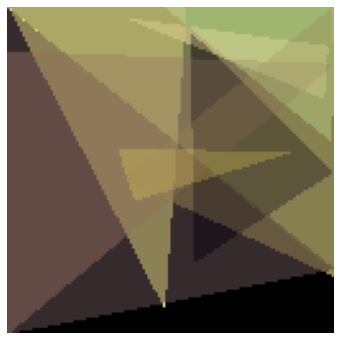

Iteration: 26000, Number of traingles: 10, Score: 1087027.8660551703


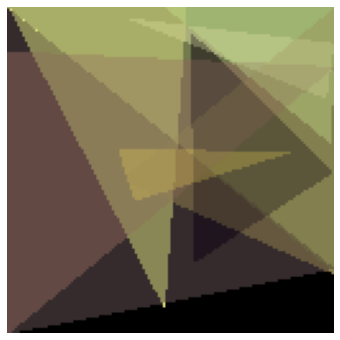

Iteration: 27000, Number of traingles: 10, Score: 1063427.3352937014


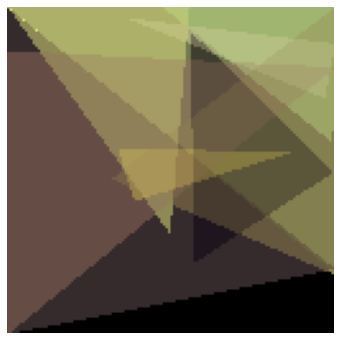

Iteration: 28000, Number of traingles: 10, Score: 1067183.126442962


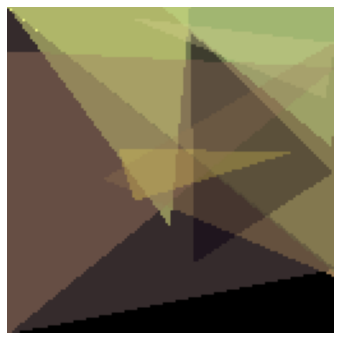

Iteration: 29000, Number of traingles: 10, Score: 1087065.2139062684


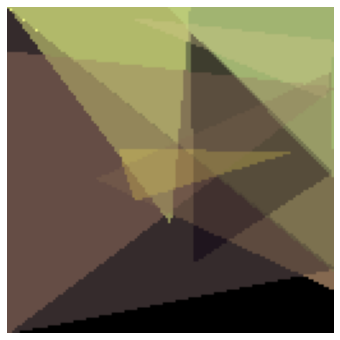

Iteration: 30000, Number of traingles: 10, Score: 1074668.425722695


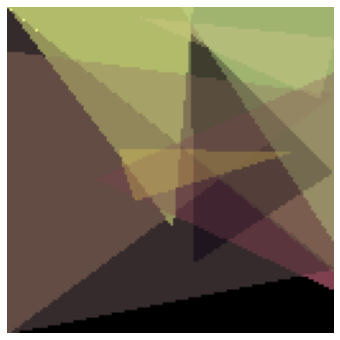

Iteration: 31000, Number of traingles: 10, Score: 1049092.3226384989


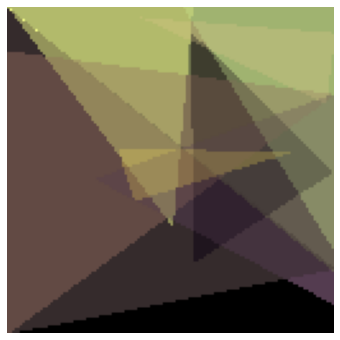

Iteration: 32000, Number of traingles: 10, Score: 1040947.0114662168


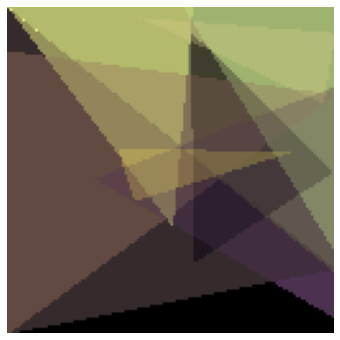

Iteration: 33000, Number of traingles: 10, Score: 1042353.6980993923


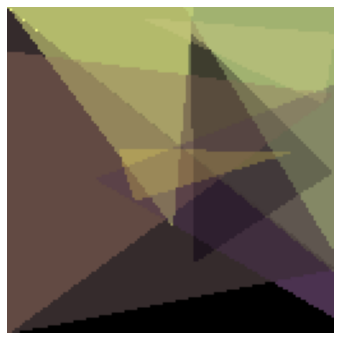

Iteration: 34000, Number of traingles: 10, Score: 1050704.36783313


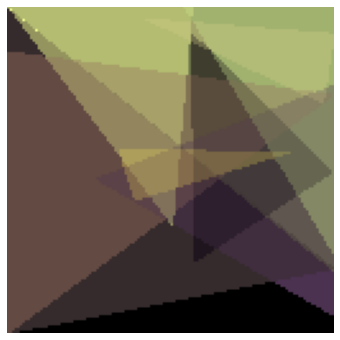

Iteration: 35000, Number of traingles: 10, Score: 1057343.1340491525


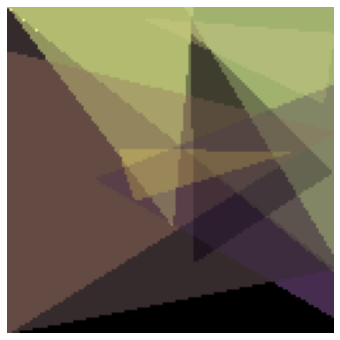

Iteration: 36000, Number of traingles: 10, Score: 1056168.4047364308


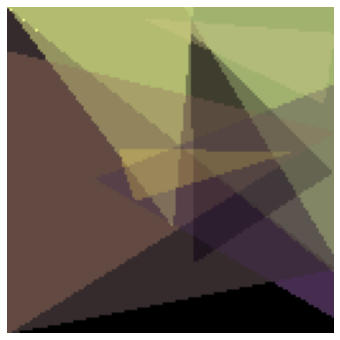

Iteration: 37000, Number of traingles: 10, Score: 1056043.2178771666


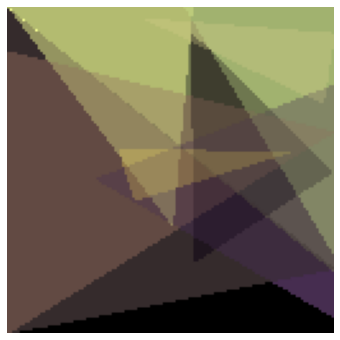

Iteration: 38000, Number of traingles: 10, Score: 1055933.6952585794


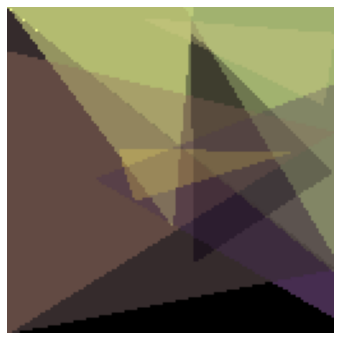

Iteration: 39000, Number of traingles: 10, Score: 1055083.1714025396


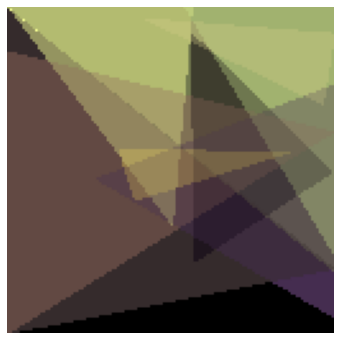

Iteration: 40000, Number of traingles: 10, Score: 1054686.3174754875


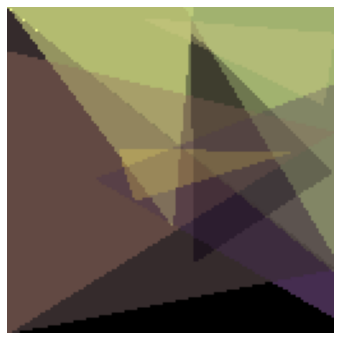

Adding new triangles!!! Best solution so far showed below
Iteration: 40001, Number of traingles: 10, Score: 1054686.3174754875


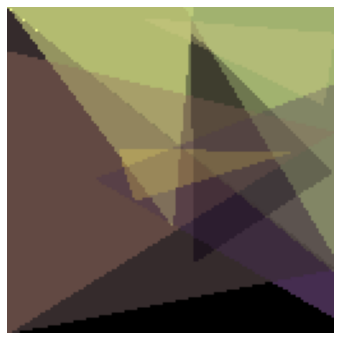

Iteration: 41000, Number of traingles: 15, Score: 1185566.9905837816


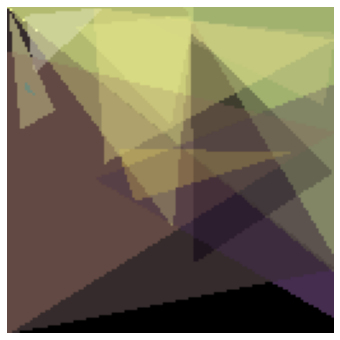

Iteration: 42000, Number of traingles: 15, Score: 1339802.0915210492


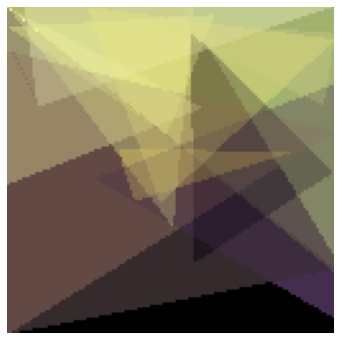

Iteration: 43000, Number of traingles: 15, Score: 1512684.7185058128


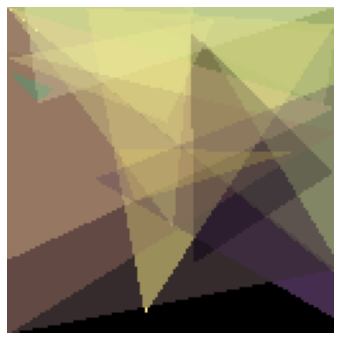

Iteration: 44000, Number of traingles: 15, Score: 1619719.2245507487


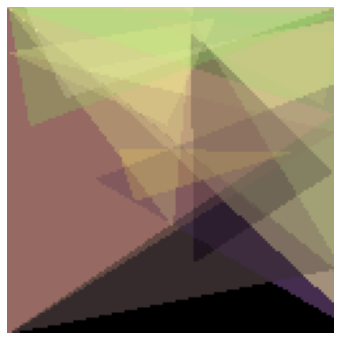

Iteration: 45000, Number of traingles: 15, Score: 1624563.0131133553


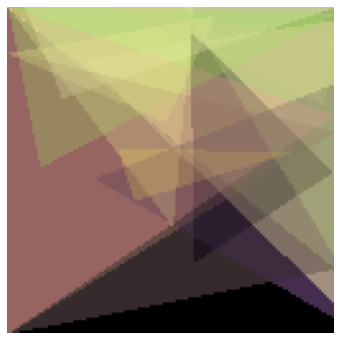

Iteration: 46000, Number of traingles: 15, Score: 1625979.3426890215


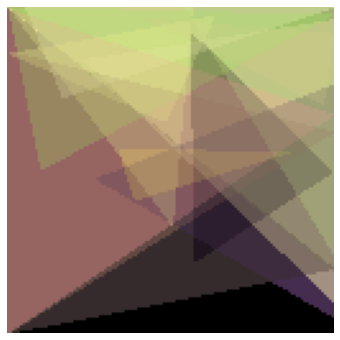

Iteration: 47000, Number of traingles: 15, Score: 1617194.289702408


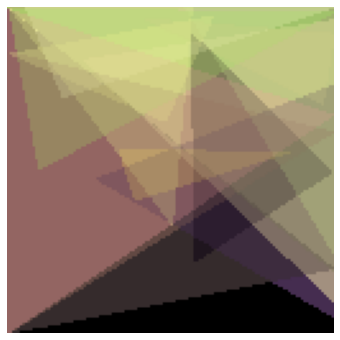

Iteration: 48000, Number of traingles: 15, Score: 1578028.367277953


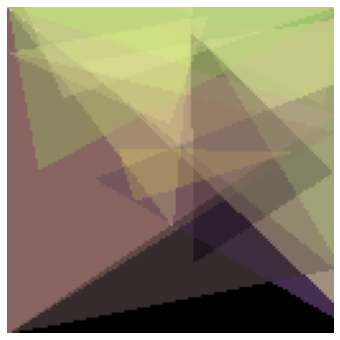

Iteration: 49000, Number of traingles: 15, Score: 1577769.3660472329


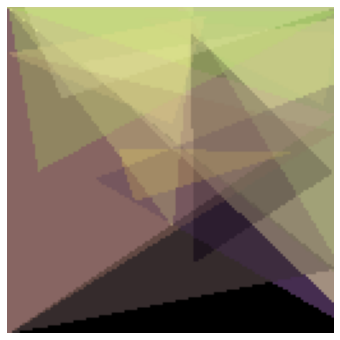

Iteration: 50000, Number of traingles: 15, Score: 1578248.2655324116


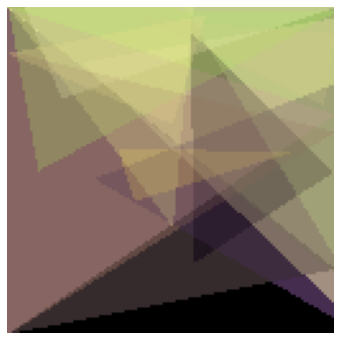

Iteration: 51000, Number of traingles: 15, Score: 1576353.2364484835


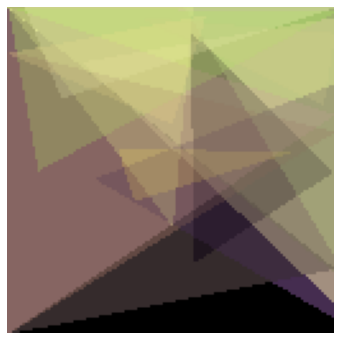

Iteration: 52000, Number of traingles: 15, Score: 1557827.7198683436


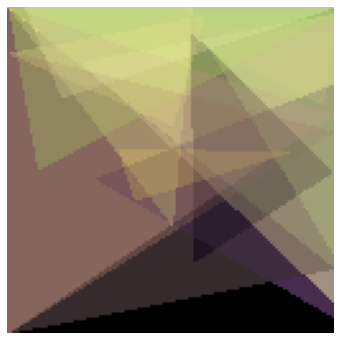

Iteration: 53000, Number of traingles: 15, Score: 1558347.400828461


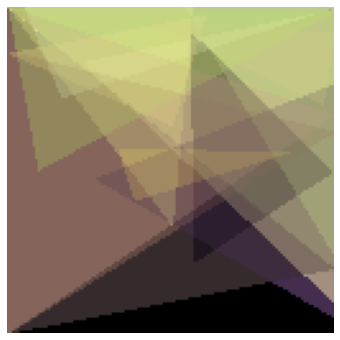

Iteration: 54000, Number of traingles: 15, Score: 1557560.6790440837


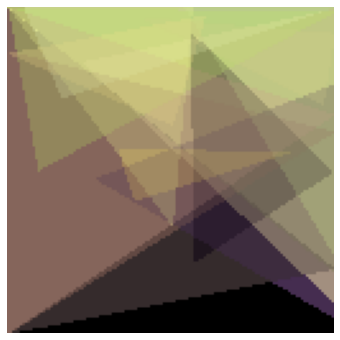

Iteration: 55000, Number of traingles: 15, Score: 1556777.8504536464


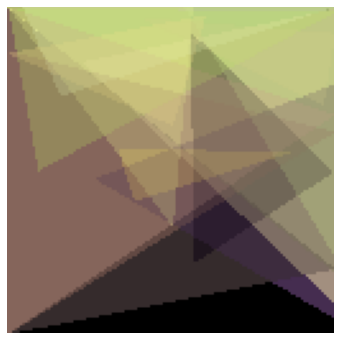

Iteration: 56000, Number of traingles: 15, Score: 1548284.4851505437


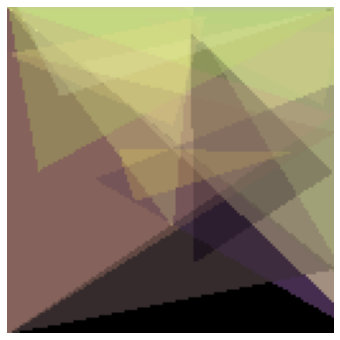

Iteration: 57000, Number of traingles: 15, Score: 1548038.8878633385


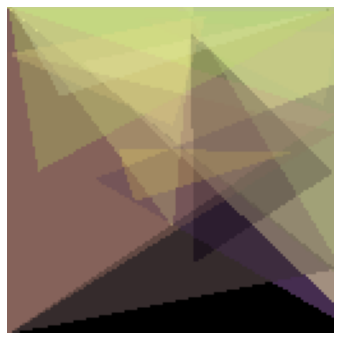

Iteration: 58000, Number of traingles: 15, Score: 1546872.017476142


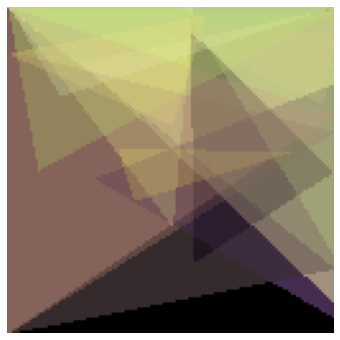

Iteration: 59000, Number of traingles: 15, Score: 1545500.0775198448


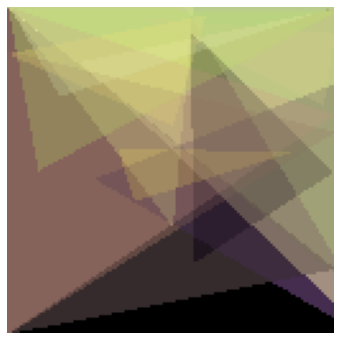

Iteration: 60000, Number of traingles: 15, Score: 1545514.2661744729


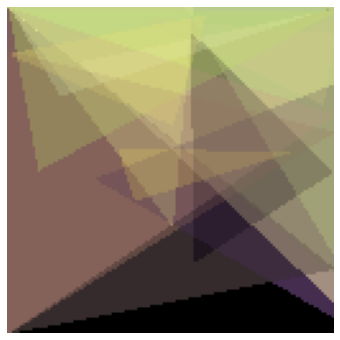

Adding new triangles!!! Best solution so far showed below
Iteration: 60001, Number of traingles: 15, Score: 1545514.2661744729


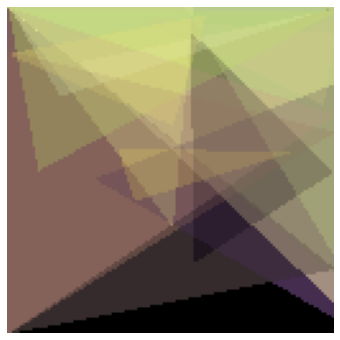

Iteration: 61000, Number of traingles: 20, Score: 1604782.7442286406


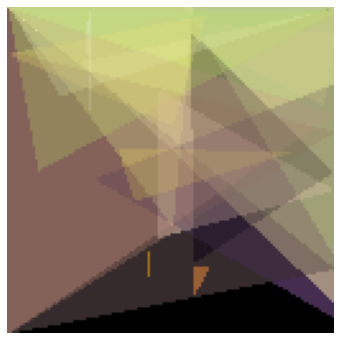

Iteration: 62000, Number of traingles: 20, Score: 1656719.882427533


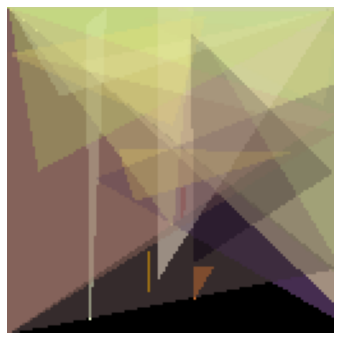

Iteration: 63000, Number of traingles: 20, Score: 1669990.482858881


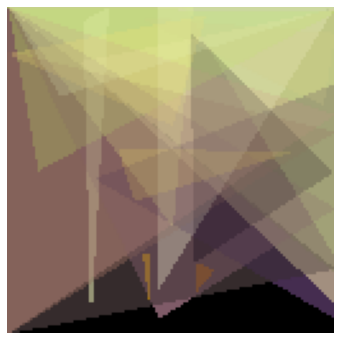

Iteration: 64000, Number of traingles: 20, Score: 1663729.8066721892


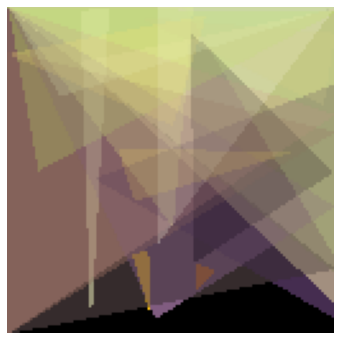

KeyboardInterrupt: 

In [30]:
esOnePlusOneSelfAdaptation(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(128, 128), 
                           chromosome_length=5, population_size=50, number_of_iterations=100000, 
                           mutation_prob=0.05, sigma_x=10.0, sigma_rgb=25.0, 
                           clip=True, log_frequency=1000, expanding_interval=20000, scale_fun=None)

Iteration: 1000, Number of traingles: 5, Score: 1176340.605758389


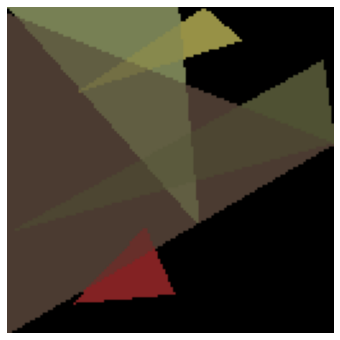

Iteration: 2000, Number of traingles: 5, Score: 1059796.0346161001


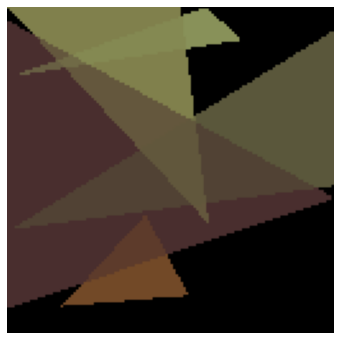

Adding new triangles!!! Best solution so far showed below
Iteration: 2001, Number of traingles: 5, Score: 1059796.0346161001


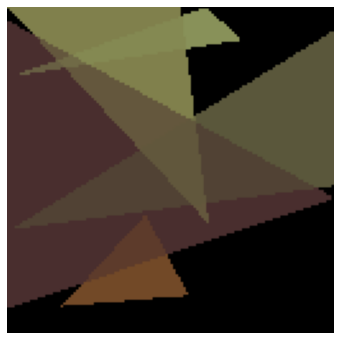

Iteration: 3000, Number of traingles: 10, Score: 1162677.9403679743


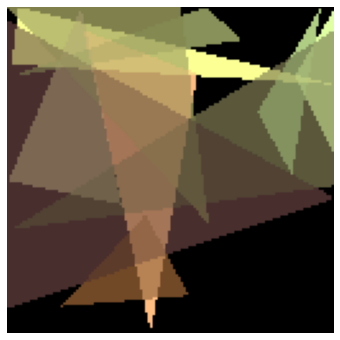

Iteration: 4000, Number of traingles: 10, Score: 1221365.1190764122


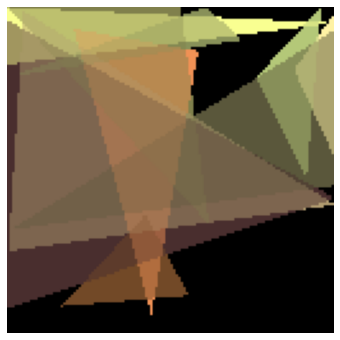

Adding new triangles!!! Best solution so far showed below
Iteration: 4001, Number of traingles: 10, Score: 1221365.1190764122


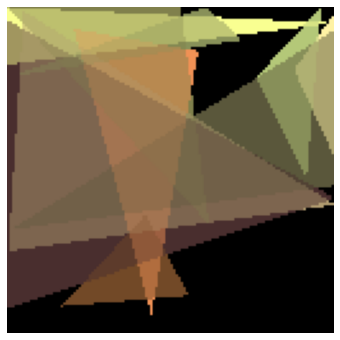

Iteration: 5000, Number of traingles: 15, Score: 1351017.6743146826


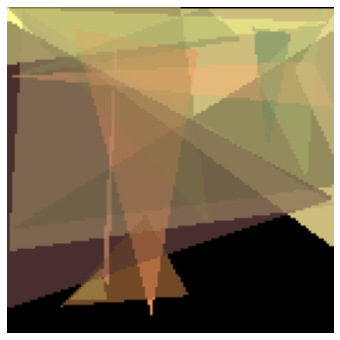

KeyboardInterrupt: 

In [39]:
esOnePlusOneSelfAdaptation(F_average((np.array(r), np.array(g), np.array(b))), picture_shape=(128, 128), 
                           chromosome_length=5, population_size=50, number_of_iterations=100000, 
                           mutation_prob=0.05, sigma_x=10.0, sigma_rgb=25.0, 
                           clip=True, log_frequency=1000, expanding_interval=2000, scale_fun=None)

# Some code testing

In [143]:
test_picture = (np.ones((10, 10)), np.ones((10, 10)), np.ones((10, 10)))
test_f = F_sum(test_picture)
test_X = np.array([0, 0, 9, 0, 9, 9])
test_Y = np.array([0, 9, 0, 9, 0, 9])
test_R = np.array([1, 1])
test_G = np.array([1, 1])
test_B = np.array([1, 1])
# test_X = np.array([0, 0, 9, ])
# test_Y = np.array([0, 9, 0, ])
# test_R = np.array([1])
# test_G = np.array([1])
# test_B = np.array([1])
test_f(test_X, test_Y, test_R, test_G, test_B)

(17.32050807568877,
 (array([[1., 1., 1., 1., 1., 1., 1., 1., 1., 2.],
         [1., 1., 1., 1., 1., 1., 1., 1., 2., 1.],
         [1., 1., 1., 1., 1., 1., 1., 2., 1., 1.],
         [1., 1., 1., 1., 1., 1., 2., 1., 1., 1.],
         [1., 1., 1., 1., 1., 2., 1., 1., 1., 1.],
         [1., 1., 1., 1., 2., 1., 1., 1., 1., 1.],
         [1., 1., 1., 2., 1., 1., 1., 1., 1., 1.],
         [1., 1., 2., 1., 1., 1., 1., 1., 1., 1.],
         [1., 2., 1., 1., 1., 1., 1., 1., 1., 1.],
         [2., 1., 1., 1., 1., 1., 1., 1., 1., 1.]]),
  array([[1., 1., 1., 1., 1., 1., 1., 1., 1., 2.],
         [1., 1., 1., 1., 1., 1., 1., 1., 2., 1.],
         [1., 1., 1., 1., 1., 1., 1., 2., 1., 1.],
         [1., 1., 1., 1., 1., 1., 2., 1., 1., 1.],
         [1., 1., 1., 1., 1., 2., 1., 1., 1., 1.],
         [1., 1., 1., 1., 2., 1., 1., 1., 1., 1.],
         [1., 1., 1., 2., 1., 1., 1., 1., 1., 1.],
         [1., 1., 2., 1., 1., 1., 1., 1., 1., 1.],
         [1., 2., 1., 1., 1., 1., 1., 1., 1., 1.],
         

In [144]:
test_picture = (np.ones((10, 10)), np.ones((10, 10)), np.ones((10, 10)))
test_f = F_average(test_picture)
test_X = np.array([0, 0, 9, 0, 9, 9])
test_Y = np.array([0, 9, 0, 9, 0, 9])
test_R = np.array([1, 1])
test_G = np.array([1, 1])
test_B = np.array([1, 1])
# test_X = np.array([0, 0, 9, ])
# test_Y = np.array([0, 9, 0, ])
# test_R = np.array([1])
# test_G = np.array([1])
# test_B = np.array([1])
test_f(test_X, test_Y, test_R, test_G, test_B)

(0.0,
 (array([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]]),
  array([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1

In [115]:
tupVerts=[(86, 52), (85, 52), (81, 53), (80, 52), (79, 48), (81, 49), (86, 53),
 (85, 51), (82, 54), (84, 54), (83, 49), (81, 52), (80, 50), (81, 48),
 (85, 50), (86, 54), (85, 54), (80, 48), (79, 50), (85, 49), (80, 51),
 (85, 53), (82, 49), (83, 54), (82, 53), (84, 49), (79, 49)]


x, y = np.meshgrid(np.arange(300), np.arange(300)) # make a canvas with coordinates
x, y = x.flatten(), y.flatten()
points = np.vstack((x,y)).T 

p = Path(tupVerts) # make a polygon
grid = p.contains_points(points)
mask = grid.reshape(300,300) # now you have a mask with points inside a polygon
mask

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [38]:
tupVerts=[[2, 3], [5, 7], [1, 6]]

x, y = np.meshgrid(np.arange(8), np.arange(8)) # make a canvas with coordinates
x, y = x.flatten(), y.flatten()
points = np.vstack((x,y)).T 

p = Path(tupVerts) # make a polygon
grid = p.contains_points(points)
# mask = grid.reshape(8,8) # now you have a mask with points inside a polygon
test = mask.astype(np.int8)
print(test)
test[3, 2] = 2
test[7, 5] = 2
test[6, 1] = 2
# test[[(3, 2), (7, 5), (6, 1)]] = 2
print(test)
test

[[0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 1 1 0 0 0 0]
 [0 1 1 1 1 0 0 0]
 [0 0 0 0 0 1 0 0]]
[[0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 2 0 0 0 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 1 1 0 0 0 0]
 [0 2 1 1 1 0 0 0]
 [0 0 0 0 0 2 0 0]]


array([[0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 2, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 1, 1, 0, 0, 0, 0],
       [0, 2, 1, 1, 1, 0, 0, 0],
       [0, 0, 0, 0, 0, 2, 0, 0]], dtype=int8)

In [35]:
tx = np.array(['xA0','xA1', 'xA2', 'xB0','xB1', 'xB2'])
ty = np.array(['yA0','yA1', 'yA2', 'yB0','yB1', 'yB2'])

In [36]:
# t1_x = np.array([['xA0','xA1'], ['xB0','xB1']])
# t1_y = np.array([['yA0','yA1'], ['yB0','yB1']])
t1_x = tx.reshape((tx.shape[0]//3, 3))
t1_y = ty.reshape((ty.shape[0]//3, 3))
t1_x, t1_y

(array([['xA0', 'xA1', 'xA2'],
        ['xB0', 'xB1', 'xB2']], dtype='<U3'),
 array([['yA0', 'yA1', 'yA2'],
        ['yB0', 'yB1', 'yB2']], dtype='<U3'))

In [37]:
np.dstack((t1_x, t1_y))

array([[['xA0', 'yA0'],
        ['xA1', 'yA1'],
        ['xA2', 'yA2']],

       [['xB0', 'yB0'],
        ['xB1', 'yB1'],
        ['xB2', 'yB2']]], dtype='<U3')

In [50]:
testv = np.vectorize(lambda x, y : x+y)
test1 = np.arange(5)
test2 = np.arange(5)*2
test1 [testv(test1, test2) < 6] += 100
test1

array([100, 101,   2,   3,   4])

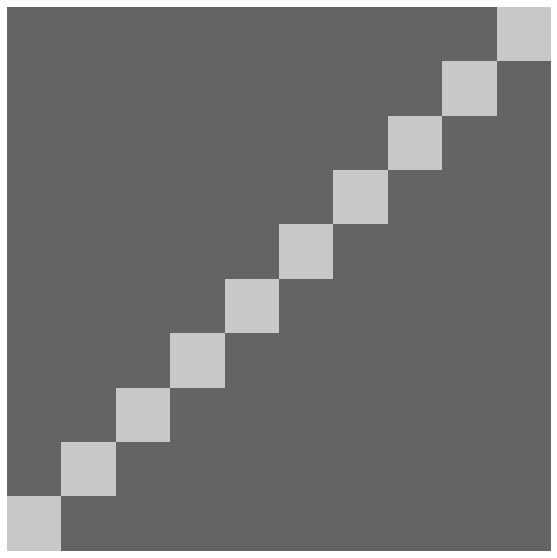

In [109]:
test_picture = (np.ones((10, 10)), np.ones((10, 10)), np.ones((10, 10)))
test_f = F_sum(test_picture)
test_X = np.array([0, 0, 9, 0, 9, 9])
test_Y = np.array([0, 9, 0, 9, 0, 9])
test_R = np.array([1, 1])
test_G = np.array([1, 1])
test_B = np.array([1, 1])
# test_X = np.array([0, 0, 9, ])
# test_Y = np.array([0, 9, 0, ])
# test_R = np.array([1])
# test_G = np.array([1])
# test_B = np.array([1])
test_score, (test_R, test_G, test_B) = test_f(test_X, test_Y, test_R, test_G, test_B)
# print(test_R, test_G, test_B)
draw_image(test_R*100, test_G*100, test_B*100)

In [35]:
test_a = np.array([0, 1, 2, 3, 4, 5])
# np.tile(a, 10).reshape((10, a.shape[0]))
test_b = np.tile(test_a, (10, 1))
test_b

array([[0, 1, 2, 3, 4, 5],
       [0, 1, 2, 3, 4, 5],
       [0, 1, 2, 3, 4, 5],
       [0, 1, 2, 3, 4, 5],
       [0, 1, 2, 3, 4, 5],
       [0, 1, 2, 3, 4, 5],
       [0, 1, 2, 3, 4, 5],
       [0, 1, 2, 3, 4, 5],
       [0, 1, 2, 3, 4, 5],
       [0, 1, 2, 3, 4, 5]])

In [36]:
test_a[-2:]

array([4, 5])

In [37]:
test_a[-1:]

array([5])

In [38]:
test_b[:, -1:]

array([[5],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5]])

In [40]:
test_b[test_a[0]]

array([0, 1, 2, 3, 4, 5])

In [47]:
1.0e-3

0.001

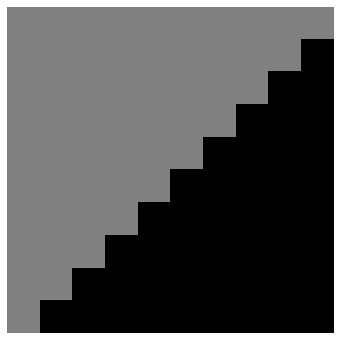

(array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]),
 array([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]

In [36]:
test_picture = (np.ones((10, 10)), np.ones((10, 10)), np.ones((10, 10)))
test_f = F_average(test_picture)
test_X = np.array([0, 0, 9])
test_Y = np.array([0, 9, 0,])
test_R = np.array([255])
test_G = np.array([255])
test_B = np.array([255])
# test_X = np.array([0, 0, 9, ])
# test_Y = np.array([0, 9, 0, ])
# test_R = np.array([1])
# test_G = np.array([1])
# test_B = np.array([1])
test_sum = np.zeros((10, 10))
test_count = np.ones((10, 10))
test_score, (test_R, test_G, test_B) = test_f(test_X, test_Y, test_R, test_G, test_B, 
                                              initial_sum_count=((test_sum, test_sum, test_sum), 
                                                                 (test_count, test_count, test_count)),
                                             return_approx=True)
# print(test_R, test_G, test_B)
draw_image(test_R, test_G, test_B)
test_sum, test_count

In [11]:
test_xlim = 8
test_ylim = 8
new_height_lim = 2
new_width_lim = 3
test_x = np.arange(test_xlim*test_ylim).reshape((test_ylim,test_xlim))
# test_x = np.ones((test_ylim,test_xlim))
test_complete_sum = np.cumsum(np.cumsum(test_x,axis=0),axis=1)
test_complete_sum_expanded = np.zeros((test_ylim+new_height_lim,test_xlim+new_width_lim))
test_complete_sum_expanded[new_height_lim:, new_width_lim:] = test_complete_sum
test_result = test_complete_sum_expanded[new_height_lim:, new_width_lim:] - \
                test_complete_sum_expanded[:-new_height_lim, new_width_lim:] - \
                test_complete_sum_expanded[new_height_lim:, :-new_width_lim] + \
                test_complete_sum_expanded[:-new_height_lim, :-new_width_lim]
test_result = test_result[new_height_lim-1:, new_width_lim-1:]
test_result

array([[ 30.,  36.,  42.,  48.,  54.,  60.],
       [ 78.,  84.,  90.,  96., 102., 108.],
       [126., 132., 138., 144., 150., 156.],
       [174., 180., 186., 192., 198., 204.],
       [222., 228., 234., 240., 246., 252.],
       [270., 276., 282., 288., 294., 300.],
       [318., 324., 330., 336., 342., 348.]])

In [12]:
np.arange(test_xlim*test_ylim).reshape((test_ylim,test_xlim))

array([[ 0,  1,  2,  3,  4,  5,  6,  7],
       [ 8,  9, 10, 11, 12, 13, 14, 15],
       [16, 17, 18, 19, 20, 21, 22, 23],
       [24, 25, 26, 27, 28, 29, 30, 31],
       [32, 33, 34, 35, 36, 37, 38, 39],
       [40, 41, 42, 43, 44, 45, 46, 47],
       [48, 49, 50, 51, 52, 53, 54, 55],
       [56, 57, 58, 59, 60, 61, 62, 63]])

In [17]:
a = np.arange(6).reshape(2,3) + 10
a

array([[10, 11, 12],
       [13, 14, 15]])

In [18]:
np.unravel_index(np.argmax(a, axis=None), a.shape)

(1, 2)

In [9]:
np.nan_to_num(np.mean([]))

0.0

In [11]:
np.nan_to_num([2, np.nan])

array([2., 0.])

In [14]:
np.nan < np.inf

False

In [25]:
np.sum(np.ones((2,2), dtype=bool))

4

In [24]:
np.ones((1, 2, 2), dtype=bool)

array([[[ True,  True],
        [ True,  True]]])